In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
from numpy import linalg
import matplotlib as mpl
from keras.models import load_model

Using TensorFlow backend.


In [2]:
import geopandas as gpd

In [3]:
import seaborn as sns
sns.set(style="whitegrid")

In [4]:
u = gpd.read_file("uk_covid.geojson").set_index("code")
d = pd.read_csv('uk_demographics.csv').set_index('code').loc[:,['0-29','30-59','60-89']]
uk = u.join(d)

In [5]:
london = uk[uk.index.str.contains("E09")]

In [6]:
def geoplot(df, variable, title=None, cmap='YlGn', log=False, vmin=None, vmax=None, save=None):
    umax = df[variable].max()
    umin = df[variable].min()

    if vmin is not None:
        umin = vmin
    if vmax is not None:
        umax = vmax

    tmp = df.copy()
    tmp['Y'] = tmp[variable].clip(lower=umin, upper=umax)
    
    if log:
        wmin = np.log(umin)
        wmax = np.log(umax)
    else:
        wmin = umin
        wmax = umax

    print(umin, wmin)
    print(umax, wmax)

    fig, ax = plt.subplots(1, figsize=(8, 6), dpi=150)
    if not log:
        tmp.plot(column=variable, cmap=cmap, vmin=wmin, vmax=wmax, ax=ax, linewidth=0.125, edgecolor='0.0')
    else:
        tmp['logY'] = df[variable].map(np.log)
        tmp.plot(column='logY', cmap=cmap, vmin=wmin, vmax=wmax, ax=ax, linewidth=0.125, edgecolor='0.0')
    ax.axis('off')

    if log:
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=mpl.colors.LogNorm(vmin=umin, vmax=umax))
    else:
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=umin, vmax=umax))

    sm._A = []
    cbar = fig.colorbar(sm)
    
    if title is not None:
        plt.title(title)

    if save is not None:
        plt.savefig(save, figsize=(8,6), dpi=300, bbox_inches="tight")
    else:
        plt.show()

0.0 0.0
104.31597388119127 104.31597388119127


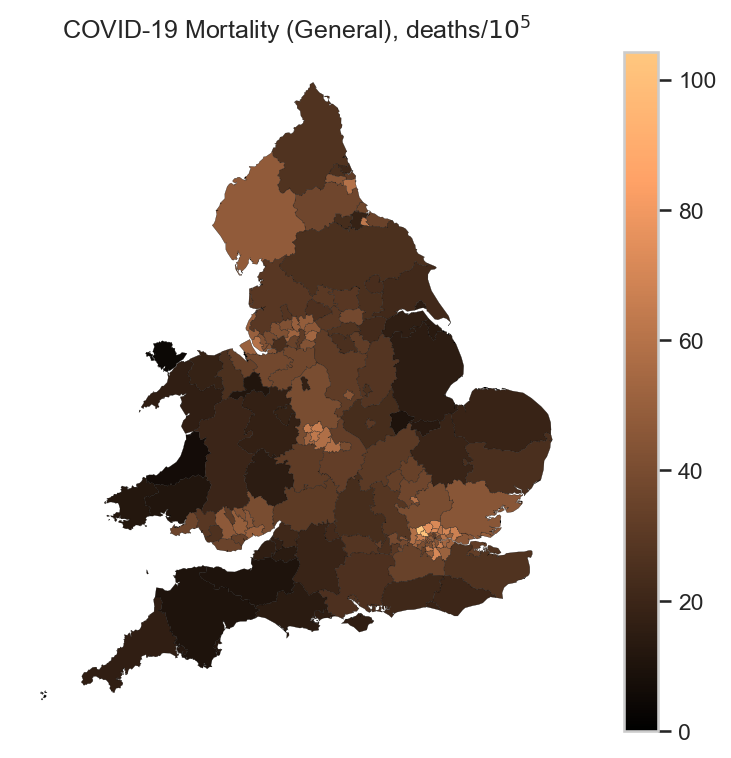

In [7]:
geoplot(uk, 'd_general', title="COVID-19 Mortality (General), deaths/$10^5$", cmap="copper", save="uk-mortality-general.jpg")

0 0
110 110


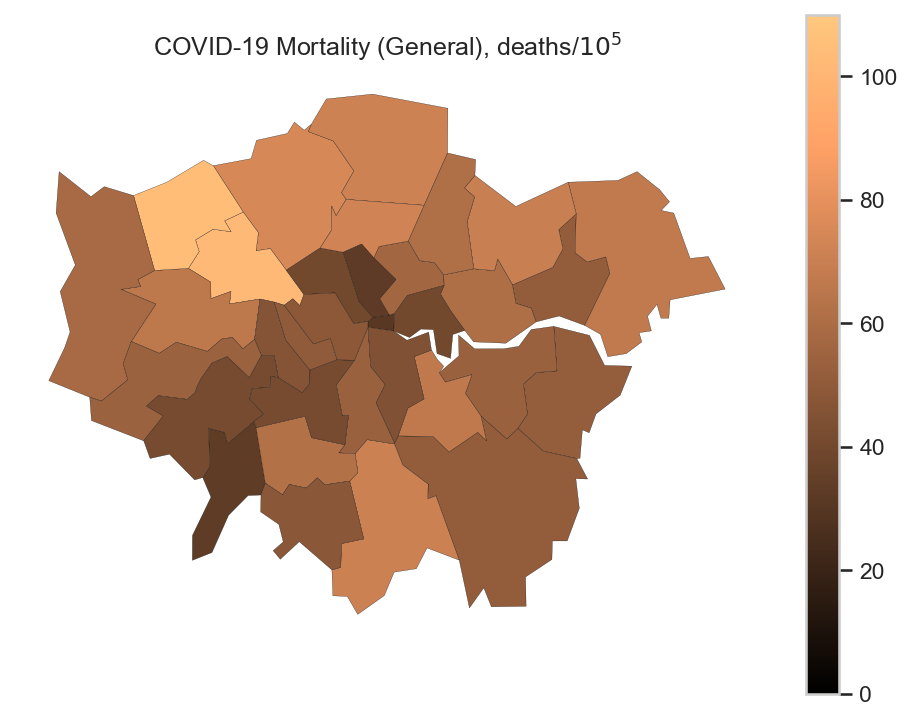

In [8]:
geoplot(london, 'd_general', title="COVID-19 Mortality (General), deaths/$10^5$", cmap="copper", vmin=0, vmax=110,save='London-mortality-general.jpg')


25000.0 10.126631103850338
1581555.0 14.273919098233469


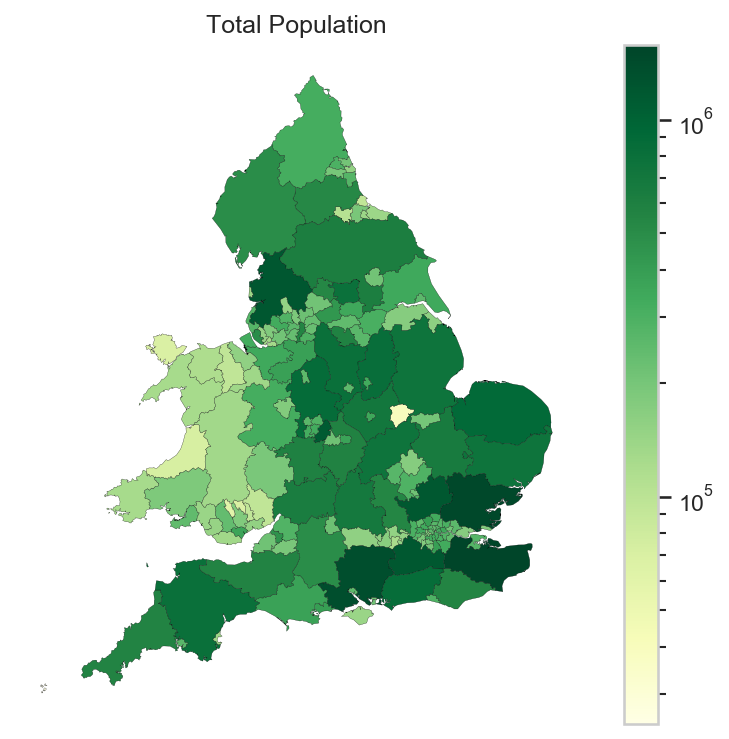

In [9]:
geoplot(uk, 'population', title='Total Population',log=True, vmin=2.5E4, save="uk-demographics-population-total.jpg")

9721.0 9721.0
395869.0 395869.0


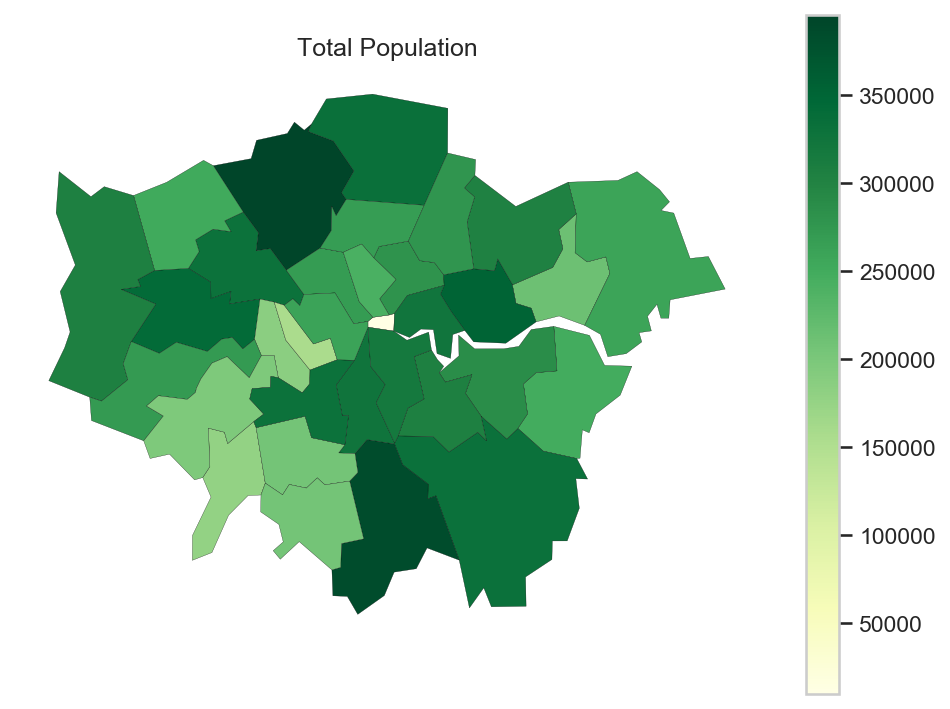

In [10]:
geoplot(london, 'population', title='Total Population',save='London-total-population.jpg')

25.474662651251325 3.237684336675723
16613.57091512826 9.71797516536081


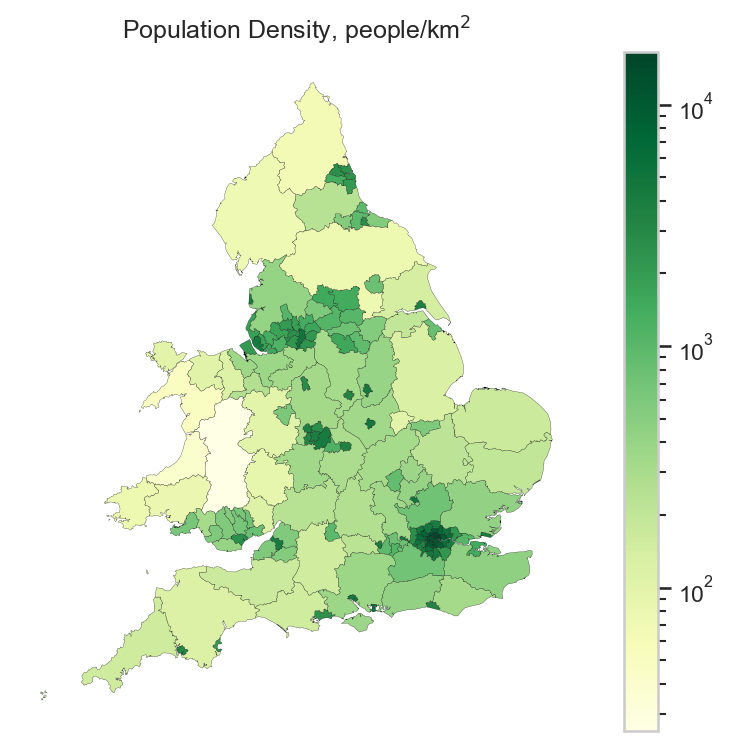

In [11]:
geoplot(uk, "dPOP", title="Population Density, people/km$^2$", log=True,save="uk-population-density.jpg")

2212.6503292600887 2212.6503292600887
16613.57091512826 16613.57091512826


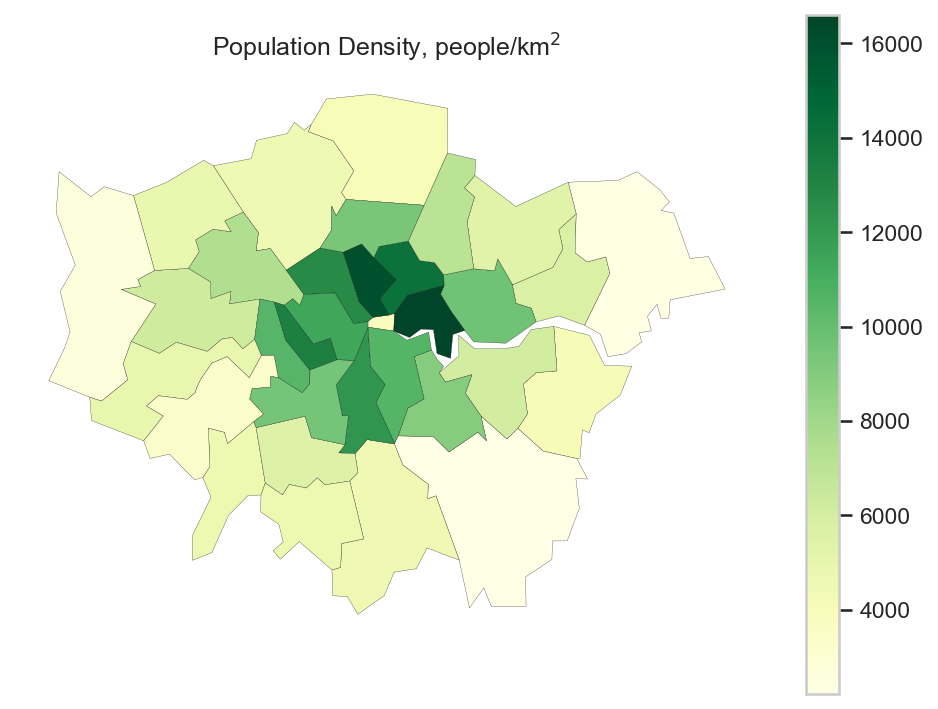

In [12]:
geoplot(london, 'dPOP', title='Population Density, people/km$^2$',save='London-population-density.jpg')

1.9879927676479576 1.9879927676479576
3.478501561284095 3.478501561284095


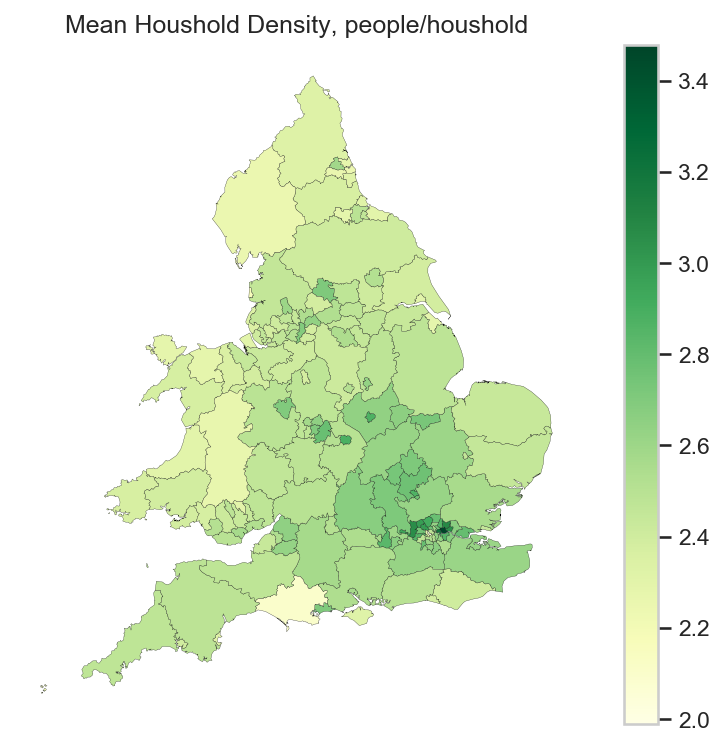

In [13]:
geoplot(uk, "dHHS", title="Mean Houshold Density, people/houshold", save="uk-household-size.jpg")

0.2796762589928057 0.2796762589928057
0.5062150796034846 0.5062150796034846


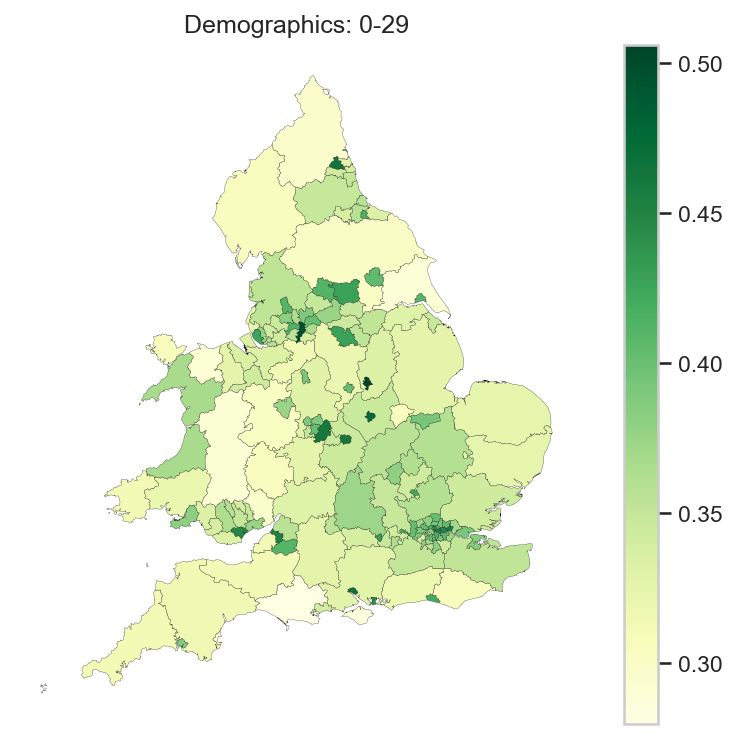

In [14]:
geoplot(uk, '0-29', title='Demographics: 0-29', save="uk-demographics-0-29.jpg")

0.3087282481601211 0.3087282481601211
0.4784006829823563 0.4784006829823563


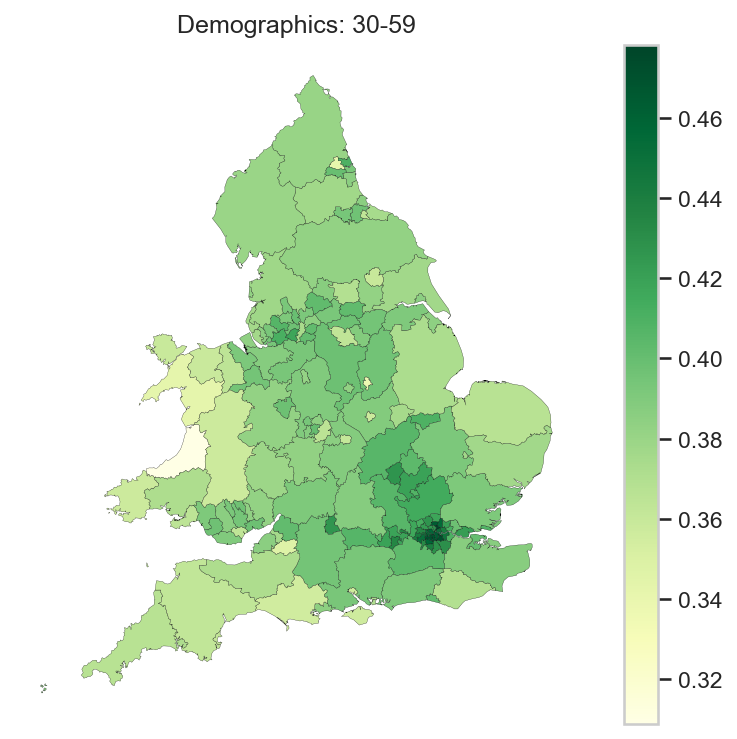

In [15]:
geoplot(uk, '30-59', title='Demographics: 30-59', save="uk-demographics-30-59.jpg")

0.09038476342976798 0.09038476342976798
0.3482885434389762 0.3482885434389762


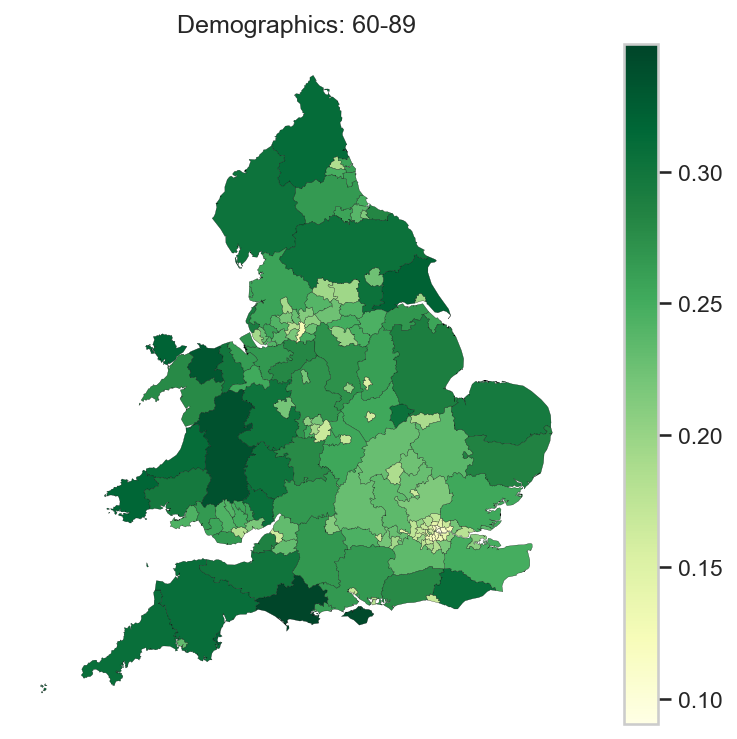

In [16]:
geoplot(uk, '60-89', title='Demographics: 60-89', save="uk-demographics-60-89.jpg")

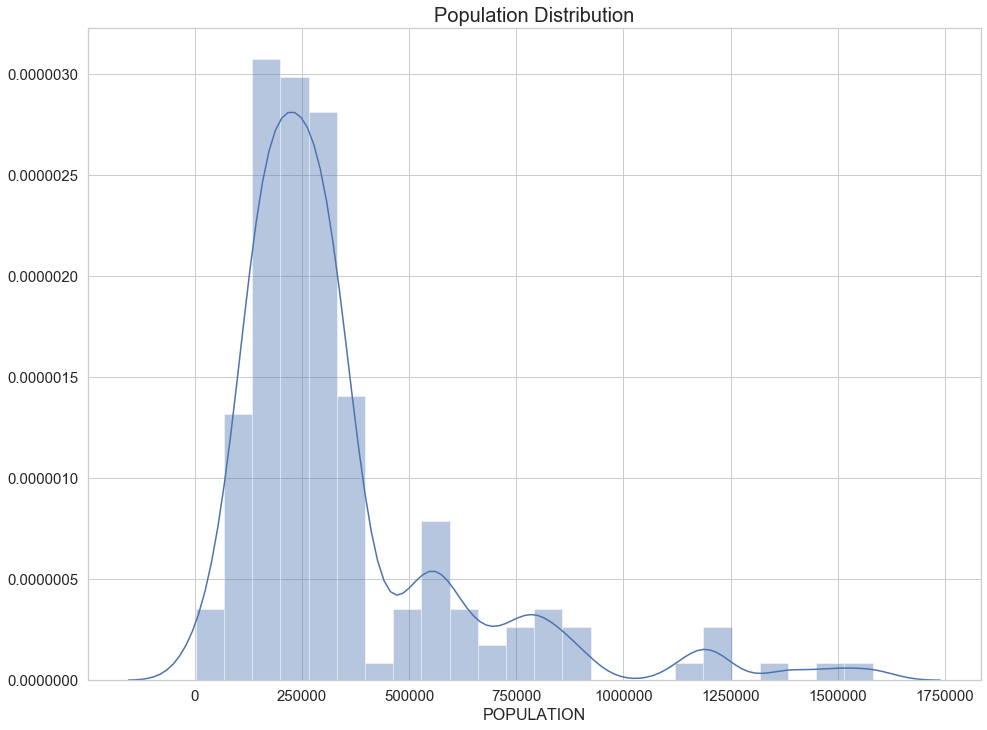

In [17]:

plt.figure(figsize=(16,12))
ax = sns.distplot(uk['population'])
ax.tick_params(labelsize=15)
plt.xlabel('POPULATION',fontsize=16)
ax.set_title("Population Distribution",fontsize=20)
plt.savefig('Population Distribution.jpg',figsize=(16,12), dpi=300)

In [18]:
def corrplot(data, x, y, xlim=None, ylim=None, xlabel=None, ylabel=None, save=None, quantiles=False):
    df = data.copy()
    if quantiles:
        df[x] = df[x].rank(method="average", pct=True)
        df[y] = df[y].rank(method="average", pct=True)
        
    if xlim is None:
        xmin = df[x].min()
        xmax = df[x].max()
        xlim = (xmin,xmax)
    
    if ylim is None:
        ymin = df[y].min()
        ymax = df[y].max()
        ylim = (ymin,ymax)
    
    g = sns.jointplot(x, y, data=df,
                      kind="reg", truncate=False,
                      xlim=xlim, ylim=ylim,
                      height=7, space=1)
    
    if xlabel is not None:
        plt.xlabel(xlabel)
        
    if ylabel is not None:
        plt.ylabel(ylabel)
        
    r, p = stats.pearsonr(data[x],data[y])
    p_str = f'= {p:.5f}' if p >= 1E-5 else "< 0.00001"
    plt.title(f"$r^2 = {r**2:.5f}$, $p {p_str}$", y=1.3, fontsize = 16)
        
    if save is not None:
        plt.savefig(save, figsize=(8,8), dpi=300, bbox_inches="tight")
    else:
        plt.show()

In [19]:
def corrfit(data, X, Y, xlabel=None, ylabel=None, log=(False, False), xlim=None, ylim=None, size=None, save=None):
    df = data.loc[:,[X,Y]]

    if log[0]:
        U = f"log({X})"
        xlabel = f"log: {xlabel}"
        df[U] = df[X].map(np.log)
    else:
        U = X

    if log[1]:
        V = f"log({Y})"
        ylabel = f"log: {ylabel}"
        df[V] = df[Y].map(np.log)
    else:
        V = Y

    r = stats.linregress(df[U], df[V])
    df['fit'] = (r.intercept + r.slope*df[U])
    df['residuals'] = df[V]  - df.fit
    df['scaled_residuals'] = df.residuals/df.fit

    dfBULK = df[df.scaled_residuals.abs() <= 2*df.scaled_residuals.std()]
    dfOUT = df[df.scaled_residuals.abs() > 2*df.scaled_residuals.std()]

    if xlim is None:
        xmin = df[U].min()
        xmax = df[U].max()
        xwidth = xmax - xmin
        xmax = xmax + 0.05*xwidth
        xmin = xmin - 0.05*xwidth
        xlim = (xmin,xmax)

    if ylim is None:
        ymin = df[V].min()
        ymax = df[V].max()
        ywidth = ymax - ymin
        ymax = ymax + 0.05*ywidth
        ymin = ymin - 0.05*ywidth
        ylim = (ymin,ymax)

    #print(size, data.columns)
    if size is not None:
        if size not in df.columns:
            if size not in data.columns:
                size = None
            else:
                df[size] = data[size]
    #print('Size:', size, df[size].min(), df[size].max())
        
    df['Outlier'] = df.scaled_residuals.abs() > 2*df.scaled_residuals.std()

    g0 = sns.jointplot(U, V, data=dfBULK,
                      kind="reg", 
                      marker="o",
                      xlim=xlim, ylim=ylim,
                      scatter=False,
                      height=7)    
    g1 = sns.scatterplot(U, V, data=df, hue="Outlier",
                         size=size, sizes=(25,200),
                         alpha=0.75, 
                         marker="o", edgecolor="k",
                         ax=g0.ax_joint)
    #g2 = sns.scatterplot(U, V, data=dfOUT, size="dPOP",
    #                    color="orange", marker="o", edgecolor="k",
    #                    ax=g0.ax_joint)

    if xlabel is not None:
        plt.xlabel(xlabel)

    if ylabel is not None:
        plt.ylabel(ylabel)

    r, p = stats.pearsonr(dfBULK[U],dfBULK[V])
    p_str = f'= {p:.5f}' if p >= 1E-5 else "< 0.00001"
    plt.title(f"$r^2 = {r**2:.5f}$, $p {p_str}$", pad=-5, fontsize = 12)
    if save is not None:
        plt.savefig(save, figsize=(8,8), dpi=300, bbox_inches="tight")
        plt.show()
    else:
        plt.show()
    
    return stats.linregress(dfBULK[U], dfBULK[V])

In [20]:
u = gpd.read_file("uk_covid.geojson").set_index("code")
d = pd.read_csv('uk_demographics.csv').set_index('code').loc[:,['0-29','30-59','60-89']]
uk = u.join(d)

In [22]:
# eth_df = pd.read_csv('ethnic-population.csv').rename(columns={
#         'local authority: county / unitary (prior to April 2015)': 'name',
#         'Ethnicity': 'ethnicity',
#         'Value': 'value',
#         'Ethnicity_type': 'level'
#     }).drop(columns=['Measure','Value_type','Source','Time','Geography'])
# v = uk.reset_index().set_index('name').code.to_frame()
# eth_df = v.join(eth_df.set_index('name')).dropna().reset_index().set_index(['code','ethnicity']).sort_index()

In [23]:
# ethnicity_df = eth_df[eth_df.level=='ONS 18+1 2011'].value.unstack('ethnicity')
# # w = uk.loc[:,['geometry']].join(v)
# ethnicity_df = ethnicity_df.drop(columns={'White: English/Welsh/Scottish/Northern Irish/British','White: Other White','Other ethnic group: Any other ethnic group','Other ethnic group: Arab', 'White: Gypsy or Irish Traveller','White: Irish','Asian/Asian British: Other Asian','Black/African/Caribbean/Black British: Other Black','Mixed/multiple ethnic groups: Other Mixed','Mixed/multiple ethnic groups: White and Asian','Mixed/multiple ethnic groups: White and Black African','Mixed/multiple ethnic groups: White and Black Caribbean'}).fillna(0)

In [24]:
# ethnicity_df = ethnicity_df.replace(to_replace = 0, value = 1e-3)

In [25]:
# ethnicity_df = ethnicity_df.rename(columns={'Asian/Asian British: Bangladeshi':'Bangladeshi',
#                             'Asian/Asian British: Chinese': 'Chinese',
#                             'Asian/Asian British: Indian':'Indian',
#                             'Asian/Asian British: Pakistani':'Pakistani',
#                             'Black/African/Caribbean/Black British: African':'African',
#                             'Black/African/Caribbean/Black British: Caribbean':'Caribbean'})

In [ ]:
# features = ethnicity_df.columns
# features

In [21]:
def scale(X):
    return (X - X.mean())/X.std()

In [23]:
# datum = ethnicity_df.copy()
# for i in features:
#     datum[f'{i}'] = scale((datum[f'{i}']).map(np.log))

In [24]:
# corr4 = datum.corr()
# plt.figure(figsize=(16,12))
# ax_relative = sns.heatmap(corr4, cmap="RdBu", annot=True, annot_kws={'size': 12},square=True,vmin=-1, vmax=1)
# ax_relative.tick_params(labelsize=15)
# ax_relative.set_title("Z-Normalized Heatmap of Ethnicity",fontsize=20)
# # plt.subplots_adjust(left=0.35,bottom = 0.47)
# plt.savefig('Heatmap_of_Ethnicity_corr2.png',figsize=(24,20), dpi=300)

In [25]:
def scale(X):
    return (X - X.mean())/X.std()

In [165]:
df = uk.loc[:,['population','dPOP','dHHS','1','2','3','4','5','6','7','8','households',"d_general", "0-29", "30-59", "60-89"]].copy()
# df['6+'] = df['6']+df['7']+df['8']
df['logPOP'] = scale(df['population'].map(np.log))
df['dPOP'] = scale((df['dPOP']).map(np.log))
df['dHHS'] = scale(df['dHHS'])
df['0-29'] = scale(df['0-29'])
df['30-59'] = scale(df['30-59'])
df['60-89'] = scale(df['60-89'])
df['d1'] = scale((df['1']/df['households']))
df['d2'] = scale((df['2']/df['households']))
df['d3'] = scale((df['3']/df['households']))
df['d4'] = scale((df['4']/df['households']))
df['d5'] = scale((df['5']/df['households']))
df['d6'] = scale((df['6']/df['households']))
df['d7'] = scale((df['7']/df['households']))
df['d8'] = scale((df['8']/df['households']))
df4 = df.loc[:,['logPOP','dPOP','dHHS','d1','d2','d3','d4','d5','d6','d7','d8',"0-29", "30-59", "60-89"]]

In [166]:
corr1 = df4.corr()
df4.to_csv('Heatmap_of_input_Features.csv')

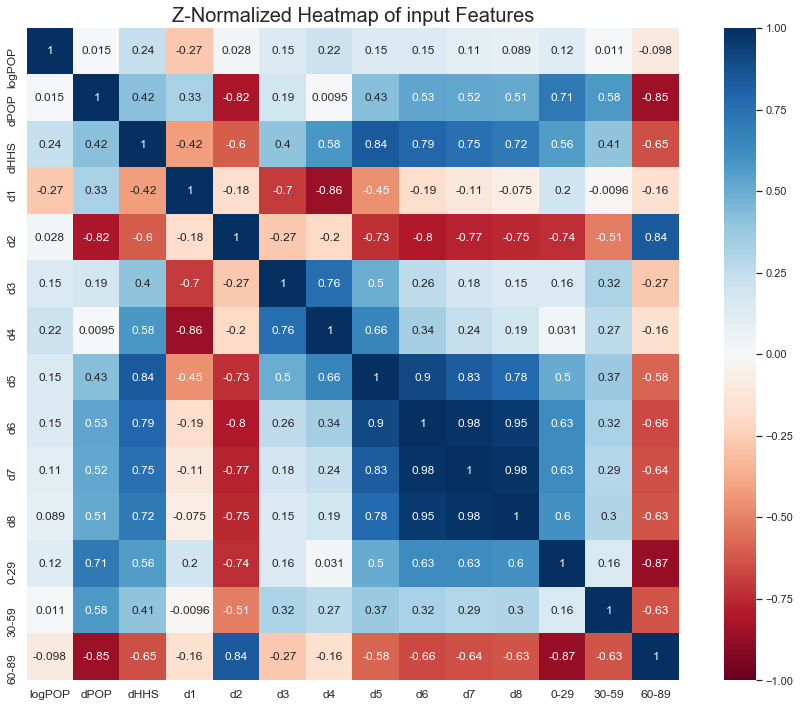

In [28]:
corr1 = df4.corr()
plt.figure(figsize=(16,12))
ax_relative = sns.heatmap(corr1, cmap="RdBu", annot=True, annot_kws={'size': 12},square=True,vmin=-1, vmax=1)
ax_relative.tick_params(labelsize=12)
ax_relative.set_title("Z-Normalized Heatmap of input Features",fontsize=20)
plt.savefig('Heatmap_of_input_Features.png',figsize=(16,12), dpi=300)

In [167]:
df = uk.loc[:,['population','dPOP','dHHS','1','2','3','4','5','6','7','8','households',"d_general", "0-29", "30-59", "60-89"]].copy()
df['6+'] = df['6']+df['7']+df['8']
df['logPOP'] = scale(df['population'].map(np.log))
df['dPOP'] = scale((df['dPOP']).map(np.log))
df['dHHS'] = scale(df['dHHS'])
df['0-29'] = scale(df['0-29'])
df['30-59'] = scale(df['30-59'])
df['60-89'] = scale(df['60-89'])
df['d1'] = scale((df['1']/df['households']))
df['d2'] = scale((df['2']/df['households']))
df['d3'] = scale((df['3']/df['households']))
df['d4-d5'] = scale(((df['4']+df['5'])/df['households']))
# df['d5'] = scale((df['5']/df['households']))
df['d6+'] = scale((df['6+']/df['households']))
df4 = df.loc[:,['logPOP','dPOP','dHHS','d1','d2','d3','d4-d5','d6+',"0-29", "30-59", "60-89"]]

In [168]:
corr1 = df4.corr()
df4.to_csv('Heatmap_of_input_Features_with_H6+_d4-d5.csv')

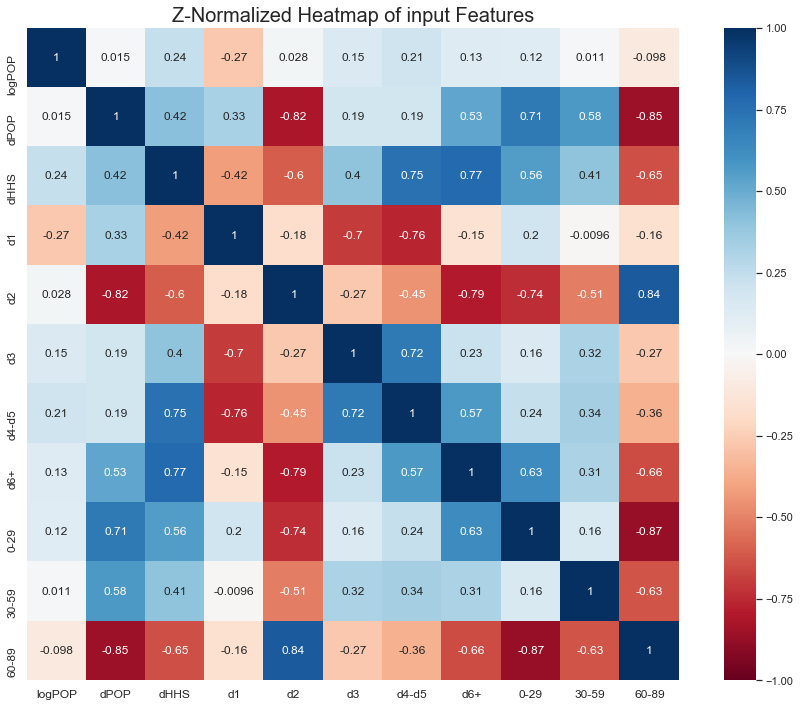

In [31]:
corr1 = df4.corr()
plt.figure(figsize=(16,12))
ax_relative = sns.heatmap(corr1, cmap="RdBu", annot=True, annot_kws={'size': 12},square=True,vmin=-1, vmax=1)
ax_relative.tick_params(labelsize=12)
ax_relative.set_title("Z-Normalized Heatmap of input Features",fontsize=20)
plt.savefig('Heatmap_of_input_Features_with_H6+_d4-d5.png',figsize=(16,12), dpi=300)

Eigenvalues [5.29653591e+00 2.55898368e+00 1.05961921e+00 8.52303813e-01
 5.84499774e-01 2.98561985e-01 8.84545825e-02 1.21430383e-01
 1.39433527e-01 1.77143252e-04 2.18477316e-16]
PCA0:  0.4368993791543381 4.3305373449801545e-23


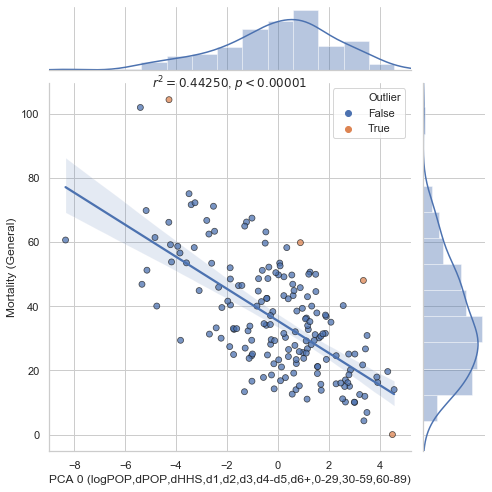

PCA1:  0.00010849386556768 0.891811726163797
PCA2:  0.03783697030793024 0.01033333374665925


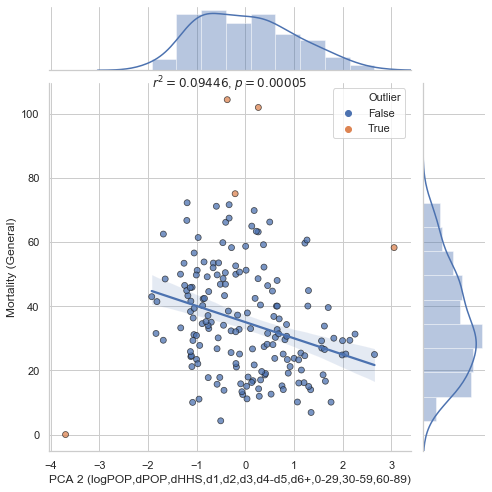

PCA3:  0.014322994857706975 0.11679755148810347


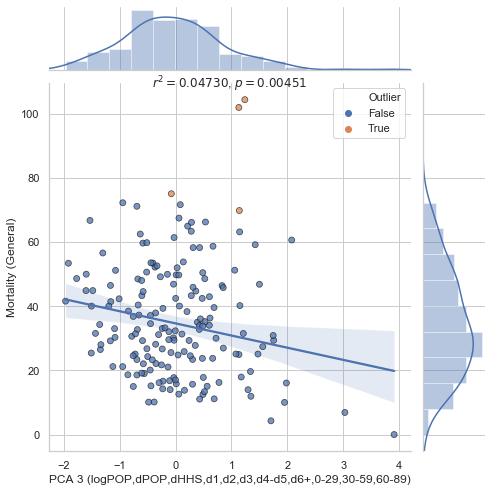

PCA4:  1.6748206104904563e-05 0.9573830369237261
PCA5:  0.14438111776572496 2.5190303200455255e-07


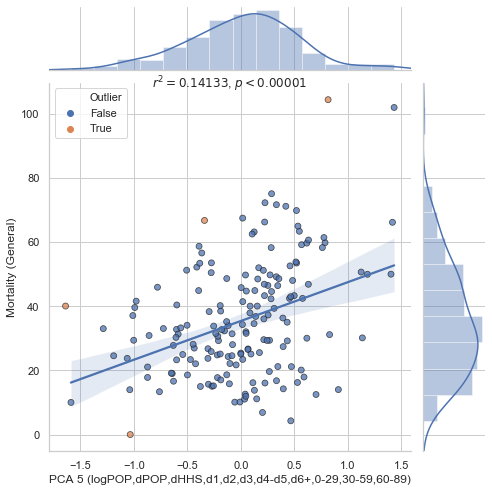

PCA6:  0.013312742677639626 0.13062305586910047


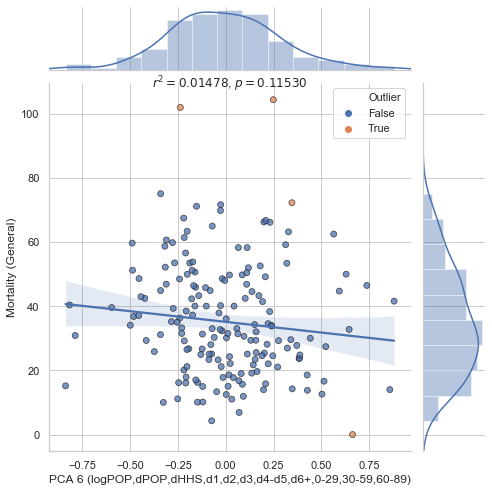

PCA7:  0.00035230647414115953 0.806370961754721
PCA8:  0.00915094892668025 0.21058067230442823
PCA9:  0.0009742326600689121 0.6835217651731395
PCA10:  0.001180426654719245 0.6536071981094653
['PCA0', 'PCA2', 'PCA3', 'PCA5', 'PCA6']


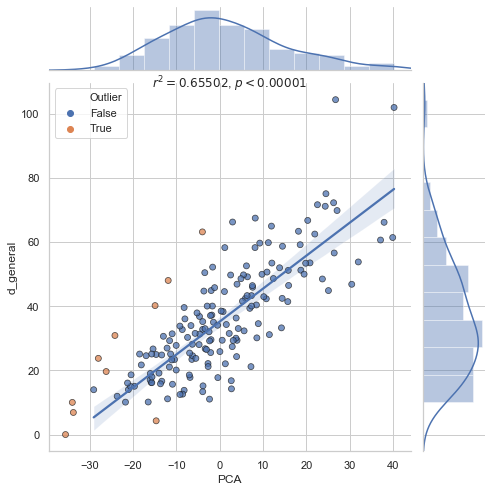

LinregressResult(slope=1.0262130955732562, intercept=35.199545360253005, rvalue=0.8093345558326526, pvalue=4.791784137712988e-39, stderr=0.0586937643826736)


logPOP    2.610508
dPOP      4.348001
dHHS     -1.196484
d1        4.147114
d2       -9.378388
d3        7.531224
d4-d5     0.728409
d6+       2.704017
0-29     -5.979119
30-59     3.440524
60-89     3.205536
dtype: float64

In [32]:
df = uk.loc[:,['population','dPOP','dHHS','1','2','3','4','5','6','7','8','households',"d_general", "0-29", "30-59", "60-89"]].copy()
df['6+'] = df['6']+df['7']+df['8']
df['logPOP'] = scale(df['population'].map(np.log))
df['dPOP'] = scale((df['dPOP']).map(np.log))
df['dHHS'] = scale(df['dHHS'])
df['0-29'] = scale(df['0-29'])
df['30-59'] = scale(df['30-59'])
df['60-89'] = scale(df['60-89'])
df['d1'] = scale((df['1']/df['households']))
df['d2'] = scale((df['2']/df['households']))
df['d3'] = scale((df['3']/df['households']))
df['d4-d5'] = scale(((df['4']+df['5'])/df['households']))
# df['d5'] = scale((df['5']/df['households']))
df['d6+'] = scale((df['6+']/df['households']))

factors = ['logPOP','dPOP','dHHS','d1','d2','d3','d4-d5','d6+',"0-29", "30-59", "60-89"]
C = df.loc[:,factors].corr().to_numpy()
e, v = linalg.eig(C)

print("Eigenvalues", e)
results = {}
results['components'] = factors
results['eigenvalues'] = e

components = []
p_values=[]
r_values=[]
for i in range(len(e)):
    df[f'PCA{i}'] = (df.loc[:,factors]*v[:,i]).sum(axis=1)    
    r, p = stats.pearsonr(df[f'PCA{i}'],df["d_general"])
    p_values.append(p)
    r_values.append(np.square(np.abs(r)))
    print(f"PCA{i}: ", np.square(np.abs(r)), p)
    if p < 0.1 or np.square(np.abs(r)) > 0.01:    
        regress = corrfit(df, X=f'PCA{i}', Y="d_general", 
                        xlabel=f"PCA {i} ({','.join(factors)})", ylabel="Mortality (General)", 
                        log=(False, False), save=f"new_Mortality(General)_vs_PCA{i}_corr_plot.jpg")
        results[f'PCA{i}'] = {
            'eigenvector': v[:,i],
            'fit': regress
        }
        components.append(f'PCA{i}')

print(components)
df['PCA'] = 0
weights = np.zeros_like(results['PCA0']['eigenvector'])
for pca in components:
    df['PCA'] += results[pca]['fit'].slope*df[pca]
    weights += results[pca]['fit'].slope*results[pca]['eigenvector']
r = corrfit(df,'PCA','d_general')
df["PCR"] = r.intercept + r.slope*df["PCA"]
print(r)
data = df.copy()
pd.Series(weights, index=results['components'])

In [33]:
components

['PCA0', 'PCA2', 'PCA3', 'PCA5', 'PCA6']

In [34]:
#checking
x=0
for i in range(0,11):
    x=0
    for j in v[i]:
        x=x+np.square(j)
    print(x)

0.9999999999999998
0.9999999999999987
1.0000000000000002
0.9999999999999996
0.9999999999999996
0.9999999999999953
1.0000000000000069
0.9999999999999979
1.000000000000001
1.0000000000000009
1.0000000000000004


In [35]:
vector_df = pd.DataFrame(v)

In [36]:
vector_df.to_csv('Heatmap_PCA_coefficients_with_d4-d5.csv')

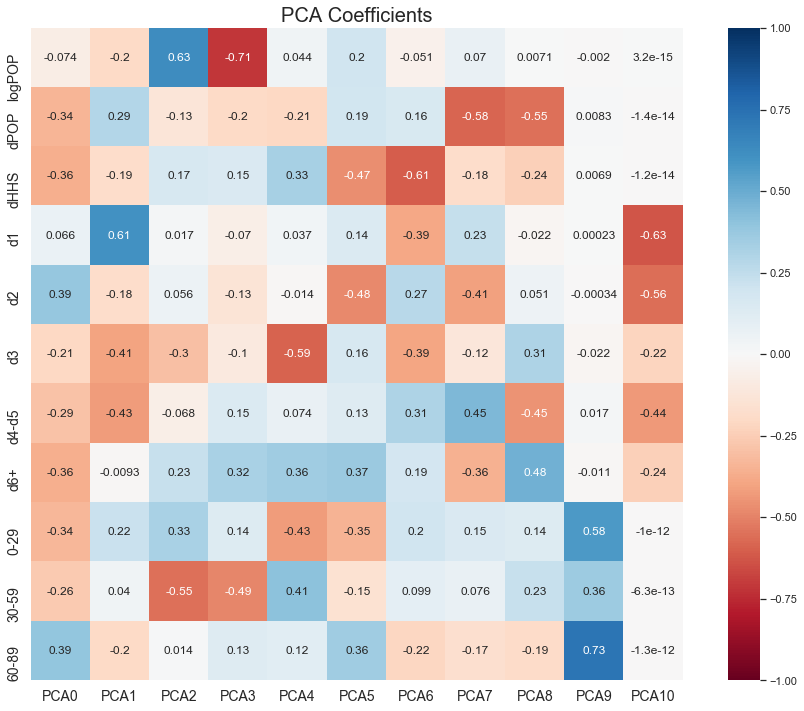

In [37]:
plt.figure(figsize=(16,12))
ax = sns.heatmap(vector_df, cmap="RdBu",yticklabels=['logPOP','dPOP','dHHS','d1','d2','d3','d4-d5','d6+',"0-29", "30-59", "60-89"],xticklabels=['PCA0','PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7','PCA8','PCA9','PCA10'] ,annot=True, annot_kws={'size': 12},square=True,vmin=-1, vmax=1)
ax.tick_params(labelsize=14)
ax.set_title("PCA Coefficients",fontsize=20)
plt.savefig('Vector1_with_d4-d5.png',figsize=(16,12), dpi=300)

In [317]:
p_values

[4.3305373449801545e-23,
 0.891811726163797,
 0.01033333374665925,
 0.11679755148810347,
 0.9573830369237261,
 2.5190303200455255e-07,
 0.13062305586910047,
 0.806370961754721,
 0.21058067230442823,
 0.6835217651731395,
 0.6536071981094653]

In [318]:
r_values

[0.4368993791543381,
 0.00010849386556768,
 0.03783697030793024,
 0.014322994857706975,
 1.6748206104904563e-05,
 0.14438111776572496,
 0.013312742677639626,
 0.00035230647414115953,
 0.00915094892668025,
 0.0009742326600689121,
 0.001180426654719245]

In [38]:
p_plot = pd.DataFrame(p_values)
p_plot['Principle Components'] = ['PCA0','PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7', 'PCA8', 'PCA9', 'PCA10']
p_plot = p_plot.rename(columns={0:'p_value'})

In [39]:
p_plot.to_csv("p_values_with_d4-d5.csv")

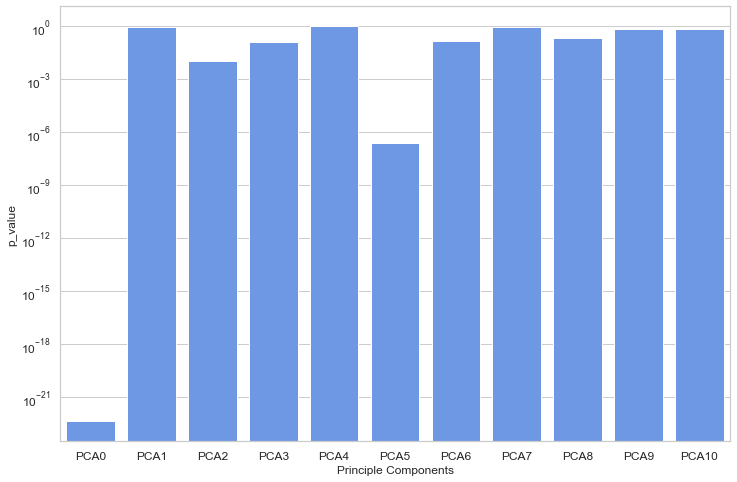

In [40]:
sns.set(style="whitegrid")
plt.figure(figsize=(12,8))
ax=sns.barplot(x='Principle Components',y='p_value',color="cornflowerblue",saturation=.85, data=p_plot, dodge=False)
ax.tick_params(labelsize=12)
plt.yscale("log")
plt.savefig('p_values_d4-d5.jpg')

In [41]:
r2_plot = pd.DataFrame(r_values)
r2_plot['Principle Components'] = ['PCA0','PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7', 'PCA8', 'PCA9', 'PCA10']
r2_plot= r2_plot.rename(columns={0:'r2_value'})

In [42]:
r2_plot.to_csv("r2_values_with_d4-d5.csv")

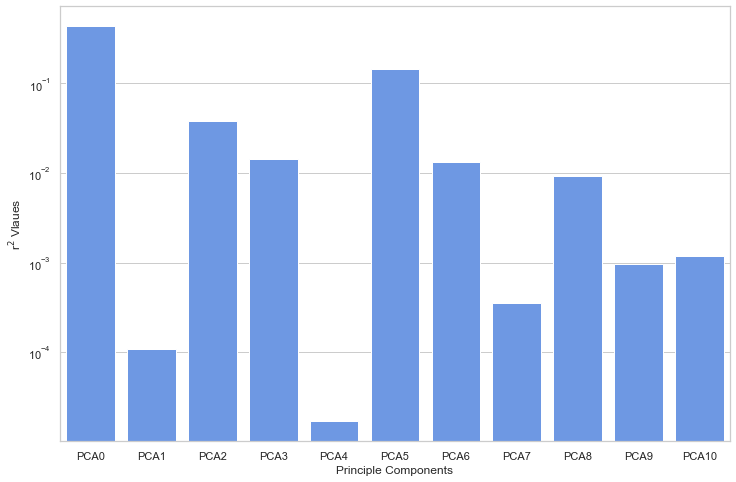

In [43]:
sns.set(style="whitegrid")
plt.figure(figsize=(12,8))
sns.barplot(x='Principle Components',y='r2_value',color="cornflowerblue",saturation=.85, data=r2_plot, dodge=False)
plt.yscale("log")
plt.ylabel('r$^2$ Vlaues')
# plt.ylable(f"$r^2 values")
plt.savefig('r2_values_with_d4-d5.jpg')

In [44]:
components

['PCA0', 'PCA2', 'PCA3', 'PCA5', 'PCA6']

In [45]:
df = data
df["error"] = (df["d_general"] - df["PCR"])
df["perror"] = (df["error"]/df["PCR"]).round(3)*100
df.loc[:,["population","PCA","PCR","d_general","error","perror"]].sort_values("perror")

,population,PCA,PCR,d_general,error,perror
code,,,,,,
E06000053,2224.0,-35.591627,-1.325048,0.000000,1.325048,-100.0
W06000001,70043.0,-14.665657,20.149456,4.283083,-15.866373,-78.7
W06000006,135957.0,-2.350737,32.787189,11.032900,-21.754289,-66.3
E06000010,259778.0,2.707466,37.977983,14.242931,-23.735052,-62.5
E06000031,202259.0,-3.925853,31.170784,13.349221,-17.821563,-57.2
...,...,...,...,...,...,...
E06000022,193282.0,-29.084269,5.352887,13.969226,8.616339,161.0
E09000001,9721.0,-24.181369,10.384308,30.861023,20.476715,197.2
E06000014,210618.0,-28.012079,6.453183,23.739661,17.286478,267.9


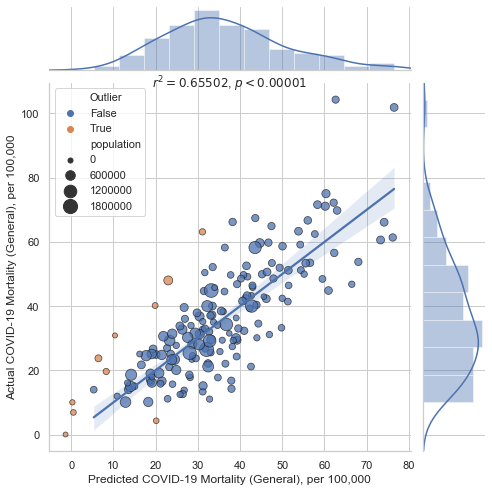

LinregressResult(slope=1.0000000000000002, intercept=-7.105427357601002e-15, rvalue=0.8093345558326526, pvalue=4.791784137712988e-39, stderr=0.057194518990119195)

In [46]:
corrfit(df, X="PCR", Y="d_general",
        xlabel="Predicted COVID-19 Mortality (General), per 100,000",
        ylabel="Actual COVID-19 Mortality (General), per 100,000",
        log=(False,False), size="population", save="PCR_with_d4-d5.jpg")

In [47]:
df.to_csv("PrincipleComponentAanlysis_with_d4-d5.csv")

In [48]:
pca_geo_plot_df = uk.join(df.loc[:,components])

In [49]:
pca_geo_plot_df.to_csv('PCA_geoplot_with_d4-d5.csv')

-8.341492956109072 -8.341492956109072
4.5664830264274325 4.5664830264274325


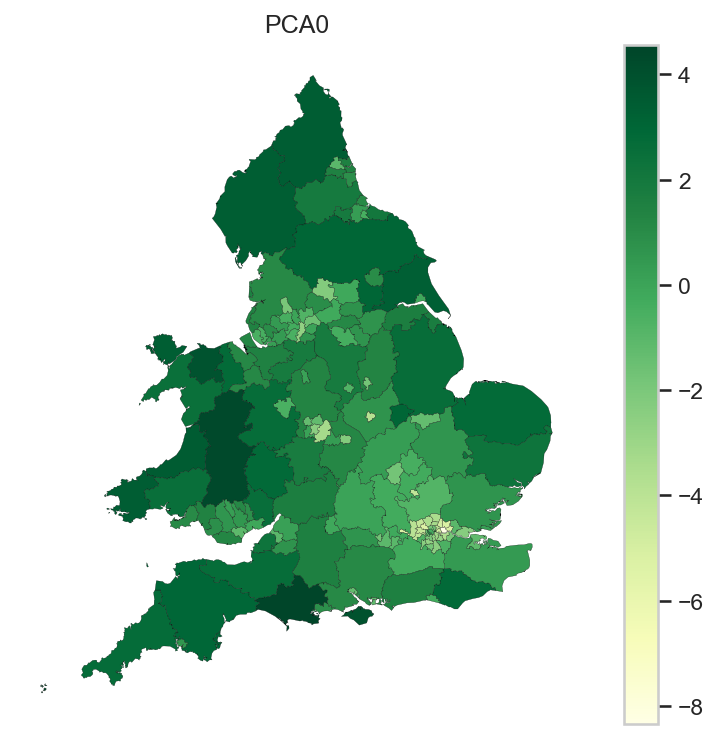

In [50]:
geoplot(pca_geo_plot_df, 'PCA0', title='PCA0', save="PCA0_geoplot_with_d4-d5.jpg")

-3.6948182164553067 -3.6948182164553067
3.0564226093594073 3.0564226093594073


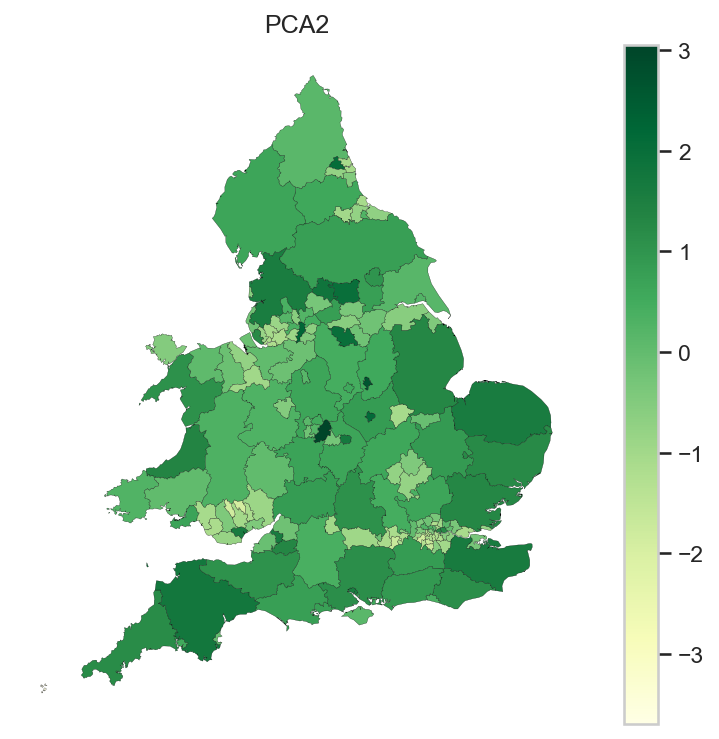

In [51]:
geoplot(pca_geo_plot_df, 'PCA2', title='PCA2', save="PCA2_geoplot_with_d4-d5.jpg")

-1.9666260473154882 -1.9666260473154882
3.9093563785190066 3.9093563785190066


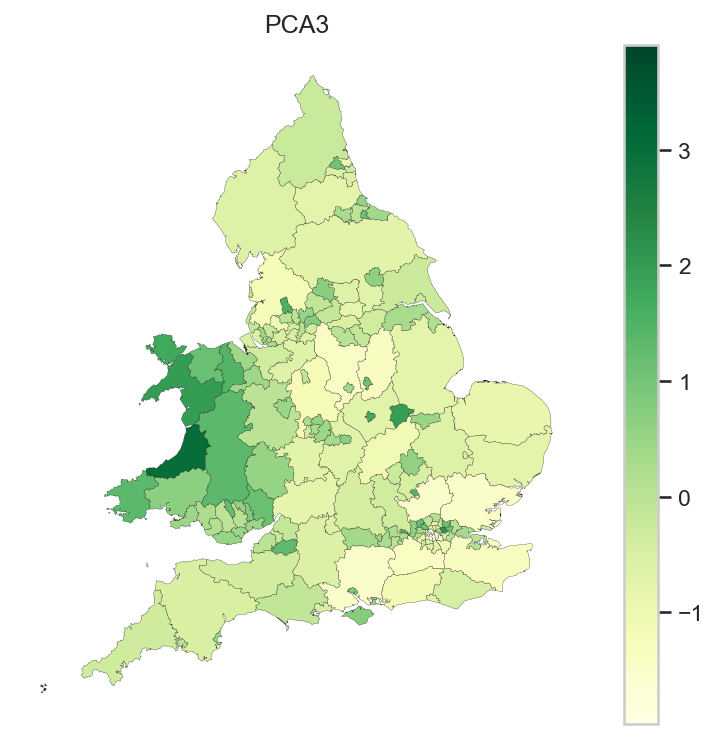

In [52]:
geoplot(pca_geo_plot_df, 'PCA3', title='PCA3', save="PCA3_geoplot_with_d4-d5.jpg")

-1.6396855138850464 -1.6396855138850464
1.4337982252243022 1.4337982252243022


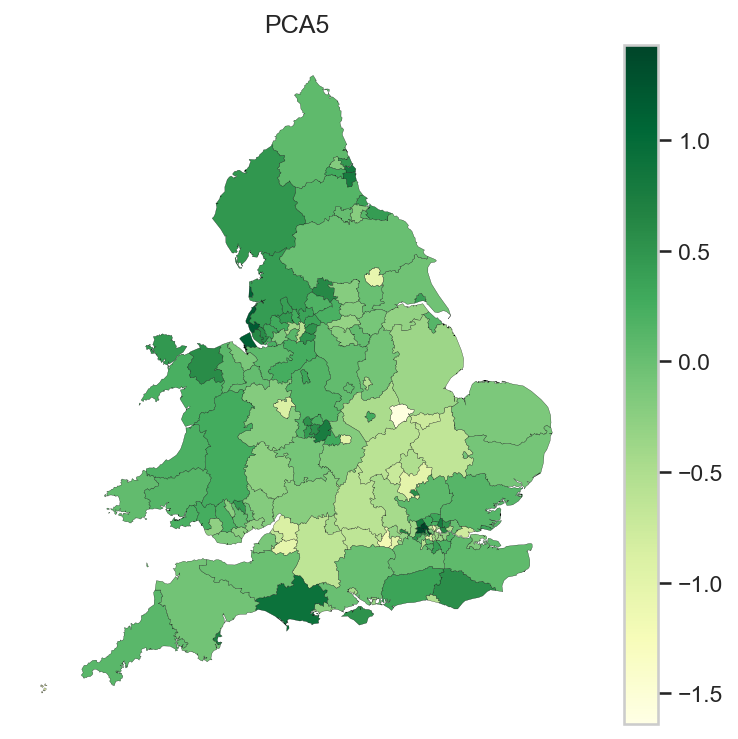

In [53]:
geoplot(pca_geo_plot_df, 'PCA5', title='PCA5', save="PCA5_geoplot_withd4-d5.jpg")

-0.8382833719453432 -0.8382833719453432
0.8811189508012989 0.8811189508012989


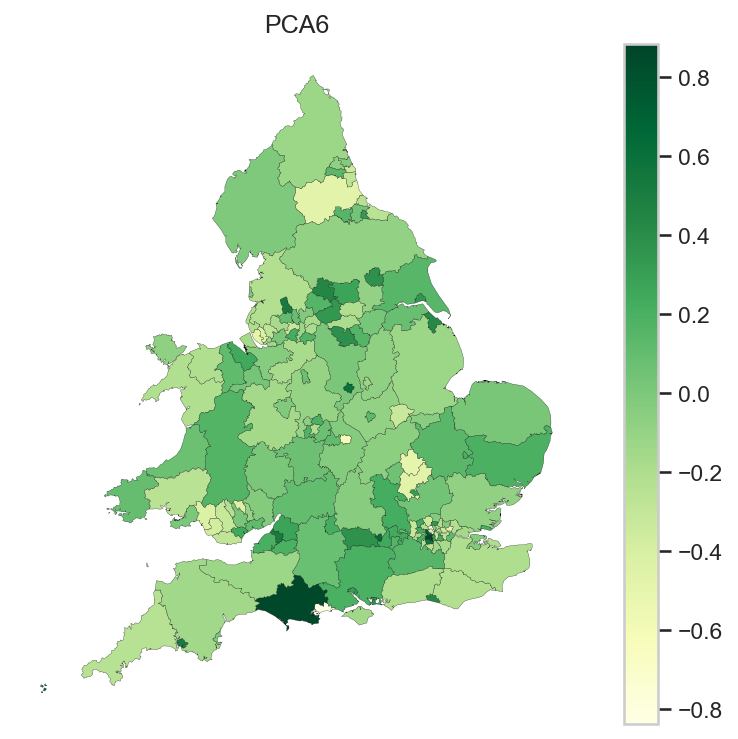

In [54]:
geoplot(pca_geo_plot_df, 'PCA6', title='PCA6', save="PCA6_geoplot_with_d4-d5.jpg")

In [55]:
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [56]:
X = df.loc[:,components]
X_train = X.to_numpy()
y = df['d_general']

In [57]:
regressor = LinearRegression()  
regressor.fit(X_train, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [58]:
y_pred = regressor.predict(X_train)
pred_plot = pd.DataFrame({'Actual': y, 'Predicted': y_pred})
pred_plot

,Actual,Predicted
code,,
E06000001,36.300353,38.925982
E06000002,63.129522,34.082458
E06000003,34.998177,33.835164
E06000004,17.735168,34.062857
E06000005,23.407582,27.975932
...,...,...
W06000020,45.763668,34.045161
W06000021,40.173380,20.810643
W06000022,50.427991,32.399131


In [59]:
pred_plot1 = df.join(pred_plot)

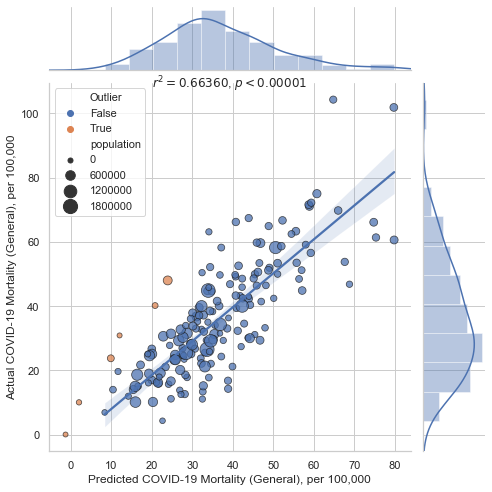

LinregressResult(slope=1.05692466982311, intercept=-2.6078002072386113, rvalue=0.8146143982466426, pvalue=7.018730155466927e-41, stderr=0.058584153311162034)

In [60]:
corrfit(pred_plot1, X="Predicted", Y="Actual",
        xlabel="Predicted COVID-19 Mortality (General), per 100,000",
        ylabel="Actual COVID-19 Mortality (General), per 100,000",
        log=(False,False), size="population" ,save= 'Linear_Regression_5PCA_with_d4-d5.jpg')

In [61]:
pred_plot1.to_csv('MLR_with_PCA_with_d4-d5.csv')

In [62]:
mlr_w = pd.DataFrame(regressor.coef_)
mlr_w['PCs'] = components
mlr_w = mlr_w.rename(columns={0:'weights'})
mlr_w['std_err'] = [1.260,2.817,3.141,5.307,9.750]
mlr_w

,weights,PCs,std_err
0,-5.145855,PCA0,1.260
1,-3.385681,PCA2,2.817
2,-2.322643,PCA3,3.141
3,12.459504,PCA5,5.307
4,-6.950826,PCA6,9.750


In [63]:
mlr_w.to_csv("MLR_weights_with_d4-d5.csv")

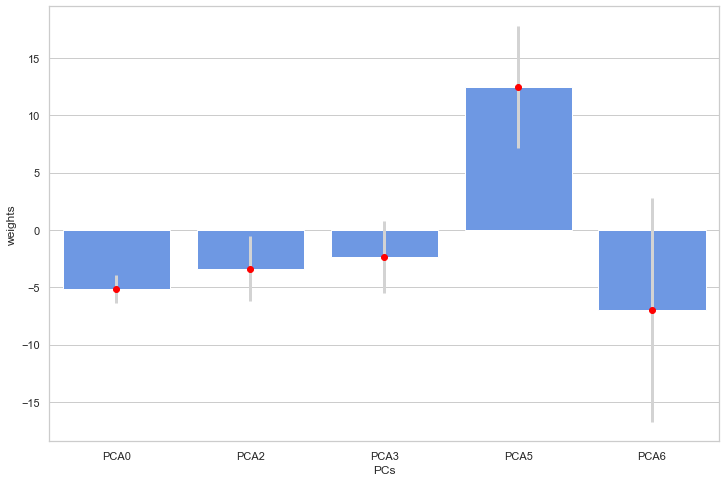

In [64]:
sns.set(style="whitegrid")
coef=regressor.coef_
std_err = [1.260,2.817,3.141,5.307,9.750]
ax=plt.figure(figsize=(12,8))
ax=plt.errorbar(components, coef, yerr=std_err, fmt='o', color='red',
             ecolor='lightgray', elinewidth=3, capsize=0);
ax=sns.barplot(x='PCs',y='weights',color="cornflowerblue",saturation=.85, data=mlr_w, dodge=False)
plt.savefig('mlr_error_weights_with_d4-d5.jpg')

In [368]:
# features = ethnicity_df.columns
# features

Index(['Bangladeshi', 'Chinese', 'Indian', 'Pakistani', 'African',
       'Caribbean'],
      dtype='object', name='ethnicity')

In [346]:
# uk_eth = uk.join(ethnicity_df).fillna(0)
# uk_eth = uk_eth.replace(to_replace = 0, value = 1e-3)

In [371]:
# ethnicity = uk_eth.copy()
# for i in features:
#     ethnicity[f'{i}'] = scale((ethnicity[f'{i}']).map(np.log))

In [372]:
# ethnicity['residuals']  = pred_plot['Actual'] - pred_plot['Predicted']

In [65]:
# df = ethnicity.loc[:,['Bangladeshi', 'Chinese', 'Indian', 'Pakistani', 'African','Caribbean','residuals']].copy()
# factors = ['Bangladeshi', 'Chinese', 'Indian', 'Pakistani', 'African','Caribbean']
# C = df.loc[:,factors].corr().to_numpy()
# e, v = linalg.eig(C)

# print("Eigenvalues", e)
# results = {}
# results['components'] = factors
# results['eigenvalues'] = e

# components = []
# p_values=[]
# r_values=[]
# for i in range(len(e)):
#     df[f'PCA{i}'] = (df.loc[:,factors]*v[:,i]).sum(axis=1)    
#     r, p = stats.pearsonr(df[f'PCA{i}'],df["residuals"])
#     p_values.append(p)
#     r_values.append(np.square(np.abs(r)))
#     print(f"PCA{i}: ", np.square(np.abs(r)), p)
#     if p < 0.1 or np.square(np.abs(r)) > 0.01:    
#         regress = corrfit(df, X=f'PCA{i}', Y="residuals", 
#                         xlabel=f"PCA {i} ({','.join(factors)})", ylabel="Residuals", 
#                         log=(False, False), save=f"Residuals_vs_PCA{i}.jpg")
#         results[f'PCA{i}'] = {
#             'eigenvector': v[:,i],
#             'fit': regress
#         }
#         components.append(f'PCA{i}')

# print(components)
# df['PCA'] = 0
# weights = np.zeros_like(results['PCA1']['eigenvector'])
# for pca in components:
#     df['PCA'] += results[pca]['fit'].slope*df[pca]
#     weights += results[pca]['fit'].slope*results[pca]['eigenvector']
# r = corrfit(df,'PCA','residuals')
# df["PCR"] = r.intercept + r.slope*df["PCA"]
# print(r)
# data = df.copy()
# pd.Series(weights, index=results['components'])

In [376]:
# components

['PCA1']

In [377]:
# df = data
# df["error"] = (df["residuals"] - df["PCR"])
# df["perror"] = (df["error"]/df["PCR"]).round(3)*100

In [66]:
# corrfit(df, X="PCR", Y="residuals",
#         xlabel="Predicted Residuals",
#         ylabel="Actual Residuals",
#         save="PCR_Resudial2.jpg")

In [379]:
# p_plot = pd.DataFrame(p_values)
# p_plot['Principle Components'] = ['PCA0','PCA1','PCA2','PCA3','PCA4','PCA5']
# p_plot = p_plot.rename(columns={0:'p_value'})

In [67]:
# sns.set(style="whitegrid")
# plt.figure(figsize=(12,8))
# ax=sns.barplot(x='Principle Components',y='p_value',color="cornflowerblue",saturation=.85, data=p_plot, dodge=False)
# ax.tick_params(labelsize=12)
# plt.yscale("log")
# plt.savefig('Residual_p_values2.jpg')

In [381]:
# r2_plot = pd.DataFrame(r_values)
# r2_plot['Principle Components'] = ['PCA0','PCA1','PCA2','PCA3','PCA4','PCA5']
# r2_plot= r2_plot.rename(columns={0:'r2_value'})

In [68]:
# sns.set(style="whitegrid")
# plt.figure(figsize=(12,8))
# sns.barplot(x='Principle Components',y='r2_value',color="cornflowerblue",saturation=.85, data=r2_plot, dodge=False)
# plt.yscale("log")
# plt.ylabel('r$^2$ Vlaues')
# # plt.ylable(f"$r^2 values")
# plt.savefig('Residual_r2_values2.jpg')

In [383]:
# X2 = df.loc[:,components]
# X_train2 = X2.to_numpy()
# y2 = df['residuals']

In [384]:
# regressor2 = LinearRegression()  
# regressor2.fit(X_train2, y2)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [69]:
# y_pred2 = regressor2.predict(X_train2)
# pred_plot2 = pd.DataFrame({'Actual': y2, 'Predicted': y_pred2})
# pred_plot2

In [70]:
# corrfit(pred_plot2, X="Predicted", Y="Actual",
#         xlabel="Predicted Residuals",
#         ylabel="Actual Residuals",
#         save= 'Linear_Regression_1PCA_residuals.jpg')

In [72]:
import statsmodels.api as sm

mod = sm.OLS(y,X_train)

fii = mod.fit()
print(fii.summary())
p_values = fii.summary2().tables[1]['P>|t|']

                                 OLS Regression Results                                
Dep. Variable:              d_general   R-squared (uncentered):                   0.128
Model:                            OLS   Adj. R-squared (uncentered):              0.102
Method:                 Least Squares   F-statistic:                              4.939
Date:                Thu, 10 Sep 2020   Prob (F-statistic):                    0.000304
Time:                        22:17:40   Log-Likelihood:                         -872.37
No. Observations:                 173   AIC:                                      1755.
Df Residuals:                     168   BIC:                                      1771.
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [85]:
inv_vector = np.linalg.inv(v)
sq_inv_vector = np.square(inv_vector)
weights = [-5.14585515,0,-3.38568126,-2.32264324,0,12.45950385,-6.95082579,0,0,0,0]
err_weights = [-3.55825514844714,0,4.549807737185041,7.54323776461819,0,40.62375285486519,88.11167420668377,0,0,0,0]
err_coefficients  = np.matmul(sq_inv_vector, err_weights)
coefficients = np.matmul(inv_vector, weights)
error = np.sqrt(err_coefficients)
reconstructed_df = pd.DataFrame()
reconstructed_df['weights'] = coefficients
reconstructed_df['features'] = factors
reconstructed_df['err_weights'] = err_weights
reconstructed_df['err_coefficients'] = err_coefficients
reconstructed_df['error'] = error

In [86]:
reconstructed_df.to_csv('Feature_and_weights_d4-d5.csv')

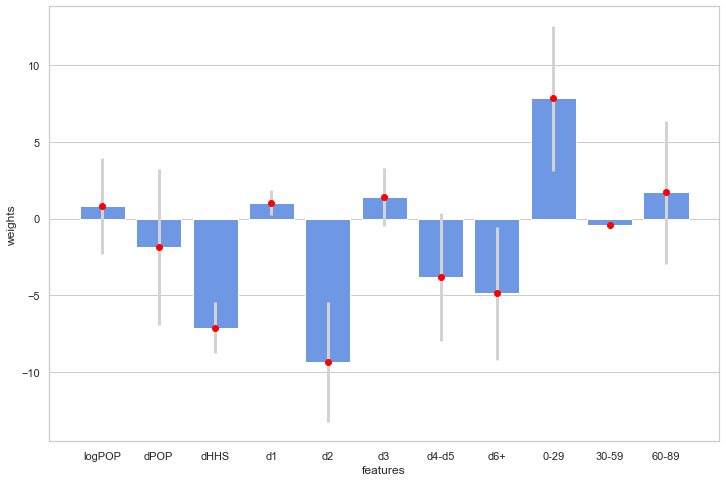

In [87]:
# sns.set(style="whitegrid")
ax = plt.figure(figsize=(12,8))
ax=sns.barplot(x='features',y='weights',color="cornflowerblue",saturation=.85, data=reconstructed_df, dodge=False)
ax=plt.errorbar(reconstructed_df['features'],reconstructed_df['weights'], yerr=error, fmt='o', color='red',
             ecolor='lightgray', elinewidth=3, capsize=0)
# plt.yscale("log")
plt.savefig('Feature_Weights_with_error_d4-d5.jpg')

In [88]:
from keras.models import Sequential
from keras.layers import Dense
from keras import regularizers

In [109]:
# X = df.loc[:,'PCA0':'PCA13']
# X = df.loc[:,components_restricted]
X = df.loc[:,components]
# X = df.loc[:,['PCA0', 'PCA2', 'PCA5', 'PCA6', 'PCA7', 'PCA8', 'PCA12']]

In [110]:
y = df['d_general']
# y = uk['d_restricted']

In [111]:
X_train = X.to_numpy()

In [112]:
X_train.shape

(173, 5)

In [113]:
model = Sequential()
model.add(Dense(5,activation='sigmoid',kernel_regularizer=regularizers.l2(l=0.025)))
model.add(Dense(3,kernel_regularizer=regularizers.l2(l=0.025)))
model.add(Dense(1))
model.compile(optimizer='adam',loss='mse')
model.fit(x=X_train,y=y.values,epochs=100000)

Epoch 1/100000
173/173 [==============================] - 0s 663us/step - loss: 1548.6326
Epoch 2/100000
173/173 [==============================] - 0s 46us/step - loss: 1544.3935
Epoch 3/100000
173/173 [==============================] - 0s 52us/step - loss: 1540.0537
Epoch 4/100000
173/173 [==============================] - 0s 46us/step - loss: 1535.6658
Epoch 5/100000
173/173 [==============================] - 0s 52us/step - loss: 1531.1216
Epoch 6/100000
173/173 [==============================] - 0s 46us/step - loss: 1526.5726
Epoch 7/100000
173/173 [==============================] - 0s 63us/step - loss: 1522.0208
Epoch 8/100000
173/173 [==============================] - 0s 58us/step - loss: 1517.3050
Epoch 9/100000
173/173 [==============================] - 0s 58us/step - loss: 1512.6868
Epoch 10/100000
173/173 [==============================] - 0s 52us/step - loss: 1507.8327
Epoch 11/100000
173/173 [==============================] - 0s 52us/step - loss: 1503.1262
Epoch 12/100000
17

173/173 [==============================] - 0s 58us/step - loss: 741.4019
Epoch 93/100000
173/173 [==============================] - 0s 58us/step - loss: 729.4305
Epoch 94/100000
173/173 [==============================] - 0s 58us/step - loss: 718.0727
Epoch 95/100000
173/173 [==============================] - 0s 46us/step - loss: 706.2137
Epoch 96/100000
173/173 [==============================] - 0s 52us/step - loss: 694.6529
Epoch 97/100000
173/173 [==============================] - 0s 46us/step - loss: 683.2315
Epoch 98/100000
173/173 [==============================] - 0s 52us/step - loss: 671.8584
Epoch 99/100000
173/173 [==============================] - 0s 46us/step - loss: 660.7607
Epoch 100/100000
173/173 [==============================] - 0s 52us/step - loss: 649.9623
Epoch 101/100000
173/173 [==============================] - 0s 63us/step - loss: 638.9909
Epoch 102/100000
173/173 [==============================] - 0s 63us/step - loss: 628.1957
Epoch 103/100000
173/173 [========

173/173 [==============================] - 0s 63us/step - loss: 190.9640
Epoch 184/100000
173/173 [==============================] - 0s 46us/step - loss: 189.6831
Epoch 185/100000
173/173 [==============================] - 0s 63us/step - loss: 188.4949
Epoch 186/100000
173/173 [==============================] - 0s 58us/step - loss: 187.3388
Epoch 187/100000
173/173 [==============================] - 0s 52us/step - loss: 186.1197
Epoch 188/100000
173/173 [==============================] - 0s 52us/step - loss: 185.0635
Epoch 189/100000
173/173 [==============================] - 0s 63us/step - loss: 184.0475
Epoch 190/100000
173/173 [==============================] - 0s 58us/step - loss: 183.0231
Epoch 191/100000
173/173 [==============================] - 0s 52us/step - loss: 182.1383
Epoch 192/100000
173/173 [==============================] - 0s 63us/step - loss: 181.1447
Epoch 193/100000
173/173 [==============================] - 0s 52us/step - loss: 180.3551
Epoch 194/100000
173/173 [=

173/173 [==============================] - 0s 75us/step - loss: 149.7996
Epoch 275/100000
173/173 [==============================] - 0s 58us/step - loss: 149.5847
Epoch 276/100000
173/173 [==============================] - 0s 75us/step - loss: 149.3850
Epoch 277/100000
173/173 [==============================] - 0s 69us/step - loss: 149.1993
Epoch 278/100000
173/173 [==============================] - 0s 69us/step - loss: 148.9895
Epoch 279/100000
173/173 [==============================] - 0s 63us/step - loss: 148.7828
Epoch 280/100000
173/173 [==============================] - 0s 58us/step - loss: 148.6114
Epoch 281/100000
173/173 [==============================] - 0s 69us/step - loss: 148.3575
Epoch 282/100000
173/173 [==============================] - 0s 63us/step - loss: 148.1985
Epoch 283/100000
173/173 [==============================] - 0s 46us/step - loss: 148.0202
Epoch 284/100000
173/173 [==============================] - 0s 75us/step - loss: 147.8390
Epoch 285/100000
173/173 [=

173/173 [==============================] - 0s 58us/step - loss: 136.3459
Epoch 366/100000
173/173 [==============================] - 0s 46us/step - loss: 136.2431
Epoch 367/100000
173/173 [==============================] - 0s 63us/step - loss: 136.1339
Epoch 368/100000
173/173 [==============================] - 0s 61us/step - loss: 135.9989
Epoch 369/100000
173/173 [==============================] - 0s 46us/step - loss: 135.8865
Epoch 370/100000
173/173 [==============================] - 0s 69us/step - loss: 135.7892
Epoch 371/100000
173/173 [==============================] - 0s 58us/step - loss: 135.6739
Epoch 372/100000
173/173 [==============================] - 0s 46us/step - loss: 135.5491
Epoch 373/100000
173/173 [==============================] - 0s 75us/step - loss: 135.4544
Epoch 374/100000
173/173 [==============================] - 0s 58us/step - loss: 135.3905
Epoch 375/100000
173/173 [==============================] - 0s 40us/step - loss: 135.2757
Epoch 376/100000
173/173 [=

173/173 [==============================] - 0s 58us/step - loss: 127.8875
Epoch 457/100000
173/173 [==============================] - 0s 69us/step - loss: 127.8176
Epoch 458/100000
173/173 [==============================] - 0s 69us/step - loss: 127.7207
Epoch 459/100000
173/173 [==============================] - 0s 63us/step - loss: 127.6432
Epoch 460/100000
173/173 [==============================] - 0s 58us/step - loss: 127.5933
Epoch 461/100000
173/173 [==============================] - 0s 75us/step - loss: 127.4996
Epoch 462/100000
173/173 [==============================] - 0s 63us/step - loss: 127.4455
Epoch 463/100000
173/173 [==============================] - 0s 58us/step - loss: 127.3898
Epoch 464/100000
173/173 [==============================] - 0s 58us/step - loss: 127.2956
Epoch 465/100000
173/173 [==============================] - 0s 63us/step - loss: 127.2268
Epoch 466/100000
173/173 [==============================] - 0s 69us/step - loss: 127.1941
Epoch 467/100000
173/173 [=

173/173 [==============================] - 0s 58us/step - loss: 121.4597
Epoch 548/100000
173/173 [==============================] - 0s 46us/step - loss: 121.3980
Epoch 549/100000
173/173 [==============================] - 0s 52us/step - loss: 121.3126
Epoch 550/100000
173/173 [==============================] - 0s 58us/step - loss: 121.2326
Epoch 551/100000
173/173 [==============================] - 0s 40us/step - loss: 121.1677
Epoch 552/100000
173/173 [==============================] - 0s 52us/step - loss: 121.0874
Epoch 553/100000
173/173 [==============================] - 0s 46us/step - loss: 121.0633
Epoch 554/100000
173/173 [==============================] - 0s 52us/step - loss: 120.9798
Epoch 555/100000
173/173 [==============================] - 0s 40us/step - loss: 120.9213
Epoch 556/100000
173/173 [==============================] - 0s 52us/step - loss: 120.8587
Epoch 557/100000
173/173 [==============================] - 0s 46us/step - loss: 120.8111
Epoch 558/100000
173/173 [=

173/173 [==============================] - 0s 58us/step - loss: 116.4350
Epoch 639/100000
173/173 [==============================] - 0s 63us/step - loss: 116.3835
Epoch 640/100000
173/173 [==============================] - 0s 52us/step - loss: 116.3481
Epoch 641/100000
173/173 [==============================] - 0s 52us/step - loss: 116.2792
Epoch 642/100000
173/173 [==============================] - 0s 52us/step - loss: 116.2343
Epoch 643/100000
173/173 [==============================] - 0s 46us/step - loss: 116.2009
Epoch 644/100000
173/173 [==============================] - 0s 58us/step - loss: 116.1370
Epoch 645/100000
173/173 [==============================] - 0s 52us/step - loss: 116.0765
Epoch 646/100000
173/173 [==============================] - 0s 46us/step - loss: 116.0424
Epoch 647/100000
173/173 [==============================] - 0s 58us/step - loss: 116.0258
Epoch 648/100000
173/173 [==============================] - 0s 52us/step - loss: 115.9987
Epoch 649/100000
173/173 [=

173/173 [==============================] - 0s 58us/step - loss: 112.9400
Epoch 730/100000
173/173 [==============================] - 0s 52us/step - loss: 112.9200
Epoch 731/100000
173/173 [==============================] - 0s 46us/step - loss: 112.8931
Epoch 732/100000
173/173 [==============================] - 0s 58us/step - loss: 112.8604
Epoch 733/100000
173/173 [==============================] - 0s 52us/step - loss: 112.8229
Epoch 734/100000
173/173 [==============================] - 0s 52us/step - loss: 112.8120
Epoch 735/100000
173/173 [==============================] - 0s 46us/step - loss: 112.7853
Epoch 736/100000
173/173 [==============================] - 0s 52us/step - loss: 112.7442
Epoch 737/100000
173/173 [==============================] - 0s 75us/step - loss: 112.7096
Epoch 738/100000
173/173 [==============================] - 0s 63us/step - loss: 112.6568
Epoch 739/100000
173/173 [==============================] - 0s 52us/step - loss: 112.6177
Epoch 740/100000
173/173 [=

173/173 [==============================] - 0s 40us/step - loss: 110.6558
Epoch 820/100000
173/173 [==============================] - 0s 35us/step - loss: 110.6252
Epoch 821/100000
173/173 [==============================] - 0s 35us/step - loss: 110.6494
Epoch 822/100000
173/173 [==============================] - 0s 35us/step - loss: 110.5861
Epoch 823/100000
173/173 [==============================] - 0s 40us/step - loss: 110.5951
Epoch 824/100000
173/173 [==============================] - 0s 35us/step - loss: 110.5847
Epoch 825/100000
173/173 [==============================] - 0s 35us/step - loss: 110.5425
Epoch 826/100000
173/173 [==============================] - 0s 40us/step - loss: 110.5258
Epoch 827/100000
173/173 [==============================] - 0s 40us/step - loss: 110.4894
Epoch 828/100000
173/173 [==============================] - 0s 35us/step - loss: 110.4651
Epoch 829/100000
173/173 [==============================] - 0s 40us/step - loss: 110.4531
Epoch 830/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 109.1137
Epoch 911/100000
173/173 [==============================] - 0s 86us/step - loss: 109.1033
Epoch 912/100000
173/173 [==============================] - 0s 52us/step - loss: 109.1007
Epoch 913/100000
173/173 [==============================] - 0s 52us/step - loss: 109.1354
Epoch 914/100000
173/173 [==============================] - 0s 52us/step - loss: 109.0737
Epoch 915/100000
173/173 [==============================] - 0s 58us/step - loss: 109.0932
Epoch 916/100000
173/173 [==============================] - 0s 52us/step - loss: 109.0354
Epoch 917/100000
173/173 [==============================] - 0s 58us/step - loss: 109.0248
Epoch 918/100000
173/173 [==============================] - 0s 52us/step - loss: 109.0064
Epoch 919/100000
173/173 [==============================] - 0s 52us/step - loss: 108.9935
Epoch 920/100000
173/173 [==============================] - 0s 52us/step - loss: 109.0314
Epoch 921/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 108.0145
Epoch 1002/100000
173/173 [==============================] - 0s 40us/step - loss: 108.0178
Epoch 1003/100000
173/173 [==============================] - 0s 46us/step - loss: 108.0033
Epoch 1004/100000
173/173 [==============================] - 0s 52us/step - loss: 108.0052
Epoch 1005/100000
173/173 [==============================] - 0s 46us/step - loss: 107.9969
Epoch 1006/100000
173/173 [==============================] - 0s 52us/step - loss: 108.0109
Epoch 1007/100000
173/173 [==============================] - 0s 46us/step - loss: 107.9537
Epoch 1008/100000
173/173 [==============================] - 0s 52us/step - loss: 107.9593
Epoch 1009/100000
173/173 [==============================] - 0s 46us/step - loss: 107.9536
Epoch 1010/100000
173/173 [==============================] - 0s 46us/step - loss: 107.9450
Epoch 1011/100000
173/173 [==============================] - 0s 46us/step - loss: 107.9213
Epoch 1012/100000

173/173 [==============================] - 0s 46us/step - loss: 107.1436
Epoch 1092/100000
173/173 [==============================] - 0s 58us/step - loss: 107.1595
Epoch 1093/100000
173/173 [==============================] - 0s 63us/step - loss: 107.2157
Epoch 1094/100000
173/173 [==============================] - 0s 52us/step - loss: 107.2065
Epoch 1095/100000
173/173 [==============================] - 0s 40us/step - loss: 107.0970
Epoch 1096/100000
173/173 [==============================] - 0s 58us/step - loss: 107.0971
Epoch 1097/100000
173/173 [==============================] - 0s 58us/step - loss: 107.0736
Epoch 1098/100000
173/173 [==============================] - 0s 52us/step - loss: 107.0658
Epoch 1099/100000
173/173 [==============================] - 0s 52us/step - loss: 107.0579
Epoch 1100/100000
173/173 [==============================] - 0s 58us/step - loss: 107.0624
Epoch 1101/100000
173/173 [==============================] - 0s 52us/step - loss: 107.0390
Epoch 1102/100000

173/173 [==============================] - 0s 46us/step - loss: 106.3502
Epoch 1182/100000
173/173 [==============================] - 0s 52us/step - loss: 106.3660
Epoch 1183/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3731
Epoch 1184/100000
173/173 [==============================] - 0s 49us/step - loss: 106.3653
Epoch 1185/100000
173/173 [==============================] - 0s 63us/step - loss: 106.3384
Epoch 1186/100000
173/173 [==============================] - 0s 58us/step - loss: 106.3473
Epoch 1187/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3517
Epoch 1188/100000
173/173 [==============================] - 0s 52us/step - loss: 106.3102
Epoch 1189/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3380
Epoch 1190/100000
173/173 [==============================] - 0s 40us/step - loss: 106.3195
Epoch 1191/100000
173/173 [==============================] - 0s 46us/step - loss: 106.3650
Epoch 1192/100000

173/173 [==============================] - 0s 46us/step - loss: 105.7451
Epoch 1272/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7283
Epoch 1273/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7436
Epoch 1274/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7050
Epoch 1275/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7082
Epoch 1276/100000
173/173 [==============================] - 0s 58us/step - loss: 105.7001
Epoch 1277/100000
173/173 [==============================] - 0s 46us/step - loss: 105.6963
Epoch 1278/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7054
Epoch 1279/100000
173/173 [==============================] - 0s 48us/step - loss: 105.6790
Epoch 1280/100000
173/173 [==============================] - 0s 46us/step - loss: 105.7167
Epoch 1281/100000
173/173 [==============================] - 0s 52us/step - loss: 105.6534
Epoch 1282/100000

173/173 [==============================] - 0s 55us/step - loss: 105.1702
Epoch 1362/100000
173/173 [==============================] - 0s 46us/step - loss: 105.1502
Epoch 1363/100000
173/173 [==============================] - 0s 58us/step - loss: 105.1543
Epoch 1364/100000
173/173 [==============================] - 0s 52us/step - loss: 105.1956
Epoch 1365/100000
173/173 [==============================] - 0s 46us/step - loss: 105.1328
Epoch 1366/100000
173/173 [==============================] - ETA: 0s - loss: 73.22 - 0s 58us/step - loss: 105.1417
Epoch 1367/100000
173/173 [==============================] - 0s 69us/step - loss: 105.1076
Epoch 1368/100000
173/173 [==============================] - 0s 58us/step - loss: 105.1034
Epoch 1369/100000
173/173 [==============================] - 0s 58us/step - loss: 105.0965
Epoch 1370/100000
173/173 [==============================] - 0s 55us/step - loss: 105.0891
Epoch 1371/100000
173/173 [==============================] - 0s 46us/step - loss: 10

173/173 [==============================] - 0s 46us/step - loss: 104.6554
Epoch 1451/100000
173/173 [==============================] - 0s 46us/step - loss: 104.6099
Epoch 1452/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5893
Epoch 1453/100000
173/173 [==============================] - 0s 40us/step - loss: 104.6014
Epoch 1454/100000
173/173 [==============================] - 0s 46us/step - loss: 104.6342
Epoch 1455/100000
173/173 [==============================] - 0s 52us/step - loss: 104.6044
Epoch 1456/100000
173/173 [==============================] - 0s 46us/step - loss: 104.6032
Epoch 1457/100000
173/173 [==============================] - 0s 52us/step - loss: 104.5722
Epoch 1458/100000
173/173 [==============================] - 0s 40us/step - loss: 104.5637
Epoch 1459/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5912
Epoch 1460/100000
173/173 [==============================] - 0s 46us/step - loss: 104.5490
Epoch 1461/100000

Epoch 1540/100000
173/173 [==============================] - 0s 46us/step - loss: 104.1553
Epoch 1541/100000
173/173 [==============================] - 0s 46us/step - loss: 104.1432
Epoch 1542/100000
173/173 [==============================] - 0s 52us/step - loss: 104.1153
Epoch 1543/100000
173/173 [==============================] - 0s 46us/step - loss: 104.1208
Epoch 1544/100000
173/173 [==============================] - 0s 46us/step - loss: 104.1054
Epoch 1545/100000
173/173 [==============================] - 0s 40us/step - loss: 104.0896
Epoch 1546/100000
173/173 [==============================] - 0s 46us/step - loss: 104.0872
Epoch 1547/100000
173/173 [==============================] - 0s 46us/step - loss: 104.0741
Epoch 1548/100000
173/173 [==============================] - 0s 46us/step - loss: 104.0802
Epoch 1549/100000
173/173 [==============================] - 0s 52us/step - loss: 104.0842
Epoch 1550/100000
173/173 [==============================] - 0s 46us/step - loss: 104.0665

173/173 [==============================] - 0s 46us/step - loss: 103.7008
Epoch 1631/100000
173/173 [==============================] - 0s 46us/step - loss: 103.6586
Epoch 1632/100000
173/173 [==============================] - 0s 46us/step - loss: 103.6631
Epoch 1633/100000
173/173 [==============================] - 0s 46us/step - loss: 103.7080
Epoch 1634/100000
173/173 [==============================] - 0s 46us/step - loss: 103.6098
Epoch 1635/100000
173/173 [==============================] - 0s 46us/step - loss: 103.6065
Epoch 1636/100000
173/173 [==============================] - 0s 46us/step - loss: 103.6244
Epoch 1637/100000
173/173 [==============================] - 0s 46us/step - loss: 103.7019
Epoch 1638/100000
173/173 [==============================] - 0s 63us/step - loss: 103.6385
Epoch 1639/100000
173/173 [==============================] - 0s 58us/step - loss: 103.6817
Epoch 1640/100000
173/173 [==============================] - 0s 46us/step - loss: 103.5998
Epoch 1641/100000

173/173 [==============================] - 0s 46us/step - loss: 103.2465
Epoch 1721/100000
173/173 [==============================] - 0s 52us/step - loss: 103.1938
Epoch 1722/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1886
Epoch 1723/100000
173/173 [==============================] - 0s 52us/step - loss: 103.1806
Epoch 1724/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1872
Epoch 1725/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1892
Epoch 1726/100000
173/173 [==============================] - 0s 40us/step - loss: 103.1705
Epoch 1727/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1645
Epoch 1728/100000
173/173 [==============================] - 0s 40us/step - loss: 103.1808
Epoch 1729/100000
173/173 [==============================] - 0s 40us/step - loss: 103.1460
Epoch 1730/100000
173/173 [==============================] - 0s 46us/step - loss: 103.1461
Epoch 1731/100000

173/173 [==============================] - 0s 40us/step - loss: 102.8100
Epoch 1811/100000
173/173 [==============================] - 0s 52us/step - loss: 102.8059
Epoch 1812/100000
173/173 [==============================] - 0s 40us/step - loss: 102.7871
Epoch 1813/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7821
Epoch 1814/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7824
Epoch 1815/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7931
Epoch 1816/100000
173/173 [==============================] - 0s 49us/step - loss: 102.7755
Epoch 1817/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8013
Epoch 1818/100000
173/173 [==============================] - 0s 46us/step - loss: 102.8091
Epoch 1819/100000
173/173 [==============================] - 0s 40us/step - loss: 102.8311
Epoch 1820/100000
173/173 [==============================] - 0s 46us/step - loss: 102.7702
Epoch 1821/100000

173/173 [==============================] - 0s 58us/step - loss: 102.4216
Epoch 1901/100000
173/173 [==============================] - 0s 101us/step - loss: 102.5279
Epoch 1902/100000
173/173 [==============================] - 0s 63us/step - loss: 102.4284
Epoch 1903/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4508
Epoch 1904/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4456
Epoch 1905/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4094
Epoch 1906/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4297
Epoch 1907/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4132
Epoch 1908/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4047
Epoch 1909/100000
173/173 [==============================] - 0s 52us/step - loss: 102.4132
Epoch 1910/100000
173/173 [==============================] - 0s 46us/step - loss: 102.3978
Epoch 1911/10000

173/173 [==============================] - 0s 52us/step - loss: 102.1071
Epoch 1991/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0965
Epoch 1992/100000
173/173 [==============================] - 0s 46us/step - loss: 102.1057
Epoch 1993/100000
173/173 [==============================] - 0s 40us/step - loss: 102.1050
Epoch 1994/100000
173/173 [==============================] - 0s 52us/step - loss: 102.0934
Epoch 1995/100000
173/173 [==============================] - 0s 40us/step - loss: 102.0827
Epoch 1996/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0949
Epoch 1997/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0887
Epoch 1998/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0660
Epoch 1999/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0664
Epoch 2000/100000
173/173 [==============================] - 0s 46us/step - loss: 102.0524
Epoch 2001/100000

173/173 [==============================] - 0s 46us/step - loss: 101.7684
Epoch 2081/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7641
Epoch 2082/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7563
Epoch 2083/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7489
Epoch 2084/100000
173/173 [==============================] - 0s 40us/step - loss: 101.7568
Epoch 2085/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7484
Epoch 2086/100000
173/173 [==============================] - 0s 58us/step - loss: 101.7565
Epoch 2087/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8310
Epoch 2088/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7909
Epoch 2089/100000
173/173 [==============================] - 0s 40us/step - loss: 101.7387
Epoch 2090/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7406
Epoch 2091/100000

173/173 [==============================] - 0s 46us/step - loss: 101.4818
Epoch 2171/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4553
Epoch 2172/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4613
Epoch 2173/100000
173/173 [==============================] - 0s 52us/step - loss: 101.4522
Epoch 2174/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4616
Epoch 2175/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4636
Epoch 2176/100000
173/173 [==============================] - 0s 46us/step - loss: 101.5120
Epoch 2177/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4390
Epoch 2178/100000
173/173 [==============================] - 0s 40us/step - loss: 101.4284
Epoch 2179/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4378
Epoch 2180/100000
173/173 [==============================] - 0s 46us/step - loss: 101.4395
Epoch 2181/100000

173/173 [==============================] - 0s 46us/step - loss: 101.2027
Epoch 2261/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2053
Epoch 2262/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1835
Epoch 2263/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1967
Epoch 2264/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2227
Epoch 2265/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1774
Epoch 2266/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1602
Epoch 2267/100000
173/173 [==============================] - 0s 46us/step - loss: 101.2101
Epoch 2268/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1787
Epoch 2269/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1658
Epoch 2270/100000
173/173 [==============================] - 0s 46us/step - loss: 101.1570
Epoch 2271/100000

173/173 [==============================] - 0s 40us/step - loss: 100.9456
Epoch 2351/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9367
Epoch 2352/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9269
Epoch 2353/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9064
Epoch 2354/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9151
Epoch 2355/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9057
Epoch 2356/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9070
Epoch 2357/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9018
Epoch 2358/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8945
Epoch 2359/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9075
Epoch 2360/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8893
Epoch 2361/100000

173/173 [==============================] - 0s 46us/step - loss: 100.7641
Epoch 2441/100000
173/173 [==============================] - 0s 46us/step - loss: 100.7034
Epoch 2442/100000
173/173 [==============================] - 0s 46us/step - loss: 100.6798
Epoch 2443/100000
173/173 [==============================] - 0s 40us/step - loss: 100.6935
Epoch 2444/100000
173/173 [==============================] - 0s 40us/step - loss: 100.6899
Epoch 2445/100000
173/173 [==============================] - 0s 52us/step - loss: 100.6863
Epoch 2446/100000
173/173 [==============================] - 0s 46us/step - loss: 100.6711
Epoch 2447/100000
173/173 [==============================] - 0s 46us/step - loss: 100.6891
Epoch 2448/100000
173/173 [==============================] - 0s 52us/step - loss: 100.6853
Epoch 2449/100000
173/173 [==============================] - 0s 46us/step - loss: 100.6907
Epoch 2450/100000
173/173 [==============================] - 0s 46us/step - loss: 100.6456
Epoch 2451/100000

173/173 [==============================] - 0s 46us/step - loss: 100.4781
Epoch 2531/100000
173/173 [==============================] - 0s 46us/step - loss: 100.5157
Epoch 2532/100000
173/173 [==============================] - 0s 46us/step - loss: 100.4431
Epoch 2533/100000
173/173 [==============================] - 0s 40us/step - loss: 100.5015
Epoch 2534/100000
173/173 [==============================] - 0s 40us/step - loss: 100.4413
Epoch 2535/100000
173/173 [==============================] - 0s 52us/step - loss: 100.4508
Epoch 2536/100000
173/173 [==============================] - 0s 46us/step - loss: 100.4587
Epoch 2537/100000
173/173 [==============================] - 0s 46us/step - loss: 100.4243
Epoch 2538/100000
173/173 [==============================] - 0s 46us/step - loss: 100.4907
Epoch 2539/100000
173/173 [==============================] - 0s 46us/step - loss: 100.4466
Epoch 2540/100000
173/173 [==============================] - 0s 46us/step - loss: 100.4286
Epoch 2541/100000

173/173 [==============================] - 0s 52us/step - loss: 100.2304
Epoch 2621/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2094
Epoch 2622/100000
173/173 [==============================] - 0s 52us/step - loss: 100.2742
Epoch 2623/100000
173/173 [==============================] - 0s 40us/step - loss: 100.2204
Epoch 2624/100000
173/173 [==============================] - 0s 52us/step - loss: 100.2150
Epoch 2625/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2086
Epoch 2626/100000
173/173 [==============================] - 0s 40us/step - loss: 100.1946
Epoch 2627/100000
173/173 [==============================] - 0s 46us/step - loss: 100.2036
Epoch 2628/100000
173/173 [==============================] - 0s 40us/step - loss: 100.1745
Epoch 2629/100000
173/173 [==============================] - 0s 52us/step - loss: 100.2018
Epoch 2630/100000
173/173 [==============================] - 0s 46us/step - loss: 100.1952
Epoch 2631/100000

173/173 [==============================] - 0s 40us/step - loss: 100.0159
Epoch 2711/100000
173/173 [==============================] - 0s 46us/step - loss: 100.0340
Epoch 2712/100000
173/173 [==============================] - 0s 40us/step - loss: 100.0122
Epoch 2713/100000
173/173 [==============================] - 0s 46us/step - loss: 100.0220
Epoch 2714/100000
173/173 [==============================] - 0s 40us/step - loss: 100.0264
Epoch 2715/100000
173/173 [==============================] - 0s 52us/step - loss: 100.0159
Epoch 2716/100000
173/173 [==============================] - 0s 40us/step - loss: 100.0045
Epoch 2717/100000
173/173 [==============================] - 0s 52us/step - loss: 100.0275
Epoch 2718/100000
173/173 [==============================] - 0s 40us/step - loss: 99.9838
Epoch 2719/100000
173/173 [==============================] - 0s 46us/step - loss: 99.9914
Epoch 2720/100000
173/173 [==============================] - 0s 40us/step - loss: 99.9840
Epoch 2721/100000
17

173/173 [==============================] - 0s 40us/step - loss: 99.7730
Epoch 2802/100000
173/173 [==============================] - 0s 52us/step - loss: 99.8034
Epoch 2803/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7598
Epoch 2804/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7769
Epoch 2805/100000
173/173 [==============================] - 0s 52us/step - loss: 99.8755
Epoch 2806/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7727
Epoch 2807/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7652
Epoch 2808/100000
173/173 [==============================] - 0s 40us/step - loss: 99.7656
Epoch 2809/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7719
Epoch 2810/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7818
Epoch 2811/100000
173/173 [==============================] - 0s 46us/step - loss: 99.7953
Epoch 2812/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 99.5645
Epoch 2893/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5748
Epoch 2894/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5815
Epoch 2895/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5892
Epoch 2896/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5673
Epoch 2897/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5858
Epoch 2898/100000
173/173 [==============================] - 0s 58us/step - loss: 99.5752
Epoch 2899/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5755
Epoch 2900/100000
173/173 [==============================] - 0s 52us/step - loss: 99.5994
Epoch 2901/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5646
Epoch 2902/100000
173/173 [==============================] - 0s 46us/step - loss: 99.5347
Epoch 2903/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 99.3409
Epoch 2984/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3428
Epoch 2985/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3463
Epoch 2986/100000
173/173 [==============================] - 0s 40us/step - loss: 99.3329
Epoch 2987/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3210
Epoch 2988/100000
173/173 [==============================] - 0s 40us/step - loss: 99.3248
Epoch 2989/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3210
Epoch 2990/100000
173/173 [==============================] - 0s 52us/step - loss: 99.3565
Epoch 2991/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3101
Epoch 2992/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3418
Epoch 2993/100000
173/173 [==============================] - 0s 46us/step - loss: 99.3468
Epoch 2994/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 99.1146
Epoch 3075/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1668
Epoch 3076/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1075
Epoch 3077/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1113
Epoch 3078/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1076
Epoch 3079/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1214
Epoch 3080/100000
173/173 [==============================] - 0s 52us/step - loss: 99.1544
Epoch 3081/100000
173/173 [==============================] - 0s 40us/step - loss: 99.1121
Epoch 3082/100000
173/173 [==============================] - 0s 46us/step - loss: 99.1128
Epoch 3083/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0968
Epoch 3084/100000
173/173 [==============================] - 0s 46us/step - loss: 99.0959
Epoch 3085/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 98.9263
Epoch 3166/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9045
Epoch 3167/100000
173/173 [==============================] - 0s 52us/step - loss: 98.8984
Epoch 3168/100000
173/173 [==============================] - 0s 39us/step - loss: 98.8990
Epoch 3169/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9080
Epoch 3170/100000
173/173 [==============================] - 0s 40us/step - loss: 98.8917
Epoch 3171/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9284
Epoch 3172/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9451
Epoch 3173/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9151
Epoch 3174/100000
173/173 [==============================] - 0s 52us/step - loss: 98.9406
Epoch 3175/100000
173/173 [==============================] - 0s 46us/step - loss: 98.9268
Epoch 3176/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 98.6868
Epoch 3257/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6771
Epoch 3258/100000
173/173 [==============================] - 0s 40us/step - loss: 98.6706
Epoch 3259/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7151
Epoch 3260/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6972
Epoch 3261/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6990
Epoch 3262/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6724
Epoch 3263/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7025
Epoch 3264/100000
173/173 [==============================] - 0s 46us/step - loss: 98.7174
Epoch 3265/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6857
Epoch 3266/100000
173/173 [==============================] - 0s 46us/step - loss: 98.6919
Epoch 3267/100000
173/173 [=

Epoch 3347/100000
173/173 [==============================] - 0s 63us/step - loss: 98.4829
Epoch 3348/100000
173/173 [==============================] - 0s 63us/step - loss: 98.5025
Epoch 3349/100000
173/173 [==============================] - 0s 58us/step - loss: 98.4705
Epoch 3350/100000
173/173 [==============================] - 0s 58us/step - loss: 98.4943
Epoch 3351/100000
173/173 [==============================] - 0s 58us/step - loss: 98.4651
Epoch 3352/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4562
Epoch 3353/100000
173/173 [==============================] - 0s 58us/step - loss: 98.4938
Epoch 3354/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4630
Epoch 3355/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4530
Epoch 3356/100000
173/173 [==============================] - 0s 52us/step - loss: 98.4554
Epoch 3357/100000
173/173 [==============================] - 0s 58us/step - loss: 98.4415
Epoch 3358

173/173 [==============================] - 0s 52us/step - loss: 98.2959
Epoch 3439/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2838
Epoch 3440/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2557
Epoch 3441/100000
173/173 [==============================] - 0s 52us/step - loss: 98.2503
Epoch 3442/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2744
Epoch 3443/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2531
Epoch 3444/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2489
Epoch 3445/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2398
Epoch 3446/100000
173/173 [==============================] - 0s 40us/step - loss: 98.2890
Epoch 3447/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2476
Epoch 3448/100000
173/173 [==============================] - 0s 46us/step - loss: 98.2214
Epoch 3449/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 98.0490
Epoch 3530/100000
173/173 [==============================] - 0s 52us/step - loss: 98.1039
Epoch 3531/100000
173/173 [==============================] - 0s 40us/step - loss: 98.0601
Epoch 3532/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0762
Epoch 3533/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0858
Epoch 3534/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0317
Epoch 3535/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0656
Epoch 3536/100000
173/173 [==============================] - 0s 40us/step - loss: 98.0729
Epoch 3537/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0270
Epoch 3538/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0761
Epoch 3539/100000
173/173 [==============================] - 0s 46us/step - loss: 98.0208
Epoch 3540/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 97.8598
Epoch 3621/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8744
Epoch 3622/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8455
Epoch 3623/100000
173/173 [==============================] - 0s 49us/step - loss: 97.8733
Epoch 3624/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8188
Epoch 3625/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8212
Epoch 3626/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8264
Epoch 3627/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8244
Epoch 3628/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8358
Epoch 3629/100000
173/173 [==============================] - 0s 46us/step - loss: 97.8199
Epoch 3630/100000
173/173 [==============================] - 0s 40us/step - loss: 97.8136
Epoch 3631/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 97.6404
Epoch 3712/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6403
Epoch 3713/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6267
Epoch 3714/100000
173/173 [==============================] - 0s 46us/step - loss: 97.7244
Epoch 3715/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6363
Epoch 3716/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6187
Epoch 3717/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6207
Epoch 3718/100000
173/173 [==============================] - 0s 40us/step - loss: 97.6163
Epoch 3719/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6295
Epoch 3720/100000
173/173 [==============================] - 0s 46us/step - loss: 97.6251
Epoch 3721/100000
173/173 [==============================] - 0s 52us/step - loss: 97.6232
Epoch 3722/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 97.4525
Epoch 3803/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4694
Epoch 3804/100000
173/173 [==============================] - 0s 40us/step - loss: 97.4618
Epoch 3805/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4719
Epoch 3806/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4820
Epoch 3807/100000
173/173 [==============================] - 0s 40us/step - loss: 97.4475
Epoch 3808/100000
173/173 [==============================] - 0s 52us/step - loss: 97.4986
Epoch 3809/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4400
Epoch 3810/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4757
Epoch 3811/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4171
Epoch 3812/100000
173/173 [==============================] - 0s 46us/step - loss: 97.4053
Epoch 3813/100000
173/173 [=

173/173 [==============================] - 0s 55us/step - loss: 97.2578
Epoch 3894/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2742
Epoch 3895/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2615
Epoch 3896/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2554
Epoch 3897/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2700
Epoch 3898/100000
173/173 [==============================] - 0s 63us/step - loss: 97.2681
Epoch 3899/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2454
Epoch 3900/100000
173/173 [==============================] - 0s 52us/step - loss: 97.2319
Epoch 3901/100000
173/173 [==============================] - 0s 58us/step - loss: 97.2449
Epoch 3902/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2596
Epoch 3903/100000
173/173 [==============================] - 0s 46us/step - loss: 97.2560
Epoch 3904/100000
173/173 [=

Epoch 3984/100000
173/173 [==============================] - 0s 46us/step - loss: 97.1043
Epoch 3985/100000
173/173 [==============================] - 0s 40us/step - loss: 97.0919
Epoch 3986/100000
173/173 [==============================] - 0s 40us/step - loss: 97.0924
Epoch 3987/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0787
Epoch 3988/100000
173/173 [==============================] - 0s 40us/step - loss: 97.0796
Epoch 3989/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0924
Epoch 3990/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0675
Epoch 3991/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0715
Epoch 3992/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0995
Epoch 3993/100000
173/173 [==============================] - 0s 46us/step - loss: 97.0694
Epoch 3994/100000
173/173 [==============================] - 0s 52us/step - loss: 97.0696
Epoch 3995

173/173 [==============================] - 0s 46us/step - loss: 96.9305
Epoch 4076/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9296
Epoch 4077/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9103
Epoch 4078/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9323
Epoch 4079/100000
173/173 [==============================] - 0s 40us/step - loss: 96.9315
Epoch 4080/100000
173/173 [==============================] - 0s 52us/step - loss: 96.9103
Epoch 4081/100000
173/173 [==============================] - 0s 40us/step - loss: 96.8928
Epoch 4082/100000
173/173 [==============================] - 0s 46us/step - loss: 96.9362
Epoch 4083/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8868
Epoch 4084/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8938
Epoch 4085/100000
173/173 [==============================] - 0s 46us/step - loss: 96.8896
Epoch 4086/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 96.7392
Epoch 4167/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7469
Epoch 4168/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7343
Epoch 4169/100000
173/173 [==============================] - 0s 40us/step - loss: 96.7518
Epoch 4170/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7468
Epoch 4171/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7460
Epoch 4172/100000
173/173 [==============================] - 0s 52us/step - loss: 96.7539
Epoch 4173/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7473
Epoch 4174/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7489
Epoch 4175/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7295
Epoch 4176/100000
173/173 [==============================] - 0s 46us/step - loss: 96.7759
Epoch 4177/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 96.5992
Epoch 4258/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5959
Epoch 4259/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5800
Epoch 4260/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6162
Epoch 4261/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5706
Epoch 4262/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5591
Epoch 4263/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6047
Epoch 4264/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6073
Epoch 4265/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6137
Epoch 4266/100000
173/173 [==============================] - 0s 46us/step - loss: 96.5965
Epoch 4267/100000
173/173 [==============================] - 0s 46us/step - loss: 96.6057
Epoch 4268/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 96.4175
Epoch 4349/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4200
Epoch 4350/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4083
Epoch 4351/100000
173/173 [==============================] - 0s 40us/step - loss: 96.4202
Epoch 4352/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4729
Epoch 4353/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4181
Epoch 4354/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4256
Epoch 4355/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4373
Epoch 4356/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4373
Epoch 4357/100000
173/173 [==============================] - 0s 52us/step - loss: 96.4169
Epoch 4358/100000
173/173 [==============================] - 0s 46us/step - loss: 96.4367
Epoch 4359/100000
173/173 [=

Epoch 4439/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2805
Epoch 4440/100000
173/173 [==============================] - 0s 52us/step - loss: 96.2768
Epoch 4441/100000
173/173 [==============================] - 0s 40us/step - loss: 96.2850
Epoch 4442/100000
173/173 [==============================] - 0s 52us/step - loss: 96.2920
Epoch 4443/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2765
Epoch 4444/100000
173/173 [==============================] - 0s 40us/step - loss: 96.2730
Epoch 4445/100000
173/173 [==============================] - 0s 52us/step - loss: 96.2813
Epoch 4446/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2725
Epoch 4447/100000
173/173 [==============================] - 0s 46us/step - loss: 96.2990
Epoch 4448/100000
173/173 [==============================] - 0s 40us/step - loss: 96.2632
Epoch 4449/100000
173/173 [==============================] - 0s 52us/step - loss: 96.2597
Epoch 4450

173/173 [==============================] - 0s 52us/step - loss: 96.1528
Epoch 4531/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1198
Epoch 4532/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1228
Epoch 4533/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1561
Epoch 4534/100000
173/173 [==============================] - 0s 40us/step - loss: 96.1188
Epoch 4535/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1272
Epoch 4536/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1356
Epoch 4537/100000
173/173 [==============================] - 0s 40us/step - loss: 96.1155
Epoch 4538/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1290
Epoch 4539/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1273
Epoch 4540/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1206
Epoch 4541/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 96.0092
Epoch 4622/100000
173/173 [==============================] - 0s 52us/step - loss: 96.0293
Epoch 4623/100000
173/173 [==============================] - 0s 40us/step - loss: 96.0565
Epoch 4624/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0200
Epoch 4625/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0058
Epoch 4626/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9975
Epoch 4627/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0203
Epoch 4628/100000
173/173 [==============================] - 0s 40us/step - loss: 95.9885
Epoch 4629/100000
173/173 [==============================] - 0s 46us/step - loss: 96.0028
Epoch 4630/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9858
Epoch 4631/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9824
Epoch 4632/100000
173/173 [=

173/173 [==============================] - 0s 58us/step - loss: 95.8819
Epoch 4713/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8796
Epoch 4714/100000
173/173 [==============================] - 0s 52us/step - loss: 95.9092
Epoch 4715/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8708
Epoch 4716/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8572
Epoch 4717/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8745
Epoch 4718/100000
173/173 [==============================] - 0s 46us/step - loss: 95.9621
Epoch 4719/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8609
Epoch 4720/100000
173/173 [==============================] - 0s 52us/step - loss: 95.8572
Epoch 4721/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8520
Epoch 4722/100000
173/173 [==============================] - 0s 58us/step - loss: 95.8700
Epoch 4723/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 95.8108
Epoch 4804/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7465
Epoch 4805/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7480
Epoch 4806/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7471
Epoch 4807/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7321
Epoch 4808/100000
173/173 [==============================] - 0s 52us/step - loss: 95.7871
Epoch 4809/100000
173/173 [==============================] - 0s 40us/step - loss: 95.7731
Epoch 4810/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7882
Epoch 4811/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7548
Epoch 4812/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7659
Epoch 4813/100000
173/173 [==============================] - 0s 46us/step - loss: 95.7316
Epoch 4814/100000
173/173 [=

173/173 [==============================] - 0s 40us/step - loss: 95.6987
Epoch 4895/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6093
Epoch 4896/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6388
Epoch 4897/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6400
Epoch 4898/100000
173/173 [==============================] - 0s 52us/step - loss: 95.6362
Epoch 4899/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6746
Epoch 4900/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6615
Epoch 4901/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6405
Epoch 4902/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6560
Epoch 4903/100000
173/173 [==============================] - 0s 43us/step - loss: 95.6297
Epoch 4904/100000
173/173 [==============================] - 0s 40us/step - loss: 95.6373
Epoch 4905/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 95.5362
Epoch 4986/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5222
Epoch 4987/100000
173/173 [==============================] - 0s 40us/step - loss: 95.5533
Epoch 4988/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5435
Epoch 4989/100000
173/173 [==============================] - 0s 46us/step - loss: 95.6168
Epoch 4990/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5675
Epoch 4991/100000
173/173 [==============================] - 0s 52us/step - loss: 95.5728
Epoch 4992/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5450
Epoch 4993/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5400
Epoch 4994/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5370
Epoch 4995/100000
173/173 [==============================] - 0s 46us/step - loss: 95.5529
Epoch 4996/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 95.4350
Epoch 5077/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4152
Epoch 5078/100000
173/173 [==============================] - 0s 52us/step - loss: 95.4253
Epoch 5079/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4618
Epoch 5080/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4501
Epoch 5081/100000
173/173 [==============================] - 0s 40us/step - loss: 95.4195
Epoch 5082/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4238
Epoch 5083/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4258
Epoch 5084/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4469
Epoch 5085/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4255
Epoch 5086/100000
173/173 [==============================] - 0s 46us/step - loss: 95.4330
Epoch 5087/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 95.3506
Epoch 5168/100000
173/173 [==============================] - 0s 46us/step - loss: 95.3244
Epoch 5169/100000
173/173 [==============================] - 0s 46us/step - loss: 95.3380
Epoch 5170/100000
173/173 [==============================] - 0s 46us/step - loss: 95.3420
Epoch 5171/100000
173/173 [==============================] - 0s 46us/step - loss: 95.3408
Epoch 5172/100000
173/173 [==============================] - 0s 52us/step - loss: 95.3196
Epoch 5173/100000
173/173 [==============================] - 0s 40us/step - loss: 95.3293
Epoch 5174/100000
173/173 [==============================] - 0s 46us/step - loss: 95.3400
Epoch 5175/100000
173/173 [==============================] - 0s 46us/step - loss: 95.3182
Epoch 5176/100000
173/173 [==============================] - 0s 46us/step - loss: 95.3266
Epoch 5177/100000
173/173 [==============================] - 0s 58us/step - loss: 95.3178
Epoch 5178/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 95.2631
Epoch 5259/100000
173/173 [==============================] - 0s 46us/step - loss: 95.2611
Epoch 5260/100000
173/173 [==============================] - 0s 46us/step - loss: 95.2517
Epoch 5261/100000
173/173 [==============================] - 0s 46us/step - loss: 95.2545
Epoch 5262/100000
173/173 [==============================] - 0s 46us/step - loss: 95.2426
Epoch 5263/100000
173/173 [==============================] - 0s 52us/step - loss: 95.2497
Epoch 5264/100000
173/173 [==============================] - 0s 58us/step - loss: 95.2414
Epoch 5265/100000
173/173 [==============================] - 0s 52us/step - loss: 95.2405
Epoch 5266/100000
173/173 [==============================] - 0s 63us/step - loss: 95.2698
Epoch 5267/100000
173/173 [==============================] - 0s 52us/step - loss: 95.2480
Epoch 5268/100000
173/173 [==============================] - 0s 58us/step - loss: 95.2545
Epoch 5269/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 95.1432
Epoch 5350/100000
173/173 [==============================] - 0s 46us/step - loss: 95.1645
Epoch 5351/100000
173/173 [==============================] - 0s 52us/step - loss: 95.1912
Epoch 5352/100000
173/173 [==============================] - 0s 46us/step - loss: 95.1747
Epoch 5353/100000
173/173 [==============================] - 0s 46us/step - loss: 95.1501
Epoch 5354/100000
173/173 [==============================] - 0s 46us/step - loss: 95.1593
Epoch 5355/100000
173/173 [==============================] - 0s 40us/step - loss: 95.2365
Epoch 5356/100000
173/173 [==============================] - 0s 46us/step - loss: 95.1441
Epoch 5357/100000
173/173 [==============================] - 0s 46us/step - loss: 95.1291
Epoch 5358/100000
173/173 [==============================] - 0s 46us/step - loss: 95.1726
Epoch 5359/100000
173/173 [==============================] - 0s 46us/step - loss: 95.1591
Epoch 5360/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 95.0825
Epoch 5441/100000
173/173 [==============================] - 0s 46us/step - loss: 95.1347
Epoch 5442/100000
173/173 [==============================] - 0s 58us/step - loss: 95.1214
Epoch 5443/100000
173/173 [==============================] - 0s 52us/step - loss: 95.0802
Epoch 5444/100000
173/173 [==============================] - 0s 46us/step - loss: 95.1047
Epoch 5445/100000
173/173 [==============================] - 0s 46us/step - loss: 95.0719
Epoch 5446/100000
173/173 [==============================] - 0s 46us/step - loss: 95.0836
Epoch 5447/100000
173/173 [==============================] - 0s 46us/step - loss: 95.0837
Epoch 5448/100000
173/173 [==============================] - 0s 46us/step - loss: 95.0596
Epoch 5449/100000
173/173 [==============================] - 0s 52us/step - loss: 95.0679
Epoch 5450/100000
173/173 [==============================] - 0s 40us/step - loss: 95.0536
Epoch 5451/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 95.0044
Epoch 5532/100000
173/173 [==============================] - 0s 46us/step - loss: 95.0090
Epoch 5533/100000
173/173 [==============================] - 0s 46us/step - loss: 94.9923
Epoch 5534/100000
173/173 [==============================] - 0s 46us/step - loss: 95.0064
Epoch 5535/100000
173/173 [==============================] - 0s 46us/step - loss: 94.9977
Epoch 5536/100000
173/173 [==============================] - 0s 46us/step - loss: 94.9973
Epoch 5537/100000
173/173 [==============================] - 0s 42us/step - loss: 94.9909
Epoch 5538/100000
173/173 [==============================] - 0s 46us/step - loss: 94.9722
Epoch 5539/100000
173/173 [==============================] - 0s 46us/step - loss: 95.0076
Epoch 5540/100000
173/173 [==============================] - 0s 52us/step - loss: 95.0058
Epoch 5541/100000
173/173 [==============================] - 0s 46us/step - loss: 94.9995
Epoch 5542/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 94.9134
Epoch 5623/100000
173/173 [==============================] - 0s 46us/step - loss: 94.9073
Epoch 5624/100000
173/173 [==============================] - 0s 52us/step - loss: 94.9121
Epoch 5625/100000
173/173 [==============================] - 0s 52us/step - loss: 94.9264
Epoch 5626/100000
173/173 [==============================] - 0s 58us/step - loss: 95.1170
Epoch 5627/100000
173/173 [==============================] - 0s 58us/step - loss: 94.9266
Epoch 5628/100000
173/173 [==============================] - 0s 63us/step - loss: 94.9860
Epoch 5629/100000
173/173 [==============================] - 0s 63us/step - loss: 94.9206
Epoch 5630/100000
173/173 [==============================] - 0s 58us/step - loss: 94.9156
Epoch 5631/100000
173/173 [==============================] - 0s 58us/step - loss: 94.9151
Epoch 5632/100000
173/173 [==============================] - 0s 63us/step - loss: 94.9151
Epoch 5633/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 94.8754
Epoch 5714/100000
173/173 [==============================] - 0s 52us/step - loss: 94.8639
Epoch 5715/100000
173/173 [==============================] - 0s 52us/step - loss: 94.8438
Epoch 5716/100000
173/173 [==============================] - 0s 46us/step - loss: 94.8801
Epoch 5717/100000
173/173 [==============================] - 0s 52us/step - loss: 94.8599
Epoch 5718/100000
173/173 [==============================] - 0s 46us/step - loss: 94.8643
Epoch 5719/100000
173/173 [==============================] - 0s 46us/step - loss: 94.8607
Epoch 5720/100000
173/173 [==============================] - 0s 40us/step - loss: 94.8716
Epoch 5721/100000
173/173 [==============================] - 0s 46us/step - loss: 94.8902
Epoch 5722/100000
173/173 [==============================] - 0s 52us/step - loss: 94.8624
Epoch 5723/100000
173/173 [==============================] - 0s 40us/step - loss: 94.8613
Epoch 5724/100000
173/173 [=

173/173 [==============================] - 0s 40us/step - loss: 94.7710
Epoch 5805/100000
173/173 [==============================] - 0s 46us/step - loss: 94.7884
Epoch 5806/100000
173/173 [==============================] - 0s 40us/step - loss: 94.8148
Epoch 5807/100000
173/173 [==============================] - 0s 52us/step - loss: 94.7650
Epoch 5808/100000
173/173 [==============================] - 0s 52us/step - loss: 94.7552
Epoch 5809/100000
173/173 [==============================] - 0s 46us/step - loss: 94.7766
Epoch 5810/100000
173/173 [==============================] - 0s 46us/step - loss: 94.7699
Epoch 5811/100000
173/173 [==============================] - 0s 46us/step - loss: 94.7718
Epoch 5812/100000
173/173 [==============================] - 0s 46us/step - loss: 94.7679
Epoch 5813/100000
173/173 [==============================] - 0s 46us/step - loss: 94.7590
Epoch 5814/100000
173/173 [==============================] - 0s 40us/step - loss: 94.7664
Epoch 5815/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 94.7326
Epoch 5896/100000
173/173 [==============================] - 0s 40us/step - loss: 94.7009
Epoch 5897/100000
173/173 [==============================] - 0s 46us/step - loss: 94.7220
Epoch 5898/100000
173/173 [==============================] - 0s 46us/step - loss: 94.7203
Epoch 5899/100000
173/173 [==============================] - 0s 46us/step - loss: 94.7057
Epoch 5900/100000
173/173 [==============================] - 0s 46us/step - loss: 94.6946
Epoch 5901/100000
173/173 [==============================] - 0s 46us/step - loss: 94.7129
Epoch 5902/100000
173/173 [==============================] - 0s 46us/step - loss: 94.7044
Epoch 5903/100000
173/173 [==============================] - 0s 40us/step - loss: 94.7051
Epoch 5904/100000
173/173 [==============================] - 0s 40us/step - loss: 94.7017
Epoch 5905/100000
173/173 [==============================] - 0s 46us/step - loss: 94.6791
Epoch 5906/100000
173/173 [=

173/173 [==============================] - 0s 40us/step - loss: 94.6429
Epoch 5987/100000
173/173 [==============================] - 0s 46us/step - loss: 94.6505
Epoch 5988/100000
173/173 [==============================] - 0s 40us/step - loss: 94.6346
Epoch 5989/100000
173/173 [==============================] - 0s 52us/step - loss: 94.6556
Epoch 5990/100000
173/173 [==============================] - 0s 52us/step - loss: 94.6465
Epoch 5991/100000
173/173 [==============================] - 0s 52us/step - loss: 94.6400
Epoch 5992/100000
173/173 [==============================] - 0s 46us/step - loss: 94.6411
Epoch 5993/100000
173/173 [==============================] - 0s 40us/step - loss: 94.6395
Epoch 5994/100000
173/173 [==============================] - 0s 52us/step - loss: 94.6313
Epoch 5995/100000
173/173 [==============================] - 0s 46us/step - loss: 94.6417
Epoch 5996/100000
173/173 [==============================] - 0s 46us/step - loss: 94.6520
Epoch 5997/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 94.6018
Epoch 6078/100000
173/173 [==============================] - 0s 46us/step - loss: 94.5672
Epoch 6079/100000
173/173 [==============================] - 0s 46us/step - loss: 94.5997
Epoch 6080/100000
173/173 [==============================] - 0s 46us/step - loss: 94.5759
Epoch 6081/100000
173/173 [==============================] - 0s 46us/step - loss: 94.5786
Epoch 6082/100000
173/173 [==============================] - 0s 46us/step - loss: 94.5593
Epoch 6083/100000
173/173 [==============================] - 0s 46us/step - loss: 94.5670
Epoch 6084/100000
173/173 [==============================] - 0s 46us/step - loss: 94.5823
Epoch 6085/100000
173/173 [==============================] - 0s 46us/step - loss: 94.5849
Epoch 6086/100000
173/173 [==============================] - 0s 40us/step - loss: 94.5776
Epoch 6087/100000
173/173 [==============================] - 0s 40us/step - loss: 94.5707
Epoch 6088/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 94.5212
Epoch 6169/100000
173/173 [==============================] - 0s 46us/step - loss: 94.5164
Epoch 6170/100000
173/173 [==============================] - 0s 52us/step - loss: 94.5074
Epoch 6171/100000
173/173 [==============================] - 0s 40us/step - loss: 94.5460
Epoch 6172/100000
173/173 [==============================] - 0s 46us/step - loss: 94.5038
Epoch 6173/100000
173/173 [==============================] - 0s 46us/step - loss: 94.5188
Epoch 6174/100000
173/173 [==============================] - 0s 46us/step - loss: 94.5076
Epoch 6175/100000
173/173 [==============================] - 0s 43us/step - loss: 94.5137
Epoch 6176/100000
173/173 [==============================] - 0s 46us/step - loss: 94.5333
Epoch 6177/100000
173/173 [==============================] - 0s 52us/step - loss: 94.5080
Epoch 6178/100000
173/173 [==============================] - 0s 40us/step - loss: 94.5051
Epoch 6179/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 94.4539
Epoch 6260/100000
173/173 [==============================] - 0s 40us/step - loss: 94.4767
Epoch 6261/100000
173/173 [==============================] - 0s 46us/step - loss: 94.5684
Epoch 6262/100000
173/173 [==============================] - 0s 46us/step - loss: 94.4530
Epoch 6263/100000
173/173 [==============================] - 0s 40us/step - loss: 94.4519
Epoch 6264/100000
173/173 [==============================] - 0s 46us/step - loss: 94.4565
Epoch 6265/100000
173/173 [==============================] - 0s 46us/step - loss: 94.4421
Epoch 6266/100000
173/173 [==============================] - 0s 52us/step - loss: 94.4576
Epoch 6267/100000
173/173 [==============================] - 0s 46us/step - loss: 94.4395
Epoch 6268/100000
173/173 [==============================] - 0s 46us/step - loss: 94.4832
Epoch 6269/100000
173/173 [==============================] - 0s 46us/step - loss: 94.4339
Epoch 6270/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 94.4134
Epoch 6351/100000
173/173 [==============================] - 0s 46us/step - loss: 94.3829
Epoch 6352/100000
173/173 [==============================] - 0s 40us/step - loss: 94.3875
Epoch 6353/100000
173/173 [==============================] - 0s 41us/step - loss: 94.3831
Epoch 6354/100000
173/173 [==============================] - 0s 46us/step - loss: 94.4652
Epoch 6355/100000
173/173 [==============================] - 0s 40us/step - loss: 94.4714
Epoch 6356/100000
173/173 [==============================] - 0s 52us/step - loss: 94.3880
Epoch 6357/100000
173/173 [==============================] - 0s 46us/step - loss: 94.3790
Epoch 6358/100000
173/173 [==============================] - 0s 46us/step - loss: 94.4038
Epoch 6359/100000
173/173 [==============================] - 0s 52us/step - loss: 94.3907
Epoch 6360/100000
173/173 [==============================] - 0s 46us/step - loss: 94.4023
Epoch 6361/100000
173/173 [=

Epoch 6441/100000
173/173 [==============================] - 0s 46us/step - loss: 94.3327
Epoch 6442/100000
173/173 [==============================] - 0s 49us/step - loss: 94.3569
Epoch 6443/100000
173/173 [==============================] - 0s 46us/step - loss: 94.3162
Epoch 6444/100000
173/173 [==============================] - 0s 46us/step - loss: 94.3036
Epoch 6445/100000
173/173 [==============================] - 0s 46us/step - loss: 94.3351
Epoch 6446/100000
173/173 [==============================] - 0s 46us/step - loss: 94.3243
Epoch 6447/100000
173/173 [==============================] - 0s 46us/step - loss: 94.3491
Epoch 6448/100000
173/173 [==============================] - 0s 40us/step - loss: 94.3128
Epoch 6449/100000
173/173 [==============================] - 0s 46us/step - loss: 94.3293
Epoch 6450/100000
173/173 [==============================] - 0s 52us/step - loss: 94.3035
Epoch 6451/100000
173/173 [==============================] - 0s 46us/step - loss: 94.3042
Epoch 6452

173/173 [==============================] - 0s 46us/step - loss: 94.3269
Epoch 6533/100000
173/173 [==============================] - 0s 46us/step - loss: 94.2572
Epoch 6534/100000
173/173 [==============================] - 0s 52us/step - loss: 94.2791
Epoch 6535/100000
173/173 [==============================] - 0s 69us/step - loss: 94.2574
Epoch 6536/100000
173/173 [==============================] - 0s 58us/step - loss: 94.2798
Epoch 6537/100000
173/173 [==============================] - 0s 58us/step - loss: 94.2562
Epoch 6538/100000
173/173 [==============================] - 0s 58us/step - loss: 94.2519
Epoch 6539/100000
173/173 [==============================] - 0s 63us/step - loss: 94.2588
Epoch 6540/100000
173/173 [==============================] - 0s 52us/step - loss: 94.3153
Epoch 6541/100000
173/173 [==============================] - 0s 58us/step - loss: 94.2879
Epoch 6542/100000
173/173 [==============================] - 0s 58us/step - loss: 94.3587
Epoch 6543/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 94.1894
Epoch 6624/100000
173/173 [==============================] - 0s 46us/step - loss: 94.2229
Epoch 6625/100000
173/173 [==============================] - 0s 46us/step - loss: 94.2823
Epoch 6626/100000
173/173 [==============================] - 0s 46us/step - loss: 94.2232
Epoch 6627/100000
173/173 [==============================] - 0s 40us/step - loss: 94.2257
Epoch 6628/100000
173/173 [==============================] - 0s 46us/step - loss: 94.2145
Epoch 6629/100000
173/173 [==============================] - 0s 40us/step - loss: 94.1827
Epoch 6630/100000
173/173 [==============================] - 0s 52us/step - loss: 94.2177
Epoch 6631/100000
173/173 [==============================] - 0s 46us/step - loss: 94.1887
Epoch 6632/100000
173/173 [==============================] - 0s 46us/step - loss: 94.1916
Epoch 6633/100000
173/173 [==============================] - 0s 52us/step - loss: 94.2126
Epoch 6634/100000
173/173 [=

173/173 [==============================] - 0s 40us/step - loss: 94.1567
Epoch 6715/100000
173/173 [==============================] - 0s 52us/step - loss: 94.1471
Epoch 6716/100000
173/173 [==============================] - 0s 46us/step - loss: 94.1373
Epoch 6717/100000
173/173 [==============================] - 0s 40us/step - loss: 94.1616
Epoch 6718/100000
173/173 [==============================] - 0s 46us/step - loss: 94.1476
Epoch 6719/100000
173/173 [==============================] - 0s 46us/step - loss: 94.1320
Epoch 6720/100000
173/173 [==============================] - 0s 46us/step - loss: 94.1348
Epoch 6721/100000
173/173 [==============================] - 0s 46us/step - loss: 94.1469
Epoch 6722/100000
173/173 [==============================] - 0s 40us/step - loss: 94.1235
Epoch 6723/100000
173/173 [==============================] - 0s 52us/step - loss: 94.1310
Epoch 6724/100000
173/173 [==============================] - 0s 46us/step - loss: 94.1739
Epoch 6725/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 94.0709
Epoch 6806/100000
173/173 [==============================] - 0s 58us/step - loss: 94.0694
Epoch 6807/100000
173/173 [==============================] - 0s 46us/step - loss: 94.0851
Epoch 6808/100000
173/173 [==============================] - 0s 46us/step - loss: 94.0805
Epoch 6809/100000
173/173 [==============================] - 0s 40us/step - loss: 94.0485
Epoch 6810/100000
173/173 [==============================] - 0s 52us/step - loss: 94.1323
Epoch 6811/100000
173/173 [==============================] - 0s 40us/step - loss: 94.0680
Epoch 6812/100000
173/173 [==============================] - 0s 46us/step - loss: 94.0621
Epoch 6813/100000
173/173 [==============================] - 0s 46us/step - loss: 94.0487
Epoch 6814/100000
173/173 [==============================] - 0s 40us/step - loss: 94.0792
Epoch 6815/100000
173/173 [==============================] - 0s 46us/step - loss: 94.0805
Epoch 6816/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 93.9975
Epoch 6897/100000
173/173 [==============================] - 0s 46us/step - loss: 94.0131
Epoch 6898/100000
173/173 [==============================] - 0s 46us/step - loss: 94.0047
Epoch 6899/100000
173/173 [==============================] - 0s 40us/step - loss: 93.9973
Epoch 6900/100000
173/173 [==============================] - 0s 40us/step - loss: 93.9718
Epoch 6901/100000
173/173 [==============================] - 0s 46us/step - loss: 93.9762
Epoch 6902/100000
173/173 [==============================] - 0s 46us/step - loss: 94.0083
Epoch 6903/100000
173/173 [==============================] - 0s 46us/step - loss: 94.0097
Epoch 6904/100000
173/173 [==============================] - 0s 46us/step - loss: 93.9945
Epoch 6905/100000
173/173 [==============================] - 0s 46us/step - loss: 94.0012
Epoch 6906/100000
173/173 [==============================] - 0s 46us/step - loss: 94.0075
Epoch 6907/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 93.9629
Epoch 6988/100000
173/173 [==============================] - 0s 46us/step - loss: 93.9312
Epoch 6989/100000
173/173 [==============================] - 0s 46us/step - loss: 93.9163
Epoch 6990/100000
173/173 [==============================] - 0s 40us/step - loss: 93.9312
Epoch 6991/100000
173/173 [==============================] - 0s 46us/step - loss: 93.9131
Epoch 6992/100000
173/173 [==============================] - 0s 40us/step - loss: 93.9134
Epoch 6993/100000
173/173 [==============================] - 0s 52us/step - loss: 93.9212
Epoch 6994/100000
173/173 [==============================] - 0s 46us/step - loss: 93.9235
Epoch 6995/100000
173/173 [==============================] - 0s 40us/step - loss: 93.9403
Epoch 6996/100000
173/173 [==============================] - 0s 46us/step - loss: 93.9281
Epoch 6997/100000
173/173 [==============================] - 0s 46us/step - loss: 93.9126
Epoch 6998/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 93.8276
Epoch 7079/100000
173/173 [==============================] - 0s 46us/step - loss: 93.8611
Epoch 7080/100000
173/173 [==============================] - 0s 46us/step - loss: 93.8468
Epoch 7081/100000
173/173 [==============================] - 0s 52us/step - loss: 93.8120
Epoch 7082/100000
173/173 [==============================] - 0s 52us/step - loss: 93.8069
Epoch 7083/100000
173/173 [==============================] - 0s 40us/step - loss: 93.8189
Epoch 7084/100000
173/173 [==============================] - 0s 52us/step - loss: 93.8283
Epoch 7085/100000
173/173 [==============================] - 0s 40us/step - loss: 93.8356
Epoch 7086/100000
173/173 [==============================] - 0s 46us/step - loss: 93.8193
Epoch 7087/100000
173/173 [==============================] - 0s 40us/step - loss: 93.8108
Epoch 7088/100000
173/173 [==============================] - 0s 46us/step - loss: 93.8419
Epoch 7089/100000
173/173 [=

173/173 [==============================] - 0s 40us/step - loss: 93.7132
Epoch 7170/100000
173/173 [==============================] - 0s 46us/step - loss: 93.7213
Epoch 7171/100000
173/173 [==============================] - 0s 58us/step - loss: 93.7339
Epoch 7172/100000
173/173 [==============================] - 0s 46us/step - loss: 93.7324
Epoch 7173/100000
173/173 [==============================] - 0s 46us/step - loss: 93.7175
Epoch 7174/100000
173/173 [==============================] - 0s 46us/step - loss: 93.7192
Epoch 7175/100000
173/173 [==============================] - 0s 46us/step - loss: 93.7277
Epoch 7176/100000
173/173 [==============================] - 0s 63us/step - loss: 93.6911
Epoch 7177/100000
173/173 [==============================] - 0s 69us/step - loss: 93.7070
Epoch 7178/100000
173/173 [==============================] - 0s 58us/step - loss: 93.6931
Epoch 7179/100000
173/173 [==============================] - 0s 58us/step - loss: 93.7042
Epoch 7180/100000
173/173 [=

173/173 [==============================] - 0s 58us/step - loss: 93.6386
Epoch 7260/100000
173/173 [==============================] - 0s 52us/step - loss: 93.6151
Epoch 7261/100000
173/173 [==============================] - 0s 58us/step - loss: 93.5979
Epoch 7262/100000
173/173 [==============================] - 0s 63us/step - loss: 93.6104
Epoch 7263/100000
173/173 [==============================] - 0s 52us/step - loss: 93.6088
Epoch 7264/100000
173/173 [==============================] - 0s 69us/step - loss: 93.6154
Epoch 7265/100000
173/173 [==============================] - 0s 63us/step - loss: 93.6402
Epoch 7266/100000
173/173 [==============================] - 0s 46us/step - loss: 93.6704
Epoch 7267/100000
173/173 [==============================] - 0s 63us/step - loss: 93.6096
Epoch 7268/100000
173/173 [==============================] - 0s 63us/step - loss: 93.6291
Epoch 7269/100000
173/173 [==============================] - 0s 52us/step - loss: 93.6130
Epoch 7270/100000
173/173 [=

Epoch 7350/100000
173/173 [==============================] - 0s 59us/step - loss: 93.5580
Epoch 7351/100000
173/173 [==============================] - 0s 46us/step - loss: 93.5211
Epoch 7352/100000
173/173 [==============================] - 0s 75us/step - loss: 93.5277
Epoch 7353/100000
173/173 [==============================] - 0s 69us/step - loss: 93.5091
Epoch 7354/100000
173/173 [==============================] - 0s 58us/step - loss: 93.5060
Epoch 7355/100000
173/173 [==============================] - 0s 58us/step - loss: 93.5299
Epoch 7356/100000
173/173 [==============================] - 0s 69us/step - loss: 93.5274
Epoch 7357/100000
173/173 [==============================] - 0s 58us/step - loss: 93.5058
Epoch 7358/100000
173/173 [==============================] - 0s 50us/step - loss: 93.5290
Epoch 7359/100000
173/173 [==============================] - 0s 69us/step - loss: 93.5095
Epoch 7360/100000
173/173 [==============================] - 0s 58us/step - loss: 93.5043
Epoch 7361

173/173 [==============================] - 0s 52us/step - loss: 93.3881
Epoch 7441/100000
173/173 [==============================] - 0s 58us/step - loss: 93.4108
Epoch 7442/100000
173/173 [==============================] - 0s 63us/step - loss: 93.4154
Epoch 7443/100000
173/173 [==============================] - 0s 46us/step - loss: 93.4083
Epoch 7444/100000
173/173 [==============================] - 0s 63us/step - loss: 93.3882
Epoch 7445/100000
173/173 [==============================] - 0s 52us/step - loss: 93.3826
Epoch 7446/100000
173/173 [==============================] - 0s 52us/step - loss: 93.3955
Epoch 7447/100000
173/173 [==============================] - 0s 63us/step - loss: 93.3719
Epoch 7448/100000
173/173 [==============================] - 0s 58us/step - loss: 93.3855
Epoch 7449/100000
173/173 [==============================] - 0s 63us/step - loss: 93.3864
Epoch 7450/100000
173/173 [==============================] - 0s 69us/step - loss: 93.3895
Epoch 7451/100000
173/173 [=

Epoch 7531/100000
173/173 [==============================] - 0s 63us/step - loss: 93.2885
Epoch 7532/100000
173/173 [==============================] - 0s 58us/step - loss: 93.3170
Epoch 7533/100000
173/173 [==============================] - 0s 58us/step - loss: 93.2866
Epoch 7534/100000
173/173 [==============================] - 0s 69us/step - loss: 93.2987
Epoch 7535/100000
173/173 [==============================] - 0s 63us/step - loss: 93.2890
Epoch 7536/100000
173/173 [==============================] - 0s 46us/step - loss: 93.2588
Epoch 7537/100000
173/173 [==============================] - 0s 46us/step - loss: 93.2639
Epoch 7538/100000
173/173 [==============================] - 0s 69us/step - loss: 93.2521
Epoch 7539/100000
173/173 [==============================] - 0s 63us/step - loss: 93.2596
Epoch 7540/100000
173/173 [==============================] - 0s 69us/step - loss: 93.2529
Epoch 7541/100000
173/173 [==============================] - 0s 46us/step - loss: 93.2526
Epoch 7542

173/173 [==============================] - 0s 58us/step - loss: 93.1336
Epoch 7623/100000
173/173 [==============================] - 0s 52us/step - loss: 93.1804
Epoch 7624/100000
173/173 [==============================] - 0s 52us/step - loss: 93.1279
Epoch 7625/100000
173/173 [==============================] - 0s 58us/step - loss: 93.1369
Epoch 7626/100000
173/173 [==============================] - 0s 52us/step - loss: 93.2182
Epoch 7627/100000
173/173 [==============================] - 0s 52us/step - loss: 93.1348
Epoch 7628/100000
173/173 [==============================] - 0s 46us/step - loss: 93.1287
Epoch 7629/100000
173/173 [==============================] - 0s 58us/step - loss: 93.1369
Epoch 7630/100000
173/173 [==============================] - 0s 46us/step - loss: 93.1136
Epoch 7631/100000
173/173 [==============================] - 0s 46us/step - loss: 93.1905
Epoch 7632/100000
173/173 [==============================] - 0s 52us/step - loss: 93.1509
Epoch 7633/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 93.0563
Epoch 7714/100000
173/173 [==============================] - 0s 46us/step - loss: 93.0731
Epoch 7715/100000
173/173 [==============================] - 0s 46us/step - loss: 93.0448
Epoch 7716/100000
173/173 [==============================] - 0s 46us/step - loss: 93.0497
Epoch 7717/100000
173/173 [==============================] - 0s 46us/step - loss: 93.0232
Epoch 7718/100000
173/173 [==============================] - 0s 46us/step - loss: 93.0260
Epoch 7719/100000
173/173 [==============================] - 0s 52us/step - loss: 93.0637
Epoch 7720/100000
173/173 [==============================] - 0s 46us/step - loss: 93.0508
Epoch 7721/100000
173/173 [==============================] - 0s 52us/step - loss: 93.0558
Epoch 7722/100000
173/173 [==============================] - 0s 52us/step - loss: 93.0378
Epoch 7723/100000
173/173 [==============================] - 0s 46us/step - loss: 93.0254
Epoch 7724/100000
173/173 [=

Epoch 7804/100000
173/173 [==============================] - 0s 52us/step - loss: 92.9643
Epoch 7805/100000
173/173 [==============================] - 0s 46us/step - loss: 92.9497
Epoch 7806/100000
173/173 [==============================] - 0s 52us/step - loss: 92.9646
Epoch 7807/100000
173/173 [==============================] - 0s 46us/step - loss: 92.9405
Epoch 7808/100000
173/173 [==============================] - 0s 46us/step - loss: 92.9811
Epoch 7809/100000
173/173 [==============================] - 0s 55us/step - loss: 92.9403
Epoch 7810/100000
173/173 [==============================] - 0s 46us/step - loss: 92.9360
Epoch 7811/100000
173/173 [==============================] - 0s 52us/step - loss: 92.9385
Epoch 7812/100000
173/173 [==============================] - 0s 46us/step - loss: 92.9196
Epoch 7813/100000
173/173 [==============================] - 0s 52us/step - loss: 92.9310
Epoch 7814/100000
173/173 [==============================] - 0s 58us/step - loss: 92.9309
Epoch 7815

173/173 [==============================] - 0s 52us/step - loss: 92.8439
Epoch 7896/100000
173/173 [==============================] - 0s 52us/step - loss: 92.8332
Epoch 7897/100000
173/173 [==============================] - 0s 46us/step - loss: 92.8392
Epoch 7898/100000
173/173 [==============================] - 0s 52us/step - loss: 92.8224
Epoch 7899/100000
173/173 [==============================] - 0s 46us/step - loss: 92.8367
Epoch 7900/100000
173/173 [==============================] - 0s 52us/step - loss: 92.8373
Epoch 7901/100000
173/173 [==============================] - 0s 46us/step - loss: 92.8608
Epoch 7902/100000
173/173 [==============================] - 0s 46us/step - loss: 92.8520
Epoch 7903/100000
173/173 [==============================] - 0s 46us/step - loss: 92.8297
Epoch 7904/100000
173/173 [==============================] - 0s 58us/step - loss: 92.8270
Epoch 7905/100000
173/173 [==============================] - 0s 52us/step - loss: 92.8282
Epoch 7906/100000
173/173 [=

173/173 [==============================] - 0s 69us/step - loss: 92.7954
Epoch 7987/100000
173/173 [==============================] - 0s 58us/step - loss: 92.7674
Epoch 7988/100000
173/173 [==============================] - 0s 52us/step - loss: 92.7442
Epoch 7989/100000
173/173 [==============================] - 0s 46us/step - loss: 92.7190
Epoch 7990/100000
173/173 [==============================] - 0s 52us/step - loss: 92.7434
Epoch 7991/100000
173/173 [==============================] - 0s 46us/step - loss: 92.7157
Epoch 7992/100000
173/173 [==============================] - 0s 52us/step - loss: 92.7358
Epoch 7993/100000
173/173 [==============================] - 0s 46us/step - loss: 92.7313
Epoch 7994/100000
173/173 [==============================] - 0s 40us/step - loss: 92.7259
Epoch 7995/100000
173/173 [==============================] - 0s 52us/step - loss: 92.7829
Epoch 7996/100000
173/173 [==============================] - 0s 46us/step - loss: 92.7255
Epoch 7997/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 92.6704
Epoch 8078/100000
173/173 [==============================] - 0s 52us/step - loss: 92.6670
Epoch 8079/100000
173/173 [==============================] - 0s 46us/step - loss: 92.6477
Epoch 8080/100000
173/173 [==============================] - 0s 46us/step - loss: 92.6468
Epoch 8081/100000
173/173 [==============================] - 0s 46us/step - loss: 92.6567
Epoch 8082/100000
173/173 [==============================] - 0s 52us/step - loss: 92.6523
Epoch 8083/100000
173/173 [==============================] - 0s 49us/step - loss: 92.6592
Epoch 8084/100000
173/173 [==============================] - 0s 46us/step - loss: 92.6626
Epoch 8085/100000
173/173 [==============================] - 0s 58us/step - loss: 92.6424
Epoch 8086/100000
173/173 [==============================] - 0s 46us/step - loss: 92.6406
Epoch 8087/100000
173/173 [==============================] - 0s 58us/step - loss: 92.6456
Epoch 8088/100000
173/173 [=

173/173 [==============================] - 0s 58us/step - loss: 92.5489
Epoch 8169/100000
173/173 [==============================] - 0s 46us/step - loss: 92.5429
Epoch 8170/100000
173/173 [==============================] - 0s 52us/step - loss: 92.5652
Epoch 8171/100000
173/173 [==============================] - 0s 52us/step - loss: 92.5638
Epoch 8172/100000
173/173 [==============================] - 0s 52us/step - loss: 92.5684
Epoch 8173/100000
173/173 [==============================] - 0s 63us/step - loss: 92.5432
Epoch 8174/100000
173/173 [==============================] - 0s 46us/step - loss: 92.5574
Epoch 8175/100000
173/173 [==============================] - 0s 52us/step - loss: 92.5363
Epoch 8176/100000
173/173 [==============================] - 0s 46us/step - loss: 92.5695
Epoch 8177/100000
173/173 [==============================] - 0s 52us/step - loss: 92.5555
Epoch 8178/100000
173/173 [==============================] - ETA: 0s - loss: 36.96 - 0s 40us/step - loss: 92.5647
Epoc

Epoch 8259/100000
173/173 [==============================] - 0s 52us/step - loss: 92.5231
Epoch 8260/100000
173/173 [==============================] - 0s 46us/step - loss: 92.4972
Epoch 8261/100000
173/173 [==============================] - 0s 58us/step - loss: 92.4836
Epoch 8262/100000
173/173 [==============================] - 0s 40us/step - loss: 92.4875
Epoch 8263/100000
173/173 [==============================] - 0s 40us/step - loss: 92.5350
Epoch 8264/100000
173/173 [==============================] - 0s 52us/step - loss: 92.4704
Epoch 8265/100000
173/173 [==============================] - 0s 46us/step - loss: 92.4572
Epoch 8266/100000
173/173 [==============================] - 0s 52us/step - loss: 92.5204
Epoch 8267/100000
173/173 [==============================] - 0s 46us/step - loss: 92.4554
Epoch 8268/100000
173/173 [==============================] - 0s 52us/step - loss: 92.4546
Epoch 8269/100000
173/173 [==============================] - 0s 52us/step - loss: 92.4857
Epoch 8270

173/173 [==============================] - 0s 40us/step - loss: 92.4514
Epoch 8351/100000
173/173 [==============================] - 0s 52us/step - loss: 92.3963
Epoch 8352/100000
173/173 [==============================] - 0s 46us/step - loss: 92.4145
Epoch 8353/100000
173/173 [==============================] - 0s 46us/step - loss: 92.3965
Epoch 8354/100000
173/173 [==============================] - 0s 46us/step - loss: 92.3852
Epoch 8355/100000
173/173 [==============================] - 0s 52us/step - loss: 92.3739
Epoch 8356/100000
173/173 [==============================] - 0s 46us/step - loss: 92.4431
Epoch 8357/100000
173/173 [==============================] - 0s 52us/step - loss: 92.3790
Epoch 8358/100000
173/173 [==============================] - 0s 52us/step - loss: 92.4505
Epoch 8359/100000
173/173 [==============================] - 0s 58us/step - loss: 92.3715
Epoch 8360/100000
173/173 [==============================] - 0s 52us/step - loss: 92.3912
Epoch 8361/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 92.3748
Epoch 8442/100000
173/173 [==============================] - 0s 52us/step - loss: 92.3137
Epoch 8443/100000
173/173 [==============================] - 0s 46us/step - loss: 92.3144
Epoch 8444/100000
173/173 [==============================] - 0s 58us/step - loss: 92.2988
Epoch 8445/100000
173/173 [==============================] - 0s 52us/step - loss: 92.3255
Epoch 8446/100000
173/173 [==============================] - 0s 52us/step - loss: 92.3073
Epoch 8447/100000
173/173 [==============================] - 0s 52us/step - loss: 92.3046
Epoch 8448/100000
173/173 [==============================] - 0s 46us/step - loss: 92.3117
Epoch 8449/100000
173/173 [==============================] - 0s 52us/step - loss: 92.3614
Epoch 8450/100000
173/173 [==============================] - 0s 46us/step - loss: 92.3219
Epoch 8451/100000
173/173 [==============================] - 0s 40us/step - loss: 92.3278
Epoch 8452/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 92.2457
Epoch 8533/100000
173/173 [==============================] - 0s 52us/step - loss: 92.2535
Epoch 8534/100000
173/173 [==============================] - 0s 46us/step - loss: 92.2688
Epoch 8535/100000
173/173 [==============================] - 0s 40us/step - loss: 92.2525
Epoch 8536/100000
173/173 [==============================] - 0s 46us/step - loss: 92.2626
Epoch 8537/100000
173/173 [==============================] - 0s 46us/step - loss: 92.2301
Epoch 8538/100000
173/173 [==============================] - 0s 52us/step - loss: 92.2457
Epoch 8539/100000
173/173 [==============================] - 0s 46us/step - loss: 92.2266
Epoch 8540/100000
173/173 [==============================] - 0s 52us/step - loss: 92.2746
Epoch 8541/100000
173/173 [==============================] - 0s 46us/step - loss: 92.2817
Epoch 8542/100000
173/173 [==============================] - 0s 52us/step - loss: 92.2264
Epoch 8543/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 92.1698
Epoch 8624/100000
173/173 [==============================] - 0s 58us/step - loss: 92.1574
Epoch 8625/100000
173/173 [==============================] - 0s 52us/step - loss: 92.1486
Epoch 8626/100000
173/173 [==============================] - 0s 46us/step - loss: 92.1632
Epoch 8627/100000
173/173 [==============================] - 0s 52us/step - loss: 92.1621
Epoch 8628/100000
173/173 [==============================] - 0s 52us/step - loss: 92.1681
Epoch 8629/100000
173/173 [==============================] - 0s 52us/step - loss: 92.1574
Epoch 8630/100000
173/173 [==============================] - 0s 53us/step - loss: 92.1867
Epoch 8631/100000
173/173 [==============================] - 0s 46us/step - loss: 92.1789
Epoch 8632/100000
173/173 [==============================] - 0s 46us/step - loss: 92.1723
Epoch 8633/100000
173/173 [==============================] - 0s 46us/step - loss: 92.1735
Epoch 8634/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 92.0896
Epoch 8715/100000
173/173 [==============================] - 0s 52us/step - loss: 92.0867
Epoch 8716/100000
173/173 [==============================] - 0s 52us/step - loss: 92.1320
Epoch 8717/100000
173/173 [==============================] - 0s 46us/step - loss: 92.0868
Epoch 8718/100000
173/173 [==============================] - 0s 52us/step - loss: 92.0962
Epoch 8719/100000
173/173 [==============================] - 0s 40us/step - loss: 92.1363
Epoch 8720/100000
173/173 [==============================] - 0s 58us/step - loss: 92.0959
Epoch 8721/100000
173/173 [==============================] - 0s 46us/step - loss: 92.0956
Epoch 8722/100000
173/173 [==============================] - 0s 46us/step - loss: 92.1221
Epoch 8723/100000
173/173 [==============================] - 0s 52us/step - loss: 92.1265
Epoch 8724/100000
173/173 [==============================] - 0s 46us/step - loss: 92.0876
Epoch 8725/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 92.0847
Epoch 8806/100000
173/173 [==============================] - 0s 52us/step - loss: 92.0650
Epoch 8807/100000
173/173 [==============================] - 0s 58us/step - loss: 92.0664
Epoch 8808/100000
173/173 [==============================] - 0s 46us/step - loss: 92.0375
Epoch 8809/100000
173/173 [==============================] - 0s 52us/step - loss: 92.0422
Epoch 8810/100000
173/173 [==============================] - 0s 46us/step - loss: 92.0394
Epoch 8811/100000
173/173 [==============================] - 0s 46us/step - loss: 92.0393
Epoch 8812/100000
173/173 [==============================] - 0s 46us/step - loss: 92.0282
Epoch 8813/100000
173/173 [==============================] - 0s 46us/step - loss: 92.0348
Epoch 8814/100000
173/173 [==============================] - 0s 52us/step - loss: 92.0147
Epoch 8815/100000
173/173 [==============================] - 0s 46us/step - loss: 92.0124
Epoch 8816/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 91.9658
Epoch 8897/100000
173/173 [==============================] - 0s 58us/step - loss: 91.9764
Epoch 8898/100000
173/173 [==============================] - 0s 46us/step - loss: 91.9609
Epoch 8899/100000
173/173 [==============================] - 0s 58us/step - loss: 91.9511
Epoch 8900/100000
173/173 [==============================] - 0s 52us/step - loss: 91.9718
Epoch 8901/100000
173/173 [==============================] - 0s 40us/step - loss: 91.9757
Epoch 8902/100000
173/173 [==============================] - 0s 52us/step - loss: 91.9684
Epoch 8903/100000
173/173 [==============================] - 0s 46us/step - loss: 91.9733
Epoch 8904/100000
173/173 [==============================] - 0s 52us/step - loss: 91.9853
Epoch 8905/100000
173/173 [==============================] - 0s 58us/step - loss: 91.9867
Epoch 8906/100000
173/173 [==============================] - 0s 40us/step - loss: 92.0028
Epoch 8907/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 91.9165
Epoch 8988/100000
173/173 [==============================] - 0s 46us/step - loss: 91.9116
Epoch 8989/100000
173/173 [==============================] - 0s 52us/step - loss: 91.9427
Epoch 8990/100000
173/173 [==============================] - 0s 52us/step - loss: 91.9470
Epoch 8991/100000
173/173 [==============================] - 0s 52us/step - loss: 91.9414
Epoch 8992/100000
173/173 [==============================] - 0s 52us/step - loss: 91.9357
Epoch 8993/100000
173/173 [==============================] - 0s 46us/step - loss: 91.9783
Epoch 8994/100000
173/173 [==============================] - 0s 52us/step - loss: 91.9222
Epoch 8995/100000
173/173 [==============================] - 0s 46us/step - loss: 91.9116
Epoch 8996/100000
173/173 [==============================] - 0s 46us/step - loss: 91.9073
Epoch 8997/100000
173/173 [==============================] - 0s 46us/step - loss: 91.9019
Epoch 8998/100000
173/173 [=

173/173 [==============================] - 0s 51us/step - loss: 91.8800
Epoch 9079/100000
173/173 [==============================] - 0s 40us/step - loss: 91.8540
Epoch 9080/100000
173/173 [==============================] - 0s 52us/step - loss: 91.8661
Epoch 9081/100000
173/173 [==============================] - 0s 46us/step - loss: 91.8530
Epoch 9082/100000
173/173 [==============================] - 0s 52us/step - loss: 91.8607
Epoch 9083/100000
173/173 [==============================] - 0s 58us/step - loss: 91.8610
Epoch 9084/100000
173/173 [==============================] - 0s 46us/step - loss: 91.8482
Epoch 9085/100000
173/173 [==============================] - 0s 52us/step - loss: 91.8459
Epoch 9086/100000
173/173 [==============================] - 0s 46us/step - loss: 91.8669
Epoch 9087/100000
173/173 [==============================] - 0s 52us/step - loss: 91.8891
Epoch 9088/100000
173/173 [==============================] - 0s 52us/step - loss: 91.8750
Epoch 9089/100000
173/173 [=

Epoch 9169/100000
173/173 [==============================] - 0s 46us/step - loss: 91.8148
Epoch 9170/100000
173/173 [==============================] - 0s 52us/step - loss: 91.8147
Epoch 9171/100000
173/173 [==============================] - 0s 52us/step - loss: 91.8492
Epoch 9172/100000
173/173 [==============================] - 0s 46us/step - loss: 91.8014
Epoch 9173/100000
173/173 [==============================] - 0s 52us/step - loss: 91.8218
Epoch 9174/100000
173/173 [==============================] - 0s 40us/step - loss: 91.8026
Epoch 9175/100000
173/173 [==============================] - 0s 46us/step - loss: 91.7891
Epoch 9176/100000
173/173 [==============================] - 0s 40us/step - loss: 91.8031
Epoch 9177/100000
173/173 [==============================] - 0s 46us/step - loss: 91.7887
Epoch 9178/100000
173/173 [==============================] - 0s 52us/step - loss: 91.7928
Epoch 9179/100000
173/173 [==============================] - 0s 46us/step - loss: 91.8296
Epoch 9180

173/173 [==============================] - 0s 58us/step - loss: 91.7715
Epoch 9261/100000
173/173 [==============================] - 0s 52us/step - loss: 91.7710
Epoch 9262/100000
173/173 [==============================] - 0s 58us/step - loss: 91.7931
Epoch 9263/100000
173/173 [==============================] - 0s 58us/step - loss: 91.8803
Epoch 9264/100000
173/173 [==============================] - 0s 46us/step - loss: 91.7723
Epoch 9265/100000
173/173 [==============================] - 0s 58us/step - loss: 91.7755
Epoch 9266/100000
173/173 [==============================] - 0s 52us/step - loss: 91.7600
Epoch 9267/100000
173/173 [==============================] - 0s 63us/step - loss: 91.7478
Epoch 9268/100000
173/173 [==============================] - 0s 63us/step - loss: 91.7495
Epoch 9269/100000
173/173 [==============================] - 0s 58us/step - loss: 91.7550
Epoch 9270/100000
173/173 [==============================] - 0s 58us/step - loss: 91.7479
Epoch 9271/100000
173/173 [=

Epoch 9351/100000
173/173 [==============================] - 0s 46us/step - loss: 91.7825
Epoch 9352/100000
173/173 [==============================] - 0s 52us/step - loss: 91.6939
Epoch 9353/100000
173/173 [==============================] - 0s 40us/step - loss: 91.7078
Epoch 9354/100000
173/173 [==============================] - 0s 46us/step - loss: 91.7232
Epoch 9355/100000
173/173 [==============================] - 0s 52us/step - loss: 91.7035
Epoch 9356/100000
173/173 [==============================] - 0s 46us/step - loss: 91.7242
Epoch 9357/100000
173/173 [==============================] - 0s 52us/step - loss: 91.7350
Epoch 9358/100000
173/173 [==============================] - 0s 46us/step - loss: 91.7084
Epoch 9359/100000
173/173 [==============================] - 0s 52us/step - loss: 91.6955
Epoch 9360/100000
173/173 [==============================] - 0s 52us/step - loss: 91.6919
Epoch 9361/100000
173/173 [==============================] - 0s 46us/step - loss: 91.6927
Epoch 9362

173/173 [==============================] - 0s 69us/step - loss: 91.6631
Epoch 9442/100000
173/173 [==============================] - 0s 58us/step - loss: 91.6909
Epoch 9443/100000
173/173 [==============================] - 0s 46us/step - loss: 91.6524
Epoch 9444/100000
173/173 [==============================] - 0s 52us/step - loss: 91.6572
Epoch 9445/100000
173/173 [==============================] - 0s 46us/step - loss: 91.6382
Epoch 9446/100000
173/173 [==============================] - 0s 52us/step - loss: 91.6668
Epoch 9447/100000
173/173 [==============================] - 0s 46us/step - loss: 91.6434
Epoch 9448/100000
173/173 [==============================] - 0s 46us/step - loss: 91.6766
Epoch 9449/100000
173/173 [==============================] - 0s 58us/step - loss: 91.6420
Epoch 9450/100000
173/173 [==============================] - 0s 46us/step - loss: 91.6537
Epoch 9451/100000
173/173 [==============================] - 0s 52us/step - loss: 91.6545
Epoch 9452/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 91.6335
Epoch 9533/100000
173/173 [==============================] - 0s 52us/step - loss: 91.6188
Epoch 9534/100000
173/173 [==============================] - 0s 46us/step - loss: 91.6289
Epoch 9535/100000
173/173 [==============================] - 0s 40us/step - loss: 91.6501
Epoch 9536/100000
173/173 [==============================] - 0s 52us/step - loss: 91.6486
Epoch 9537/100000
173/173 [==============================] - 0s 46us/step - loss: 91.6371
Epoch 9538/100000
173/173 [==============================] - 0s 58us/step - loss: 91.6388
Epoch 9539/100000
173/173 [==============================] - 0s 52us/step - loss: 91.6304
Epoch 9540/100000
173/173 [==============================] - 0s 46us/step - loss: 91.6130
Epoch 9541/100000
173/173 [==============================] - 0s 52us/step - loss: 91.6045
Epoch 9542/100000
173/173 [==============================] - 0s 46us/step - loss: 91.6144
Epoch 9543/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 91.5610
Epoch 9624/100000
173/173 [==============================] - 0s 52us/step - loss: 91.5821
Epoch 9625/100000
173/173 [==============================] - 0s 58us/step - loss: 91.5751
Epoch 9626/100000
173/173 [==============================] - 0s 46us/step - loss: 91.5865
Epoch 9627/100000
173/173 [==============================] - 0s 46us/step - loss: 91.5739
Epoch 9628/100000
173/173 [==============================] - 0s 52us/step - loss: 91.5619
Epoch 9629/100000
173/173 [==============================] - 0s 46us/step - loss: 91.5714
Epoch 9630/100000
173/173 [==============================] - 0s 46us/step - loss: 91.5495
Epoch 9631/100000
173/173 [==============================] - 0s 40us/step - loss: 91.5895
Epoch 9632/100000
173/173 [==============================] - 0s 52us/step - loss: 91.5944
Epoch 9633/100000
173/173 [==============================] - 0s 52us/step - loss: 91.5777
Epoch 9634/100000
173/173 [=

Epoch 9714/100000
173/173 [==============================] - 0s 52us/step - loss: 91.5424
Epoch 9715/100000
173/173 [==============================] - 0s 49us/step - loss: 91.5392
Epoch 9716/100000
173/173 [==============================] - 0s 52us/step - loss: 91.5352
Epoch 9717/100000
173/173 [==============================] - 0s 46us/step - loss: 91.5116
Epoch 9718/100000
173/173 [==============================] - 0s 52us/step - loss: 91.5320
Epoch 9719/100000
173/173 [==============================] - 0s 46us/step - loss: 91.5266
Epoch 9720/100000
173/173 [==============================] - 0s 46us/step - loss: 91.5689
Epoch 9721/100000
173/173 [==============================] - 0s 52us/step - loss: 91.5552
Epoch 9722/100000
173/173 [==============================] - 0s 40us/step - loss: 91.5496
Epoch 9723/100000
173/173 [==============================] - 0s 58us/step - loss: 91.5173
Epoch 9724/100000
173/173 [==============================] - 0s 52us/step - loss: 91.5290
Epoch 9725

173/173 [==============================] - 0s 46us/step - loss: 91.4943
Epoch 9805/100000
173/173 [==============================] - 0s 52us/step - loss: 91.4949
Epoch 9806/100000
173/173 [==============================] - 0s 46us/step - loss: 91.4882
Epoch 9807/100000
173/173 [==============================] - 0s 58us/step - loss: 91.4905
Epoch 9808/100000
173/173 [==============================] - 0s 52us/step - loss: 91.4993
Epoch 9809/100000
173/173 [==============================] - 0s 46us/step - loss: 91.4819
Epoch 9810/100000
173/173 [==============================] - 0s 52us/step - loss: 91.4890
Epoch 9811/100000
173/173 [==============================] - 0s 46us/step - loss: 91.4837
Epoch 9812/100000
173/173 [==============================] - 0s 46us/step - loss: 91.4825
Epoch 9813/100000
173/173 [==============================] - 0s 40us/step - loss: 91.4960
Epoch 9814/100000
173/173 [==============================] - 0s 52us/step - loss: 91.5045
Epoch 9815/100000
173/173 [=

Epoch 9895/100000
173/173 [==============================] - 0s 52us/step - loss: 91.4695
Epoch 9896/100000
173/173 [==============================] - 0s 46us/step - loss: 91.4775
Epoch 9897/100000
173/173 [==============================] - 0s 58us/step - loss: 91.4413
Epoch 9898/100000
173/173 [==============================] - 0s 40us/step - loss: 91.4661
Epoch 9899/100000
173/173 [==============================] - 0s 52us/step - loss: 91.4582
Epoch 9900/100000
173/173 [==============================] - 0s 52us/step - loss: 91.4882
Epoch 9901/100000
173/173 [==============================] - 0s 46us/step - loss: 91.4677
Epoch 9902/100000
173/173 [==============================] - 0s 52us/step - loss: 91.4461
Epoch 9903/100000
173/173 [==============================] - 0s 46us/step - loss: 91.5082
Epoch 9904/100000
173/173 [==============================] - 0s 52us/step - loss: 91.4641
Epoch 9905/100000
173/173 [==============================] - 0s 40us/step - loss: 91.4877
Epoch 9906

173/173 [==============================] - 0s 52us/step - loss: 91.4436
Epoch 9987/100000
173/173 [==============================] - 0s 52us/step - loss: 91.4511
Epoch 9988/100000
173/173 [==============================] - 0s 46us/step - loss: 91.4337
Epoch 9989/100000
173/173 [==============================] - 0s 51us/step - loss: 91.4165
Epoch 9990/100000
173/173 [==============================] - 0s 46us/step - loss: 91.4041
Epoch 9991/100000
173/173 [==============================] - 0s 52us/step - loss: 91.4119
Epoch 9992/100000
173/173 [==============================] - 0s 52us/step - loss: 91.4207
Epoch 9993/100000
173/173 [==============================] - 0s 58us/step - loss: 91.4189
Epoch 9994/100000
173/173 [==============================] - 0s 52us/step - loss: 91.4127
Epoch 9995/100000
173/173 [==============================] - 0s 46us/step - loss: 91.4225
Epoch 9996/100000
173/173 [==============================] - 0s 52us/step - loss: 91.4111
Epoch 9997/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 91.4189
Epoch 10077/100000
173/173 [==============================] - 0s 52us/step - loss: 91.4628
Epoch 10078/100000
173/173 [==============================] - 0s 46us/step - loss: 91.4212
Epoch 10079/100000
173/173 [==============================] - 0s 58us/step - loss: 91.4076
Epoch 10080/100000
173/173 [==============================] - 0s 46us/step - loss: 91.3813
Epoch 10081/100000
173/173 [==============================] - 0s 46us/step - loss: 91.3820
Epoch 10082/100000
173/173 [==============================] - 0s 52us/step - loss: 91.3793
Epoch 10083/100000
173/173 [==============================] - 0s 52us/step - loss: 91.3467
Epoch 10084/100000
173/173 [==============================] - 0s 46us/step - loss: 91.3645
Epoch 10085/100000
173/173 [==============================] - 0s 46us/step - loss: 91.3779
Epoch 10086/100000
173/173 [==============================] - 0s 46us/step - loss: 91.3520
Epoch 10087/100000

173/173 [==============================] - 0s 52us/step - loss: 91.3748
Epoch 10167/100000
173/173 [==============================] - 0s 52us/step - loss: 91.3553
Epoch 10168/100000
173/173 [==============================] - 0s 46us/step - loss: 91.3628
Epoch 10169/100000
173/173 [==============================] - 0s 46us/step - loss: 91.3624
Epoch 10170/100000
173/173 [==============================] - 0s 46us/step - loss: 91.3296
Epoch 10171/100000
173/173 [==============================] - 0s 40us/step - loss: 91.3375
Epoch 10172/100000
173/173 [==============================] - 0s 52us/step - loss: 91.3659
Epoch 10173/100000
173/173 [==============================] - 0s 46us/step - loss: 91.3605
Epoch 10174/100000
173/173 [==============================] - 0s 46us/step - loss: 91.3529
Epoch 10175/100000
173/173 [==============================] - 0s 52us/step - loss: 91.3945
Epoch 10176/100000
173/173 [==============================] - 0s 46us/step - loss: 91.3610
Epoch 10177/100000

173/173 [==============================] - 0s 69us/step - loss: 91.3100
Epoch 10257/100000
173/173 [==============================] - 0s 63us/step - loss: 91.3370
Epoch 10258/100000
173/173 [==============================] - 0s 81us/step - loss: 91.3526
Epoch 10259/100000
173/173 [==============================] - 0s 75us/step - loss: 91.3039
Epoch 10260/100000
173/173 [==============================] - 0s 69us/step - loss: 91.2953
Epoch 10261/100000
173/173 [==============================] - 0s 63us/step - loss: 91.3042
Epoch 10262/100000
173/173 [==============================] - 0s 58us/step - loss: 91.3275
Epoch 10263/100000
173/173 [==============================] - 0s 58us/step - loss: 91.3149
Epoch 10264/100000
173/173 [==============================] - 0s 63us/step - loss: 91.3088
Epoch 10265/100000
173/173 [==============================] - 0s 63us/step - loss: 91.3460
Epoch 10266/100000
173/173 [==============================] - 0s 58us/step - loss: 91.2938
Epoch 10267/100000

173/173 [==============================] - 0s 52us/step - loss: 91.2742
Epoch 10347/100000
173/173 [==============================] - 0s 58us/step - loss: 91.2828
Epoch 10348/100000
173/173 [==============================] - 0s 63us/step - loss: 91.2705
Epoch 10349/100000
173/173 [==============================] - 0s 52us/step - loss: 91.2657
Epoch 10350/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2887
Epoch 10351/100000
173/173 [==============================] - 0s 69us/step - loss: 91.3437
Epoch 10352/100000
173/173 [==============================] - 0s 69us/step - loss: 91.2887
Epoch 10353/100000
173/173 [==============================] - 0s 46us/step - loss: 91.3002
Epoch 10354/100000
173/173 [==============================] - 0s 58us/step - loss: 91.2853
Epoch 10355/100000
173/173 [==============================] - 0s 75us/step - loss: 91.2904
Epoch 10356/100000
173/173 [==============================] - 0s 63us/step - loss: 91.3056
Epoch 10357/100000

173/173 [==============================] - 0s 52us/step - loss: 91.2441
Epoch 10437/100000
173/173 [==============================] - 0s 52us/step - loss: 91.2509
Epoch 10438/100000
173/173 [==============================] - 0s 40us/step - loss: 91.2567
Epoch 10439/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2487
Epoch 10440/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2442
Epoch 10441/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2583
Epoch 10442/100000
173/173 [==============================] - 0s 40us/step - loss: 91.2895
Epoch 10443/100000
173/173 [==============================] - 0s 45us/step - loss: 91.2515
Epoch 10444/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2454
Epoch 10445/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2515
Epoch 10446/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2596
Epoch 10447/100000

173/173 [==============================] - 0s 52us/step - loss: 91.2369
Epoch 10527/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2206
Epoch 10528/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2295
Epoch 10529/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2303
Epoch 10530/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2445
Epoch 10531/100000
173/173 [==============================] - 0s 52us/step - loss: 91.2300
Epoch 10532/100000
173/173 [==============================] - 0s 46us/step - loss: 91.3629
Epoch 10533/100000
173/173 [==============================] - 0s 52us/step - loss: 91.2316
Epoch 10534/100000
173/173 [==============================] - 0s 52us/step - loss: 91.2545
Epoch 10535/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2152
Epoch 10536/100000
173/173 [==============================] - 0s 52us/step - loss: 91.2409
Epoch 10537/100000

Epoch 10616/100000
173/173 [==============================] - 0s 52us/step - loss: 91.1845
Epoch 10617/100000
173/173 [==============================] - 0s 58us/step - loss: 91.2001
Epoch 10618/100000
173/173 [==============================] - 0s 63us/step - loss: 91.1929
Epoch 10619/100000
173/173 [==============================] - 0s 46us/step - loss: 91.1923
Epoch 10620/100000
173/173 [==============================] - 0s 63us/step - loss: 91.2280
Epoch 10621/100000
173/173 [==============================] - 0s 58us/step - loss: 91.2297
Epoch 10622/100000
173/173 [==============================] - 0s 58us/step - loss: 91.2340
Epoch 10623/100000
173/173 [==============================] - 0s 58us/step - loss: 91.2015
Epoch 10624/100000
173/173 [==============================] - 0s 63us/step - loss: 91.1908
Epoch 10625/100000
173/173 [==============================] - 0s 69us/step - loss: 91.2306
Epoch 10626/100000
173/173 [==============================] - 0s 52us/step - loss: 91.2261

173/173 [==============================] - 0s 63us/step - loss: 91.2044
Epoch 10707/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2058
Epoch 10708/100000
173/173 [==============================] - 0s 52us/step - loss: 91.1977
Epoch 10709/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2061
Epoch 10710/100000
173/173 [==============================] - 0s 46us/step - loss: 91.1919
Epoch 10711/100000
173/173 [==============================] - 0s 46us/step - loss: 91.1762
Epoch 10712/100000
173/173 [==============================] - 0s 52us/step - loss: 91.1675
Epoch 10713/100000
173/173 [==============================] - 0s 46us/step - loss: 91.1550
Epoch 10714/100000
173/173 [==============================] - 0s 52us/step - loss: 91.1660
Epoch 10715/100000
173/173 [==============================] - 0s 46us/step - loss: 91.1694
Epoch 10716/100000
173/173 [==============================] - 0s 46us/step - loss: 91.1771
Epoch 10717/100000

173/173 [==============================] - 0s 63us/step - loss: 91.1377
Epoch 10797/100000
173/173 [==============================] - 0s 69us/step - loss: 91.1452
Epoch 10798/100000
173/173 [==============================] - 0s 63us/step - loss: 91.1609
Epoch 10799/100000
173/173 [==============================] - 0s 52us/step - loss: 91.1724
Epoch 10800/100000
173/173 [==============================] - 0s 63us/step - loss: 91.1415
Epoch 10801/100000
173/173 [==============================] - 0s 63us/step - loss: 91.1232
Epoch 10802/100000
173/173 [==============================] - 0s 69us/step - loss: 91.1146
Epoch 10803/100000
173/173 [==============================] - 0s 52us/step - loss: 91.1084
Epoch 10804/100000
173/173 [==============================] - 0s 46us/step - loss: 91.0949
Epoch 10805/100000
173/173 [==============================] - 0s 58us/step - loss: 91.1222
Epoch 10806/100000
173/173 [==============================] - 0s 58us/step - loss: 91.1188
Epoch 10807/100000

173/173 [==============================] - 0s 52us/step - loss: 91.1270
Epoch 10887/100000
173/173 [==============================] - 0s 46us/step - loss: 91.1049
Epoch 10888/100000
173/173 [==============================] - 0s 46us/step - loss: 91.1119
Epoch 10889/100000
173/173 [==============================] - 0s 46us/step - loss: 91.0973
Epoch 10890/100000
173/173 [==============================] - 0s 53us/step - loss: 91.1117
Epoch 10891/100000
173/173 [==============================] - 0s 46us/step - loss: 91.1627
Epoch 10892/100000
173/173 [==============================] - 0s 52us/step - loss: 91.1378
Epoch 10893/100000
173/173 [==============================] - 0s 46us/step - loss: 91.1425
Epoch 10894/100000
173/173 [==============================] - 0s 46us/step - loss: 91.1233
Epoch 10895/100000
173/173 [==============================] - 0s 46us/step - loss: 91.1342
Epoch 10896/100000
173/173 [==============================] - 0s 46us/step - loss: 91.1133
Epoch 10897/100000

Epoch 10976/100000
173/173 [==============================] - 0s 52us/step - loss: 91.0693
Epoch 10977/100000
173/173 [==============================] - 0s 58us/step - loss: 91.0827
Epoch 10978/100000
173/173 [==============================] - 0s 52us/step - loss: 91.0765
Epoch 10979/100000
173/173 [==============================] - 0s 52us/step - loss: 91.0697
Epoch 10980/100000
173/173 [==============================] - 0s 58us/step - loss: 91.0671
Epoch 10981/100000
173/173 [==============================] - 0s 46us/step - loss: 91.0699
Epoch 10982/100000
173/173 [==============================] - 0s 58us/step - loss: 91.0800
Epoch 10983/100000
173/173 [==============================] - 0s 46us/step - loss: 91.0857
Epoch 10984/100000
173/173 [==============================] - 0s 58us/step - loss: 91.0694
Epoch 10985/100000
173/173 [==============================] - 0s 52us/step - loss: 91.0662
Epoch 10986/100000
173/173 [==============================] - 0s 52us/step - loss: 91.0631

173/173 [==============================] - 0s 58us/step - loss: 91.0521
Epoch 11067/100000
173/173 [==============================] - 0s 190us/step - loss: 91.0721
Epoch 11068/100000
173/173 [==============================] - 0s 75us/step - loss: 91.0919
Epoch 11069/100000
173/173 [==============================] - 0s 75us/step - loss: 91.1070
Epoch 11070/100000
173/173 [==============================] - 0s 69us/step - loss: 91.0717
Epoch 11071/100000
173/173 [==============================] - 0s 58us/step - loss: 91.0949
Epoch 11072/100000
173/173 [==============================] - 0s 63us/step - loss: 91.0208
Epoch 11073/100000
173/173 [==============================] - 0s 115us/step - loss: 91.0521
Epoch 11074/100000
173/173 [==============================] - 0s 75us/step - loss: 91.0601
Epoch 11075/100000
173/173 [==============================] - 0s 69us/step - loss: 91.0397
Epoch 11076/100000
173/173 [==============================] - 0s 63us/step - loss: 91.0391
Epoch 11077/1000

173/173 [==============================] - 0s 52us/step - loss: 91.0297
Epoch 11157/100000
173/173 [==============================] - 0s 69us/step - loss: 91.0115
Epoch 11158/100000
173/173 [==============================] - 0s 52us/step - loss: 90.9952
Epoch 11159/100000
173/173 [==============================] - 0s 58us/step - loss: 91.0331
Epoch 11160/100000
173/173 [==============================] - 0s 58us/step - loss: 91.0191
Epoch 11161/100000
173/173 [==============================] - 0s 58us/step - loss: 91.0191
Epoch 11162/100000
173/173 [==============================] - 0s 58us/step - loss: 91.0348
Epoch 11163/100000
173/173 [==============================] - 0s 52us/step - loss: 91.0304
Epoch 11164/100000
173/173 [==============================] - 0s 58us/step - loss: 91.0090
Epoch 11165/100000
173/173 [==============================] - 0s 63us/step - loss: 91.0080
Epoch 11166/100000
173/173 [==============================] - 0s 58us/step - loss: 91.0302
Epoch 11167/100000

173/173 [==============================] - 0s 58us/step - loss: 91.0031
Epoch 11247/100000
173/173 [==============================] - 0s 58us/step - loss: 91.0205
Epoch 11248/100000
173/173 [==============================] - 0s 52us/step - loss: 90.9829
Epoch 11249/100000
173/173 [==============================] - 0s 58us/step - loss: 91.0074
Epoch 11250/100000
173/173 [==============================] - 0s 52us/step - loss: 91.0061
Epoch 11251/100000
173/173 [==============================] - 0s 46us/step - loss: 91.0022
Epoch 11252/100000
173/173 [==============================] - 0s 52us/step - loss: 90.9867
Epoch 11253/100000
173/173 [==============================] - 0s 46us/step - loss: 91.0080
Epoch 11254/100000
173/173 [==============================] - 0s 46us/step - loss: 91.0467
Epoch 11255/100000
173/173 [==============================] - 0s 58us/step - loss: 90.9906
Epoch 11256/100000
173/173 [==============================] - 0s 58us/step - loss: 90.9860
Epoch 11257/100000

173/173 [==============================] - 0s 46us/step - loss: 90.9839
Epoch 11337/100000
173/173 [==============================] - 0s 46us/step - loss: 91.0050
Epoch 11338/100000
173/173 [==============================] - 0s 46us/step - loss: 91.1030
Epoch 11339/100000
173/173 [==============================] - 0s 46us/step - loss: 91.0427
Epoch 11340/100000
173/173 [==============================] - 0s 46us/step - loss: 91.0144
Epoch 11341/100000
173/173 [==============================] - 0s 46us/step - loss: 91.0127
Epoch 11342/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9878
Epoch 11343/100000
173/173 [==============================] - 0s 40us/step - loss: 91.0051
Epoch 11344/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9910
Epoch 11345/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9836
Epoch 11346/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9882
Epoch 11347/100000

173/173 [==============================] - 0s 46us/step - loss: 90.9309
Epoch 11427/100000
173/173 [==============================] - 0s 58us/step - loss: 90.9384
Epoch 11428/100000
173/173 [==============================] - 0s 52us/step - loss: 90.9253
Epoch 11429/100000
173/173 [==============================] - 0s 58us/step - loss: 90.9611
Epoch 11430/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9476
Epoch 11431/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9352
Epoch 11432/100000
173/173 [==============================] - 0s 40us/step - loss: 90.9526
Epoch 11433/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9334
Epoch 11434/100000
173/173 [==============================] - 0s 40us/step - loss: 90.9395
Epoch 11435/100000
173/173 [==============================] - 0s 40us/step - loss: 90.9553
Epoch 11436/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9481
Epoch 11437/100000

173/173 [==============================] - 0s 69us/step - loss: 90.9597
Epoch 11517/100000
173/173 [==============================] - 0s 58us/step - loss: 90.9555
Epoch 11518/100000
173/173 [==============================] - 0s 40us/step - loss: 90.9414
Epoch 11519/100000
173/173 [==============================] - 0s 52us/step - loss: 90.9319
Epoch 11520/100000
173/173 [==============================] - 0s 52us/step - loss: 90.9338
Epoch 11521/100000
173/173 [==============================] - 0s 52us/step - loss: 90.9526
Epoch 11522/100000
173/173 [==============================] - 0s 58us/step - loss: 90.9622
Epoch 11523/100000
173/173 [==============================] - 0s 52us/step - loss: 90.9311
Epoch 11524/100000
173/173 [==============================] - 0s 52us/step - loss: 90.9248
Epoch 11525/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9601
Epoch 11526/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9616
Epoch 11527/100000

173/173 [==============================] - 0s 52us/step - loss: 90.9178
Epoch 11607/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8997
Epoch 11608/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9186
Epoch 11609/100000
173/173 [==============================] - 0s 52us/step - loss: 90.8937
Epoch 11610/100000
173/173 [==============================] - 0s 40us/step - loss: 90.9010
Epoch 11611/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9139
Epoch 11612/100000
173/173 [==============================] - 0s 52us/step - loss: 90.9178
Epoch 11613/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8961
Epoch 11614/100000
173/173 [==============================] - 0s 52us/step - loss: 90.8780
Epoch 11615/100000
173/173 [==============================] - 0s 52us/step - loss: 90.9011
Epoch 11616/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8952
Epoch 11617/100000

Epoch 11696/100000
173/173 [==============================] - 0s 69us/step - loss: 90.9192
Epoch 11697/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8711
Epoch 11698/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8745
Epoch 11699/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8944
Epoch 11700/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9112
Epoch 11701/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9420
Epoch 11702/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9063
Epoch 11703/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8945
Epoch 11704/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8866
Epoch 11705/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8789
Epoch 11706/100000
173/173 [==============================] - 0s 46us/step - loss: 90.9451

173/173 [==============================] - 0s 46us/step - loss: 90.8885
Epoch 11787/100000
173/173 [==============================] - 0s 40us/step - loss: 90.9195
Epoch 11788/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8799
Epoch 11789/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8755
Epoch 11790/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8840
Epoch 11791/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8625
Epoch 11792/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8830
Epoch 11793/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8556
Epoch 11794/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8609
Epoch 11795/100000
173/173 [==============================] - 0s 75us/step - loss: 90.8699
Epoch 11796/100000
173/173 [==============================] - 0s 58us/step - loss: 90.8594
Epoch 11797/100000

173/173 [==============================] - 0s 46us/step - loss: 90.8276
Epoch 11877/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8496
Epoch 11878/100000
173/173 [==============================] - 0s 52us/step - loss: 90.8263
Epoch 11879/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8361
Epoch 11880/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8337
Epoch 11881/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8526
Epoch 11882/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8418
Epoch 11883/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8387
Epoch 11884/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8371
Epoch 11885/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8378
Epoch 11886/100000
173/173 [==============================] - 0s 52us/step - loss: 90.8287
Epoch 11887/100000

173/173 [==============================] - 0s 46us/step - loss: 90.8192
Epoch 11967/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8149
Epoch 11968/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7884
Epoch 11969/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8126
Epoch 11970/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8090
Epoch 11971/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8236
Epoch 11972/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8306
Epoch 11973/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8492
Epoch 11974/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8422
Epoch 11975/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8432
Epoch 11976/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8215
Epoch 11977/100000

173/173 [==============================] - 0s 40us/step - loss: 90.8539
Epoch 12057/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8126
Epoch 12058/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8195
Epoch 12059/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8289
Epoch 12060/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8095
Epoch 12061/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8096
Epoch 12062/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8234
Epoch 12063/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8237
Epoch 12064/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8100
Epoch 12065/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8301
Epoch 12066/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8231
Epoch 12067/100000

173/173 [==============================] - 0s 46us/step - loss: 90.7971
Epoch 12147/100000
173/173 [==============================] - 0s 46us/step - loss: 90.8563
Epoch 12148/100000
173/173 [==============================] - 0s 40us/step - loss: 90.7826
Epoch 12149/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7878
Epoch 12150/100000
173/173 [==============================] - 0s 40us/step - loss: 90.7841
Epoch 12151/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7828
Epoch 12152/100000
173/173 [==============================] - 0s 40us/step - loss: 90.7866
Epoch 12153/100000
173/173 [==============================] - 0s 40us/step - loss: 90.7949
Epoch 12154/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7766
Epoch 12155/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8003
Epoch 12156/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7795
Epoch 12157/100000

Epoch 12236/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7603
Epoch 12237/100000
173/173 [==============================] - 0s 58us/step - loss: 90.7557
Epoch 12238/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7468
Epoch 12239/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7767
Epoch 12240/100000
173/173 [==============================] - 0s 58us/step - loss: 90.7649
Epoch 12241/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7455
Epoch 12242/100000
173/173 [==============================] - 0s 58us/step - loss: 90.8485
Epoch 12243/100000
173/173 [==============================] - 0s 63us/step - loss: 90.7693
Epoch 12244/100000
173/173 [==============================] - 0s 63us/step - loss: 90.7561
Epoch 12245/100000
173/173 [==============================] - 0s 63us/step - loss: 90.7858
Epoch 12246/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7360

173/173 [==============================] - 0s 46us/step - loss: 90.8036
Epoch 12327/100000
173/173 [==============================] - 0s 40us/step - loss: 90.7446
Epoch 12328/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7569
Epoch 12329/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7552
Epoch 12330/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7943
Epoch 12331/100000
173/173 [==============================] - 0s 40us/step - loss: 90.8273
Epoch 12332/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7580
Epoch 12333/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7730
Epoch 12334/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7318
Epoch 12335/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7681
Epoch 12336/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7417
Epoch 12337/100000

173/173 [==============================] - 0s 46us/step - loss: 90.7620
Epoch 12417/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7178
Epoch 12418/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7223
Epoch 12419/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7326
Epoch 12420/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7443
Epoch 12421/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7900
Epoch 12422/100000
173/173 [==============================] - 0s 58us/step - loss: 90.7140
Epoch 12423/100000
173/173 [==============================] - 0s 86us/step - loss: 90.7564
Epoch 12424/100000
173/173 [==============================] - 0s 63us/step - loss: 90.7406
Epoch 12425/100000
173/173 [==============================] - 0s 58us/step - loss: 90.7418
Epoch 12426/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7312
Epoch 12427/100000

173/173 [==============================] - 0s 46us/step - loss: 90.7035
Epoch 12507/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7244
Epoch 12508/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7316
Epoch 12509/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7153
Epoch 12510/100000
173/173 [==============================] - 0s 40us/step - loss: 90.7480
Epoch 12511/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7460
Epoch 12512/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7454
Epoch 12513/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6994
Epoch 12514/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7050
Epoch 12515/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6976
Epoch 12516/100000
173/173 [==============================] - 0s 40us/step - loss: 90.7206
Epoch 12517/100000

173/173 [==============================] - 0s 46us/step - loss: 90.6847
Epoch 12597/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6868
Epoch 12598/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6884
Epoch 12599/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7024
Epoch 12600/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7019
Epoch 12601/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6942
Epoch 12602/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7382
Epoch 12603/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7247
Epoch 12604/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7211
Epoch 12605/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7285
Epoch 12606/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7030
Epoch 12607/100000

173/173 [==============================] - 0s 46us/step - loss: 90.6933
Epoch 12687/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6889
Epoch 12688/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7139
Epoch 12689/100000
173/173 [==============================] - 0s 40us/step - loss: 90.7010
Epoch 12690/100000
173/173 [==============================] - 0s 40us/step - loss: 90.7116
Epoch 12691/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7218
Epoch 12692/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6865
Epoch 12693/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6942
Epoch 12694/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7017
Epoch 12695/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6806
Epoch 12696/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6914
Epoch 12697/100000

173/173 [==============================] - 0s 58us/step - loss: 90.6848
Epoch 12777/100000
173/173 [==============================] - 0s 58us/step - loss: 90.6791
Epoch 12778/100000
173/173 [==============================] - 0s 63us/step - loss: 90.6474
Epoch 12779/100000
173/173 [==============================] - 0s 58us/step - loss: 90.6715
Epoch 12780/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6533
Epoch 12781/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6498
Epoch 12782/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6668
Epoch 12783/100000
173/173 [==============================] - 0s 58us/step - loss: 90.6551
Epoch 12784/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6979
Epoch 12785/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6666
Epoch 12786/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6615
Epoch 12787/100000

173/173 [==============================] - 0s 46us/step - loss: 90.6387
Epoch 12867/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6452
Epoch 12868/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6579
Epoch 12869/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6240
Epoch 12870/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6387
Epoch 12871/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6137
Epoch 12872/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6355
Epoch 12873/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6497
Epoch 12874/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6566
Epoch 12875/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6911
Epoch 12876/100000
173/173 [==============================] - 0s 40us/step - loss: 90.7275
Epoch 12877/100000

173/173 [==============================] - 0s 46us/step - loss: 90.6536
Epoch 12957/100000
173/173 [==============================] - 0s 40us/step - loss: 90.7069
Epoch 12958/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6347
Epoch 12959/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6696
Epoch 12960/100000
173/173 [==============================] - 0s 58us/step - loss: 90.6527
Epoch 12961/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6483
Epoch 12962/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6662
Epoch 12963/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6204
Epoch 12964/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6544
Epoch 12965/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6599
Epoch 12966/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6535
Epoch 12967/100000

173/173 [==============================] - 0s 46us/step - loss: 90.6399
Epoch 13047/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6159
Epoch 13048/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6349
Epoch 13049/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6111
Epoch 13050/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6192
Epoch 13051/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6343
Epoch 13052/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6451
Epoch 13053/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6523
Epoch 13054/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6450
Epoch 13055/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6389
Epoch 13056/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6265
Epoch 13057/100000

173/173 [==============================] - 0s 46us/step - loss: 90.5947
Epoch 13137/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6286
Epoch 13138/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6244
Epoch 13139/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5776
Epoch 13140/100000
173/173 [==============================] - 0s 40us/step - loss: 90.5879
Epoch 13141/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6701
Epoch 13142/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6285
Epoch 13143/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6269
Epoch 13144/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6223
Epoch 13145/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6098
Epoch 13146/100000
173/173 [==============================] - 0s 40us/step - loss: 90.6027
Epoch 13147/100000

173/173 [==============================] - 0s 58us/step - loss: 90.5782
Epoch 13227/100000
173/173 [==============================] - 0s 58us/step - loss: 90.5834
Epoch 13228/100000
173/173 [==============================] - 0s 58us/step - loss: 90.5811
Epoch 13229/100000
173/173 [==============================] - 0s 58us/step - loss: 90.5696
Epoch 13230/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5768
Epoch 13231/100000
173/173 [==============================] - 0s 58us/step - loss: 90.5851
Epoch 13232/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5810
Epoch 13233/100000
173/173 [==============================] - 0s 58us/step - loss: 90.5737
Epoch 13234/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6577
Epoch 13235/100000
173/173 [==============================] - 0s 58us/step - loss: 90.6045
Epoch 13236/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6045
Epoch 13237/100000

173/173 [==============================] - 0s 46us/step - loss: 90.5812
Epoch 13317/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5767
Epoch 13318/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5884
Epoch 13319/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5526
Epoch 13320/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5478
Epoch 13321/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5657
Epoch 13322/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5482
Epoch 13323/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5746
Epoch 13324/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5694
Epoch 13325/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5470
Epoch 13326/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5487
Epoch 13327/100000

173/173 [==============================] - 0s 58us/step - loss: 90.5761
Epoch 13407/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6187
Epoch 13408/100000
173/173 [==============================] - 0s 58us/step - loss: 90.5510
Epoch 13409/100000
173/173 [==============================] - 0s 58us/step - loss: 90.5429
Epoch 13410/100000
173/173 [==============================] - 0s 58us/step - loss: 90.5514
Epoch 13411/100000
173/173 [==============================] - 0s 63us/step - loss: 90.5522
Epoch 13412/100000
173/173 [==============================] - 0s 75us/step - loss: 90.5492
Epoch 13413/100000
173/173 [==============================] - 0s 58us/step - loss: 90.5311
Epoch 13414/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5374
Epoch 13415/100000
173/173 [==============================] - 0s 63us/step - loss: 90.5375
Epoch 13416/100000
173/173 [==============================] - 0s 40us/step - loss: 90.5338
Epoch 13417/100000

173/173 [==============================] - 0s 46us/step - loss: 90.5650
Epoch 13497/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5308
Epoch 13498/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5313
Epoch 13499/100000
173/173 [==============================] - 0s 40us/step - loss: 90.5336
Epoch 13500/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5304
Epoch 13501/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5245
Epoch 13502/100000
173/173 [==============================] - 0s 40us/step - loss: 90.5618
Epoch 13503/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5749
Epoch 13504/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5161
Epoch 13505/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5274
Epoch 13506/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5299
Epoch 13507/100000

173/173 [==============================] - 0s 46us/step - loss: 90.5488
Epoch 13587/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5692
Epoch 13588/100000
173/173 [==============================] - 0s 40us/step - loss: 90.5183
Epoch 13589/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5075
Epoch 13590/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5303
Epoch 13591/100000
173/173 [==============================] - 0s 52us/step - loss: 90.5394
Epoch 13592/100000
173/173 [==============================] - 0s 40us/step - loss: 90.5485
Epoch 13593/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5698
Epoch 13594/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5577
Epoch 13595/100000
173/173 [==============================] - 0s 40us/step - loss: 90.5324
Epoch 13596/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6219
Epoch 13597/100000

173/173 [==============================] - 0s 40us/step - loss: 90.5089
Epoch 13677/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5205
Epoch 13678/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5785
Epoch 13679/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5160
Epoch 13680/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5072
Epoch 13681/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5849
Epoch 13682/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5101
Epoch 13683/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5390
Epoch 13684/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5162
Epoch 13685/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5067
Epoch 13686/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5413
Epoch 13687/100000

Epoch 13766/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5135
Epoch 13767/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4810
Epoch 13768/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5371
Epoch 13769/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4828
Epoch 13770/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5061
Epoch 13771/100000
173/173 [==============================] - 0s 40us/step - loss: 90.5362
Epoch 13772/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5096
Epoch 13773/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5042
Epoch 13774/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5024
Epoch 13775/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4663
Epoch 13776/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4964

173/173 [==============================] - 0s 46us/step - loss: 90.4754
Epoch 13857/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4551
Epoch 13858/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4852
Epoch 13859/100000
173/173 [==============================] - 0s 40us/step - loss: 90.5336
Epoch 13860/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4874
Epoch 13861/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4623
Epoch 13862/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4923
Epoch 13863/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5066
Epoch 13864/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4930
Epoch 13865/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5342
Epoch 13866/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4954
Epoch 13867/100000

Epoch 13946/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4810
Epoch 13947/100000
173/173 [==============================] - 0s 40us/step - loss: 90.4572
Epoch 13948/100000
173/173 [==============================] - 0s 40us/step - loss: 90.4694
Epoch 13949/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5418
Epoch 13950/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4645
Epoch 13951/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4894
Epoch 13952/100000
173/173 [==============================] - 0s 40us/step - loss: 90.4713
Epoch 13953/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4801
Epoch 13954/100000
173/173 [==============================] - 0s 40us/step - loss: 90.4648
Epoch 13955/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4665
Epoch 13956/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5081

173/173 [==============================] - 0s 63us/step - loss: 90.4801
Epoch 14037/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4786
Epoch 14038/100000
173/173 [==============================] - 0s 58us/step - loss: 90.4569
Epoch 14039/100000
173/173 [==============================] - 0s 58us/step - loss: 90.4872
Epoch 14040/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4605
Epoch 14041/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4714
Epoch 14042/100000
173/173 [==============================] - 0s 58us/step - loss: 90.4830
Epoch 14043/100000
173/173 [==============================] - 0s 58us/step - loss: 90.4783
Epoch 14044/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4802
Epoch 14045/100000
173/173 [==============================] - 0s 58us/step - loss: 90.4702
Epoch 14046/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4593
Epoch 14047/100000

173/173 [==============================] - 0s 52us/step - loss: 90.4340
Epoch 14127/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4446
Epoch 14128/100000
173/173 [==============================] - 0s 63us/step - loss: 90.4343
Epoch 14129/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4369
Epoch 14130/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4280
Epoch 14131/100000
173/173 [==============================] - 0s 40us/step - loss: 90.4638
Epoch 14132/100000
173/173 [==============================] - 0s 58us/step - loss: 90.4489
Epoch 14133/100000
173/173 [==============================] - 0s 63us/step - loss: 90.4100
Epoch 14134/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4642
Epoch 14135/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4715
Epoch 14136/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4145
Epoch 14137/100000

173/173 [==============================] - 0s 46us/step - loss: 90.4350
Epoch 14217/100000
173/173 [==============================] - 0s 40us/step - loss: 90.4713
Epoch 14218/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4179
Epoch 14219/100000
173/173 [==============================] - 0s 40us/step - loss: 90.4345
Epoch 14220/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4817
Epoch 14221/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4320
Epoch 14222/100000
173/173 [==============================] - 0s 40us/step - loss: 90.4089
Epoch 14223/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4401
Epoch 14224/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4378
Epoch 14225/100000
173/173 [==============================] - 0s 58us/step - loss: 90.4163
Epoch 14226/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4679
Epoch 14227/100000

173/173 [==============================] - 0s 40us/step - loss: 90.4069
Epoch 14307/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4759
Epoch 14308/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3962
Epoch 14309/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4180
Epoch 14310/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4555
Epoch 14311/100000
173/173 [==============================] - 0s 52us/step - loss: 90.4228
Epoch 14312/100000
173/173 [==============================] - 0s 69us/step - loss: 90.4302
Epoch 14313/100000
173/173 [==============================] - 0s 75us/step - loss: 90.4238
Epoch 14314/100000
173/173 [==============================] - 0s 52us/step - loss: 90.3974
Epoch 14315/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4287
Epoch 14316/100000
173/173 [==============================] - 0s 58us/step - loss: 90.4353
Epoch 14317/100000

173/173 [==============================] - 0s 46us/step - loss: 90.4298
Epoch 14397/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4181
Epoch 14398/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4124
Epoch 14399/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4226
Epoch 14400/100000
173/173 [==============================] - 0s 40us/step - loss: 90.3937
Epoch 14401/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3804
Epoch 14402/100000
173/173 [==============================] - 0s 40us/step - loss: 90.3970
Epoch 14403/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3839
Epoch 14404/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3931
Epoch 14405/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3847
Epoch 14406/100000
173/173 [==============================] - 0s 40us/step - loss: 90.4004
Epoch 14407/100000

173/173 [==============================] - 0s 46us/step - loss: 90.4535
Epoch 14487/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4014
Epoch 14488/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3978
Epoch 14489/100000
173/173 [==============================] - 0s 40us/step - loss: 90.3958
Epoch 14490/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4349
Epoch 14491/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3704
Epoch 14492/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4069
Epoch 14493/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3756
Epoch 14494/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3839
Epoch 14495/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3766
Epoch 14496/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3988
Epoch 14497/100000

173/173 [==============================] - 0s 46us/step - loss: 90.4270
Epoch 14577/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4454
Epoch 14578/100000
173/173 [==============================] - 0s 46us/step - loss: 90.5100
Epoch 14579/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4834
Epoch 14580/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4178
Epoch 14581/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4042
Epoch 14582/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3853
Epoch 14583/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4011
Epoch 14584/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3653
Epoch 14585/100000
173/173 [==============================] - 0s 46us/step - loss: 90.4429
Epoch 14586/100000
173/173 [==============================] - 0s 40us/step - loss: 90.3826
Epoch 14587/100000

173/173 [==============================] - 0s 46us/step - loss: 90.4345
Epoch 14667/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3714
Epoch 14668/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3858
Epoch 14669/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3747
Epoch 14670/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3716
Epoch 14671/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3703
Epoch 14672/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3607
Epoch 14673/100000
173/173 [==============================] - 0s 40us/step - loss: 90.3449
Epoch 14674/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3653
Epoch 14675/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3514
Epoch 14676/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3303
Epoch 14677/100000

173/173 [==============================] - 0s 46us/step - loss: 90.3445
Epoch 14757/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3348
Epoch 14758/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3594
Epoch 14759/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3706
Epoch 14760/100000
173/173 [==============================] - 0s 63us/step - loss: 90.3900
Epoch 14761/100000
173/173 [==============================] - 0s 58us/step - loss: 90.3434
Epoch 14762/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3692
Epoch 14763/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3328
Epoch 14764/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3458
Epoch 14765/100000
173/173 [==============================] - 0s 40us/step - loss: 90.3694
Epoch 14766/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2969
Epoch 14767/100000

173/173 [==============================] - 0s 75us/step - loss: 90.3510
Epoch 14847/100000
173/173 [==============================] - 0s 75us/step - loss: 90.3524
Epoch 14848/100000
173/173 [==============================] - 0s 86us/step - loss: 90.3456
Epoch 14849/100000
173/173 [==============================] - 0s 63us/step - loss: 90.3355
Epoch 14850/100000
173/173 [==============================] - 0s 92us/step - loss: 90.3744
Epoch 14851/100000
173/173 [==============================] - 0s 63us/step - loss: 90.3469
Epoch 14852/100000
173/173 [==============================] - 0s 75us/step - loss: 90.3791
Epoch 14853/100000
173/173 [==============================] - 0s 110us/step - loss: 90.3310
Epoch 14854/100000
173/173 [==============================] - 0s 75us/step - loss: 90.3197
Epoch 14855/100000
173/173 [==============================] - 0s 75us/step - loss: 90.3505
Epoch 14856/100000
173/173 [==============================] - 0s 92us/step - loss: 90.3149
Epoch 14857/10000

Epoch 14936/100000
173/173 [==============================] - 0s 81us/step - loss: 90.3307
Epoch 14937/100000
173/173 [==============================] - 0s 58us/step - loss: 90.3014
Epoch 14938/100000
173/173 [==============================] - 0s 69us/step - loss: 90.3011
Epoch 14939/100000
173/173 [==============================] - 0s 75us/step - loss: 90.3277
Epoch 14940/100000
173/173 [==============================] - 0s 75us/step - loss: 90.3432
Epoch 14941/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2933
Epoch 14942/100000
173/173 [==============================] - 0s 81us/step - loss: 90.3075
Epoch 14943/100000
173/173 [==============================] - 0s 75us/step - loss: 90.3342
Epoch 14944/100000
173/173 [==============================] - 0s 75us/step - loss: 90.3132
Epoch 14945/100000
173/173 [==============================] - 0s 69us/step - loss: 90.3273
Epoch 14946/100000
173/173 [==============================] - 0s 75us/step - loss: 90.3056

173/173 [==============================] - 0s 69us/step - loss: 90.3289
Epoch 15027/100000
173/173 [==============================] - 0s 63us/step - loss: 90.2972
Epoch 15028/100000
173/173 [==============================] - 0s 69us/step - loss: 90.2972
Epoch 15029/100000
173/173 [==============================] - 0s 69us/step - loss: 90.3052
Epoch 15030/100000
173/173 [==============================] - 0s 58us/step - loss: 90.3085
Epoch 15031/100000
173/173 [==============================] - 0s 63us/step - loss: 90.3189
Epoch 15032/100000
173/173 [==============================] - 0s 63us/step - loss: 90.3120
Epoch 15033/100000
173/173 [==============================] - 0s 69us/step - loss: 90.3344
Epoch 15034/100000
173/173 [==============================] - 0s 75us/step - loss: 90.3024
Epoch 15035/100000
173/173 [==============================] - ETA: 0s - loss: 96.97 - 0s 58us/step - loss: 90.2936
Epoch 15036/100000
173/173 [==============================] - 0s 52us/step - loss: 90

Epoch 15116/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3197
Epoch 15117/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3034
Epoch 15118/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3164
Epoch 15119/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2965
Epoch 15120/100000
173/173 [==============================] - 0s 40us/step - loss: 90.3199
Epoch 15121/100000
173/173 [==============================] - 0s 52us/step - loss: 90.3014
Epoch 15122/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3154
Epoch 15123/100000
173/173 [==============================] - 0s 58us/step - loss: 90.3391
Epoch 15124/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3126
Epoch 15125/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2748
Epoch 15126/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2687

173/173 [==============================] - 0s 40us/step - loss: 90.2658
Epoch 15207/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2913
Epoch 15208/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2511
Epoch 15209/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2872
Epoch 15210/100000
173/173 [==============================] - 0s 58us/step - loss: 90.3266
Epoch 15211/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2978
Epoch 15212/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2909
Epoch 15213/100000
173/173 [==============================] - ETA: 0s - loss: 136.729 - 0s 58us/step - loss: 90.2990
Epoch 15214/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2925
Epoch 15215/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2797
Epoch 15216/100000
173/173 [==============================] - 0s 58us/step - loss: 

173/173 [==============================] - 0s 46us/step - loss: 90.3035
Epoch 15296/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2906
Epoch 15297/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2788
Epoch 15298/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2704
Epoch 15299/100000
173/173 [==============================] - 0s 58us/step - loss: 90.3227
Epoch 15300/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2663
Epoch 15301/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2537
Epoch 15302/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3076
Epoch 15303/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2676
Epoch 15304/100000
173/173 [==============================] - 0s 46us/step - loss: 90.3006
Epoch 15305/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2521
Epoch 15306/100000

Epoch 15385/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2332
Epoch 15386/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2453
Epoch 15387/100000
173/173 [==============================] - 0s 40us/step - loss: 90.2443
Epoch 15388/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2642
Epoch 15389/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2728
Epoch 15390/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2509
Epoch 15391/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2606
Epoch 15392/100000
173/173 [==============================] - 0s 40us/step - loss: 90.2755
Epoch 15393/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2837
Epoch 15394/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2641
Epoch 15395/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2520

173/173 [==============================] - 0s 52us/step - loss: 90.3016
Epoch 15475/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2554
Epoch 15476/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2842
Epoch 15477/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2724
Epoch 15478/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2482
Epoch 15479/100000
173/173 [==============================] - 0s 75us/step - loss: 90.2416
Epoch 15480/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2389
Epoch 15481/100000
173/173 [==============================] - 0s 63us/step - loss: 90.2252
Epoch 15482/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2533
Epoch 15483/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2212
Epoch 15484/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2364
Epoch 15485/100000

173/173 [==============================] - 0s 52us/step - loss: 90.2070
Epoch 15565/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2315
Epoch 15566/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2421
Epoch 15567/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2136
Epoch 15568/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2522
Epoch 15569/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2474
Epoch 15570/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2708
Epoch 15571/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2422
Epoch 15572/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2271
Epoch 15573/100000
173/173 [==============================] - 0s 40us/step - loss: 90.2250
Epoch 15574/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2599
Epoch 15575/100000

173/173 [==============================] - 0s 58us/step - loss: 90.2169
Epoch 15655/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1995
Epoch 15656/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2079
Epoch 15657/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2217
Epoch 15658/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2264
Epoch 15659/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2051
Epoch 15660/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2215
Epoch 15661/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2266
Epoch 15662/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2194
Epoch 15663/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2254
Epoch 15664/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2202
Epoch 15665/100000

173/173 [==============================] - 0s 52us/step - loss: 90.2299
Epoch 15745/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1953
Epoch 15746/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2033
Epoch 15747/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1979
Epoch 15748/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1985
Epoch 15749/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2257
Epoch 15750/100000
173/173 [==============================] - 0s 40us/step - loss: 90.2103
Epoch 15751/100000
173/173 [==============================] - 0s 58us/step - loss: 90.1973
Epoch 15752/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1756
Epoch 15753/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2085
Epoch 15754/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2061
Epoch 15755/100000

Epoch 15834/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1862
Epoch 15835/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1983
Epoch 15836/100000
173/173 [==============================] - 0s 40us/step - loss: 90.1885
Epoch 15837/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1869
Epoch 15838/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2037
Epoch 15839/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1779
Epoch 15840/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1858
Epoch 15841/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1869
Epoch 15842/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2472
Epoch 15843/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2118
Epoch 15844/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2393

173/173 [==============================] - 0s 52us/step - loss: 90.1985
Epoch 15925/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1901
Epoch 15926/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1824
Epoch 15927/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1743
Epoch 15928/100000
173/173 [==============================] - 0s 40us/step - loss: 90.1943
Epoch 15929/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1685
Epoch 15930/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1690
Epoch 15931/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1634
Epoch 15932/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1669
Epoch 15933/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2090
Epoch 15934/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1822
Epoch 15935/100000

Epoch 16014/100000
173/173 [==============================] - 0s 63us/step - loss: 90.1928
Epoch 16015/100000
173/173 [==============================] - 0s 63us/step - loss: 90.2044
Epoch 16016/100000
173/173 [==============================] - 0s 61us/step - loss: 90.2112
Epoch 16017/100000
173/173 [==============================] - 0s 63us/step - loss: 90.1871
Epoch 16018/100000
173/173 [==============================] - 0s 63us/step - loss: 90.2062
Epoch 16019/100000
173/173 [==============================] - 0s 58us/step - loss: 90.1715
Epoch 16020/100000
173/173 [==============================] - 0s 58us/step - loss: 90.1578
Epoch 16021/100000
173/173 [==============================] - 0s 63us/step - loss: 90.1693
Epoch 16022/100000
173/173 [==============================] - 0s 58us/step - loss: 90.1704
Epoch 16023/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1706
Epoch 16024/100000
173/173 [==============================] - 0s 54us/step - loss: 90.1549

173/173 [==============================] - 0s 46us/step - loss: 90.1490
Epoch 16105/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1551
Epoch 16106/100000
173/173 [==============================] - 0s 58us/step - loss: 90.1553
Epoch 16107/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1623
Epoch 16108/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1693
Epoch 16109/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1984
Epoch 16110/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1743
Epoch 16111/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1562
Epoch 16112/100000
173/173 [==============================] - 0s 40us/step - loss: 90.1817
Epoch 16113/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1911
Epoch 16114/100000
173/173 [==============================] - 0s 63us/step - loss: 90.1599
Epoch 16115/100000

173/173 [==============================] - 0s 52us/step - loss: 90.1435
Epoch 16195/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1282
Epoch 16196/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1428
Epoch 16197/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1724
Epoch 16198/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1409
Epoch 16199/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1435
Epoch 16200/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1528
Epoch 16201/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1494
Epoch 16202/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2203
Epoch 16203/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1833
Epoch 16204/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2012
Epoch 16205/100000

173/173 [==============================] - 0s 52us/step - loss: 90.1693
Epoch 16285/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1234
Epoch 16286/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1519
Epoch 16287/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1397
Epoch 16288/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1444
Epoch 16289/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1260
Epoch 16290/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1541
Epoch 16291/100000
173/173 [==============================] - 0s 40us/step - loss: 90.1609
Epoch 16292/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1232
Epoch 16293/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1414
Epoch 16294/100000
173/173 [==============================] - 0s 46us/step - loss: 90.2206
Epoch 16295/100000

173/173 [==============================] - 0s 52us/step - loss: 90.1389
Epoch 16375/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1490
Epoch 16376/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1347
Epoch 16377/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1263
Epoch 16378/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1266
Epoch 16379/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1288
Epoch 16380/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1335
Epoch 16381/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1250
Epoch 16382/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1093
Epoch 16383/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1137
Epoch 16384/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1094
Epoch 16385/100000

173/173 [==============================] - 0s 46us/step - loss: 90.1189
Epoch 16465/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1114
Epoch 16466/100000
173/173 [==============================] - 0s 40us/step - loss: 90.1028
Epoch 16467/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1090
Epoch 16468/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1409
Epoch 16469/100000
173/173 [==============================] - 0s 40us/step - loss: 90.0940
Epoch 16470/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1171
Epoch 16471/100000
173/173 [==============================] - 0s 40us/step - loss: 90.0957
Epoch 16472/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1159
Epoch 16473/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1160
Epoch 16474/100000
173/173 [==============================] - 0s 40us/step - loss: 90.0987
Epoch 16475/100000

173/173 [==============================] - 0s 46us/step - loss: 90.1403
Epoch 16555/100000
173/173 [==============================] - 0s 58us/step - loss: 90.0954
Epoch 16556/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1155
Epoch 16557/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0951
Epoch 16558/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1012
Epoch 16559/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1324
Epoch 16560/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1038
Epoch 16561/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1227
Epoch 16562/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1282
Epoch 16563/100000
173/173 [==============================] - 0s 40us/step - loss: 90.1051
Epoch 16564/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1179
Epoch 16565/100000

173/173 [==============================] - 0s 46us/step - loss: 90.1176
Epoch 16645/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0902
Epoch 16646/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0950
Epoch 16647/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1029
Epoch 16648/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0851
Epoch 16649/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1037
Epoch 16650/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0707
Epoch 16651/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0972
Epoch 16652/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0949
Epoch 16653/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0958
Epoch 16654/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1276
Epoch 16655/100000

173/173 [==============================] - 0s 52us/step - loss: 90.1065
Epoch 16735/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0659
Epoch 16736/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0669
Epoch 16737/100000
173/173 [==============================] - 0s 55us/step - loss: 90.0835
Epoch 16738/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0533
Epoch 16739/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0855
Epoch 16740/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0821
Epoch 16741/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1007
Epoch 16742/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1342
Epoch 16743/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0750
Epoch 16744/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0792
Epoch 16745/100000

173/173 [==============================] - 0s 40us/step - loss: 90.0677
Epoch 16825/100000
173/173 [==============================] - 0s 58us/step - loss: 90.0826
Epoch 16826/100000
173/173 [==============================] - 0s 40us/step - loss: 90.0894
Epoch 16827/100000
173/173 [==============================] - 0s 58us/step - loss: 90.0537
Epoch 16828/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0843
Epoch 16829/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1064
Epoch 16830/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0886
Epoch 16831/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0823
Epoch 16832/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0848
Epoch 16833/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0876
Epoch 16834/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0961
Epoch 16835/100000

173/173 [==============================] - 0s 52us/step - loss: 90.0789
Epoch 16915/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0753
Epoch 16916/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0582
Epoch 16917/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0521
Epoch 16918/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0848
Epoch 16919/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0708
Epoch 16920/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0414
Epoch 16921/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0773
Epoch 16922/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0658
Epoch 16923/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0795
Epoch 16924/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0585
Epoch 16925/100000

173/173 [==============================] - 0s 46us/step - loss: 90.0573
Epoch 17005/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0714
Epoch 17006/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0568
Epoch 17007/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1612
Epoch 17008/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0656
Epoch 17009/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0336
Epoch 17010/100000
173/173 [==============================] - 0s 40us/step - loss: 90.0243
Epoch 17011/100000
173/173 [==============================] - 0s 58us/step - loss: 90.0426
Epoch 17012/100000
173/173 [==============================] - 0s 40us/step - loss: 90.0335
Epoch 17013/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0383
Epoch 17014/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0431
Epoch 17015/100000

Epoch 17094/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0207
Epoch 17095/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9908
Epoch 17096/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0428
Epoch 17097/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0742
Epoch 17098/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0463
Epoch 17099/100000
173/173 [==============================] - 0s 58us/step - loss: 90.0858
Epoch 17100/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0867
Epoch 17101/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0970
Epoch 17102/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0492
Epoch 17103/100000
173/173 [==============================] - 0s 58us/step - loss: 90.0198
Epoch 17104/100000
173/173 [==============================] - 0s 63us/step - loss: 90.0204

173/173 [==============================] - 0s 58us/step - loss: 90.0149
Epoch 17185/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0208
Epoch 17186/100000
173/173 [==============================] - 0s 61us/step - loss: 90.0928
Epoch 17187/100000
173/173 [==============================] - 0s 63us/step - loss: 90.0186
Epoch 17188/100000
173/173 [==============================] - 0s 58us/step - loss: 90.0251
Epoch 17189/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0089
Epoch 17190/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0475
Epoch 17191/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0599
Epoch 17192/100000
173/173 [==============================] - 0s 58us/step - loss: 90.0350
Epoch 17193/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0264
Epoch 17194/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0328
Epoch 17195/100000

173/173 [==============================] - 0s 52us/step - loss: 90.0753
Epoch 17275/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0537
Epoch 17276/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0523
Epoch 17277/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0351
Epoch 17278/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0349
Epoch 17279/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0371
Epoch 17280/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0347
Epoch 17281/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0243
Epoch 17282/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0316
Epoch 17283/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0597
Epoch 17284/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0053
Epoch 17285/100000

173/173 [==============================] - 0s 48us/step - loss: 90.0391
Epoch 17365/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0261
Epoch 17366/100000
173/173 [==============================] - 0s 40us/step - loss: 90.0107
Epoch 17367/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0207
Epoch 17368/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0373
Epoch 17369/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0219
Epoch 17370/100000
173/173 [==============================] - 0s 58us/step - loss: 90.0226
Epoch 17371/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0093
Epoch 17372/100000
173/173 [==============================] - 0s 58us/step - loss: 90.0300
Epoch 17373/100000
173/173 [==============================] - 0s 58us/step - loss: 90.0195
Epoch 17374/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0224
Epoch 17375/100000

173/173 [==============================] - 0s 46us/step - loss: 89.9827
Epoch 17455/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9882
Epoch 17456/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9891
Epoch 17457/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0446
Epoch 17458/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0396
Epoch 17459/100000
173/173 [==============================] - 0s 52us/step - loss: 90.0130
Epoch 17460/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0066
Epoch 17461/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0177
Epoch 17462/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0136
Epoch 17463/100000
173/173 [==============================] - 0s 58us/step - loss: 90.0179
Epoch 17464/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0022
Epoch 17465/100000

173/173 [==============================] - 0s 52us/step - loss: 89.9928
Epoch 17545/100000
173/173 [==============================] - 0s 40us/step - loss: 90.0329
Epoch 17546/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0287
Epoch 17547/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0196
Epoch 17548/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9819
Epoch 17549/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0089
Epoch 17550/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9711
Epoch 17551/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9952
Epoch 17552/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9878
Epoch 17553/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9821
Epoch 17554/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9816
Epoch 17555/100000

173/173 [==============================] - 0s 46us/step - loss: 89.9944
Epoch 17635/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0242
Epoch 17636/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9977
Epoch 17637/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9987
Epoch 17638/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9977
Epoch 17639/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9712
Epoch 17640/100000
173/173 [==============================] - 0s 58us/step - loss: 89.9598
Epoch 17641/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9512
Epoch 17642/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9672
Epoch 17643/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0032
Epoch 17644/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0098
Epoch 17645/100000

Epoch 17724/100000
173/173 [==============================] - 0s 63us/step - loss: 89.9449
Epoch 17725/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9551
Epoch 17726/100000
173/173 [==============================] - 0s 58us/step - loss: 89.9748
Epoch 17727/100000
173/173 [==============================] - 0s 58us/step - loss: 89.9621
Epoch 17728/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9626
Epoch 17729/100000
173/173 [==============================] - 0s 51us/step - loss: 89.9612
Epoch 17730/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0365
Epoch 17731/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9479
Epoch 17732/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9901
Epoch 17733/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9769
Epoch 17734/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9837

173/173 [==============================] - 0s 52us/step - loss: 89.9487
Epoch 17815/100000
173/173 [==============================] - 0s 46us/step - loss: 90.0299
Epoch 17816/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9577
Epoch 17817/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9662
Epoch 17818/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9837
Epoch 17819/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9567
Epoch 17820/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9467
Epoch 17821/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9722
Epoch 17822/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9985
Epoch 17823/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9477
Epoch 17824/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9211
Epoch 17825/100000

173/173 [==============================] - 0s 52us/step - loss: 89.9361
Epoch 17905/100000
173/173 [==============================] - 0s 40us/step - loss: 89.9348
Epoch 17906/100000
173/173 [==============================] - 0s 58us/step - loss: 89.9307
Epoch 17907/100000
173/173 [==============================] - 0s 40us/step - loss: 89.9513
Epoch 17908/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9155
Epoch 17909/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9223
Epoch 17910/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9440
Epoch 17911/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9298
Epoch 17912/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9629
Epoch 17913/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9803
Epoch 17914/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9943
Epoch 17915/100000

173/173 [==============================] - 0s 52us/step - loss: 89.9480
Epoch 17995/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9279
Epoch 17996/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9501
Epoch 17997/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9073
Epoch 17998/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9175
Epoch 17999/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9331
Epoch 18000/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9419
Epoch 18001/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9757
Epoch 18002/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9628
Epoch 18003/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9798
Epoch 18004/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9393
Epoch 18005/100000

173/173 [==============================] - 0s 46us/step - loss: 89.9107
Epoch 18085/100000
173/173 [==============================] - 0s 58us/step - loss: 89.9010
Epoch 18086/100000
173/173 [==============================] - 0s 58us/step - loss: 89.9181
Epoch 18087/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9182
Epoch 18088/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9236
Epoch 18089/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9639
Epoch 18090/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9374
Epoch 18091/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9243
Epoch 18092/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9432
Epoch 18093/100000
173/173 [==============================] - 0s 40us/step - loss: 89.9472
Epoch 18094/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9106
Epoch 18095/100000

173/173 [==============================] - 0s 58us/step - loss: 89.9302
Epoch 18175/100000
173/173 [==============================] - 0s 63us/step - loss: 89.9276
Epoch 18176/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9264
Epoch 18177/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9202
Epoch 18178/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9333
Epoch 18179/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9708
Epoch 18180/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8885
Epoch 18181/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9207
Epoch 18182/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9133
Epoch 18183/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9063
Epoch 18184/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8992
Epoch 18185/100000

173/173 [==============================] - 0s 52us/step - loss: 89.8899
Epoch 18265/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8913
Epoch 18266/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9387
Epoch 18267/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9024
Epoch 18268/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8904
Epoch 18269/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9374
Epoch 18270/100000
173/173 [==============================] - 0s 40us/step - loss: 89.9638
Epoch 18271/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9180
Epoch 18272/100000
173/173 [==============================] - 0s 40us/step - loss: 89.8803
Epoch 18273/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8878
Epoch 18274/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9346
Epoch 18275/100000

Epoch 18354/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8759
Epoch 18355/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8943
Epoch 18356/100000
173/173 [==============================] - 0s 49us/step - loss: 89.9113
Epoch 18357/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9053
Epoch 18358/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9231
Epoch 18359/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9029
Epoch 18360/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8965
Epoch 18361/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8942
Epoch 18362/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8798
Epoch 18363/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8765
Epoch 18364/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8764

173/173 [==============================] - 0s 46us/step - loss: 89.9101
Epoch 18445/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9168
Epoch 18446/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9320
Epoch 18447/100000
173/173 [==============================] - 0s 40us/step - loss: 89.9090
Epoch 18448/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8924
Epoch 18449/100000
173/173 [==============================] - 0s 40us/step - loss: 89.8929
Epoch 18450/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8964
Epoch 18451/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8957
Epoch 18452/100000
173/173 [==============================] - 0s 40us/step - loss: 89.8705
Epoch 18453/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8663
Epoch 18454/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8585
Epoch 18455/100000

173/173 [==============================] - 0s 52us/step - loss: 89.8900
Epoch 18535/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8668
Epoch 18536/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9927
Epoch 18537/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8828
Epoch 18538/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8616
Epoch 18539/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8536
Epoch 18540/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9042
Epoch 18541/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9447
Epoch 18542/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8629
Epoch 18543/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8766
Epoch 18544/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8731
Epoch 18545/100000

173/173 [==============================] - 0s 63us/step - loss: 89.8833
Epoch 18625/100000
173/173 [==============================] - 0s 63us/step - loss: 89.8619
Epoch 18626/100000
173/173 [==============================] - 0s 58us/step - loss: 89.8689
Epoch 18627/100000
173/173 [==============================] - 0s 58us/step - loss: 89.8727
Epoch 18628/100000
173/173 [==============================] - 0s 63us/step - loss: 89.8657
Epoch 18629/100000
173/173 [==============================] - 0s 60us/step - loss: 89.8744
Epoch 18630/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9016
Epoch 18631/100000
173/173 [==============================] - 0s 58us/step - loss: 89.8847
Epoch 18632/100000
173/173 [==============================] - 0s 58us/step - loss: 89.8748
Epoch 18633/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9363
Epoch 18634/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8660
Epoch 18635/100000

173/173 [==============================] - 0s 52us/step - loss: 89.8720
Epoch 18715/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8315
Epoch 18716/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9041
Epoch 18717/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8836
Epoch 18718/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8522
Epoch 18719/100000
173/173 [==============================] - 0s 46us/step - loss: 89.9144
Epoch 18720/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8874
Epoch 18721/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8518
Epoch 18722/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8561
Epoch 18723/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8524
Epoch 18724/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8764
Epoch 18725/100000

173/173 [==============================] - 0s 52us/step - loss: 89.8614
Epoch 18805/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8912
Epoch 18806/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8374
Epoch 18807/100000
173/173 [==============================] - 0s 50us/step - loss: 89.8407
Epoch 18808/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8466
Epoch 18809/100000
173/173 [==============================] - 0s 58us/step - loss: 89.8200
Epoch 18810/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8390
Epoch 18811/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8389
Epoch 18812/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8680
Epoch 18813/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8438
Epoch 18814/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8331
Epoch 18815/100000

173/173 [==============================] - 0s 46us/step - loss: 89.8292
Epoch 18895/100000
173/173 [==============================] - 0s 52us/step - loss: 89.9472
Epoch 18896/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8863
Epoch 18897/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8543
Epoch 18898/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8382
Epoch 18899/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8531
Epoch 18900/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8415
Epoch 18901/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8256
Epoch 18902/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8678
Epoch 18903/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8582
Epoch 18904/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8184
Epoch 18905/100000

173/173 [==============================] - 0s 46us/step - loss: 89.8923
Epoch 18985/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8008
Epoch 18986/100000
173/173 [==============================] - 0s 50us/step - loss: 89.7904
Epoch 18987/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7958
Epoch 18988/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8243
Epoch 18989/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8515
Epoch 18990/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8102
Epoch 18991/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8970
Epoch 18992/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8656
Epoch 18993/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8560
Epoch 18994/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8471
Epoch 18995/100000

173/173 [==============================] - 0s 46us/step - loss: 89.8050
Epoch 19075/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7903
Epoch 19076/100000
173/173 [==============================] - 0s 40us/step - loss: 89.7859
Epoch 19077/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8310
Epoch 19078/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8037
Epoch 19079/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8053
Epoch 19080/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7976
Epoch 19081/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8193
Epoch 19082/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7977
Epoch 19083/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8057
Epoch 19084/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8059
Epoch 19085/100000

173/173 [==============================] - 0s 46us/step - loss: 89.8503
Epoch 19165/100000
173/173 [==============================] - 0s 58us/step - loss: 89.8008
Epoch 19166/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8149
Epoch 19167/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7980
Epoch 19168/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8012
Epoch 19169/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8381
Epoch 19170/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7981
Epoch 19171/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8157
Epoch 19172/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8068
Epoch 19173/100000
173/173 [==============================] - 0s 40us/step - loss: 89.8194
Epoch 19174/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8068
Epoch 19175/100000

173/173 [==============================] - 0s 52us/step - loss: 89.8024
Epoch 19255/100000
173/173 [==============================] - 0s 58us/step - loss: 89.7831
Epoch 19256/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8074
Epoch 19257/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7504
Epoch 19258/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7513
Epoch 19259/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8177
Epoch 19260/100000
173/173 [==============================] - 0s 40us/step - loss: 89.8005
Epoch 19261/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8000
Epoch 19262/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8277
Epoch 19263/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7758
Epoch 19264/100000
173/173 [==============================] - 0s 52us/step - loss: 89.8254
Epoch 19265/100000

173/173 [==============================] - 0s 46us/step - loss: 89.7777
Epoch 19345/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7792
Epoch 19346/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7731
Epoch 19347/100000
173/173 [==============================] - 0s 40us/step - loss: 89.8029
Epoch 19348/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7815
Epoch 19349/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7813
Epoch 19350/100000
173/173 [==============================] - 0s 49us/step - loss: 89.8627
Epoch 19351/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7666
Epoch 19352/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7667
Epoch 19353/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7647
Epoch 19354/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7662
Epoch 19355/100000

173/173 [==============================] - 0s 52us/step - loss: 89.7793
Epoch 19435/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7755
Epoch 19436/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8036
Epoch 19437/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7841
Epoch 19438/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7649
Epoch 19439/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7800
Epoch 19440/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7704
Epoch 19441/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7574
Epoch 19442/100000
173/173 [==============================] - 0s 40us/step - loss: 89.7625
Epoch 19443/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7575
Epoch 19444/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8072
Epoch 19445/100000

173/173 [==============================] - 0s 58us/step - loss: 89.8401
Epoch 19525/100000
173/173 [==============================] - 0s 58us/step - loss: 89.7547
Epoch 19526/100000
173/173 [==============================] - 0s 63us/step - loss: 89.8596
Epoch 19527/100000
173/173 [==============================] - 0s 58us/step - loss: 89.7815
Epoch 19528/100000
173/173 [==============================] - 0s 58us/step - loss: 89.7509
Epoch 19529/100000
173/173 [==============================] - 0s 58us/step - loss: 89.7487
Epoch 19530/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7551
Epoch 19531/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7513
Epoch 19532/100000
173/173 [==============================] - 0s 58us/step - loss: 89.7659
Epoch 19533/100000
173/173 [==============================] - 0s 63us/step - loss: 89.7675
Epoch 19534/100000
173/173 [==============================] - 0s 63us/step - loss: 89.7788
Epoch 19535/100000

173/173 [==============================] - 0s 52us/step - loss: 89.7703
Epoch 19615/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7700
Epoch 19616/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7435
Epoch 19617/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7372
Epoch 19618/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7496
Epoch 19619/100000
173/173 [==============================] - 0s 58us/step - loss: 89.7435
Epoch 19620/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7258
Epoch 19621/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7333
Epoch 19622/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7609
Epoch 19623/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7422
Epoch 19624/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7467
Epoch 19625/100000

173/173 [==============================] - 0s 58us/step - loss: 89.7542
Epoch 19705/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7290
Epoch 19706/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7427
Epoch 19707/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7498
Epoch 19708/100000
173/173 [==============================] - 0s 40us/step - loss: 89.7333
Epoch 19709/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7670
Epoch 19710/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7932
Epoch 19711/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7161
Epoch 19712/100000
173/173 [==============================] - 0s 40us/step - loss: 89.7890
Epoch 19713/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7402
Epoch 19714/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7459
Epoch 19715/100000

173/173 [==============================] - 0s 52us/step - loss: 89.7093
Epoch 19795/100000
173/173 [==============================] - 0s 58us/step - loss: 89.7380
Epoch 19796/100000
173/173 [==============================] - 0s 63us/step - loss: 89.7571
Epoch 19797/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7614
Epoch 19798/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7395
Epoch 19799/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7358
Epoch 19800/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7502
Epoch 19801/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7246
Epoch 19802/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7031
Epoch 19803/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7179
Epoch 19804/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7381
Epoch 19805/100000

173/173 [==============================] - 0s 52us/step - loss: 89.7178
Epoch 19885/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6945
Epoch 19886/100000
173/173 [==============================] - 0s 58us/step - loss: 89.7132
Epoch 19887/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7092
Epoch 19888/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7086
Epoch 19889/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7138
Epoch 19890/100000
173/173 [==============================] - 0s 40us/step - loss: 89.7139
Epoch 19891/100000
173/173 [==============================] - 0s 58us/step - loss: 89.7260
Epoch 19892/100000
173/173 [==============================] - 0s 63us/step - loss: 89.7103
Epoch 19893/100000
173/173 [==============================] - 0s 58us/step - loss: 89.7244
Epoch 19894/100000
173/173 [==============================] - 0s 63us/step - loss: 89.7375
Epoch 19895/100000

173/173 [==============================] - 0s 56us/step - loss: 89.6938
Epoch 19975/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7196
Epoch 19976/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7083
Epoch 19977/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7110
Epoch 19978/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7124
Epoch 19979/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6922
Epoch 19980/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6894
Epoch 19981/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7652
Epoch 19982/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7190
Epoch 19983/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7025
Epoch 19984/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7590
Epoch 19985/100000

173/173 [==============================] - 0s 98us/step - loss: 89.7726
Epoch 20065/100000
173/173 [==============================] - 0s 63us/step - loss: 89.7309
Epoch 20066/100000
173/173 [==============================] - 0s 159us/step - loss: 89.7176
Epoch 20067/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7527
Epoch 20068/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7194
Epoch 20069/100000
173/173 [==============================] - 0s 58us/step - loss: 89.7191
Epoch 20070/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7328
Epoch 20071/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7553
Epoch 20072/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7164
Epoch 20073/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7014
Epoch 20074/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7011
Epoch 20075/10000

173/173 [==============================] - 0s 52us/step - loss: 89.7026
Epoch 20155/100000
173/173 [==============================] - 0s 40us/step - loss: 89.6519
Epoch 20156/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7257
Epoch 20157/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7216
Epoch 20158/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6824
Epoch 20159/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7331
Epoch 20160/100000
173/173 [==============================] - 0s 40us/step - loss: 89.7237
Epoch 20161/100000
173/173 [==============================] - 0s 58us/step - loss: 89.6887
Epoch 20162/100000
173/173 [==============================] - 0s 40us/step - loss: 89.6994
Epoch 20163/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7188
Epoch 20164/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7118
Epoch 20165/100000

Epoch 20244/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6820
Epoch 20245/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6681
Epoch 20246/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6871
Epoch 20247/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6645
Epoch 20248/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6916
Epoch 20249/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6816
Epoch 20250/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6845
Epoch 20251/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6793
Epoch 20252/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7180
Epoch 20253/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6717
Epoch 20254/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6734

173/173 [==============================] - 0s 58us/step - loss: 89.6619
Epoch 20335/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6763
Epoch 20336/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6992
Epoch 20337/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6900
Epoch 20338/100000
173/173 [==============================] - 0s 46us/step - loss: 89.8100
Epoch 20339/100000
173/173 [==============================] - 0s 58us/step - loss: 89.7137
Epoch 20340/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6931
Epoch 20341/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6711
Epoch 20342/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6782
Epoch 20343/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7023
Epoch 20344/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6670
Epoch 20345/100000

173/173 [==============================] - 0s 40us/step - loss: 89.6552
Epoch 20425/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6850
Epoch 20426/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6746
Epoch 20427/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6624
Epoch 20428/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6620
Epoch 20429/100000
173/173 [==============================] - 0s 58us/step - loss: 89.6475
Epoch 20430/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6707
Epoch 20431/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6374
Epoch 20432/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6522
Epoch 20433/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6656
Epoch 20434/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6926
Epoch 20435/100000

173/173 [==============================] - 0s 46us/step - loss: 89.6136
Epoch 20515/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6597
Epoch 20516/100000
173/173 [==============================] - 0s 40us/step - loss: 89.6497
Epoch 20517/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6438
Epoch 20518/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6623
Epoch 20519/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7045
Epoch 20520/100000
173/173 [==============================] - 0s 58us/step - loss: 89.6837
Epoch 20521/100000
173/173 [==============================] - 0s 40us/step - loss: 89.7033
Epoch 20522/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6473
Epoch 20523/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6454
Epoch 20524/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6750
Epoch 20525/100000

Epoch 20604/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6401
Epoch 20605/100000
173/173 [==============================] - 0s 58us/step - loss: 89.6317
Epoch 20606/100000
173/173 [==============================] - 0s 63us/step - loss: 89.6778
Epoch 20607/100000
173/173 [==============================] - 0s 52us/step - loss: 89.7424
Epoch 20608/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6533
Epoch 20609/100000
173/173 [==============================] - 0s 69us/step - loss: 89.6445
Epoch 20610/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6614
Epoch 20611/100000
173/173 [==============================] - 0s 63us/step - loss: 89.6400
Epoch 20612/100000
173/173 [==============================] - 0s 63us/step - loss: 89.6500
Epoch 20613/100000
173/173 [==============================] - 0s 58us/step - loss: 89.6340
Epoch 20614/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6966

173/173 [==============================] - 0s 52us/step - loss: 89.6153
Epoch 20695/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6094
Epoch 20696/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6437
Epoch 20697/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6166
Epoch 20698/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6224
Epoch 20699/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6417
Epoch 20700/100000
173/173 [==============================] - 0s 40us/step - loss: 89.6639
Epoch 20701/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6579
Epoch 20702/100000
173/173 [==============================] - 0s 46us/step - loss: 89.7659
Epoch 20703/100000
173/173 [==============================] - 0s 58us/step - loss: 89.6434
Epoch 20704/100000
173/173 [==============================] - 0s 58us/step - loss: 89.6675
Epoch 20705/100000

173/173 [==============================] - 0s 40us/step - loss: 89.6422
Epoch 20785/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6438
Epoch 20786/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6053
Epoch 20787/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6348
Epoch 20788/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6787
Epoch 20789/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6441
Epoch 20790/100000
173/173 [==============================] - 0s 58us/step - loss: 89.6563
Epoch 20791/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6254
Epoch 20792/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6291
Epoch 20793/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5923
Epoch 20794/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6865
Epoch 20795/100000

173/173 [==============================] - 0s 46us/step - loss: 89.6187
Epoch 20875/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6080
Epoch 20876/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6945
Epoch 20877/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5945
Epoch 20878/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6897
Epoch 20879/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5984
Epoch 20880/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5999
Epoch 20881/100000
173/173 [==============================] - 0s 40us/step - loss: 89.5975
Epoch 20882/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6043
Epoch 20883/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6095
Epoch 20884/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6270
Epoch 20885/100000

Epoch 20964/100000
173/173 [==============================] - 0s 40us/step - loss: 89.6020
Epoch 20965/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6008
Epoch 20966/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5798
Epoch 20967/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6296
Epoch 20968/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5786
Epoch 20969/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5919
Epoch 20970/100000
173/173 [==============================] - 0s 58us/step - loss: 89.5968
Epoch 20971/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6023
Epoch 20972/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5948
Epoch 20973/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6442
Epoch 20974/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5847

173/173 [==============================] - 0s 49us/step - loss: 89.5929
Epoch 21055/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5633
Epoch 21056/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5964
Epoch 21057/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6033
Epoch 21058/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6055
Epoch 21059/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5766
Epoch 21060/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5891
Epoch 21061/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5886
Epoch 21062/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5635
Epoch 21063/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6170
Epoch 21064/100000
173/173 [==============================] - 0s 39us/step - loss: 89.6069
Epoch 21065/100000

173/173 [==============================] - 0s 58us/step - loss: 89.5663
Epoch 21145/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5960
Epoch 21146/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6187
Epoch 21147/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5997
Epoch 21148/100000
173/173 [==============================] - 0s 40us/step - loss: 89.5815
Epoch 21149/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6076
Epoch 21150/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5838
Epoch 21151/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5737
Epoch 21152/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5511
Epoch 21153/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5709
Epoch 21154/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5696
Epoch 21155/100000

173/173 [==============================] - 0s 49us/step - loss: 89.6169
Epoch 21235/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5893
Epoch 21236/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5669
Epoch 21237/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5453
Epoch 21238/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5733
Epoch 21239/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5684
Epoch 21240/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6874
Epoch 21241/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5817
Epoch 21242/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6742
Epoch 21243/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5639
Epoch 21244/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5613
Epoch 21245/100000

173/173 [==============================] - 0s 52us/step - loss: 89.5483
Epoch 21325/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5400
Epoch 21326/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5727
Epoch 21327/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5622
Epoch 21328/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5640
Epoch 21329/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5887
Epoch 21330/100000
173/173 [==============================] - 0s 40us/step - loss: 89.5648
Epoch 21331/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5815
Epoch 21332/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5808
Epoch 21333/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6101
Epoch 21334/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5832
Epoch 21335/100000

173/173 [==============================] - 0s 52us/step - loss: 89.5218
Epoch 21415/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5605
Epoch 21416/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5641
Epoch 21417/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5580
Epoch 21418/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5341
Epoch 21419/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5754
Epoch 21420/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5846
Epoch 21421/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5486
Epoch 21422/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5620
Epoch 21423/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5631
Epoch 21424/100000
173/173 [==============================] - 0s 40us/step - loss: 89.5831
Epoch 21425/100000

173/173 [==============================] - 0s 52us/step - loss: 89.6099
Epoch 21505/100000
173/173 [==============================] - 0s 46us/step - loss: 89.6241
Epoch 21506/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6113
Epoch 21507/100000
173/173 [==============================] - 0s 52us/step - loss: 89.6107
Epoch 21508/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5977
Epoch 21509/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5893
Epoch 21510/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5754
Epoch 21511/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5386
Epoch 21512/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5210
Epoch 21513/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5273
Epoch 21514/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5485
Epoch 21515/100000

173/173 [==============================] - 0s 46us/step - loss: 89.5101
Epoch 21595/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5449
Epoch 21596/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5439
Epoch 21597/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5496
Epoch 21598/100000
173/173 [==============================] - 0s 58us/step - loss: 89.5359
Epoch 21599/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5426
Epoch 21600/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5406
Epoch 21601/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5492
Epoch 21602/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5378
Epoch 21603/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5903
Epoch 21604/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4989
Epoch 21605/100000

173/173 [==============================] - 0s 46us/step - loss: 89.5408
Epoch 21685/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5312
Epoch 21686/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5385
Epoch 21687/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5298
Epoch 21688/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5457
Epoch 21689/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5278
Epoch 21690/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5596
Epoch 21691/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5116
Epoch 21692/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5462
Epoch 21693/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4937
Epoch 21694/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5206
Epoch 21695/100000

173/173 [==============================] - 0s 52us/step - loss: 89.5064
Epoch 21775/100000
173/173 [==============================] - 0s 58us/step - loss: 89.5345
Epoch 21776/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4910
Epoch 21777/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5136
Epoch 21778/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5440
Epoch 21779/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5044
Epoch 21780/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5110
Epoch 21781/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5481
Epoch 21782/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5062
Epoch 21783/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4904
Epoch 21784/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4857
Epoch 21785/100000

173/173 [==============================] - 0s 58us/step - loss: 89.4669
Epoch 21865/100000
173/173 [==============================] - 0s 58us/step - loss: 89.5296
Epoch 21866/100000
173/173 [==============================] - 0s 55us/step - loss: 89.4756
Epoch 21867/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4861
Epoch 21868/100000
173/173 [==============================] - 0s 63us/step - loss: 89.4767
Epoch 21869/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4641
Epoch 21870/100000
173/173 [==============================] - 0s 58us/step - loss: 89.5016
Epoch 21871/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4830
Epoch 21872/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4942
Epoch 21873/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4966
Epoch 21874/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4754
Epoch 21875/100000

173/173 [==============================] - 0s 52us/step - loss: 89.4914
Epoch 21955/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5385
Epoch 21956/100000
173/173 [==============================] - 0s 46us/step - loss: 89.5059
Epoch 21957/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4981
Epoch 21958/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4790
Epoch 21959/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4951
Epoch 21960/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4875
Epoch 21961/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4764
Epoch 21962/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4807
Epoch 21963/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4993
Epoch 21964/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4792
Epoch 21965/100000

173/173 [==============================] - 0s 52us/step - loss: 89.4897
Epoch 22045/100000
173/173 [==============================] - 0s 40us/step - loss: 89.4644
Epoch 22046/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4971
Epoch 22047/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4804
Epoch 22048/100000
173/173 [==============================] - 0s 40us/step - loss: 89.4789
Epoch 22049/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4713
Epoch 22050/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4635
Epoch 22051/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4944
Epoch 22052/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4609
Epoch 22053/100000
173/173 [==============================] - 0s 40us/step - loss: 89.4478
Epoch 22054/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4489
Epoch 22055/100000

Epoch 22134/100000
173/173 [==============================] - 0s 63us/step - loss: 89.4739
Epoch 22135/100000
173/173 [==============================] - 0s 63us/step - loss: 89.4770
Epoch 22136/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4827
Epoch 22137/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4856
Epoch 22138/100000
173/173 [==============================] - 0s 61us/step - loss: 89.4776
Epoch 22139/100000
173/173 [==============================] - 0s 63us/step - loss: 89.5169
Epoch 22140/100000
173/173 [==============================] - 0s 63us/step - loss: 89.4906
Epoch 22141/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4800
Epoch 22142/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4453
Epoch 22143/100000
173/173 [==============================] - 0s 58us/step - loss: 89.5343
Epoch 22144/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4422

173/173 [==============================] - 0s 46us/step - loss: 89.4505
Epoch 22224/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4779
Epoch 22225/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4332
Epoch 22226/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4189
Epoch 22227/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4515
Epoch 22228/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4524
Epoch 22229/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4456
Epoch 22230/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4756
Epoch 22231/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4633
Epoch 22232/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4950
Epoch 22233/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4473
Epoch 22234/100000

Epoch 22313/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4283
Epoch 22314/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4517
Epoch 22315/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4356
Epoch 22316/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4493
Epoch 22317/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4435
Epoch 22318/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4561
Epoch 22319/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4529
Epoch 22320/100000
173/173 [==============================] - 0s 40us/step - loss: 89.4559
Epoch 22321/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4519
Epoch 22322/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4445
Epoch 22323/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4439

173/173 [==============================] - 0s 58us/step - loss: 89.4254
Epoch 22403/100000
173/173 [==============================] - 0s 63us/step - loss: 89.4410
Epoch 22404/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4358
Epoch 22405/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4271
Epoch 22406/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4307
Epoch 22407/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4171
Epoch 22408/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4512
Epoch 22409/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4914
Epoch 22410/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4462
Epoch 22411/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4702
Epoch 22412/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4439
Epoch 22413/100000

173/173 [==============================] - 0s 46us/step - loss: 89.4096
Epoch 22493/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4500
Epoch 22494/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4499
Epoch 22495/100000
173/173 [==============================] - 0s 40us/step - loss: 89.4436
Epoch 22496/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4745
Epoch 22497/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4462
Epoch 22498/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4557
Epoch 22499/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4668
Epoch 22500/100000
173/173 [==============================] - 0s 54us/step - loss: 89.4306
Epoch 22501/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4399
Epoch 22502/100000
173/173 [==============================] - 0s 52us/step - loss: 89.5058
Epoch 22503/100000

173/173 [==============================] - 0s 40us/step - loss: 89.4906
Epoch 22583/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3824
Epoch 22584/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3971
Epoch 22585/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4194
Epoch 22586/100000
173/173 [==============================] - 0s 58us/step - loss: 89.4204
Epoch 22587/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3959
Epoch 22588/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3936
Epoch 22589/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3999
Epoch 22590/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4574
Epoch 22591/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4373
Epoch 22592/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3800
Epoch 22593/100000

173/173 [==============================] - 0s 58us/step - loss: 89.3873
Epoch 22673/100000
173/173 [==============================] - 0s 63us/step - loss: 89.3899
Epoch 22674/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3787
Epoch 22675/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4393
Epoch 22676/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3914
Epoch 22677/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3823
Epoch 22678/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3824
Epoch 22679/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4079
Epoch 22680/100000
173/173 [==============================] - 0s 40us/step - loss: 89.3888
Epoch 22681/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3838
Epoch 22682/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4273
Epoch 22683/100000

173/173 [==============================] - 0s 40us/step - loss: 89.3792
Epoch 22763/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3629
Epoch 22764/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3856
Epoch 22765/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4176
Epoch 22766/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3922
Epoch 22767/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3755
Epoch 22768/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3715
Epoch 22769/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3622
Epoch 22770/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3728
Epoch 22771/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4095
Epoch 22772/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4416
Epoch 22773/100000

173/173 [==============================] - 0s 52us/step - loss: 89.3755
Epoch 22853/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4060
Epoch 22854/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4124
Epoch 22855/100000
173/173 [==============================] - 0s 40us/step - loss: 89.4307
Epoch 22856/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3954
Epoch 22857/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3762
Epoch 22858/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4042
Epoch 22859/100000
173/173 [==============================] - 0s 58us/step - loss: 89.3738
Epoch 22860/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3841
Epoch 22861/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3673
Epoch 22862/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3584
Epoch 22863/100000

173/173 [==============================] - 0s 46us/step - loss: 89.4068
Epoch 22943/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3400
Epoch 22944/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3661
Epoch 22945/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3667
Epoch 22946/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3623
Epoch 22947/100000
173/173 [==============================] - 0s 40us/step - loss: 89.3520
Epoch 22948/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3509
Epoch 22949/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3520
Epoch 22950/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3611
Epoch 22951/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3581
Epoch 22952/100000
173/173 [==============================] - 0s 40us/step - loss: 89.3516
Epoch 22953/100000

173/173 [==============================] - 0s 46us/step - loss: 89.3342
Epoch 23033/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3751
Epoch 23034/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3196
Epoch 23035/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3341
Epoch 23036/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3690
Epoch 23037/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3320
Epoch 23038/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3345
Epoch 23039/100000
173/173 [==============================] - 0s 58us/step - loss: 89.3837
Epoch 23040/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4262
Epoch 23041/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3226
Epoch 23042/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3471
Epoch 23043/100000

173/173 [==============================] - 0s 46us/step - loss: 89.3261
Epoch 23123/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3369
Epoch 23124/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3346
Epoch 23125/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3277
Epoch 23126/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3333
Epoch 23127/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3314
Epoch 23128/100000
173/173 [==============================] - 0s 46us/step - loss: 89.4025
Epoch 23129/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3126
Epoch 23130/100000
173/173 [==============================] - 0s 40us/step - loss: 89.3332
Epoch 23131/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3411
Epoch 23132/100000
173/173 [==============================] - 0s 49us/step - loss: 89.3782
Epoch 23133/100000

173/173 [==============================] - 0s 52us/step - loss: 89.3114
Epoch 23213/100000
173/173 [==============================] - 0s 58us/step - loss: 89.3433
Epoch 23214/100000
173/173 [==============================] - 0s 58us/step - loss: 89.3337
Epoch 23215/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3122
Epoch 23216/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3137
Epoch 23217/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3624
Epoch 23218/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3721
Epoch 23219/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3501
Epoch 23220/100000
173/173 [==============================] - 0s 58us/step - loss: 89.3006
Epoch 23221/100000
173/173 [==============================] - 0s 40us/step - loss: 89.3161
Epoch 23222/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3105
Epoch 23223/100000

Epoch 23302/100000
173/173 [==============================] - 0s 58us/step - loss: 89.3082
Epoch 23303/100000
173/173 [==============================] - 0s 69us/step - loss: 89.2977
Epoch 23304/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3116
Epoch 23305/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2993
Epoch 23306/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3272
Epoch 23307/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3173
Epoch 23308/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2999
Epoch 23309/100000
173/173 [==============================] - 0s 40us/step - loss: 89.2889
Epoch 23310/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3545
Epoch 23311/100000
173/173 [==============================] - 0s 58us/step - loss: 89.3047
Epoch 23312/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2876

173/173 [==============================] - 0s 46us/step - loss: 89.3258
Epoch 23393/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2801
Epoch 23394/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2877
Epoch 23395/100000
173/173 [==============================] - 0s 40us/step - loss: 89.2831
Epoch 23396/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2769
Epoch 23397/100000
173/173 [==============================] - 0s 52us/step - loss: 89.4080
Epoch 23398/100000
173/173 [==============================] - 0s 40us/step - loss: 89.3410
Epoch 23399/100000
173/173 [==============================] - 0s 58us/step - loss: 89.3016
Epoch 23400/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3191
Epoch 23401/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3233
Epoch 23402/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3118
Epoch 23403/100000

173/173 [==============================] - 0s 46us/step - loss: 89.2726
Epoch 23483/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3016
Epoch 23484/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2724
Epoch 23485/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2668
Epoch 23486/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2946
Epoch 23487/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2682
Epoch 23488/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3238
Epoch 23489/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2513
Epoch 23490/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2769
Epoch 23491/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2830
Epoch 23492/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2709
Epoch 23493/100000

173/173 [==============================] - 0s 58us/step - loss: 89.2683
Epoch 23573/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2856
Epoch 23574/100000
173/173 [==============================] - 0s 69us/step - loss: 89.2766
Epoch 23575/100000
173/173 [==============================] - 0s 69us/step - loss: 89.2630
Epoch 23576/100000
173/173 [==============================] - 0s 92us/step - loss: 89.2572
Epoch 23577/100000
173/173 [==============================] - 0s 115us/step - loss: 89.2746
Epoch 23578/100000
173/173 [==============================] - 0s 81us/step - loss: 89.3183
Epoch 23579/100000
173/173 [==============================] - 0s 75us/step - loss: 89.2908
Epoch 23580/100000
173/173 [==============================] - 0s 63us/step - loss: 89.2971
Epoch 23581/100000
173/173 [==============================] - 0s 63us/step - loss: 89.2790
Epoch 23582/100000
173/173 [==============================] - 0s 75us/step - loss: 89.2917
Epoch 23583/10000

Epoch 23662/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2556
Epoch 23663/100000
173/173 [==============================] - 0s 81us/step - loss: 89.2662
Epoch 23664/100000
173/173 [==============================] - 0s 61us/step - loss: 89.2558
Epoch 23665/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2542
Epoch 23666/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2465
Epoch 23667/100000
173/173 [==============================] - 0s 63us/step - loss: 89.2503
Epoch 23668/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2966
Epoch 23669/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2854
Epoch 23670/100000
173/173 [==============================] - 0s 69us/step - loss: 89.2675
Epoch 23671/100000
173/173 [==============================] - 0s 63us/step - loss: 89.2400
Epoch 23672/100000
173/173 [==============================] - ETA: 0s - loss: 127.945 - 0s

173/173 [==============================] - 0s 63us/step - loss: 89.2722
Epoch 23752/100000
173/173 [==============================] - 0s 69us/step - loss: 89.2924
Epoch 23753/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2593
Epoch 23754/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2571
Epoch 23755/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2960
Epoch 23756/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2452
Epoch 23757/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2557
Epoch 23758/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2197
Epoch 23759/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2249
Epoch 23760/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2941
Epoch 23761/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2524
Epoch 23762/100000

Epoch 23841/100000
173/173 [==============================] - 0s 63us/step - loss: 89.2374
Epoch 23842/100000
173/173 [==============================] - 0s 63us/step - loss: 89.2435
Epoch 23843/100000
173/173 [==============================] - 0s 75us/step - loss: 89.3028
Epoch 23844/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2217
Epoch 23845/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2581
Epoch 23846/100000
173/173 [==============================] - 0s 63us/step - loss: 89.2273
Epoch 23847/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2615
Epoch 23848/100000
173/173 [==============================] - 0s 69us/step - loss: 89.2344
Epoch 23849/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2363
Epoch 23850/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2284
Epoch 23851/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2285

173/173 [==============================] - 0s 46us/step - loss: 89.1994
Epoch 23932/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2437
Epoch 23933/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1957
Epoch 23934/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1851
Epoch 23935/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2218
Epoch 23936/100000
173/173 [==============================] - 0s 69us/step - loss: 89.2065
Epoch 23937/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2233
Epoch 23938/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2373
Epoch 23939/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2275
Epoch 23940/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2136
Epoch 23941/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2038
Epoch 23942/100000

173/173 [==============================] - 0s 63us/step - loss: 89.2180
Epoch 24022/100000
173/173 [==============================] - 0s 58us/step - loss: 89.1950
Epoch 24023/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2297
Epoch 24024/100000
173/173 [==============================] - 0s 69us/step - loss: 89.2044
Epoch 24025/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2291
Epoch 24026/100000
173/173 [==============================] - 0s 58us/step - loss: 89.1926
Epoch 24027/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2001
Epoch 24028/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2200
Epoch 24029/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2595
Epoch 24030/100000
173/173 [==============================] - 0s 63us/step - loss: 89.2130
Epoch 24031/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1640
Epoch 24032/100000

173/173 [==============================] - 0s 63us/step - loss: 89.1872
Epoch 24112/100000
173/173 [==============================] - 0s 69us/step - loss: 89.1801
Epoch 24113/100000
173/173 [==============================] - 0s 69us/step - loss: 89.1782
Epoch 24114/100000
173/173 [==============================] - 0s 46us/step - loss: 89.1564
Epoch 24115/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1732
Epoch 24116/100000
173/173 [==============================] - 0s 46us/step - loss: 89.1848
Epoch 24117/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2149
Epoch 24118/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2269
Epoch 24119/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2271
Epoch 24120/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1817
Epoch 24121/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3115
Epoch 24122/100000

173/173 [==============================] - 0s 46us/step - loss: 89.1709
Epoch 24202/100000
173/173 [==============================] - 0s 58us/step - loss: 89.1667
Epoch 24203/100000
173/173 [==============================] - 0s 46us/step - loss: 89.1663
Epoch 24204/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1482
Epoch 24205/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1926
Epoch 24206/100000
173/173 [==============================] - 0s 46us/step - loss: 89.1308
Epoch 24207/100000
173/173 [==============================] - 0s 58us/step - loss: 89.1511
Epoch 24208/100000
173/173 [==============================] - 0s 58us/step - loss: 89.1999
Epoch 24209/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2083
Epoch 24210/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3305
Epoch 24211/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2916
Epoch 24212/100000

173/173 [==============================] - 0s 46us/step - loss: 89.2104
Epoch 24292/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1599
Epoch 24293/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1407
Epoch 24294/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1551
Epoch 24295/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1462
Epoch 24296/100000
173/173 [==============================] - 0s 46us/step - loss: 89.1473
Epoch 24297/100000
173/173 [==============================] - 0s 46us/step - loss: 89.1811
Epoch 24298/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1395
Epoch 24299/100000
173/173 [==============================] - 0s 46us/step - loss: 89.1570
Epoch 24300/100000
173/173 [==============================] - 0s 58us/step - loss: 89.1564
Epoch 24301/100000
173/173 [==============================] - 0s 46us/step - loss: 89.1510
Epoch 24302/100000

173/173 [==============================] - 0s 63us/step - loss: 89.1475
Epoch 24382/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1731
Epoch 24383/100000
173/173 [==============================] - 0s 63us/step - loss: 89.1879
Epoch 24384/100000
173/173 [==============================] - 0s 58us/step - loss: 89.1327
Epoch 24385/100000
173/173 [==============================] - 0s 69us/step - loss: 89.1409
Epoch 24386/100000
173/173 [==============================] - 0s 63us/step - loss: 89.1741
Epoch 24387/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1656
Epoch 24388/100000
173/173 [==============================] - 0s 69us/step - loss: 89.1522
Epoch 24389/100000
173/173 [==============================] - 0s 58us/step - loss: 89.1236
Epoch 24390/100000
173/173 [==============================] - 0s 63us/step - loss: 89.1351
Epoch 24391/100000
173/173 [==============================] - 0s 58us/step - loss: 89.1302
Epoch 24392/100000

173/173 [==============================] - 0s 52us/step - loss: 89.1098
Epoch 24472/100000
173/173 [==============================] - 0s 52us/step - loss: 89.1179
Epoch 24473/100000
173/173 [==============================] - 0s 46us/step - loss: 89.1076
Epoch 24474/100000
173/173 [==============================] - 0s 58us/step - loss: 89.1049
Epoch 24475/100000
173/173 [==============================] - 0s 46us/step - loss: 89.0986
Epoch 24476/100000
173/173 [==============================] - 0s 46us/step - loss: 89.1474
Epoch 24477/100000
173/173 [==============================] - 0s 58us/step - loss: 89.1117
Epoch 24478/100000
173/173 [==============================] - ETA: 0s - loss: 83.99 - 0s 46us/step - loss: 89.0799
Epoch 24479/100000
173/173 [==============================] - 0s 58us/step - loss: 89.0904
Epoch 24480/100000
173/173 [==============================] - 0s 46us/step - loss: 89.1308
Epoch 24481/100000
173/173 [==============================] - 0s 52us/step - loss: 89

173/173 [==============================] - 0s 58us/step - loss: 89.0802
Epoch 24561/100000
173/173 [==============================] - 0s 63us/step - loss: 89.1178
Epoch 24562/100000
173/173 [==============================] - 0s 63us/step - loss: 89.1019
Epoch 24563/100000
173/173 [==============================] - 0s 75us/step - loss: 89.0982
Epoch 24564/100000
173/173 [==============================] - 0s 58us/step - loss: 89.1263
Epoch 24565/100000
173/173 [==============================] - 0s 75us/step - loss: 89.1694
Epoch 24566/100000
173/173 [==============================] - 0s 167us/step - loss: 89.0892
Epoch 24567/100000
173/173 [==============================] - 0s 63us/step - loss: 89.1158
Epoch 24568/100000
173/173 [==============================] - 0s 75us/step - loss: 89.0846
Epoch 24569/100000
173/173 [==============================] - 0s 75us/step - loss: 89.0894
Epoch 24570/100000
173/173 [==============================] - 0s 63us/step - loss: 89.0965
Epoch 24571/10000

173/173 [==============================] - 0s 75us/step - loss: 89.0799
Epoch 24650/100000
173/173 [==============================] - 0s 58us/step - loss: 89.0701
Epoch 24651/100000
173/173 [==============================] - 0s 69us/step - loss: 89.1169
Epoch 24652/100000
173/173 [==============================] - 0s 63us/step - loss: 89.0786
Epoch 24653/100000
173/173 [==============================] - 0s 63us/step - loss: 89.0706
Epoch 24654/100000
173/173 [==============================] - 0s 58us/step - loss: 89.0748
Epoch 24655/100000
173/173 [==============================] - 0s 63us/step - loss: 89.1237
Epoch 24656/100000
173/173 [==============================] - 0s 69us/step - loss: 89.1009
Epoch 24657/100000
173/173 [==============================] - 0s 63us/step - loss: 89.1049
Epoch 24658/100000
173/173 [==============================] - 0s 63us/step - loss: 89.1540
Epoch 24659/100000
173/173 [==============================] - 0s 63us/step - loss: 89.1234
Epoch 24660/100000

173/173 [==============================] - 0s 69us/step - loss: 89.0397
Epoch 24739/100000
173/173 [==============================] - 0s 69us/step - loss: 89.0490
Epoch 24740/100000
173/173 [==============================] - 0s 81us/step - loss: 89.1250
Epoch 24741/100000
173/173 [==============================] - 0s 64us/step - loss: 89.0714
Epoch 24742/100000
173/173 [==============================] - 0s 63us/step - loss: 89.1145
Epoch 24743/100000
173/173 [==============================] - 0s 69us/step - loss: 89.0681
Epoch 24744/100000
173/173 [==============================] - 0s 86us/step - loss: 89.1064
Epoch 24745/100000
173/173 [==============================] - 0s 63us/step - loss: 89.0748
Epoch 24746/100000
173/173 [==============================] - 0s 81us/step - loss: 89.0489
Epoch 24747/100000
173/173 [==============================] - 0s 81us/step - loss: 89.0843
Epoch 24748/100000
173/173 [==============================] - 0s 81us/step - loss: 89.0593
Epoch 24749/100000

173/173 [==============================] - 0s 58us/step - loss: 89.0392
Epoch 24829/100000
173/173 [==============================] - 0s 63us/step - loss: 89.0364
Epoch 24830/100000
173/173 [==============================] - 0s 86us/step - loss: 89.0214
Epoch 24831/100000
173/173 [==============================] - 0s 75us/step - loss: 89.0306
Epoch 24832/100000
173/173 [==============================] - 0s 75us/step - loss: 89.0377
Epoch 24833/100000
173/173 [==============================] - 0s 75us/step - loss: 89.0265
Epoch 24834/100000
173/173 [==============================] - 0s 69us/step - loss: 89.0408
Epoch 24835/100000
173/173 [==============================] - 0s 58us/step - loss: 89.0594
Epoch 24836/100000
173/173 [==============================] - 0s 58us/step - loss: 89.0536
Epoch 24837/100000
173/173 [==============================] - 0s 75us/step - loss: 89.0670
Epoch 24838/100000
173/173 [==============================] - 0s 69us/step - loss: 89.0399
Epoch 24839/100000

173/173 [==============================] - 0s 46us/step - loss: 89.0473
Epoch 24919/100000
173/173 [==============================] - 0s 63us/step - loss: 89.0486
Epoch 24920/100000
173/173 [==============================] - 0s 63us/step - loss: 89.0959
Epoch 24921/100000
173/173 [==============================] - 0s 46us/step - loss: 89.0334
Epoch 24922/100000
173/173 [==============================] - 0s 63us/step - loss: 88.9954
Epoch 24923/100000
173/173 [==============================] - 0s 58us/step - loss: 89.0162
Epoch 24924/100000
173/173 [==============================] - 0s 46us/step - loss: 89.0486
Epoch 24925/100000
173/173 [==============================] - 0s 63us/step - loss: 89.1073
Epoch 24926/100000
173/173 [==============================] - 0s 58us/step - loss: 89.0195
Epoch 24927/100000
173/173 [==============================] - 0s 46us/step - loss: 89.0173
Epoch 24928/100000
173/173 [==============================] - 0s 69us/step - loss: 89.0433
Epoch 24929/100000

173/173 [==============================] - 0s 52us/step - loss: 89.0171
Epoch 25009/100000
173/173 [==============================] - 0s 69us/step - loss: 89.0128
Epoch 25010/100000
173/173 [==============================] - 0s 58us/step - loss: 89.0327
Epoch 25011/100000
173/173 [==============================] - 0s 40us/step - loss: 89.0021
Epoch 25012/100000
173/173 [==============================] - 0s 52us/step - loss: 89.0589
Epoch 25013/100000
173/173 [==============================] - 0s 52us/step - loss: 89.0624
Epoch 25014/100000
173/173 [==============================] - 0s 46us/step - loss: 89.0334
Epoch 25015/100000
173/173 [==============================] - 0s 69us/step - loss: 89.0167
Epoch 25016/100000
173/173 [==============================] - 0s 63us/step - loss: 89.0481
Epoch 25017/100000
173/173 [==============================] - 0s 46us/step - loss: 89.0490
Epoch 25018/100000
173/173 [==============================] - 0s 69us/step - loss: 89.0655
Epoch 25019/100000

Epoch 25098/100000
173/173 [==============================] - 0s 58us/step - loss: 89.0119
Epoch 25099/100000
173/173 [==============================] - 0s 46us/step - loss: 89.0075
Epoch 25100/100000
173/173 [==============================] - 0s 46us/step - loss: 89.0171
Epoch 25101/100000
173/173 [==============================] - 0s 46us/step - loss: 88.9797
Epoch 25102/100000
173/173 [==============================] - 0s 52us/step - loss: 89.0124
Epoch 25103/100000
173/173 [==============================] - 0s 52us/step - loss: 89.0000
Epoch 25104/100000
173/173 [==============================] - 0s 46us/step - loss: 89.0092
Epoch 25105/100000
173/173 [==============================] - 0s 52us/step - loss: 88.9787
Epoch 25106/100000
173/173 [==============================] - 0s 46us/step - loss: 88.9958
Epoch 25107/100000
173/173 [==============================] - 0s 46us/step - loss: 89.0059
Epoch 25108/100000
173/173 [==============================] - 0s 52us/step - loss: 89.0094

173/173 [==============================] - 0s 52us/step - loss: 88.9719
Epoch 25189/100000
173/173 [==============================] - 0s 58us/step - loss: 88.9706
Epoch 25190/100000
173/173 [==============================] - 0s 58us/step - loss: 88.9936
Epoch 25191/100000
173/173 [==============================] - 0s 46us/step - loss: 88.9810
Epoch 25192/100000
173/173 [==============================] - 0s 52us/step - loss: 88.9925
Epoch 25193/100000
173/173 [==============================] - 0s 40us/step - loss: 88.9831
Epoch 25194/100000
173/173 [==============================] - 0s 58us/step - loss: 88.9662
Epoch 25195/100000
173/173 [==============================] - 0s 46us/step - loss: 89.0253
Epoch 25196/100000
173/173 [==============================] - 0s 46us/step - loss: 88.9776
Epoch 25197/100000
173/173 [==============================] - 0s 52us/step - loss: 89.0108
Epoch 25198/100000
173/173 [==============================] - 0s 46us/step - loss: 88.9943
Epoch 25199/100000

173/173 [==============================] - 0s 92us/step - loss: 88.9470
Epoch 25279/100000
173/173 [==============================] - 0s 89us/step - loss: 88.9668
Epoch 25280/100000
173/173 [==============================] - 0s 86us/step - loss: 89.0166
Epoch 25281/100000
173/173 [==============================] - 0s 75us/step - loss: 88.9627
Epoch 25282/100000
173/173 [==============================] - 0s 81us/step - loss: 88.9614
Epoch 25283/100000
173/173 [==============================] - 0s 69us/step - loss: 88.9667
Epoch 25284/100000
173/173 [==============================] - 0s 69us/step - loss: 88.9557
Epoch 25285/100000
173/173 [==============================] - 0s 84us/step - loss: 88.9745
Epoch 25286/100000
173/173 [==============================] - 0s 81us/step - loss: 88.9589
Epoch 25287/100000
173/173 [==============================] - 0s 58us/step - loss: 88.9450
Epoch 25288/100000
173/173 [==============================] - 0s 69us/step - loss: 88.9256
Epoch 25289/100000

173/173 [==============================] - 0s 58us/step - loss: 88.9734
Epoch 25369/100000
173/173 [==============================] - 0s 52us/step - loss: 88.9410
Epoch 25370/100000
173/173 [==============================] - 0s 63us/step - loss: 88.9374
Epoch 25371/100000
173/173 [==============================] - 0s 58us/step - loss: 88.9109
Epoch 25372/100000
173/173 [==============================] - 0s 52us/step - loss: 88.9053
Epoch 25373/100000
173/173 [==============================] - 0s 69us/step - loss: 88.9291
Epoch 25374/100000
173/173 [==============================] - 0s 69us/step - loss: 88.9459
Epoch 25375/100000
173/173 [==============================] - 0s 63us/step - loss: 88.9290
Epoch 25376/100000
173/173 [==============================] - 0s 58us/step - loss: 88.9278
Epoch 25377/100000
173/173 [==============================] - 0s 63us/step - loss: 88.9293
Epoch 25378/100000
173/173 [==============================] - 0s 63us/step - loss: 88.9088
Epoch 25379/100000

173/173 [==============================] - 0s 58us/step - loss: 88.9281
Epoch 25459/100000
173/173 [==============================] - 0s 58us/step - loss: 88.9453
Epoch 25460/100000
173/173 [==============================] - 0s 63us/step - loss: 88.9129
Epoch 25461/100000
173/173 [==============================] - 0s 52us/step - loss: 88.9698
Epoch 25462/100000
173/173 [==============================] - 0s 75us/step - loss: 88.9503
Epoch 25463/100000
173/173 [==============================] - 0s 63us/step - loss: 88.9260
Epoch 25464/100000
173/173 [==============================] - 0s 46us/step - loss: 88.8774
Epoch 25465/100000
173/173 [==============================] - 0s 52us/step - loss: 88.8955
Epoch 25466/100000
173/173 [==============================] - 0s 58us/step - loss: 88.9239
Epoch 25467/100000
173/173 [==============================] - 0s 46us/step - loss: 88.9077
Epoch 25468/100000
173/173 [==============================] - 0s 46us/step - loss: 88.9280
Epoch 25469/100000

173/173 [==============================] - 0s 63us/step - loss: 88.9345
Epoch 25549/100000
173/173 [==============================] - 0s 52us/step - loss: 88.8797
Epoch 25550/100000
173/173 [==============================] - 0s 69us/step - loss: 89.0094
Epoch 25551/100000
173/173 [==============================] - 0s 81us/step - loss: 88.8943
Epoch 25552/100000
173/173 [==============================] - 0s 75us/step - loss: 88.8899
Epoch 25553/100000
173/173 [==============================] - 0s 63us/step - loss: 88.9276
Epoch 25554/100000
173/173 [==============================] - 0s 81us/step - loss: 88.9243
Epoch 25555/100000
173/173 [==============================] - 0s 69us/step - loss: 88.9211
Epoch 25556/100000
173/173 [==============================] - 0s 75us/step - loss: 88.8986
Epoch 25557/100000
173/173 [==============================] - 0s 75us/step - loss: 88.9101
Epoch 25558/100000
173/173 [==============================] - 0s 58us/step - loss: 88.9070
Epoch 25559/100000

Epoch 25638/100000
173/173 [==============================] - 0s 52us/step - loss: 88.8898
Epoch 25639/100000
173/173 [==============================] - 0s 63us/step - loss: 88.8914
Epoch 25640/100000
173/173 [==============================] - 0s 69us/step - loss: 88.8763
Epoch 25641/100000
173/173 [==============================] - 0s 52us/step - loss: 88.8484
Epoch 25642/100000
173/173 [==============================] - 0s 63us/step - loss: 88.8648
Epoch 25643/100000
173/173 [==============================] - 0s 86us/step - loss: 88.8835
Epoch 25644/100000
173/173 [==============================] - 0s 66us/step - loss: 88.8832
Epoch 25645/100000
173/173 [==============================] - 0s 58us/step - loss: 88.8562
Epoch 25646/100000
173/173 [==============================] - 0s 46us/step - loss: 88.8631
Epoch 25647/100000
173/173 [==============================] - 0s 69us/step - loss: 88.8734
Epoch 25648/100000
173/173 [==============================] - 0s 58us/step - loss: 88.8439

173/173 [==============================] - 0s 58us/step - loss: 88.9515
Epoch 25729/100000
173/173 [==============================] - 0s 69us/step - loss: 88.8253
Epoch 25730/100000
173/173 [==============================] - 0s 58us/step - loss: 88.8824
Epoch 25731/100000
173/173 [==============================] - 0s 58us/step - loss: 88.8635
Epoch 25732/100000
173/173 [==============================] - 0s 52us/step - loss: 88.8519
Epoch 25733/100000
173/173 [==============================] - 0s 63us/step - loss: 88.8418
Epoch 25734/100000
173/173 [==============================] - 0s 46us/step - loss: 88.8855
Epoch 25735/100000
173/173 [==============================] - 0s 46us/step - loss: 88.8296
Epoch 25736/100000
173/173 [==============================] - 0s 69us/step - loss: 88.8898
Epoch 25737/100000
173/173 [==============================] - 0s 58us/step - loss: 88.8213
Epoch 25738/100000
173/173 [==============================] - 0s 58us/step - loss: 88.8318
Epoch 25739/100000

173/173 [==============================] - 0s 58us/step - loss: 88.8383
Epoch 25819/100000
173/173 [==============================] - 0s 69us/step - loss: 88.8395
Epoch 25820/100000
173/173 [==============================] - 0s 69us/step - loss: 88.8490
Epoch 25821/100000
173/173 [==============================] - 0s 46us/step - loss: 88.8258
Epoch 25822/100000
173/173 [==============================] - 0s 75us/step - loss: 88.8420
Epoch 25823/100000
173/173 [==============================] - 0s 63us/step - loss: 88.8444
Epoch 25824/100000
173/173 [==============================] - 0s 46us/step - loss: 88.8298
Epoch 25825/100000
173/173 [==============================] - 0s 52us/step - loss: 88.7963
Epoch 25826/100000
173/173 [==============================] - 0s 63us/step - loss: 88.8249
Epoch 25827/100000
173/173 [==============================] - 0s 52us/step - loss: 88.8272
Epoch 25828/100000
173/173 [==============================] - 0s 46us/step - loss: 88.8476
Epoch 25829/100000

173/173 [==============================] - 0s 81us/step - loss: 88.7936
Epoch 25908/100000
173/173 [==============================] - 0s 63us/step - loss: 88.8223
Epoch 25909/100000
173/173 [==============================] - 0s 46us/step - loss: 88.9046
Epoch 25910/100000
173/173 [==============================] - 0s 69us/step - loss: 88.8275
Epoch 25911/100000
173/173 [==============================] - 0s 61us/step - loss: 88.8412
Epoch 25912/100000
173/173 [==============================] - 0s 52us/step - loss: 88.8139
Epoch 25913/100000
173/173 [==============================] - 0s 52us/step - loss: 88.8150
Epoch 25914/100000
173/173 [==============================] - 0s 58us/step - loss: 88.8252
Epoch 25915/100000
173/173 [==============================] - 0s 52us/step - loss: 88.8624
Epoch 25916/100000
173/173 [==============================] - 0s 63us/step - loss: 88.8179
Epoch 25917/100000
173/173 [==============================] - 0s 69us/step - loss: 88.8236
Epoch 25918/100000

Epoch 25997/100000
173/173 [==============================] - 0s 46us/step - loss: 88.8059
Epoch 25998/100000
173/173 [==============================] - 0s 58us/step - loss: 88.7800
Epoch 25999/100000
173/173 [==============================] - 0s 63us/step - loss: 88.7985
Epoch 26000/100000
173/173 [==============================] - 0s 57us/step - loss: 88.8487
Epoch 26001/100000
173/173 [==============================] - 0s 52us/step - loss: 88.8068
Epoch 26002/100000
173/173 [==============================] - 0s 58us/step - loss: 88.7964
Epoch 26003/100000
173/173 [==============================] - 0s 58us/step - loss: 88.8364
Epoch 26004/100000
173/173 [==============================] - 0s 46us/step - loss: 88.7915
Epoch 26005/100000
173/173 [==============================] - 0s 63us/step - loss: 88.7885
Epoch 26006/100000
173/173 [==============================] - 0s 63us/step - loss: 88.7878
Epoch 26007/100000
173/173 [==============================] - 0s 52us/step - loss: 88.7971

173/173 [==============================] - 0s 58us/step - loss: 88.7632
Epoch 26088/100000
173/173 [==============================] - 0s 69us/step - loss: 88.7502
Epoch 26089/100000
173/173 [==============================] - 0s 63us/step - loss: 88.8173
Epoch 26090/100000
173/173 [==============================] - 0s 63us/step - loss: 88.7463
Epoch 26091/100000
173/173 [==============================] - 0s 52us/step - loss: 88.7791
Epoch 26092/100000
173/173 [==============================] - 0s 63us/step - loss: 88.7682
Epoch 26093/100000
173/173 [==============================] - 0s 69us/step - loss: 88.7702
Epoch 26094/100000
173/173 [==============================] - 0s 46us/step - loss: 88.8081
Epoch 26095/100000
173/173 [==============================] - 0s 75us/step - loss: 88.8118
Epoch 26096/100000
173/173 [==============================] - 0s 58us/step - loss: 88.7976
Epoch 26097/100000
173/173 [==============================] - ETA: 0s - loss: 88.98 - 0s 52us/step - loss: 88

Epoch 26177/100000
173/173 [==============================] - 0s 52us/step - loss: 88.7340
Epoch 26178/100000
173/173 [==============================] - 0s 69us/step - loss: 88.7520
Epoch 26179/100000
173/173 [==============================] - 0s 63us/step - loss: 88.7735
Epoch 26180/100000
173/173 [==============================] - 0s 46us/step - loss: 88.7494
Epoch 26181/100000
173/173 [==============================] - 0s 69us/step - loss: 88.7660
Epoch 26182/100000
173/173 [==============================] - 0s 61us/step - loss: 88.7587
Epoch 26183/100000
173/173 [==============================] - 0s 52us/step - loss: 88.7827
Epoch 26184/100000
173/173 [==============================] - 0s 75us/step - loss: 88.7577
Epoch 26185/100000
173/173 [==============================] - 0s 63us/step - loss: 88.7253
Epoch 26186/100000
173/173 [==============================] - 0s 46us/step - loss: 88.7381
Epoch 26187/100000
173/173 [==============================] - 0s 58us/step - loss: 88.7764

173/173 [==============================] - 0s 46us/step - loss: 88.7243
Epoch 26268/100000
173/173 [==============================] - 0s 52us/step - loss: 88.7573
Epoch 26269/100000
173/173 [==============================] - 0s 46us/step - loss: 88.7603
Epoch 26270/100000
173/173 [==============================] - 0s 46us/step - loss: 88.7425
Epoch 26271/100000
173/173 [==============================] - 0s 46us/step - loss: 88.7459
Epoch 26272/100000
173/173 [==============================] - 0s 52us/step - loss: 88.7250
Epoch 26273/100000
173/173 [==============================] - 0s 52us/step - loss: 88.7464
Epoch 26274/100000
173/173 [==============================] - 0s 52us/step - loss: 88.7557
Epoch 26275/100000
173/173 [==============================] - 0s 52us/step - loss: 88.7942
Epoch 26276/100000
173/173 [==============================] - 0s 46us/step - loss: 88.7411
Epoch 26277/100000
173/173 [==============================] - 0s 46us/step - loss: 88.7152
Epoch 26278/100000

173/173 [==============================] - 0s 58us/step - loss: 88.7334
Epoch 26358/100000
173/173 [==============================] - 0s 58us/step - loss: 88.7467
Epoch 26359/100000
173/173 [==============================] - 0s 52us/step - loss: 88.7548
Epoch 26360/100000
173/173 [==============================] - 0s 63us/step - loss: 88.6922
Epoch 26361/100000
173/173 [==============================] - 0s 63us/step - loss: 88.7038
Epoch 26362/100000
173/173 [==============================] - 0s 40us/step - loss: 88.6838
Epoch 26363/100000
173/173 [==============================] - 0s 58us/step - loss: 88.7090
Epoch 26364/100000
173/173 [==============================] - 0s 58us/step - loss: 88.7029
Epoch 26365/100000
173/173 [==============================] - 0s 52us/step - loss: 88.6950
Epoch 26366/100000
173/173 [==============================] - 0s 63us/step - loss: 88.7125
Epoch 26367/100000
173/173 [==============================] - 0s 52us/step - loss: 88.6998
Epoch 26368/100000

173/173 [==============================] - 0s 52us/step - loss: 88.7492
Epoch 26448/100000
173/173 [==============================] - 0s 50us/step - loss: 88.7421
Epoch 26449/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6890
Epoch 26450/100000
173/173 [==============================] - 0s 52us/step - loss: 88.6913
Epoch 26451/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6756
Epoch 26452/100000
173/173 [==============================] - 0s 40us/step - loss: 88.6742
Epoch 26453/100000
173/173 [==============================] - 0s 52us/step - loss: 88.6491
Epoch 26454/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6712
Epoch 26455/100000
173/173 [==============================] - 0s 52us/step - loss: 88.7263
Epoch 26456/100000
173/173 [==============================] - 0s 52us/step - loss: 88.6733
Epoch 26457/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6806
Epoch 26458/100000

173/173 [==============================] - 0s 46us/step - loss: 88.7368
Epoch 26538/100000
173/173 [==============================] - 0s 52us/step - loss: 88.6510
Epoch 26539/100000
173/173 [==============================] - 0s 52us/step - loss: 88.6451
Epoch 26540/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6438
Epoch 26541/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6339
Epoch 26542/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6364
Epoch 26543/100000
173/173 [==============================] - 0s 52us/step - loss: 88.6685
Epoch 26544/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6961
Epoch 26545/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6219
Epoch 26546/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6483
Epoch 26547/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6919
Epoch 26548/100000

173/173 [==============================] - 0s 46us/step - loss: 88.6351
Epoch 26628/100000
173/173 [==============================] - 0s 58us/step - loss: 88.6433
Epoch 26629/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6297
Epoch 26630/100000
173/173 [==============================] - 0s 46us/step - loss: 88.5906
Epoch 26631/100000
173/173 [==============================] - 0s 58us/step - loss: 88.6552
Epoch 26632/100000
173/173 [==============================] - 0s 40us/step - loss: 88.6094
Epoch 26633/100000
173/173 [==============================] - 0s 52us/step - loss: 88.6267
Epoch 26634/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6300
Epoch 26635/100000
173/173 [==============================] - 0s 40us/step - loss: 88.6208
Epoch 26636/100000
173/173 [==============================] - ETA: 0s - loss: 95.10 - 0s 52us/step - loss: 88.6028
Epoch 26637/100000
173/173 [==============================] - 0s 46us/step - loss: 88

Epoch 26717/100000
173/173 [==============================] - 0s 46us/step - loss: 88.5829
Epoch 26718/100000
173/173 [==============================] - 0s 63us/step - loss: 88.5794
Epoch 26719/100000
173/173 [==============================] - 0s 52us/step - loss: 88.5755
Epoch 26720/100000
173/173 [==============================] - 0s 52us/step - loss: 88.5966
Epoch 26721/100000
173/173 [==============================] - 0s 52us/step - loss: 88.6047
Epoch 26722/100000
173/173 [==============================] - 0s 40us/step - loss: 88.5883
Epoch 26723/100000
173/173 [==============================] - 0s 63us/step - loss: 88.5706
Epoch 26724/100000
173/173 [==============================] - 0s 52us/step - loss: 88.6059
Epoch 26725/100000
173/173 [==============================] - 0s 46us/step - loss: 88.5777
Epoch 26726/100000
173/173 [==============================] - 0s 58us/step - loss: 88.5857
Epoch 26727/100000
173/173 [==============================] - 0s 46us/step - loss: 88.5893

173/173 [==============================] - 0s 40us/step - loss: 88.5641
Epoch 26807/100000
173/173 [==============================] - 0s 69us/step - loss: 88.5447
Epoch 26808/100000
173/173 [==============================] - 0s 58us/step - loss: 88.5788
Epoch 26809/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6294
Epoch 26810/100000
173/173 [==============================] - 0s 52us/step - loss: 88.5506
Epoch 26811/100000
173/173 [==============================] - 0s 52us/step - loss: 88.5719
Epoch 26812/100000
173/173 [==============================] - 0s 46us/step - loss: 88.5646
Epoch 26813/100000
173/173 [==============================] - 0s 52us/step - loss: 88.5625
Epoch 26814/100000
173/173 [==============================] - 0s 46us/step - loss: 88.5855
Epoch 26815/100000
173/173 [==============================] - 0s 58us/step - loss: 88.5530
Epoch 26816/100000
173/173 [==============================] - 0s 46us/step - loss: 88.5653
Epoch 26817/100000

173/173 [==============================] - 0s 58us/step - loss: 88.5101
Epoch 26897/100000
173/173 [==============================] - 0s 58us/step - loss: 88.5114
Epoch 26898/100000
173/173 [==============================] - 0s 46us/step - loss: 88.5281
Epoch 26899/100000
173/173 [==============================] - 0s 52us/step - loss: 88.5834
Epoch 26900/100000
173/173 [==============================] - 0s 58us/step - loss: 88.5571
Epoch 26901/100000
173/173 [==============================] - 0s 46us/step - loss: 88.5657
Epoch 26902/100000
173/173 [==============================] - 0s 58us/step - loss: 88.5309
Epoch 26903/100000
173/173 [==============================] - 0s 52us/step - loss: 88.5526
Epoch 26904/100000
173/173 [==============================] - 0s 69us/step - loss: 88.5360
Epoch 26905/100000
173/173 [==============================] - 0s 52us/step - loss: 88.5459
Epoch 26906/100000
173/173 [==============================] - 0s 55us/step - loss: 88.5266
Epoch 26907/100000

173/173 [==============================] - 0s 52us/step - loss: 88.4920
Epoch 26987/100000
173/173 [==============================] - 0s 52us/step - loss: 88.5576
Epoch 26988/100000
173/173 [==============================] - 0s 52us/step - loss: 88.5502
Epoch 26989/100000
173/173 [==============================] - 0s 46us/step - loss: 88.6015
Epoch 26990/100000
173/173 [==============================] - 0s 52us/step - loss: 88.5196
Epoch 26991/100000
173/173 [==============================] - 0s 46us/step - loss: 88.5430
Epoch 26992/100000
173/173 [==============================] - 0s 52us/step - loss: 88.5037
Epoch 26993/100000
173/173 [==============================] - 0s 52us/step - loss: 88.5044
Epoch 26994/100000
173/173 [==============================] - 0s 52us/step - loss: 88.5186
Epoch 26995/100000
173/173 [==============================] - 0s 40us/step - loss: 88.5064
Epoch 26996/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4865
Epoch 26997/100000

173/173 [==============================] - 0s 46us/step - loss: 88.4752
Epoch 27077/100000
173/173 [==============================] - 0s 69us/step - loss: 88.4817
Epoch 27078/100000
173/173 [==============================] - 0s 58us/step - loss: 88.4949
Epoch 27079/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4729
Epoch 27080/100000
173/173 [==============================] - 0s 58us/step - loss: 88.5010
Epoch 27081/100000
173/173 [==============================] - 0s 69us/step - loss: 88.4803
Epoch 27082/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4673
Epoch 27083/100000
173/173 [==============================] - 0s 63us/step - loss: 88.4887
Epoch 27084/100000
173/173 [==============================] - 0s 58us/step - loss: 88.5490
Epoch 27085/100000
173/173 [==============================] - 0s 58us/step - loss: 88.4596
Epoch 27086/100000
173/173 [==============================] - 0s 63us/step - loss: 88.4837
Epoch 27087/100000

Epoch 27166/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4522
Epoch 27167/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4632
Epoch 27168/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4535
Epoch 27169/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4751
Epoch 27170/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4318
Epoch 27171/100000
173/173 [==============================] - 0s 46us/step - loss: 88.5037
Epoch 27172/100000
173/173 [==============================] - 0s 58us/step - loss: 88.4851
Epoch 27173/100000
173/173 [==============================] - 0s 58us/step - loss: 88.4671
Epoch 27174/100000
173/173 [==============================] - 0s 40us/step - loss: 88.4618
Epoch 27175/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4680
Epoch 27176/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4377

173/173 [==============================] - 0s 63us/step - loss: 88.4121
Epoch 27257/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4241
Epoch 27258/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4179
Epoch 27259/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4485
Epoch 27260/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4254
Epoch 27261/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4410
Epoch 27262/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4064
Epoch 27263/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4448
Epoch 27264/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4355
Epoch 27265/100000
173/173 [==============================] - 0s 58us/step - loss: 88.4040
Epoch 27266/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4066
Epoch 27267/100000

173/173 [==============================] - 0s 46us/step - loss: 88.3801
Epoch 27347/100000
173/173 [==============================] - 0s 52us/step - loss: 88.3893
Epoch 27348/100000
173/173 [==============================] - 0s 58us/step - loss: 88.4360
Epoch 27349/100000
173/173 [==============================] - 0s 52us/step - loss: 88.3801
Epoch 27350/100000
173/173 [==============================] - 0s 52us/step - loss: 88.3860
Epoch 27351/100000
173/173 [==============================] - 0s 69us/step - loss: 88.4063
Epoch 27352/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4249
Epoch 27353/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4197
Epoch 27354/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4227
Epoch 27355/100000
173/173 [==============================] - 0s 58us/step - loss: 88.3951
Epoch 27356/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4123
Epoch 27357/100000

173/173 [==============================] - 0s 46us/step - loss: 88.3286
Epoch 27437/100000
173/173 [==============================] - 0s 57us/step - loss: 88.3372
Epoch 27438/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4174
Epoch 27439/100000
173/173 [==============================] - 0s 40us/step - loss: 88.3743
Epoch 27440/100000
173/173 [==============================] - 0s 58us/step - loss: 88.3864
Epoch 27441/100000
173/173 [==============================] - 0s 46us/step - loss: 88.3407
Epoch 27442/100000
173/173 [==============================] - 0s 58us/step - loss: 88.3646
Epoch 27443/100000
173/173 [==============================] - 0s 46us/step - loss: 88.3726
Epoch 27444/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4038
Epoch 27445/100000
173/173 [==============================] - 0s 58us/step - loss: 88.4013
Epoch 27446/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4132
Epoch 27447/100000

173/173 [==============================] - 0s 58us/step - loss: 88.3556
Epoch 27527/100000
173/173 [==============================] - 0s 69us/step - loss: 88.3741
Epoch 27528/100000
173/173 [==============================] - 0s 69us/step - loss: 88.3675
Epoch 27529/100000
173/173 [==============================] - 0s 63us/step - loss: 88.3438
Epoch 27530/100000
173/173 [==============================] - 0s 52us/step - loss: 88.3276
Epoch 27531/100000
173/173 [==============================] - 0s 69us/step - loss: 88.3193
Epoch 27532/100000
173/173 [==============================] - 0s 63us/step - loss: 88.3115
Epoch 27533/100000
173/173 [==============================] - 0s 52us/step - loss: 88.3155
Epoch 27534/100000
173/173 [==============================] - 0s 69us/step - loss: 88.3150
Epoch 27535/100000
173/173 [==============================] - 0s 58us/step - loss: 88.3153
Epoch 27536/100000
173/173 [==============================] - 0s 46us/step - loss: 88.3252
Epoch 27537/100000

173/173 [==============================] - 0s 58us/step - loss: 88.2706
Epoch 27617/100000
173/173 [==============================] - 0s 58us/step - loss: 88.2994
Epoch 27618/100000
173/173 [==============================] - 0s 81us/step - loss: 88.2787
Epoch 27619/100000
173/173 [==============================] - 0s 75us/step - loss: 88.3073
Epoch 27620/100000
173/173 [==============================] - 0s 75us/step - loss: 88.3178
Epoch 27621/100000
173/173 [==============================] - 0s 75us/step - loss: 88.2846
Epoch 27622/100000
173/173 [==============================] - 0s 81us/step - loss: 88.2695
Epoch 27623/100000
173/173 [==============================] - 0s 81us/step - loss: 88.3493
Epoch 27624/100000
173/173 [==============================] - 0s 81us/step - loss: 88.3121
Epoch 27625/100000
173/173 [==============================] - 0s 69us/step - loss: 88.3135
Epoch 27626/100000
173/173 [==============================] - 0s 58us/step - loss: 88.3632
Epoch 27627/100000

Epoch 27706/100000
173/173 [==============================] - 0s 46us/step - loss: 88.2826
Epoch 27707/100000
173/173 [==============================] - 0s 46us/step - loss: 88.2608
Epoch 27708/100000
173/173 [==============================] - 0s 46us/step - loss: 88.2760
Epoch 27709/100000
173/173 [==============================] - 0s 52us/step - loss: 88.2699
Epoch 27710/100000
173/173 [==============================] - 0s 52us/step - loss: 88.2734
Epoch 27711/100000
173/173 [==============================] - 0s 58us/step - loss: 88.2723
Epoch 27712/100000
173/173 [==============================] - 0s 46us/step - loss: 88.2643
Epoch 27713/100000
173/173 [==============================] - 0s 46us/step - loss: 88.2875
Epoch 27714/100000
173/173 [==============================] - 0s 52us/step - loss: 88.2973
Epoch 27715/100000
173/173 [==============================] - 0s 46us/step - loss: 88.3136
Epoch 27716/100000
173/173 [==============================] - 0s 46us/step - loss: 88.2857

173/173 [==============================] - 0s 46us/step - loss: 88.2306
Epoch 27797/100000
173/173 [==============================] - 0s 52us/step - loss: 88.2230
Epoch 27798/100000
173/173 [==============================] - 0s 52us/step - loss: 88.2382
Epoch 27799/100000
173/173 [==============================] - 0s 52us/step - loss: 88.2603
Epoch 27800/100000
173/173 [==============================] - 0s 46us/step - loss: 88.2258
Epoch 27801/100000
173/173 [==============================] - 0s 52us/step - loss: 88.1941
Epoch 27802/100000
173/173 [==============================] - 0s 52us/step - loss: 88.2879
Epoch 27803/100000
173/173 [==============================] - 0s 46us/step - loss: 88.2424
Epoch 27804/100000
173/173 [==============================] - 0s 52us/step - loss: 88.2373
Epoch 27805/100000
173/173 [==============================] - 0s 58us/step - loss: 88.2463
Epoch 27806/100000
173/173 [==============================] - 0s 52us/step - loss: 88.2131
Epoch 27807/100000

173/173 [==============================] - 0s 63us/step - loss: 88.1976
Epoch 27887/100000
173/173 [==============================] - 0s 58us/step - loss: 88.2063
Epoch 27888/100000
173/173 [==============================] - 0s 63us/step - loss: 88.1992
Epoch 27889/100000
173/173 [==============================] - 0s 69us/step - loss: 88.2078
Epoch 27890/100000
173/173 [==============================] - 0s 69us/step - loss: 88.1804
Epoch 27891/100000
173/173 [==============================] - 0s 58us/step - loss: 88.2082
Epoch 27892/100000
173/173 [==============================] - 0s 58us/step - loss: 88.2208
Epoch 27893/100000
173/173 [==============================] - 0s 81us/step - loss: 88.1827
Epoch 27894/100000
173/173 [==============================] - 0s 63us/step - loss: 88.2076
Epoch 27895/100000
173/173 [==============================] - 0s 63us/step - loss: 88.1804
Epoch 27896/100000
173/173 [==============================] - 0s 74us/step - loss: 88.1966
Epoch 27897/100000

173/173 [==============================] - 0s 58us/step - loss: 88.1608
Epoch 27977/100000
173/173 [==============================] - 0s 52us/step - loss: 88.1420
Epoch 27978/100000
173/173 [==============================] - 0s 63us/step - loss: 88.1811
Epoch 27979/100000
173/173 [==============================] - 0s 52us/step - loss: 88.1800
Epoch 27980/100000
173/173 [==============================] - 0s 46us/step - loss: 88.1493
Epoch 27981/100000
173/173 [==============================] - 0s 63us/step - loss: 88.1634
Epoch 27982/100000
173/173 [==============================] - 0s 52us/step - loss: 88.1398
Epoch 27983/100000
173/173 [==============================] - 0s 52us/step - loss: 88.1661
Epoch 27984/100000
173/173 [==============================] - 0s 58us/step - loss: 88.1725
Epoch 27985/100000
173/173 [==============================] - 0s 58us/step - loss: 88.1997
Epoch 27986/100000
173/173 [==============================] - 0s 52us/step - loss: 88.1638
Epoch 27987/100000

173/173 [==============================] - 0s 58us/step - loss: 88.1290
Epoch 28067/100000
173/173 [==============================] - 0s 52us/step - loss: 88.1509
Epoch 28068/100000
173/173 [==============================] - 0s 63us/step - loss: 88.1558
Epoch 28069/100000
173/173 [==============================] - 0s 63us/step - loss: 88.1160
Epoch 28070/100000
173/173 [==============================] - 0s 52us/step - loss: 88.1271
Epoch 28071/100000
173/173 [==============================] - 0s 69us/step - loss: 88.1151
Epoch 28072/100000
173/173 [==============================] - 0s 98us/step - loss: 88.1401
Epoch 28073/100000
173/173 [==============================] - 0s 63us/step - loss: 88.1306
Epoch 28074/100000
173/173 [==============================] - 0s 69us/step - loss: 88.1250
Epoch 28075/100000
173/173 [==============================] - 0s 63us/step - loss: 88.1557
Epoch 28076/100000
173/173 [==============================] - 0s 52us/step - loss: 88.1147
Epoch 28077/100000

173/173 [==============================] - 0s 52us/step - loss: 88.0916
Epoch 28156/100000
173/173 [==============================] - 0s 58us/step - loss: 88.0833
Epoch 28157/100000
173/173 [==============================] - 0s 68us/step - loss: 88.0856
Epoch 28158/100000
173/173 [==============================] - 0s 69us/step - loss: 88.0861
Epoch 28159/100000
173/173 [==============================] - 0s 75us/step - loss: 88.1019
Epoch 28160/100000
173/173 [==============================] - 0s 58us/step - loss: 88.0736
Epoch 28161/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0780
Epoch 28162/100000
173/173 [==============================] - 0s 69us/step - loss: 88.0924
Epoch 28163/100000
173/173 [==============================] - 0s 69us/step - loss: 88.1066
Epoch 28164/100000
173/173 [==============================] - 0s 75us/step - loss: 88.0888
Epoch 28165/100000
173/173 [==============================] - 0s 63us/step - loss: 88.0852
Epoch 28166/100000

173/173 [==============================] - 0s 58us/step - loss: 88.0597
Epoch 28246/100000
173/173 [==============================] - 0s 46us/step - loss: 88.0781
Epoch 28247/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0408
Epoch 28248/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0528
Epoch 28249/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0536
Epoch 28250/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0735
Epoch 28251/100000
173/173 [==============================] - 0s 58us/step - loss: 88.0867
Epoch 28252/100000
173/173 [==============================] - 0s 46us/step - loss: 88.0538
Epoch 28253/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0621
Epoch 28254/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0712
Epoch 28255/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0520
Epoch 28256/100000

173/173 [==============================] - 0s 46us/step - loss: 88.0035
Epoch 28336/100000
173/173 [==============================] - 0s 58us/step - loss: 88.0187
Epoch 28337/100000
173/173 [==============================] - 0s 46us/step - loss: 88.0269
Epoch 28338/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0435
Epoch 28339/100000
173/173 [==============================] - 0s 58us/step - loss: 88.0326
Epoch 28340/100000
173/173 [==============================] - 0s 40us/step - loss: 88.0450
Epoch 28341/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0565
Epoch 28342/100000
173/173 [==============================] - 0s 46us/step - loss: 88.0184
Epoch 28343/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0262
Epoch 28344/100000
173/173 [==============================] - 0s 46us/step - loss: 88.1016
Epoch 28345/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0698
Epoch 28346/100000

173/173 [==============================] - 0s 58us/step - loss: 88.0078
Epoch 28426/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0404
Epoch 28427/100000
173/173 [==============================] - 0s 46us/step - loss: 88.0139
Epoch 28428/100000
173/173 [==============================] - 0s 58us/step - loss: 88.0110
Epoch 28429/100000
173/173 [==============================] - 0s 46us/step - loss: 87.9806
Epoch 28430/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0123
Epoch 28431/100000
173/173 [==============================] - 0s 46us/step - loss: 88.0485
Epoch 28432/100000
173/173 [==============================] - 0s 52us/step - loss: 88.0192
Epoch 28433/100000
173/173 [==============================] - 0s 58us/step - loss: 87.9858
Epoch 28434/100000
173/173 [==============================] - 0s 46us/step - loss: 87.9587
Epoch 28435/100000
173/173 [==============================] - 0s 58us/step - loss: 87.9812
Epoch 28436/100000

173/173 [==============================] - 0s 52us/step - loss: 87.9842
Epoch 28516/100000
173/173 [==============================] - 0s 63us/step - loss: 88.0186
Epoch 28517/100000
173/173 [==============================] - 0s 46us/step - loss: 87.9532
Epoch 28518/100000
173/173 [==============================] - 0s 69us/step - loss: 87.9670
Epoch 28519/100000
173/173 [==============================] - 0s 58us/step - loss: 87.9607
Epoch 28520/100000
173/173 [==============================] - 0s 52us/step - loss: 87.9781
Epoch 28521/100000
173/173 [==============================] - 0s 52us/step - loss: 87.9795
Epoch 28522/100000
173/173 [==============================] - 0s 58us/step - loss: 87.9865
Epoch 28523/100000
173/173 [==============================] - 0s 46us/step - loss: 88.0209
Epoch 28524/100000
173/173 [==============================] - 0s 58us/step - loss: 87.9879
Epoch 28525/100000
173/173 [==============================] - 0s 46us/step - loss: 87.9793
Epoch 28526/100000

173/173 [==============================] - 0s 46us/step - loss: 87.9995
Epoch 28606/100000
173/173 [==============================] - 0s 46us/step - loss: 87.9741
Epoch 28607/100000
173/173 [==============================] - 0s 52us/step - loss: 87.9227
Epoch 28608/100000
173/173 [==============================] - 0s 46us/step - loss: 87.9760
Epoch 28609/100000
173/173 [==============================] - 0s 46us/step - loss: 87.9685
Epoch 28610/100000
173/173 [==============================] - 0s 58us/step - loss: 87.9432
Epoch 28611/100000
173/173 [==============================] - 0s 69us/step - loss: 87.9708
Epoch 28612/100000
173/173 [==============================] - 0s 63us/step - loss: 87.9345
Epoch 28613/100000
173/173 [==============================] - 0s 46us/step - loss: 87.9883
Epoch 28614/100000
173/173 [==============================] - 0s 52us/step - loss: 87.9292
Epoch 28615/100000
173/173 [==============================] - 0s 58us/step - loss: 87.9219
Epoch 28616/100000

173/173 [==============================] - 0s 52us/step - loss: 87.9063
Epoch 28696/100000
173/173 [==============================] - 0s 58us/step - loss: 87.9138
Epoch 28697/100000
173/173 [==============================] - 0s 52us/step - loss: 87.8809
Epoch 28698/100000
173/173 [==============================] - 0s 52us/step - loss: 87.9183
Epoch 28699/100000
173/173 [==============================] - 0s 52us/step - loss: 87.8942
Epoch 28700/100000
173/173 [==============================] - 0s 58us/step - loss: 87.8985
Epoch 28701/100000
173/173 [==============================] - 0s 52us/step - loss: 87.9403
Epoch 28702/100000
173/173 [==============================] - 0s 66us/step - loss: 87.9021
Epoch 28703/100000
173/173 [==============================] - 0s 63us/step - loss: 87.8832
Epoch 28704/100000
173/173 [==============================] - 0s 58us/step - loss: 87.8865
Epoch 28705/100000
173/173 [==============================] - 0s 63us/step - loss: 87.8806
Epoch 28706/100000

Epoch 28785/100000
173/173 [==============================] - 0s 52us/step - loss: 87.9273
Epoch 28786/100000
173/173 [==============================] - 0s 52us/step - loss: 87.8811
Epoch 28787/100000
173/173 [==============================] - 0s 52us/step - loss: 87.9064
Epoch 28788/100000
173/173 [==============================] - 0s 46us/step - loss: 87.8915
Epoch 28789/100000
173/173 [==============================] - 0s 52us/step - loss: 87.8794
Epoch 28790/100000
173/173 [==============================] - 0s 52us/step - loss: 87.8791
Epoch 28791/100000
173/173 [==============================] - 0s 63us/step - loss: 87.8780
Epoch 28792/100000
173/173 [==============================] - 0s 63us/step - loss: 87.8510
Epoch 28793/100000
173/173 [==============================] - 0s 52us/step - loss: 87.9959
Epoch 28794/100000
173/173 [==============================] - 0s 52us/step - loss: 87.8543
Epoch 28795/100000
173/173 [==============================] - 0s 58us/step - loss: 87.8668

Epoch 28875/100000
173/173 [==============================] - 0s 52us/step - loss: 87.8425
Epoch 28876/100000
173/173 [==============================] - 0s 75us/step - loss: 87.8208
Epoch 28877/100000
173/173 [==============================] - 0s 58us/step - loss: 87.8328
Epoch 28878/100000
173/173 [==============================] - 0s 52us/step - loss: 87.8804
Epoch 28879/100000
173/173 [==============================] - 0s 58us/step - loss: 87.8394
Epoch 28880/100000
173/173 [==============================] - 0s 63us/step - loss: 87.8343
Epoch 28881/100000
173/173 [==============================] - 0s 81us/step - loss: 87.8047
Epoch 28882/100000
173/173 [==============================] - 0s 69us/step - loss: 87.8201
Epoch 28883/100000
173/173 [==============================] - 0s 63us/step - loss: 87.8334
Epoch 28884/100000
173/173 [==============================] - 0s 58us/step - loss: 87.8179
Epoch 28885/100000
173/173 [==============================] - 0s 58us/step - loss: 87.8430

173/173 [==============================] - 0s 63us/step - loss: 87.7799
Epoch 28966/100000
173/173 [==============================] - 0s 63us/step - loss: 87.7802
Epoch 28967/100000
173/173 [==============================] - 0s 52us/step - loss: 87.7805
Epoch 28968/100000
173/173 [==============================] - 0s 75us/step - loss: 87.8128
Epoch 28969/100000
173/173 [==============================] - 0s 63us/step - loss: 87.7479
Epoch 28970/100000
173/173 [==============================] - 0s 49us/step - loss: 87.7522
Epoch 28971/100000
173/173 [==============================] - 0s 75us/step - loss: 87.7646
Epoch 28972/100000
173/173 [==============================] - 0s 69us/step - loss: 87.8102
Epoch 28973/100000
173/173 [==============================] - 0s 52us/step - loss: 87.7970
Epoch 28974/100000
173/173 [==============================] - 0s 52us/step - loss: 87.8437
Epoch 28975/100000
173/173 [==============================] - 0s 75us/step - loss: 87.7735
Epoch 28976/100000

173/173 [==============================] - 0s 63us/step - loss: 87.7598
Epoch 29055/100000
173/173 [==============================] - 0s 58us/step - loss: 87.7615
Epoch 29056/100000
173/173 [==============================] - 0s 58us/step - loss: 87.7641
Epoch 29057/100000
173/173 [==============================] - 0s 69us/step - loss: 87.7445
Epoch 29058/100000
173/173 [==============================] - 0s 69us/step - loss: 87.7514
Epoch 29059/100000
173/173 [==============================] - 0s 75us/step - loss: 87.7712
Epoch 29060/100000
173/173 [==============================] - 0s 63us/step - loss: 87.7697
Epoch 29061/100000
173/173 [==============================] - 0s 51us/step - loss: 87.7358
Epoch 29062/100000
173/173 [==============================] - 0s 75us/step - loss: 87.7674
Epoch 29063/100000
173/173 [==============================] - 0s 69us/step - loss: 87.7218
Epoch 29064/100000
173/173 [==============================] - 0s 63us/step - loss: 87.7453
Epoch 29065/100000

173/173 [==============================] - 0s 52us/step - loss: 87.7159
Epoch 29145/100000
173/173 [==============================] - 0s 52us/step - loss: 87.7262
Epoch 29146/100000
173/173 [==============================] - 0s 63us/step - loss: 87.7307
Epoch 29147/100000
173/173 [==============================] - 0s 69us/step - loss: 87.7506
Epoch 29148/100000
173/173 [==============================] - 0s 46us/step - loss: 87.7078
Epoch 29149/100000
173/173 [==============================] - 0s 52us/step - loss: 87.7022
Epoch 29150/100000
173/173 [==============================] - 0s 69us/step - loss: 87.7035
Epoch 29151/100000
173/173 [==============================] - 0s 63us/step - loss: 87.7229
Epoch 29152/100000
173/173 [==============================] - 0s 52us/step - loss: 87.7104
Epoch 29153/100000
173/173 [==============================] - 0s 63us/step - loss: 87.6954
Epoch 29154/100000
173/173 [==============================] - 0s 69us/step - loss: 87.7404
Epoch 29155/100000

173/173 [==============================] - 0s 75us/step - loss: 87.6704
Epoch 29235/100000
173/173 [==============================] - 0s 63us/step - loss: 87.7021
Epoch 29236/100000
173/173 [==============================] - 0s 52us/step - loss: 87.6608
Epoch 29237/100000
173/173 [==============================] - 0s 58us/step - loss: 87.6555
Epoch 29238/100000
173/173 [==============================] - 0s 58us/step - loss: 87.6679
Epoch 29239/100000
173/173 [==============================] - 0s 52us/step - loss: 87.6717
Epoch 29240/100000
173/173 [==============================] - 0s 63us/step - loss: 87.6757
Epoch 29241/100000
173/173 [==============================] - 0s 69us/step - loss: 87.6638
Epoch 29242/100000
173/173 [==============================] - 0s 46us/step - loss: 87.6781
Epoch 29243/100000
173/173 [==============================] - 0s 63us/step - loss: 87.6838
Epoch 29244/100000
173/173 [==============================] - 0s 58us/step - loss: 87.6544
Epoch 29245/100000

173/173 [==============================] - 0s 69us/step - loss: 87.7036
Epoch 29324/100000
173/173 [==============================] - 0s 58us/step - loss: 87.6747
Epoch 29325/100000
173/173 [==============================] - 0s 69us/step - loss: 87.6978
Epoch 29326/100000
173/173 [==============================] - 0s 69us/step - loss: 87.7657
Epoch 29327/100000
173/173 [==============================] - 0s 58us/step - loss: 87.7267
Epoch 29328/100000
173/173 [==============================] - 0s 58us/step - loss: 87.7311
Epoch 29329/100000
173/173 [==============================] - 0s 63us/step - loss: 87.7690
Epoch 29330/100000
173/173 [==============================] - 0s 75us/step - loss: 87.6738
Epoch 29331/100000
173/173 [==============================] - 0s 75us/step - loss: 87.6565
Epoch 29332/100000
173/173 [==============================] - 0s 81us/step - loss: 87.6473
Epoch 29333/100000
173/173 [==============================] - 0s 115us/step - loss: 87.6617
Epoch 29334/10000

Epoch 29413/100000
173/173 [==============================] - 0s 46us/step - loss: 87.6207
Epoch 29414/100000
173/173 [==============================] - 0s 58us/step - loss: 87.6162
Epoch 29415/100000
173/173 [==============================] - 0s 46us/step - loss: 87.6421
Epoch 29416/100000
173/173 [==============================] - 0s 58us/step - loss: 87.5805
Epoch 29417/100000
173/173 [==============================] - 0s 52us/step - loss: 87.6078
Epoch 29418/100000
173/173 [==============================] - 0s 46us/step - loss: 87.6343
Epoch 29419/100000
173/173 [==============================] - 0s 40us/step - loss: 87.6192
Epoch 29420/100000
173/173 [==============================] - 0s 35us/step - loss: 87.5957
Epoch 29421/100000
173/173 [==============================] - 0s 35us/step - loss: 87.6392
Epoch 29422/100000
173/173 [==============================] - 0s 40us/step - loss: 87.6767
Epoch 29423/100000
173/173 [==============================] - 0s 35us/step - loss: 87.6123

173/173 [==============================] - 0s 58us/step - loss: 87.5826
Epoch 29504/100000
173/173 [==============================] - 0s 58us/step - loss: 87.5513
Epoch 29505/100000
173/173 [==============================] - 0s 58us/step - loss: 87.6084
Epoch 29506/100000
173/173 [==============================] - 0s 55us/step - loss: 87.5965
Epoch 29507/100000
173/173 [==============================] - 0s 58us/step - loss: 87.5602
Epoch 29508/100000
173/173 [==============================] - 0s 52us/step - loss: 87.5740
Epoch 29509/100000
173/173 [==============================] - 0s 58us/step - loss: 87.5889
Epoch 29510/100000
173/173 [==============================] - 0s 52us/step - loss: 87.5551
Epoch 29511/100000
173/173 [==============================] - 0s 58us/step - loss: 87.5487
Epoch 29512/100000
173/173 [==============================] - 0s 58us/step - loss: 87.5810
Epoch 29513/100000
173/173 [==============================] - 0s 52us/step - loss: 87.5657
Epoch 29514/100000

Epoch 29593/100000
173/173 [==============================] - 0s 52us/step - loss: 87.6360
Epoch 29594/100000
173/173 [==============================] - 0s 58us/step - loss: 87.5403
Epoch 29595/100000
173/173 [==============================] - 0s 52us/step - loss: 87.5247
Epoch 29596/100000
173/173 [==============================] - 0s 58us/step - loss: 87.5521
Epoch 29597/100000
173/173 [==============================] - 0s 58us/step - loss: 87.5131
Epoch 29598/100000
173/173 [==============================] - 0s 58us/step - loss: 87.5131
Epoch 29599/100000
173/173 [==============================] - 0s 69us/step - loss: 87.5372
Epoch 29600/100000
173/173 [==============================] - 0s 52us/step - loss: 87.5284
Epoch 29601/100000
173/173 [==============================] - 0s 58us/step - loss: 87.5097
Epoch 29602/100000
173/173 [==============================] - 0s 58us/step - loss: 87.5152
Epoch 29603/100000
173/173 [==============================] - 0s 52us/step - loss: 87.5147

Epoch 29683/100000
173/173 [==============================] - 0s 75us/step - loss: 87.4955
Epoch 29684/100000
173/173 [==============================] - 0s 69us/step - loss: 87.5649
Epoch 29685/100000
173/173 [==============================] - 0s 63us/step - loss: 87.4888
Epoch 29686/100000
173/173 [==============================] - 0s 86us/step - loss: 87.4837
Epoch 29687/100000
173/173 [==============================] - 0s 81us/step - loss: 87.4956
Epoch 29688/100000
173/173 [==============================] - 0s 75us/step - loss: 87.4736
Epoch 29689/100000
173/173 [==============================] - 0s 52us/step - loss: 87.4657
Epoch 29690/100000
173/173 [==============================] - 0s 58us/step - loss: 87.5098
Epoch 29691/100000
173/173 [==============================] - 0s 63us/step - loss: 87.4985
Epoch 29692/100000
173/173 [==============================] - 0s 75us/step - loss: 87.5102
Epoch 29693/100000
173/173 [==============================] - 0s 81us/step - loss: 87.4890

173/173 [==============================] - 0s 75us/step - loss: 87.4538
Epoch 29773/100000
173/173 [==============================] - 0s 115us/step - loss: 87.4383
Epoch 29774/100000
173/173 [==============================] - 0s 81us/step - loss: 87.5375
Epoch 29775/100000
173/173 [==============================] - 0s 86us/step - loss: 87.4684
Epoch 29776/100000
173/173 [==============================] - 0s 81us/step - loss: 87.4527
Epoch 29777/100000
173/173 [==============================] - 0s 75us/step - loss: 87.4885
Epoch 29778/100000
173/173 [==============================] - 0s 75us/step - loss: 87.5277
Epoch 29779/100000
173/173 [==============================] - 0s 75us/step - loss: 87.4475
Epoch 29780/100000
173/173 [==============================] - 0s 69us/step - loss: 87.4546
Epoch 29781/100000
173/173 [==============================] - 0s 63us/step - loss: 87.5107
Epoch 29782/100000
173/173 [==============================] - 0s 63us/step - loss: 87.5238
Epoch 29783/10000

Epoch 29862/100000
173/173 [==============================] - 0s 63us/step - loss: 87.4314
Epoch 29863/100000
173/173 [==============================] - 0s 52us/step - loss: 87.4160
Epoch 29864/100000
173/173 [==============================] - 0s 86us/step - loss: 87.4261
Epoch 29865/100000
173/173 [==============================] - 0s 63us/step - loss: 87.4436
Epoch 29866/100000
173/173 [==============================] - 0s 58us/step - loss: 87.4297
Epoch 29867/100000
173/173 [==============================] - 0s 52us/step - loss: 87.4091
Epoch 29868/100000
173/173 [==============================] - 0s 69us/step - loss: 87.4134
Epoch 29869/100000
173/173 [==============================] - 0s 81us/step - loss: 87.4203
Epoch 29870/100000
173/173 [==============================] - 0s 40us/step - loss: 87.4300
Epoch 29871/100000
173/173 [==============================] - 0s 58us/step - loss: 87.4136
Epoch 29872/100000
173/173 [==============================] - 0s 69us/step - loss: 87.4167

173/173 [==============================] - 0s 46us/step - loss: 87.3815
Epoch 29952/100000
173/173 [==============================] - 0s 46us/step - loss: 87.3940
Epoch 29953/100000
173/173 [==============================] - 0s 46us/step - loss: 87.3924
Epoch 29954/100000
173/173 [==============================] - 0s 46us/step - loss: 87.4146
Epoch 29955/100000
173/173 [==============================] - 0s 46us/step - loss: 87.4660
Epoch 29956/100000
173/173 [==============================] - 0s 40us/step - loss: 87.3894
Epoch 29957/100000
173/173 [==============================] - 0s 52us/step - loss: 87.4063
Epoch 29958/100000
173/173 [==============================] - 0s 46us/step - loss: 87.4024
Epoch 29959/100000
173/173 [==============================] - 0s 46us/step - loss: 87.3908
Epoch 29960/100000
173/173 [==============================] - 0s 40us/step - loss: 87.4444
Epoch 29961/100000
173/173 [==============================] - 0s 46us/step - loss: 87.3944
Epoch 29962/100000

173/173 [==============================] - 0s 46us/step - loss: 87.4055
Epoch 30042/100000
173/173 [==============================] - 0s 52us/step - loss: 87.3398
Epoch 30043/100000
173/173 [==============================] - 0s 58us/step - loss: 87.3403
Epoch 30044/100000
173/173 [==============================] - 0s 52us/step - loss: 87.3374
Epoch 30045/100000
173/173 [==============================] - 0s 52us/step - loss: 87.3636
Epoch 30046/100000
173/173 [==============================] - 0s 46us/step - loss: 87.3218
Epoch 30047/100000
173/173 [==============================] - 0s 63us/step - loss: 87.3298
Epoch 30048/100000
173/173 [==============================] - 0s 86us/step - loss: 87.3910
Epoch 30049/100000
173/173 [==============================] - 0s 75us/step - loss: 87.3656
Epoch 30050/100000
173/173 [==============================] - 0s 69us/step - loss: 87.3362
Epoch 30051/100000
173/173 [==============================] - 0s 69us/step - loss: 87.3768
Epoch 30052/100000

Epoch 30131/100000
173/173 [==============================] - 0s 58us/step - loss: 87.3682
Epoch 30132/100000
173/173 [==============================] - 0s 75us/step - loss: 87.3735
Epoch 30133/100000
173/173 [==============================] - 0s 69us/step - loss: 87.3218
Epoch 30134/100000
173/173 [==============================] - 0s 63us/step - loss: 87.3815
Epoch 30135/100000
173/173 [==============================] - 0s 63us/step - loss: 87.3098
Epoch 30136/100000
173/173 [==============================] - 0s 58us/step - loss: 87.2937
Epoch 30137/100000
173/173 [==============================] - 0s 58us/step - loss: 87.2896
Epoch 30138/100000
173/173 [==============================] - 0s 52us/step - loss: 87.2983
Epoch 30139/100000
173/173 [==============================] - 0s 52us/step - loss: 87.2987
Epoch 30140/100000
173/173 [==============================] - 0s 52us/step - loss: 87.3116
Epoch 30141/100000
173/173 [==============================] - 0s 46us/step - loss: 87.3146

173/173 [==============================] - 0s 46us/step - loss: 87.3013
Epoch 30222/100000
173/173 [==============================] - 0s 46us/step - loss: 87.2861
Epoch 30223/100000
173/173 [==============================] - 0s 52us/step - loss: 87.2960
Epoch 30224/100000
173/173 [==============================] - 0s 46us/step - loss: 87.2874
Epoch 30225/100000
173/173 [==============================] - 0s 46us/step - loss: 87.2764
Epoch 30226/100000
173/173 [==============================] - 0s 46us/step - loss: 87.3426
Epoch 30227/100000
173/173 [==============================] - 0s 40us/step - loss: 87.2699
Epoch 30228/100000
173/173 [==============================] - 0s 46us/step - loss: 87.2724
Epoch 30229/100000
173/173 [==============================] - 0s 46us/step - loss: 87.2631
Epoch 30230/100000
173/173 [==============================] - 0s 46us/step - loss: 87.2688
Epoch 30231/100000
173/173 [==============================] - 0s 46us/step - loss: 87.2901
Epoch 30232/100000

173/173 [==============================] - 0s 46us/step - loss: 87.2382
Epoch 30312/100000
173/173 [==============================] - 0s 46us/step - loss: 87.2173
Epoch 30313/100000
173/173 [==============================] - 0s 58us/step - loss: 87.2619
Epoch 30314/100000
173/173 [==============================] - 0s 58us/step - loss: 87.2382
Epoch 30315/100000
173/173 [==============================] - 0s 52us/step - loss: 87.2366
Epoch 30316/100000
173/173 [==============================] - 0s 63us/step - loss: 87.2110
Epoch 30317/100000
173/173 [==============================] - 0s 40us/step - loss: 87.2458
Epoch 30318/100000
173/173 [==============================] - 0s 46us/step - loss: 87.2446
Epoch 30319/100000
173/173 [==============================] - 0s 46us/step - loss: 87.2393
Epoch 30320/100000
173/173 [==============================] - 0s 52us/step - loss: 87.2376
Epoch 30321/100000
173/173 [==============================] - 0s 46us/step - loss: 87.2567
Epoch 30322/100000

173/173 [==============================] - 0s 58us/step - loss: 87.2068
Epoch 30402/100000
173/173 [==============================] - 0s 58us/step - loss: 87.3147
Epoch 30403/100000
173/173 [==============================] - 0s 52us/step - loss: 87.2334
Epoch 30404/100000
173/173 [==============================] - 0s 52us/step - loss: 87.2524
Epoch 30405/100000
173/173 [==============================] - 0s 58us/step - loss: 87.2465
Epoch 30406/100000
173/173 [==============================] - 0s 52us/step - loss: 87.2725
Epoch 30407/100000
173/173 [==============================] - 0s 63us/step - loss: 87.2862
Epoch 30408/100000
173/173 [==============================] - 0s 63us/step - loss: 87.2730
Epoch 30409/100000
173/173 [==============================] - 0s 58us/step - loss: 87.2542
Epoch 30410/100000
173/173 [==============================] - 0s 58us/step - loss: 87.1921
Epoch 30411/100000
173/173 [==============================] - 0s 46us/step - loss: 87.1991
Epoch 30412/100000

173/173 [==============================] - 0s 63us/step - loss: 87.1857
Epoch 30492/100000
173/173 [==============================] - 0s 86us/step - loss: 87.1781
Epoch 30493/100000
173/173 [==============================] - 0s 58us/step - loss: 87.1588
Epoch 30494/100000
173/173 [==============================] - 0s 69us/step - loss: 87.1581
Epoch 30495/100000
173/173 [==============================] - 0s 63us/step - loss: 87.1532
Epoch 30496/100000
173/173 [==============================] - ETA: 0s - loss: 96.13 - 0s 63us/step - loss: 87.1324
Epoch 30497/100000
173/173 [==============================] - 0s 52us/step - loss: 87.1654
Epoch 30498/100000
173/173 [==============================] - 0s 63us/step - loss: 87.2275
Epoch 30499/100000
173/173 [==============================] - 0s 63us/step - loss: 87.1964
Epoch 30500/100000
173/173 [==============================] - 0s 63us/step - loss: 87.1565
Epoch 30501/100000
173/173 [==============================] - 0s 63us/step - loss: 87

173/173 [==============================] - 0s 52us/step - loss: 87.1994
Epoch 30581/100000
173/173 [==============================] - 0s 115us/step - loss: 87.1303
Epoch 30582/100000
173/173 [==============================] - 0s 69us/step - loss: 87.1160
Epoch 30583/100000
173/173 [==============================] - 0s 86us/step - loss: 87.1306
Epoch 30584/100000
173/173 [==============================] - 0s 58us/step - loss: 87.1130
Epoch 30585/100000
173/173 [==============================] - 0s 69us/step - loss: 87.1426
Epoch 30586/100000
173/173 [==============================] - 0s 69us/step - loss: 87.1086
Epoch 30587/100000
173/173 [==============================] - 0s 75us/step - loss: 87.1745
Epoch 30588/100000
173/173 [==============================] - 0s 86us/step - loss: 87.1482
Epoch 30589/100000
173/173 [==============================] - 0s 58us/step - loss: 87.1364
Epoch 30590/100000
173/173 [==============================] - 0s 81us/step - loss: 87.1355
Epoch 30591/10000

173/173 [==============================] - 0s 52us/step - loss: 87.0958
Epoch 30671/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0777
Epoch 30672/100000
173/173 [==============================] - 0s 40us/step - loss: 87.0592
Epoch 30673/100000
173/173 [==============================] - 0s 52us/step - loss: 87.1525
Epoch 30674/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0998
Epoch 30675/100000
173/173 [==============================] - 0s 52us/step - loss: 87.1389
Epoch 30676/100000
173/173 [==============================] - 0s 52us/step - loss: 87.1956
Epoch 30677/100000
173/173 [==============================] - 0s 46us/step - loss: 87.1251
Epoch 30678/100000
173/173 [==============================] - 0s 52us/step - loss: 87.0863
Epoch 30679/100000
173/173 [==============================] - 0s 46us/step - loss: 87.1223
Epoch 30680/100000
173/173 [==============================] - 0s 58us/step - loss: 87.1152
Epoch 30681/100000

Epoch 30760/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0925
Epoch 30761/100000
173/173 [==============================] - 0s 46us/step - loss: 87.1309
Epoch 30762/100000
173/173 [==============================] - 0s 40us/step - loss: 87.0579
Epoch 30763/100000
173/173 [==============================] - 0s 52us/step - loss: 87.0668
Epoch 30764/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0324
Epoch 30765/100000
173/173 [==============================] - 0s 52us/step - loss: 87.0511
Epoch 30766/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0355
Epoch 30767/100000
173/173 [==============================] - 0s 52us/step - loss: 87.0583
Epoch 30768/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0373
Epoch 30769/100000
173/173 [==============================] - 0s 52us/step - loss: 87.1426
Epoch 30770/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0581

173/173 [==============================] - 0s 46us/step - loss: 87.0267
Epoch 30851/100000
173/173 [==============================] - 0s 52us/step - loss: 87.0487
Epoch 30852/100000
173/173 [==============================] - 0s 52us/step - loss: 87.0233
Epoch 30853/100000
173/173 [==============================] - 0s 52us/step - loss: 87.0577
Epoch 30854/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0590
Epoch 30855/100000
173/173 [==============================] - 0s 63us/step - loss: 87.0063
Epoch 30856/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0189
Epoch 30857/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0210
Epoch 30858/100000
173/173 [==============================] - 0s 52us/step - loss: 87.0322
Epoch 30859/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0225
Epoch 30860/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0189
Epoch 30861/100000

173/173 [==============================] - 0s 75us/step - loss: 87.0060
Epoch 30940/100000
173/173 [==============================] - 0s 87us/step - loss: 87.0024
Epoch 30941/100000
173/173 [==============================] - 0s 104us/step - loss: 87.0269
Epoch 30942/100000
173/173 [==============================] - 0s 93us/step - loss: 86.9939
Epoch 30943/100000
173/173 [==============================] - 0s 57us/step - loss: 86.9785
Epoch 30944/100000
173/173 [==============================] - 0s 52us/step - loss: 87.0062
Epoch 30945/100000
173/173 [==============================] - 0s 58us/step - loss: 86.9855
Epoch 30946/100000
173/173 [==============================] - 0s 52us/step - loss: 86.9761
Epoch 30947/100000
173/173 [==============================] - 0s 58us/step - loss: 87.0152
Epoch 30948/100000
173/173 [==============================] - 0s 52us/step - loss: 87.0189
Epoch 30949/100000
173/173 [==============================] - 0s 58us/step - loss: 86.9900
Epoch 30950/10000

173/173 [==============================] - 0s 52us/step - loss: 86.9675
Epoch 31030/100000
173/173 [==============================] - 0s 58us/step - loss: 86.9755
Epoch 31031/100000
173/173 [==============================] - 0s 63us/step - loss: 86.9502
Epoch 31032/100000
173/173 [==============================] - 0s 75us/step - loss: 87.0667
Epoch 31033/100000
173/173 [==============================] - 0s 52us/step - loss: 86.9433
Epoch 31034/100000
173/173 [==============================] - 0s 46us/step - loss: 86.9480
Epoch 31035/100000
173/173 [==============================] - 0s 58us/step - loss: 86.9803
Epoch 31036/100000
173/173 [==============================] - 0s 58us/step - loss: 86.9541
Epoch 31037/100000
173/173 [==============================] - 0s 58us/step - loss: 86.9319
Epoch 31038/100000
173/173 [==============================] - 0s 52us/step - loss: 86.9561
Epoch 31039/100000
173/173 [==============================] - 0s 63us/step - loss: 86.9711
Epoch 31040/100000

173/173 [==============================] - 0s 58us/step - loss: 86.9855
Epoch 31119/100000
173/173 [==============================] - 0s 63us/step - loss: 86.9810
Epoch 31120/100000
173/173 [==============================] - 0s 58us/step - loss: 86.9525
Epoch 31121/100000
173/173 [==============================] - 0s 58us/step - loss: 86.9236
Epoch 31122/100000
173/173 [==============================] - 0s 52us/step - loss: 86.9244
Epoch 31123/100000
173/173 [==============================] - 0s 52us/step - loss: 86.9189
Epoch 31124/100000
173/173 [==============================] - 0s 58us/step - loss: 86.9281
Epoch 31125/100000
173/173 [==============================] - ETA: 0s - loss: 103.924 - 0s 46us/step - loss: 86.9431
Epoch 31126/100000
173/173 [==============================] - 0s 52us/step - loss: 86.9127
Epoch 31127/100000
173/173 [==============================] - 0s 58us/step - loss: 86.9454
Epoch 31128/100000
173/173 [==============================] - 0s 46us/step - loss: 

173/173 [==============================] - 0s 58us/step - loss: 86.8772
Epoch 31208/100000
173/173 [==============================] - 0s 144us/step - loss: 86.8724
Epoch 31209/100000
173/173 [==============================] - 0s 63us/step - loss: 86.8635
Epoch 31210/100000
173/173 [==============================] - 0s 63us/step - loss: 86.8771
Epoch 31211/100000
173/173 [==============================] - 0s 81us/step - loss: 86.8839
Epoch 31212/100000
173/173 [==============================] - 0s 69us/step - loss: 86.8825
Epoch 31213/100000
173/173 [==============================] - 0s 63us/step - loss: 86.9044
Epoch 31214/100000
173/173 [==============================] - 0s 75us/step - loss: 86.9235
Epoch 31215/100000
173/173 [==============================] - 0s 69us/step - loss: 86.8903
Epoch 31216/100000
173/173 [==============================] - 0s 75us/step - loss: 86.9064
Epoch 31217/100000
173/173 [==============================] - 0s 81us/step - loss: 86.8915
Epoch 31218/10000

173/173 [==============================] - 0s 75us/step - loss: 86.8074
Epoch 31298/100000
173/173 [==============================] - 0s 69us/step - loss: 86.8710
Epoch 31299/100000
173/173 [==============================] - 0s 69us/step - loss: 86.8688
Epoch 31300/100000
173/173 [==============================] - 0s 84us/step - loss: 86.8862
Epoch 31301/100000
173/173 [==============================] - 0s 81us/step - loss: 86.8387
Epoch 31302/100000
173/173 [==============================] - 0s 75us/step - loss: 86.8184
Epoch 31303/100000
173/173 [==============================] - 0s 58us/step - loss: 86.8107
Epoch 31304/100000
173/173 [==============================] - 0s 63us/step - loss: 86.8561
Epoch 31305/100000
173/173 [==============================] - 0s 63us/step - loss: 86.8812
Epoch 31306/100000
173/173 [==============================] - 0s 63us/step - loss: 86.8910
Epoch 31307/100000
173/173 [==============================] - 0s 84us/step - loss: 86.8575
Epoch 31308/100000

Epoch 31387/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7851
Epoch 31388/100000
173/173 [==============================] - 0s 52us/step - loss: 86.7992
Epoch 31389/100000
173/173 [==============================] - 0s 46us/step - loss: 86.8683
Epoch 31390/100000
173/173 [==============================] - 0s 63us/step - loss: 86.8387
Epoch 31391/100000
173/173 [==============================] - 0s 52us/step - loss: 86.8275
Epoch 31392/100000
173/173 [==============================] - 0s 46us/step - loss: 86.8919
Epoch 31393/100000
173/173 [==============================] - 0s 52us/step - loss: 86.8308
Epoch 31394/100000
173/173 [==============================] - 0s 52us/step - loss: 86.8321
Epoch 31395/100000
173/173 [==============================] - 0s 46us/step - loss: 86.8318
Epoch 31396/100000
173/173 [==============================] - 0s 46us/step - loss: 86.8052
Epoch 31397/100000
173/173 [==============================] - 0s 48us/step - loss: 86.8095

173/173 [==============================] - 0s 52us/step - loss: 86.7539
Epoch 31478/100000
173/173 [==============================] - 0s 52us/step - loss: 86.7437
Epoch 31479/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7594
Epoch 31480/100000
173/173 [==============================] - 0s 52us/step - loss: 86.7596
Epoch 31481/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7976
Epoch 31482/100000
173/173 [==============================] - 0s 46us/step - loss: 86.8402
Epoch 31483/100000
173/173 [==============================] - 0s 52us/step - loss: 86.7618
Epoch 31484/100000
173/173 [==============================] - 0s 58us/step - loss: 86.7772
Epoch 31485/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7717
Epoch 31486/100000
173/173 [==============================] - 0s 52us/step - loss: 86.7875
Epoch 31487/100000
173/173 [==============================] - 0s 40us/step - loss: 86.7636
Epoch 31488/100000

173/173 [==============================] - 0s 46us/step - loss: 86.7540
Epoch 31568/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7370
Epoch 31569/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7714
Epoch 31570/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7580
Epoch 31571/100000
173/173 [==============================] - 0s 52us/step - loss: 86.7616
Epoch 31572/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7423
Epoch 31573/100000
173/173 [==============================] - 0s 52us/step - loss: 86.7780
Epoch 31574/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7250
Epoch 31575/100000
173/173 [==============================] - 0s 58us/step - loss: 86.7721
Epoch 31576/100000
173/173 [==============================] - 0s 52us/step - loss: 86.7970
Epoch 31577/100000
173/173 [==============================] - 0s 52us/step - loss: 86.7554
Epoch 31578/100000

173/173 [==============================] - 0s 46us/step - loss: 86.7068
Epoch 31658/100000
173/173 [==============================] - 0s 52us/step - loss: 86.7040
Epoch 31659/100000
173/173 [==============================] - 0s 46us/step - loss: 86.6862
Epoch 31660/100000
173/173 [==============================] - 0s 52us/step - loss: 86.7012
Epoch 31661/100000
173/173 [==============================] - 0s 52us/step - loss: 86.7094
Epoch 31662/100000
173/173 [==============================] - 0s 52us/step - loss: 86.7086
Epoch 31663/100000
173/173 [==============================] - 0s 52us/step - loss: 86.7135
Epoch 31664/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7049
Epoch 31665/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7159
Epoch 31666/100000
173/173 [==============================] - 0s 46us/step - loss: 86.6922
Epoch 31667/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7965
Epoch 31668/100000

173/173 [==============================] - 0s 52us/step - loss: 86.6801
Epoch 31748/100000
173/173 [==============================] - 0s 46us/step - loss: 86.6758
Epoch 31749/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7389
Epoch 31750/100000
173/173 [==============================] - 0s 46us/step - loss: 86.6596
Epoch 31751/100000
173/173 [==============================] - 0s 52us/step - loss: 86.6697
Epoch 31752/100000
173/173 [==============================] - 0s 46us/step - loss: 86.6727
Epoch 31753/100000
173/173 [==============================] - 0s 46us/step - loss: 86.6910
Epoch 31754/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7008
Epoch 31755/100000
173/173 [==============================] - 0s 40us/step - loss: 86.7053
Epoch 31756/100000
173/173 [==============================] - 0s 58us/step - loss: 86.6586
Epoch 31757/100000
173/173 [==============================] - 0s 46us/step - loss: 86.6592
Epoch 31758/100000

173/173 [==============================] - 0s 46us/step - loss: 86.6371
Epoch 31838/100000
173/173 [==============================] - 0s 52us/step - loss: 86.6151
Epoch 31839/100000
173/173 [==============================] - 0s 46us/step - loss: 86.6660
Epoch 31840/100000
173/173 [==============================] - 0s 40us/step - loss: 86.6749
Epoch 31841/100000
173/173 [==============================] - 0s 46us/step - loss: 86.6527
Epoch 31842/100000
173/173 [==============================] - 0s 46us/step - loss: 86.7441
Epoch 31843/100000
173/173 [==============================] - 0s 52us/step - loss: 86.6464
Epoch 31844/100000
173/173 [==============================] - 0s 46us/step - loss: 86.6440
Epoch 31845/100000
173/173 [==============================] - 0s 46us/step - loss: 86.6462
Epoch 31846/100000
173/173 [==============================] - 0s 52us/step - loss: 86.6764
Epoch 31847/100000
173/173 [==============================] - 0s 52us/step - loss: 86.6456
Epoch 31848/100000

173/173 [==============================] - 0s 46us/step - loss: 86.6190
Epoch 31928/100000
173/173 [==============================] - 0s 58us/step - loss: 86.6361
Epoch 31929/100000
173/173 [==============================] - 0s 46us/step - loss: 86.5815
Epoch 31930/100000
173/173 [==============================] - 0s 52us/step - loss: 86.6037
Epoch 31931/100000
173/173 [==============================] - 0s 46us/step - loss: 86.5973
Epoch 31932/100000
173/173 [==============================] - 0s 52us/step - loss: 86.5958
Epoch 31933/100000
173/173 [==============================] - 0s 52us/step - loss: 86.6110
Epoch 31934/100000
173/173 [==============================] - 0s 52us/step - loss: 86.6147
Epoch 31935/100000
173/173 [==============================] - 0s 63us/step - loss: 86.5830
Epoch 31936/100000
173/173 [==============================] - 0s 52us/step - loss: 86.5797
Epoch 31937/100000
173/173 [==============================] - 0s 63us/step - loss: 86.5968
Epoch 31938/100000

173/173 [==============================] - 0s 52us/step - loss: 86.5693
Epoch 32018/100000
173/173 [==============================] - 0s 52us/step - loss: 86.5424
Epoch 32019/100000
173/173 [==============================] - 0s 52us/step - loss: 86.5718
Epoch 32020/100000
173/173 [==============================] - 0s 52us/step - loss: 86.6067
Epoch 32021/100000
173/173 [==============================] - 0s 52us/step - loss: 86.5898
Epoch 32022/100000
173/173 [==============================] - 0s 46us/step - loss: 86.5760
Epoch 32023/100000
173/173 [==============================] - 0s 52us/step - loss: 86.6115
Epoch 32024/100000
173/173 [==============================] - 0s 58us/step - loss: 86.5604
Epoch 32025/100000
173/173 [==============================] - 0s 52us/step - loss: 86.5744
Epoch 32026/100000
173/173 [==============================] - 0s 63us/step - loss: 86.4940
Epoch 32027/100000
173/173 [==============================] - 0s 58us/step - loss: 86.5141
Epoch 32028/100000

173/173 [==============================] - 0s 58us/step - loss: 86.5234
Epoch 32108/100000
173/173 [==============================] - 0s 81us/step - loss: 86.5229
Epoch 32109/100000
173/173 [==============================] - 0s 58us/step - loss: 86.5170
Epoch 32110/100000
173/173 [==============================] - 0s 52us/step - loss: 86.5012
Epoch 32111/100000
173/173 [==============================] - 0s 81us/step - loss: 86.5251
Epoch 32112/100000
173/173 [==============================] - 0s 69us/step - loss: 86.5576
Epoch 32113/100000
173/173 [==============================] - 0s 69us/step - loss: 86.5557
Epoch 32114/100000
173/173 [==============================] - 0s 58us/step - loss: 86.5404
Epoch 32115/100000
173/173 [==============================] - 0s 58us/step - loss: 86.5384
Epoch 32116/100000
173/173 [==============================] - 0s 63us/step - loss: 86.5166
Epoch 32117/100000
173/173 [==============================] - 0s 63us/step - loss: 86.5126
Epoch 32118/100000

173/173 [==============================] - 0s 52us/step - loss: 86.5002
Epoch 32198/100000
173/173 [==============================] - 0s 52us/step - loss: 86.5159
Epoch 32199/100000
173/173 [==============================] - 0s 69us/step - loss: 86.5189
Epoch 32200/100000
173/173 [==============================] - 0s 58us/step - loss: 86.4956
Epoch 32201/100000
173/173 [==============================] - 0s 52us/step - loss: 86.4899
Epoch 32202/100000
173/173 [==============================] - 0s 52us/step - loss: 86.4783
Epoch 32203/100000
173/173 [==============================] - 0s 52us/step - loss: 86.5484
Epoch 32204/100000
173/173 [==============================] - 0s 46us/step - loss: 86.5043
Epoch 32205/100000
173/173 [==============================] - 0s 46us/step - loss: 86.4608
Epoch 32206/100000
173/173 [==============================] - 0s 58us/step - loss: 86.4983
Epoch 32207/100000
173/173 [==============================] - 0s 64us/step - loss: 86.4836
Epoch 32208/100000

Epoch 32287/100000
173/173 [==============================] - 0s 46us/step - loss: 86.5827
Epoch 32288/100000
173/173 [==============================] - 0s 46us/step - loss: 86.4979
Epoch 32289/100000
173/173 [==============================] - 0s 52us/step - loss: 86.4661
Epoch 32290/100000
173/173 [==============================] - 0s 69us/step - loss: 86.5207
Epoch 32291/100000
173/173 [==============================] - 0s 58us/step - loss: 86.4557
Epoch 32292/100000
173/173 [==============================] - 0s 58us/step - loss: 86.4608
Epoch 32293/100000
173/173 [==============================] - 0s 69us/step - loss: 86.4937
Epoch 32294/100000
173/173 [==============================] - 0s 58us/step - loss: 86.4655
Epoch 32295/100000
173/173 [==============================] - 0s 63us/step - loss: 86.4756
Epoch 32296/100000
173/173 [==============================] - 0s 92us/step - loss: 86.4669
Epoch 32297/100000
173/173 [==============================] - 0s 63us/step - loss: 86.4943

173/173 [==============================] - 0s 46us/step - loss: 86.4414
Epoch 32378/100000
173/173 [==============================] - 0s 46us/step - loss: 86.4263
Epoch 32379/100000
173/173 [==============================] - 0s 52us/step - loss: 86.4883
Epoch 32380/100000
173/173 [==============================] - 0s 45us/step - loss: 86.4352
Epoch 32381/100000
173/173 [==============================] - 0s 52us/step - loss: 86.4340
Epoch 32382/100000
173/173 [==============================] - 0s 46us/step - loss: 86.5367
Epoch 32383/100000
173/173 [==============================] - 0s 52us/step - loss: 86.4116
Epoch 32384/100000
173/173 [==============================] - 0s 52us/step - loss: 86.4542
Epoch 32385/100000
173/173 [==============================] - 0s 46us/step - loss: 86.4147
Epoch 32386/100000
173/173 [==============================] - 0s 58us/step - loss: 86.4318
Epoch 32387/100000
173/173 [==============================] - 0s 52us/step - loss: 86.4231
Epoch 32388/100000

173/173 [==============================] - 0s 52us/step - loss: 86.4256
Epoch 32468/100000
173/173 [==============================] - 0s 52us/step - loss: 86.3852
Epoch 32469/100000
173/173 [==============================] - 0s 46us/step - loss: 86.3915
Epoch 32470/100000
173/173 [==============================] - 0s 46us/step - loss: 86.4028
Epoch 32471/100000
173/173 [==============================] - 0s 46us/step - loss: 86.4089
Epoch 32472/100000
173/173 [==============================] - 0s 46us/step - loss: 86.3998
Epoch 32473/100000
173/173 [==============================] - 0s 52us/step - loss: 86.4616
Epoch 32474/100000
173/173 [==============================] - 0s 46us/step - loss: 86.3809
Epoch 32475/100000
173/173 [==============================] - 0s 52us/step - loss: 86.3900
Epoch 32476/100000
173/173 [==============================] - 0s 46us/step - loss: 86.3839
Epoch 32477/100000
173/173 [==============================] - 0s 46us/step - loss: 86.3824
Epoch 32478/100000

173/173 [==============================] - 0s 52us/step - loss: 86.3800
Epoch 32558/100000
173/173 [==============================] - 0s 58us/step - loss: 86.3647
Epoch 32559/100000
173/173 [==============================] - 0s 52us/step - loss: 86.4789
Epoch 32560/100000
173/173 [==============================] - 0s 63us/step - loss: 86.4015
Epoch 32561/100000
173/173 [==============================] - 0s 58us/step - loss: 86.3527
Epoch 32562/100000
173/173 [==============================] - 0s 63us/step - loss: 86.3550
Epoch 32563/100000
173/173 [==============================] - 0s 58us/step - loss: 86.3632
Epoch 32564/100000
173/173 [==============================] - 0s 63us/step - loss: 86.3675
Epoch 32565/100000
173/173 [==============================] - 0s 63us/step - loss: 86.3396
Epoch 32566/100000
173/173 [==============================] - 0s 69us/step - loss: 86.3810
Epoch 32567/100000
173/173 [==============================] - 0s 58us/step - loss: 86.3546
Epoch 32568/100000

173/173 [==============================] - 0s 58us/step - loss: 86.3516
Epoch 32648/100000
173/173 [==============================] - 0s 52us/step - loss: 86.3406
Epoch 32649/100000
173/173 [==============================] - 0s 63us/step - loss: 86.3520
Epoch 32650/100000
173/173 [==============================] - 0s 52us/step - loss: 86.3542
Epoch 32651/100000
173/173 [==============================] - 0s 52us/step - loss: 86.3315
Epoch 32652/100000
173/173 [==============================] - 0s 63us/step - loss: 86.3577
Epoch 32653/100000
173/173 [==============================] - 0s 58us/step - loss: 86.3412
Epoch 32654/100000
173/173 [==============================] - 0s 58us/step - loss: 86.3484
Epoch 32655/100000
173/173 [==============================] - 0s 58us/step - loss: 86.3346
Epoch 32656/100000
173/173 [==============================] - 0s 58us/step - loss: 86.3458
Epoch 32657/100000
173/173 [==============================] - 0s 46us/step - loss: 86.3444
Epoch 32658/100000

173/173 [==============================] - 0s 52us/step - loss: 86.3024
Epoch 32738/100000
173/173 [==============================] - 0s 58us/step - loss: 86.3544
Epoch 32739/100000
173/173 [==============================] - 0s 58us/step - loss: 86.3040
Epoch 32740/100000
173/173 [==============================] - 0s 52us/step - loss: 86.3308
Epoch 32741/100000
173/173 [==============================] - 0s 63us/step - loss: 86.2805
Epoch 32742/100000
173/173 [==============================] - 0s 58us/step - loss: 86.3451
Epoch 32743/100000
173/173 [==============================] - 0s 52us/step - loss: 86.3134
Epoch 32744/100000
173/173 [==============================] - 0s 63us/step - loss: 86.3260
Epoch 32745/100000
173/173 [==============================] - 0s 58us/step - loss: 86.2738
Epoch 32746/100000
173/173 [==============================] - 0s 52us/step - loss: 86.3069
Epoch 32747/100000
173/173 [==============================] - 0s 63us/step - loss: 86.2968
Epoch 32748/100000

173/173 [==============================] - 0s 58us/step - loss: 86.2777
Epoch 32828/100000
173/173 [==============================] - 0s 46us/step - loss: 86.2945
Epoch 32829/100000
173/173 [==============================] - 0s 58us/step - loss: 86.3509
Epoch 32830/100000
173/173 [==============================] - 0s 69us/step - loss: 86.3292
Epoch 32831/100000
173/173 [==============================] - 0s 52us/step - loss: 86.3433
Epoch 32832/100000
173/173 [==============================] - 0s 52us/step - loss: 86.2784
Epoch 32833/100000
173/173 [==============================] - 0s 52us/step - loss: 86.2629
Epoch 32834/100000
173/173 [==============================] - 0s 46us/step - loss: 86.2709
Epoch 32835/100000
173/173 [==============================] - 0s 46us/step - loss: 86.2634
Epoch 32836/100000
173/173 [==============================] - 0s 40us/step - loss: 86.2628
Epoch 32837/100000
173/173 [==============================] - 0s 52us/step - loss: 86.2782
Epoch 32838/100000

Epoch 32917/100000
173/173 [==============================] - 0s 52us/step - loss: 86.2273
Epoch 32918/100000
173/173 [==============================] - 0s 58us/step - loss: 86.2353
Epoch 32919/100000
173/173 [==============================] - 0s 81us/step - loss: 86.2477
Epoch 32920/100000
173/173 [==============================] - 0s 75us/step - loss: 86.2436
Epoch 32921/100000
173/173 [==============================] - 0s 69us/step - loss: 86.2258
Epoch 32922/100000
173/173 [==============================] - 0s 52us/step - loss: 86.2874
Epoch 32923/100000
173/173 [==============================] - 0s 58us/step - loss: 86.2196
Epoch 32924/100000
173/173 [==============================] - 0s 69us/step - loss: 86.2333
Epoch 32925/100000
173/173 [==============================] - 0s 75us/step - loss: 86.2599
Epoch 32926/100000
173/173 [==============================] - 0s 75us/step - loss: 86.2608
Epoch 32927/100000
173/173 [==============================] - 0s 63us/step - loss: 86.2488

173/173 [==============================] - 0s 58us/step - loss: 86.1888
Epoch 33008/100000
173/173 [==============================] - 0s 52us/step - loss: 86.2009
Epoch 33009/100000
173/173 [==============================] - 0s 46us/step - loss: 86.3226
Epoch 33010/100000
173/173 [==============================] - 0s 46us/step - loss: 86.2647
Epoch 33011/100000
173/173 [==============================] - 0s 46us/step - loss: 86.2889
Epoch 33012/100000
173/173 [==============================] - 0s 52us/step - loss: 86.2131
Epoch 33013/100000
173/173 [==============================] - 0s 46us/step - loss: 86.2125
Epoch 33014/100000
173/173 [==============================] - 0s 58us/step - loss: 86.2082
Epoch 33015/100000
173/173 [==============================] - 0s 52us/step - loss: 86.2039
Epoch 33016/100000
173/173 [==============================] - 0s 46us/step - loss: 86.1987
Epoch 33017/100000
173/173 [==============================] - 0s 52us/step - loss: 86.2151
Epoch 33018/100000

173/173 [==============================] - 0s 58us/step - loss: 86.1829
Epoch 33098/100000
173/173 [==============================] - 0s 46us/step - loss: 86.2397
Epoch 33099/100000
173/173 [==============================] - 0s 52us/step - loss: 86.2452
Epoch 33100/100000
173/173 [==============================] - 0s 46us/step - loss: 86.2012
Epoch 33101/100000
173/173 [==============================] - 0s 40us/step - loss: 86.1928
Epoch 33102/100000
173/173 [==============================] - 0s 52us/step - loss: 86.1716
Epoch 33103/100000
173/173 [==============================] - 0s 46us/step - loss: 86.2270
Epoch 33104/100000
173/173 [==============================] - 0s 52us/step - loss: 86.1879
Epoch 33105/100000
173/173 [==============================] - 0s 46us/step - loss: 86.1743
Epoch 33106/100000
173/173 [==============================] - 0s 58us/step - loss: 86.1917
Epoch 33107/100000
173/173 [==============================] - 0s 52us/step - loss: 86.2401
Epoch 33108/100000

173/173 [==============================] - 0s 46us/step - loss: 86.2820
Epoch 33188/100000
173/173 [==============================] - 0s 52us/step - loss: 86.1982
Epoch 33189/100000
173/173 [==============================] - 0s 46us/step - loss: 86.1791
Epoch 33190/100000
173/173 [==============================] - 0s 58us/step - loss: 86.2645
Epoch 33191/100000
173/173 [==============================] - 0s 52us/step - loss: 86.1893
Epoch 33192/100000
173/173 [==============================] - 0s 52us/step - loss: 86.2084
Epoch 33193/100000
173/173 [==============================] - 0s 52us/step - loss: 86.2036
Epoch 33194/100000
173/173 [==============================] - 0s 46us/step - loss: 86.1709
Epoch 33195/100000
173/173 [==============================] - 0s 52us/step - loss: 86.1485
Epoch 33196/100000
173/173 [==============================] - 0s 40us/step - loss: 86.1712
Epoch 33197/100000
173/173 [==============================] - 0s 52us/step - loss: 86.1346
Epoch 33198/100000

173/173 [==============================] - 0s 52us/step - loss: 86.1153
Epoch 33278/100000
173/173 [==============================] - 0s 58us/step - loss: 86.1164
Epoch 33279/100000
173/173 [==============================] - 0s 63us/step - loss: 86.1057
Epoch 33280/100000
173/173 [==============================] - 0s 52us/step - loss: 86.1219
Epoch 33281/100000
173/173 [==============================] - 0s 52us/step - loss: 86.1363
Epoch 33282/100000
173/173 [==============================] - 0s 58us/step - loss: 86.1200
Epoch 33283/100000
173/173 [==============================] - 0s 52us/step - loss: 86.1732
Epoch 33284/100000
173/173 [==============================] - 0s 58us/step - loss: 86.1126
Epoch 33285/100000
173/173 [==============================] - 0s 63us/step - loss: 86.1280
Epoch 33286/100000
173/173 [==============================] - 0s 40us/step - loss: 86.1183
Epoch 33287/100000
173/173 [==============================] - 0s 46us/step - loss: 86.1244
Epoch 33288/100000

173/173 [==============================] - 0s 69us/step - loss: 86.0788
Epoch 33368/100000
173/173 [==============================] - 0s 52us/step - loss: 86.0946
Epoch 33369/100000
173/173 [==============================] - 0s 63us/step - loss: 86.0854
Epoch 33370/100000
173/173 [==============================] - 0s 69us/step - loss: 86.0934
Epoch 33371/100000
173/173 [==============================] - 0s 69us/step - loss: 86.0948
Epoch 33372/100000
173/173 [==============================] - 0s 86us/step - loss: 86.0946
Epoch 33373/100000
173/173 [==============================] - 0s 63us/step - loss: 86.1104
Epoch 33374/100000
173/173 [==============================] - 0s 69us/step - loss: 86.1357
Epoch 33375/100000
173/173 [==============================] - 0s 63us/step - loss: 86.0884
Epoch 33376/100000
173/173 [==============================] - 0s 81us/step - loss: 86.0992
Epoch 33377/100000
173/173 [==============================] - 0s 69us/step - loss: 86.1624
Epoch 33378/100000

173/173 [==============================] - 0s 46us/step - loss: 86.0901
Epoch 33458/100000
173/173 [==============================] - 0s 63us/step - loss: 86.2253
Epoch 33459/100000
173/173 [==============================] - 0s 58us/step - loss: 86.1264
Epoch 33460/100000
173/173 [==============================] - 0s 58us/step - loss: 86.0646
Epoch 33461/100000
173/173 [==============================] - 0s 52us/step - loss: 86.1045
Epoch 33462/100000
173/173 [==============================] - 0s 46us/step - loss: 86.0993
Epoch 33463/100000
173/173 [==============================] - 0s 63us/step - loss: 86.0805
Epoch 33464/100000
173/173 [==============================] - 0s 52us/step - loss: 86.1141
Epoch 33465/100000
173/173 [==============================] - 0s 46us/step - loss: 86.0759
Epoch 33466/100000
173/173 [==============================] - 0s 52us/step - loss: 86.0499
Epoch 33467/100000
173/173 [==============================] - 0s 46us/step - loss: 86.0895
Epoch 33468/100000

173/173 [==============================] - 0s 52us/step - loss: 86.0053
Epoch 33547/100000
173/173 [==============================] - 0s 58us/step - loss: 86.0222
Epoch 33548/100000
173/173 [==============================] - 0s 52us/step - loss: 86.0697
Epoch 33549/100000
173/173 [==============================] - 0s 52us/step - loss: 86.0636
Epoch 33550/100000
173/173 [==============================] - 0s 52us/step - loss: 86.0712
Epoch 33551/100000
173/173 [==============================] - 0s 46us/step - loss: 86.0555
Epoch 33552/100000
173/173 [==============================] - 0s 46us/step - loss: 86.0714
Epoch 33553/100000
173/173 [==============================] - 0s 52us/step - loss: 86.0875
Epoch 33554/100000
173/173 [==============================] - 0s 52us/step - loss: 86.0422
Epoch 33555/100000
173/173 [==============================] - 0s 52us/step - loss: 86.0229
Epoch 33556/100000
173/173 [==============================] - 0s 46us/step - loss: 86.0300
Epoch 33557/100000

Epoch 33636/100000
173/173 [==============================] - 0s 52us/step - loss: 86.0524
Epoch 33637/100000
173/173 [==============================] - 0s 46us/step - loss: 86.0251
Epoch 33638/100000
173/173 [==============================] - 0s 46us/step - loss: 86.0558
Epoch 33639/100000
173/173 [==============================] - 0s 52us/step - loss: 86.0079
Epoch 33640/100000
173/173 [==============================] - 0s 46us/step - loss: 86.0024
Epoch 33641/100000
173/173 [==============================] - 0s 46us/step - loss: 86.0794
Epoch 33642/100000
173/173 [==============================] - 0s 52us/step - loss: 86.0135
Epoch 33643/100000
173/173 [==============================] - 0s 52us/step - loss: 85.9840
Epoch 33644/100000
173/173 [==============================] - 0s 52us/step - loss: 85.9858
Epoch 33645/100000
173/173 [==============================] - 0s 52us/step - loss: 86.0073
Epoch 33646/100000
173/173 [==============================] - 0s 40us/step - loss: 86.0749

173/173 [==============================] - 0s 46us/step - loss: 85.9971
Epoch 33726/100000
173/173 [==============================] - 0s 46us/step - loss: 85.9572
Epoch 33727/100000
173/173 [==============================] - 0s 46us/step - loss: 85.9695
Epoch 33728/100000
173/173 [==============================] - 0s 52us/step - loss: 85.9706
Epoch 33729/100000
173/173 [==============================] - 0s 58us/step - loss: 85.9661
Epoch 33730/100000
173/173 [==============================] - 0s 52us/step - loss: 85.9980
Epoch 33731/100000
173/173 [==============================] - 0s 52us/step - loss: 86.0937
Epoch 33732/100000
173/173 [==============================] - 0s 46us/step - loss: 85.9714
Epoch 33733/100000
173/173 [==============================] - 0s 52us/step - loss: 85.9730
Epoch 33734/100000
173/173 [==============================] - 0s 46us/step - loss: 85.9916
Epoch 33735/100000
173/173 [==============================] - 0s 46us/step - loss: 85.9549
Epoch 33736/100000

173/173 [==============================] - 0s 63us/step - loss: 85.9681
Epoch 33815/100000
173/173 [==============================] - 0s 58us/step - loss: 85.9427
Epoch 33816/100000
173/173 [==============================] - 0s 63us/step - loss: 85.9566
Epoch 33817/100000
173/173 [==============================] - 0s 63us/step - loss: 85.9395
Epoch 33818/100000
173/173 [==============================] - 0s 63us/step - loss: 85.9376
Epoch 33819/100000
173/173 [==============================] - 0s 63us/step - loss: 85.9657
Epoch 33820/100000
173/173 [==============================] - 0s 69us/step - loss: 85.9420
Epoch 33821/100000
173/173 [==============================] - 0s 58us/step - loss: 85.9702
Epoch 33822/100000
173/173 [==============================] - 0s 52us/step - loss: 85.9411
Epoch 33823/100000
173/173 [==============================] - 0s 46us/step - loss: 85.9318
Epoch 33824/100000
173/173 [==============================] - 0s 52us/step - loss: 85.9621
Epoch 33825/100000

173/173 [==============================] - 0s 58us/step - loss: 85.9279
Epoch 33905/100000
173/173 [==============================] - 0s 46us/step - loss: 85.9121
Epoch 33906/100000
173/173 [==============================] - 0s 69us/step - loss: 85.9530
Epoch 33907/100000
173/173 [==============================] - 0s 58us/step - loss: 85.9473
Epoch 33908/100000
173/173 [==============================] - 0s 40us/step - loss: 85.9303
Epoch 33909/100000
173/173 [==============================] - 0s 63us/step - loss: 85.9209
Epoch 33910/100000
173/173 [==============================] - 0s 46us/step - loss: 85.8984
Epoch 33911/100000
173/173 [==============================] - 0s 52us/step - loss: 85.9569
Epoch 33912/100000
173/173 [==============================] - 0s 58us/step - loss: 85.9329
Epoch 33913/100000
173/173 [==============================] - 0s 46us/step - loss: 85.9262
Epoch 33914/100000
173/173 [==============================] - 0s 63us/step - loss: 85.9090
Epoch 33915/100000

173/173 [==============================] - 0s 58us/step - loss: 85.9565
Epoch 33995/100000
173/173 [==============================] - 0s 58us/step - loss: 85.9108
Epoch 33996/100000
173/173 [==============================] - 0s 58us/step - loss: 85.9161
Epoch 33997/100000
173/173 [==============================] - 0s 58us/step - loss: 85.9153
Epoch 33998/100000
173/173 [==============================] - 0s 58us/step - loss: 85.9045
Epoch 33999/100000
173/173 [==============================] - 0s 46us/step - loss: 85.9080
Epoch 34000/100000
173/173 [==============================] - 0s 69us/step - loss: 85.9232
Epoch 34001/100000
173/173 [==============================] - 0s 58us/step - loss: 85.8977
Epoch 34002/100000
173/173 [==============================] - 0s 46us/step - loss: 85.8716
Epoch 34003/100000
173/173 [==============================] - 0s 52us/step - loss: 85.8916
Epoch 34004/100000
173/173 [==============================] - 0s 46us/step - loss: 85.8933
Epoch 34005/100000

Epoch 34084/100000
173/173 [==============================] - 0s 52us/step - loss: 85.8593
Epoch 34085/100000
173/173 [==============================] - 0s 40us/step - loss: 85.8582
Epoch 34086/100000
173/173 [==============================] - 0s 58us/step - loss: 85.8598
Epoch 34087/100000
173/173 [==============================] - 0s 52us/step - loss: 85.8779
Epoch 34088/100000
173/173 [==============================] - 0s 46us/step - loss: 85.8816
Epoch 34089/100000
173/173 [==============================] - 0s 58us/step - loss: 85.8560
Epoch 34090/100000
173/173 [==============================] - 0s 46us/step - loss: 85.8564
Epoch 34091/100000
173/173 [==============================] - 0s 58us/step - loss: 85.8585
Epoch 34092/100000
173/173 [==============================] - 0s 46us/step - loss: 85.8532
Epoch 34093/100000
173/173 [==============================] - 0s 40us/step - loss: 85.8597
Epoch 34094/100000
173/173 [==============================] - 0s 52us/step - loss: 85.8471

173/173 [==============================] - 0s 52us/step - loss: 85.8268
Epoch 34175/100000
173/173 [==============================] - 0s 52us/step - loss: 85.8268
Epoch 34176/100000
173/173 [==============================] - 0s 58us/step - loss: 85.8847
Epoch 34177/100000
173/173 [==============================] - 0s 69us/step - loss: 85.8640
Epoch 34178/100000
173/173 [==============================] - 0s 63us/step - loss: 85.8472
Epoch 34179/100000
173/173 [==============================] - 0s 52us/step - loss: 85.8900
Epoch 34180/100000
173/173 [==============================] - 0s 69us/step - loss: 85.9079
Epoch 34181/100000
173/173 [==============================] - 0s 58us/step - loss: 85.8787
Epoch 34182/100000
173/173 [==============================] - 0s 52us/step - loss: 85.9637
Epoch 34183/100000
173/173 [==============================] - 0s 58us/step - loss: 85.8421
Epoch 34184/100000
173/173 [==============================] - 0s 58us/step - loss: 85.8581
Epoch 34185/100000

173/173 [==============================] - 0s 63us/step - loss: 85.8098
Epoch 34265/100000
173/173 [==============================] - 0s 63us/step - loss: 85.8249
Epoch 34266/100000
173/173 [==============================] - 0s 63us/step - loss: 85.8678
Epoch 34267/100000
173/173 [==============================] - 0s 58us/step - loss: 85.8429
Epoch 34268/100000
173/173 [==============================] - 0s 69us/step - loss: 85.8482
Epoch 34269/100000
173/173 [==============================] - 0s 52us/step - loss: 85.8267
Epoch 34270/100000
173/173 [==============================] - 0s 69us/step - loss: 85.8322
Epoch 34271/100000
173/173 [==============================] - 0s 69us/step - loss: 85.8005
Epoch 34272/100000
173/173 [==============================] - 0s 46us/step - loss: 85.8019
Epoch 34273/100000
173/173 [==============================] - 0s 52us/step - loss: 85.8019
Epoch 34274/100000
173/173 [==============================] - 0s 63us/step - loss: 85.8101
Epoch 34275/100000

173/173 [==============================] - 0s 46us/step - loss: 85.7862
Epoch 34355/100000
173/173 [==============================] - 0s 58us/step - loss: 85.7960
Epoch 34356/100000
173/173 [==============================] - 0s 63us/step - loss: 85.7724
Epoch 34357/100000
173/173 [==============================] - 0s 40us/step - loss: 85.8443
Epoch 34358/100000
173/173 [==============================] - 0s 52us/step - loss: 85.8241
Epoch 34359/100000
173/173 [==============================] - 0s 63us/step - loss: 85.8112
Epoch 34360/100000
173/173 [==============================] - 0s 58us/step - loss: 85.8051
Epoch 34361/100000
173/173 [==============================] - 0s 58us/step - loss: 85.8728
Epoch 34362/100000
173/173 [==============================] - 0s 58us/step - loss: 85.7921
Epoch 34363/100000
173/173 [==============================] - 0s 58us/step - loss: 85.7916
Epoch 34364/100000
173/173 [==============================] - 0s 58us/step - loss: 85.7897
Epoch 34365/100000

Epoch 34444/100000
173/173 [==============================] - 0s 52us/step - loss: 85.7532
Epoch 34445/100000
173/173 [==============================] - 0s 58us/step - loss: 85.8218
Epoch 34446/100000
173/173 [==============================] - 0s 81us/step - loss: 85.7596
Epoch 34447/100000
173/173 [==============================] - 0s 63us/step - loss: 85.7767
Epoch 34448/100000
173/173 [==============================] - 0s 63us/step - loss: 85.8046
Epoch 34449/100000
173/173 [==============================] - 0s 52us/step - loss: 85.7533
Epoch 34450/100000
173/173 [==============================] - 0s 58us/step - loss: 85.7948
Epoch 34451/100000
173/173 [==============================] - 0s 58us/step - loss: 85.7593
Epoch 34452/100000
173/173 [==============================] - 0s 52us/step - loss: 85.7783
Epoch 34453/100000
173/173 [==============================] - 0s 52us/step - loss: 85.8013
Epoch 34454/100000
173/173 [==============================] - 0s 58us/step - loss: 85.7981

173/173 [==============================] - 0s 75us/step - loss: 85.7370
Epoch 34534/100000
173/173 [==============================] - 0s 69us/step - loss: 85.7478
Epoch 34535/100000
173/173 [==============================] - 0s 58us/step - loss: 85.7650
Epoch 34536/100000
173/173 [==============================] - 0s 52us/step - loss: 85.7337
Epoch 34537/100000
173/173 [==============================] - 0s 63us/step - loss: 85.8191
Epoch 34538/100000
173/173 [==============================] - 0s 63us/step - loss: 85.7259
Epoch 34539/100000
173/173 [==============================] - 0s 69us/step - loss: 85.7698
Epoch 34540/100000
173/173 [==============================] - 0s 75us/step - loss: 85.7147
Epoch 34541/100000
173/173 [==============================] - ETA: 0s - loss: 44.26 - 0s 75us/step - loss: 85.7226
Epoch 34542/100000
173/173 [==============================] - 0s 69us/step - loss: 85.7528
Epoch 34543/100000
173/173 [==============================] - 0s 58us/step - loss: 85

173/173 [==============================] - 0s 63us/step - loss: 85.7645
Epoch 34623/100000
173/173 [==============================] - 0s 58us/step - loss: 85.7077
Epoch 34624/100000
173/173 [==============================] - 0s 52us/step - loss: 85.7168
Epoch 34625/100000
173/173 [==============================] - 0s 58us/step - loss: 85.7040
Epoch 34626/100000
173/173 [==============================] - 0s 69us/step - loss: 85.7191
Epoch 34627/100000
173/173 [==============================] - 0s 63us/step - loss: 85.7327
Epoch 34628/100000
173/173 [==============================] - 0s 58us/step - loss: 85.7138
Epoch 34629/100000
173/173 [==============================] - 0s 63us/step - loss: 85.7048
Epoch 34630/100000
173/173 [==============================] - 0s 63us/step - loss: 85.7221
Epoch 34631/100000
173/173 [==============================] - 0s 69us/step - loss: 85.7050
Epoch 34632/100000
173/173 [==============================] - 0s 58us/step - loss: 85.8016
Epoch 34633/100000

173/173 [==============================] - 0s 75us/step - loss: 85.7301
Epoch 34713/100000
173/173 [==============================] - 0s 75us/step - loss: 85.6638
Epoch 34714/100000
173/173 [==============================] - 0s 63us/step - loss: 85.7378
Epoch 34715/100000
173/173 [==============================] - 0s 58us/step - loss: 85.7266
Epoch 34716/100000
173/173 [==============================] - ETA: 0s - loss: 46.58 - 0s 75us/step - loss: 85.7232
Epoch 34717/100000
173/173 [==============================] - 0s 69us/step - loss: 85.7145
Epoch 34718/100000
173/173 [==============================] - 0s 63us/step - loss: 85.7160
Epoch 34719/100000
173/173 [==============================] - 0s 52us/step - loss: 85.6845
Epoch 34720/100000
173/173 [==============================] - 0s 69us/step - loss: 85.6926
Epoch 34721/100000
173/173 [==============================] - 0s 69us/step - loss: 85.6853
Epoch 34722/100000
173/173 [==============================] - 0s 63us/step - loss: 85

173/173 [==============================] - 0s 69us/step - loss: 85.6803
Epoch 34802/100000
173/173 [==============================] - 0s 69us/step - loss: 85.6780
Epoch 34803/100000
173/173 [==============================] - 0s 75us/step - loss: 85.6568
Epoch 34804/100000
173/173 [==============================] - 0s 63us/step - loss: 85.6796
Epoch 34805/100000
173/173 [==============================] - 0s 63us/step - loss: 85.6847
Epoch 34806/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6633
Epoch 34807/100000
173/173 [==============================] - 0s 63us/step - loss: 85.6531
Epoch 34808/100000
173/173 [==============================] - 0s 63us/step - loss: 85.6641
Epoch 34809/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6708
Epoch 34810/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6550
Epoch 34811/100000
173/173 [==============================] - 0s 69us/step - loss: 85.6701
Epoch 34812/100000

173/173 [==============================] - 0s 75us/step - loss: 85.6504
Epoch 34892/100000
173/173 [==============================] - 0s 63us/step - loss: 85.6311
Epoch 34893/100000
173/173 [==============================] - 0s 52us/step - loss: 85.6374
Epoch 34894/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6427
Epoch 34895/100000
173/173 [==============================] - 0s 69us/step - loss: 85.6675
Epoch 34896/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6289
Epoch 34897/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6377
Epoch 34898/100000
173/173 [==============================] - 0s 52us/step - loss: 85.6373
Epoch 34899/100000
173/173 [==============================] - 0s 63us/step - loss: 85.6593
Epoch 34900/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6575
Epoch 34901/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6956
Epoch 34902/100000

173/173 [==============================] - 0s 63us/step - loss: 85.6398
Epoch 34982/100000
173/173 [==============================] - 0s 55us/step - loss: 85.6293
Epoch 34983/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6328
Epoch 34984/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6218
Epoch 34985/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6287
Epoch 34986/100000
173/173 [==============================] - 0s 52us/step - loss: 85.6124
Epoch 34987/100000
173/173 [==============================] - 0s 75us/step - loss: 85.6187
Epoch 34988/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6021
Epoch 34989/100000
173/173 [==============================] - 0s 52us/step - loss: 85.6388
Epoch 34990/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6340
Epoch 34991/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6577
Epoch 34992/100000

Epoch 35071/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5924
Epoch 35072/100000
173/173 [==============================] - ETA: 0s - loss: 100.555 - 0s 63us/step - loss: 85.6372
Epoch 35073/100000
173/173 [==============================] - 0s 75us/step - loss: 85.6151
Epoch 35074/100000
173/173 [==============================] - 0s 75us/step - loss: 85.5926
Epoch 35075/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6639
Epoch 35076/100000
173/173 [==============================] - 0s 63us/step - loss: 85.5906
Epoch 35077/100000
173/173 [==============================] - 0s 69us/step - loss: 85.5930
Epoch 35078/100000
173/173 [==============================] - 0s 63us/step - loss: 85.5893
Epoch 35079/100000
173/173 [==============================] - 0s 63us/step - loss: 85.7068
Epoch 35080/100000
173/173 [==============================] - 0s 63us/step - loss: 85.6072
Epoch 35081/100000
173/173 [==============================] - 0s

173/173 [==============================] - 0s 67us/step - loss: 85.6092
Epoch 35161/100000
173/173 [==============================] - 0s 58us/step - loss: 85.5945
Epoch 35162/100000
173/173 [==============================] - 0s 52us/step - loss: 85.7143
Epoch 35163/100000
173/173 [==============================] - 0s 81us/step - loss: 85.5498
Epoch 35164/100000
173/173 [==============================] - 0s 63us/step - loss: 85.5805
Epoch 35165/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5790
Epoch 35166/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5865
Epoch 35167/100000
173/173 [==============================] - 0s 69us/step - loss: 85.5504
Epoch 35168/100000
173/173 [==============================] - 0s 52us/step - loss: 85.7090
Epoch 35169/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5690
Epoch 35170/100000
173/173 [==============================] - 0s 69us/step - loss: 85.5722
Epoch 35171/100000

173/173 [==============================] - 0s 63us/step - loss: 85.5802
Epoch 35251/100000
173/173 [==============================] - 0s 54us/step - loss: 85.5706
Epoch 35252/100000
173/173 [==============================] - 0s 58us/step - loss: 85.5682
Epoch 35253/100000
173/173 [==============================] - 0s 63us/step - loss: 85.5926
Epoch 35254/100000
173/173 [==============================] - 0s 58us/step - loss: 85.5945
Epoch 35255/100000
173/173 [==============================] - 0s 58us/step - loss: 85.5638
Epoch 35256/100000
173/173 [==============================] - 0s 63us/step - loss: 85.5688
Epoch 35257/100000
173/173 [==============================] - 0s 63us/step - loss: 85.6103
Epoch 35258/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5912
Epoch 35259/100000
173/173 [==============================] - 0s 69us/step - loss: 85.5850
Epoch 35260/100000
173/173 [==============================] - 0s 62us/step - loss: 85.5665
Epoch 35261/100000

173/173 [==============================] - 0s 46us/step - loss: 85.5110
Epoch 35341/100000
173/173 [==============================] - 0s 46us/step - loss: 85.5039
Epoch 35342/100000
173/173 [==============================] - 0s 58us/step - loss: 85.5239
Epoch 35343/100000
173/173 [==============================] - 0s 46us/step - loss: 85.5221
Epoch 35344/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5908
Epoch 35345/100000
173/173 [==============================] - 0s 46us/step - loss: 85.5512
Epoch 35346/100000
173/173 [==============================] - 0s 46us/step - loss: 85.5463
Epoch 35347/100000
173/173 [==============================] - 0s 46us/step - loss: 85.5673
Epoch 35348/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4633
Epoch 35349/100000
173/173 [==============================] - 0s 46us/step - loss: 85.5670
Epoch 35350/100000
173/173 [==============================] - 0s 46us/step - loss: 85.5306
Epoch 35351/100000

173/173 [==============================] - 0s 46us/step - loss: 85.4949
Epoch 35431/100000
173/173 [==============================] - 0s 45us/step - loss: 85.5156
Epoch 35432/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5605
Epoch 35433/100000
173/173 [==============================] - 0s 46us/step - loss: 85.5457
Epoch 35434/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5159
Epoch 35435/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5322
Epoch 35436/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5110
Epoch 35437/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5434
Epoch 35438/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4860
Epoch 35439/100000
173/173 [==============================] - 0s 63us/step - loss: 85.4982
Epoch 35440/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5287
Epoch 35441/100000

Epoch 35520/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4979
Epoch 35521/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4901
Epoch 35522/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4673
Epoch 35523/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4935
Epoch 35524/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4757
Epoch 35525/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4948
Epoch 35526/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5110
Epoch 35527/100000
173/173 [==============================] - 0s 40us/step - loss: 85.4844
Epoch 35528/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4753
Epoch 35529/100000
173/173 [==============================] - 0s 46us/step - loss: 85.5199
Epoch 35530/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4720

173/173 [==============================] - 0s 52us/step - loss: 85.4953
Epoch 35611/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5353
Epoch 35612/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4702
Epoch 35613/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5079
Epoch 35614/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4868
Epoch 35615/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4753
Epoch 35616/100000
173/173 [==============================] - 0s 40us/step - loss: 85.4775
Epoch 35617/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4196
Epoch 35618/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4977
Epoch 35619/100000
173/173 [==============================] - 0s 58us/step - loss: 85.5157
Epoch 35620/100000
173/173 [==============================] - 0s 58us/step - loss: 85.4924
Epoch 35621/100000

173/173 [==============================] - 0s 52us/step - loss: 85.4442
Epoch 35701/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4769
Epoch 35702/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4265
Epoch 35703/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4284
Epoch 35704/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4473
Epoch 35705/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4651
Epoch 35706/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4435
Epoch 35707/100000
173/173 [==============================] - 0s 58us/step - loss: 85.4464
Epoch 35708/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4392
Epoch 35709/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4885
Epoch 35710/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4460
Epoch 35711/100000

173/173 [==============================] - 0s 52us/step - loss: 85.4279
Epoch 35791/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4098
Epoch 35792/100000
173/173 [==============================] - 0s 63us/step - loss: 85.4665
Epoch 35793/100000
173/173 [==============================] - 0s 58us/step - loss: 85.4117
Epoch 35794/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4334
Epoch 35795/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5172
Epoch 35796/100000
173/173 [==============================] - 0s 58us/step - loss: 85.4596
Epoch 35797/100000
173/173 [==============================] - 0s 55us/step - loss: 85.5233
Epoch 35798/100000
173/173 [==============================] - 0s 58us/step - loss: 85.5119
Epoch 35799/100000
173/173 [==============================] - 0s 63us/step - loss: 85.4621
Epoch 35800/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4409
Epoch 35801/100000

173/173 [==============================] - 0s 58us/step - loss: 85.4770
Epoch 35881/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4041
Epoch 35882/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4002
Epoch 35883/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3966
Epoch 35884/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4500
Epoch 35885/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5327
Epoch 35886/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4165
Epoch 35887/100000
173/173 [==============================] - 0s 58us/step - loss: 85.4109
Epoch 35888/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4560
Epoch 35889/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4335
Epoch 35890/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4362
Epoch 35891/100000

173/173 [==============================] - 0s 46us/step - loss: 85.4070
Epoch 35971/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3889
Epoch 35972/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4125
Epoch 35973/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3926
Epoch 35974/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4032
Epoch 35975/100000
173/173 [==============================] - 0s 49us/step - loss: 85.4313
Epoch 35976/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3980
Epoch 35977/100000
173/173 [==============================] - 0s 46us/step - loss: 85.5339
Epoch 35978/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3983
Epoch 35979/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3760
Epoch 35980/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3620
Epoch 35981/100000

173/173 [==============================] - 0s 58us/step - loss: 85.3901
Epoch 36061/100000
173/173 [==============================] - 0s 58us/step - loss: 85.3582
Epoch 36062/100000
173/173 [==============================] - 0s 46us/step - loss: 85.4215
Epoch 36063/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4011
Epoch 36064/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3882
Epoch 36065/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4456
Epoch 36066/100000
173/173 [==============================] - 0s 58us/step - loss: 85.4043
Epoch 36067/100000
173/173 [==============================] - 0s 63us/step - loss: 85.3889
Epoch 36068/100000
173/173 [==============================] - 0s 63us/step - loss: 85.3937
Epoch 36069/100000
173/173 [==============================] - 0s 58us/step - loss: 85.3853
Epoch 36070/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3656
Epoch 36071/100000

173/173 [==============================] - 0s 52us/step - loss: 85.3621
Epoch 36151/100000
173/173 [==============================] - 0s 75us/step - loss: 85.3360
Epoch 36152/100000
173/173 [==============================] - 0s 52us/step - loss: 85.4510
Epoch 36153/100000
173/173 [==============================] - 0s 40us/step - loss: 85.3294
Epoch 36154/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3660
Epoch 36155/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3493
Epoch 36156/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3455
Epoch 36157/100000
173/173 [==============================] - 0s 75us/step - loss: 85.3368
Epoch 36158/100000
173/173 [==============================] - 0s 58us/step - loss: 85.3784
Epoch 36159/100000
173/173 [==============================] - 0s 58us/step - loss: 85.3679
Epoch 36160/100000
173/173 [==============================] - 0s 63us/step - loss: 85.3640
Epoch 36161/100000

173/173 [==============================] - 0s 52us/step - loss: 85.3788
Epoch 36241/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3544
Epoch 36242/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3240
Epoch 36243/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3257
Epoch 36244/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3791
Epoch 36245/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3410
Epoch 36246/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3378
Epoch 36247/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3159
Epoch 36248/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3469
Epoch 36249/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3466
Epoch 36250/100000
173/173 [==============================] - 0s 47us/step - loss: 85.3514
Epoch 36251/100000

Epoch 36330/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3663
Epoch 36331/100000
173/173 [==============================] - 0s 58us/step - loss: 85.3502
Epoch 36332/100000
173/173 [==============================] - 0s 40us/step - loss: 85.3563
Epoch 36333/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3575
Epoch 36334/100000
173/173 [==============================] - 0s 40us/step - loss: 85.3140
Epoch 36335/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3680
Epoch 36336/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3665
Epoch 36337/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3192
Epoch 36338/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3343
Epoch 36339/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3261
Epoch 36340/100000
173/173 [==============================] - 0s 58us/step - loss: 85.3348

173/173 [==============================] - 0s 52us/step - loss: 85.2966
Epoch 36421/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3556
Epoch 36422/100000
173/173 [==============================] - 0s 58us/step - loss: 85.2846
Epoch 36423/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3493
Epoch 36424/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3514
Epoch 36425/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3791
Epoch 36426/100000
173/173 [==============================] - 0s 40us/step - loss: 85.3009
Epoch 36427/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3436
Epoch 36428/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3932
Epoch 36429/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3093
Epoch 36430/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2783
Epoch 36431/100000

173/173 [==============================] - 0s 46us/step - loss: 85.2841
Epoch 36511/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2951
Epoch 36512/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3356
Epoch 36513/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3260
Epoch 36514/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2923
Epoch 36515/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2853
Epoch 36516/100000
173/173 [==============================] - 0s 46us/step - loss: 85.3090
Epoch 36517/100000
173/173 [==============================] - 0s 58us/step - loss: 85.2780
Epoch 36518/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3207
Epoch 36519/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2874
Epoch 36520/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2654
Epoch 36521/100000

173/173 [==============================] - 0s 58us/step - loss: 85.3121
Epoch 36601/100000
173/173 [==============================] - 0s 58us/step - loss: 85.2703
Epoch 36602/100000
173/173 [==============================] - 0s 63us/step - loss: 85.2547
Epoch 36603/100000
173/173 [==============================] - 0s 58us/step - loss: 85.2838
Epoch 36604/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2625
Epoch 36605/100000
173/173 [==============================] - 0s 63us/step - loss: 85.2586
Epoch 36606/100000
173/173 [==============================] - 0s 63us/step - loss: 85.3125
Epoch 36607/100000
173/173 [==============================] - 0s 69us/step - loss: 85.2615
Epoch 36608/100000
173/173 [==============================] - 0s 58us/step - loss: 85.2666
Epoch 36609/100000
173/173 [==============================] - 0s 58us/step - loss: 85.2839
Epoch 36610/100000
173/173 [==============================] - 0s 58us/step - loss: 85.2443
Epoch 36611/100000

173/173 [==============================] - 0s 52us/step - loss: 85.2281
Epoch 36691/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2674
Epoch 36692/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2627
Epoch 36693/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2965
Epoch 36694/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2972
Epoch 36695/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2855
Epoch 36696/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2322
Epoch 36697/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2179
Epoch 36698/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3324
Epoch 36699/100000
173/173 [==============================] - 0s 81us/step - loss: 85.2752
Epoch 36700/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2429
Epoch 36701/100000

173/173 [==============================] - 0s 58us/step - loss: 85.2491
Epoch 36781/100000
173/173 [==============================] - 0s 58us/step - loss: 85.2466
Epoch 36782/100000
173/173 [==============================] - 0s 40us/step - loss: 85.2273
Epoch 36783/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2609
Epoch 36784/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2469
Epoch 36785/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2557
Epoch 36786/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2305
Epoch 36787/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2769
Epoch 36788/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2645
Epoch 36789/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2740
Epoch 36790/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2622
Epoch 36791/100000

Epoch 36870/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2253
Epoch 36871/100000
173/173 [==============================] - 0s 46us/step - loss: 85.1874
Epoch 36872/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1954
Epoch 36873/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2227
Epoch 36874/100000
173/173 [==============================] - 0s 40us/step - loss: 85.1921
Epoch 36875/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2456
Epoch 36876/100000
173/173 [==============================] - 0s 40us/step - loss: 85.2218
Epoch 36877/100000
173/173 [==============================] - 0s 58us/step - loss: 85.2148
Epoch 36878/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2370
Epoch 36879/100000
173/173 [==============================] - 0s 52us/step - loss: 85.3857
Epoch 36880/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2115

173/173 [==============================] - 0s 46us/step - loss: 85.2176
Epoch 36960/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2399
Epoch 36961/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2266
Epoch 36962/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2233
Epoch 36963/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2309
Epoch 36964/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2019
Epoch 36965/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2610
Epoch 36966/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2312
Epoch 36967/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2659
Epoch 36968/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2449
Epoch 36969/100000
173/173 [==============================] - 0s 46us/step - loss: 85.1986
Epoch 36970/100000

173/173 [==============================] - 0s 58us/step - loss: 85.2801
Epoch 37050/100000
173/173 [==============================] - 0s 58us/step - loss: 85.2039
Epoch 37051/100000
173/173 [==============================] - 0s 46us/step - loss: 85.1858
Epoch 37052/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1727
Epoch 37053/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2249
Epoch 37054/100000
173/173 [==============================] - 0s 46us/step - loss: 85.1869
Epoch 37055/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1755
Epoch 37056/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2082
Epoch 37057/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2216
Epoch 37058/100000
173/173 [==============================] - 0s 40us/step - loss: 85.1626
Epoch 37059/100000
173/173 [==============================] - 0s 40us/step - loss: 85.2011
Epoch 37060/100000

Epoch 37139/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1857
Epoch 37140/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1923
Epoch 37141/100000
173/173 [==============================] - 0s 58us/step - loss: 85.2244
Epoch 37142/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1878
Epoch 37143/100000
173/173 [==============================] - 0s 75us/step - loss: 85.1647
Epoch 37144/100000
173/173 [==============================] - 0s 69us/step - loss: 85.1639
Epoch 37145/100000
173/173 [==============================] - 0s 63us/step - loss: 85.1994
Epoch 37146/100000
173/173 [==============================] - 0s 63us/step - loss: 85.1460
Epoch 37147/100000
173/173 [==============================] - 0s 58us/step - loss: 85.2081
Epoch 37148/100000
173/173 [==============================] - 0s 63us/step - loss: 85.2238
Epoch 37149/100000
173/173 [==============================] - 0s 63us/step - loss: 85.2696

173/173 [==============================] - 0s 52us/step - loss: 85.1838
Epoch 37230/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1675
Epoch 37231/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1397
Epoch 37232/100000
173/173 [==============================] - 0s 58us/step - loss: 85.1582
Epoch 37233/100000
173/173 [==============================] - 0s 63us/step - loss: 85.2055
Epoch 37234/100000
173/173 [==============================] - 0s 63us/step - loss: 85.1729
Epoch 37235/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1724
Epoch 37236/100000
173/173 [==============================] - 0s 63us/step - loss: 85.1368
Epoch 37237/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1936
Epoch 37238/100000
173/173 [==============================] - 0s 55us/step - loss: 85.1814
Epoch 37239/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1776
Epoch 37240/100000

173/173 [==============================] - 0s 46us/step - loss: 85.1772
Epoch 37320/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0929
Epoch 37321/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0968
Epoch 37322/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1189
Epoch 37323/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1286
Epoch 37324/100000
173/173 [==============================] - 0s 46us/step - loss: 85.1711
Epoch 37325/100000
173/173 [==============================] - 0s 58us/step - loss: 85.1691
Epoch 37326/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1719
Epoch 37327/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2278
Epoch 37328/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1859
Epoch 37329/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1295
Epoch 37330/100000

173/173 [==============================] - 0s 52us/step - loss: 85.1464
Epoch 37410/100000
173/173 [==============================] - 0s 46us/step - loss: 85.1497
Epoch 37411/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1647
Epoch 37412/100000
173/173 [==============================] - 0s 58us/step - loss: 85.1630
Epoch 37413/100000
173/173 [==============================] - 0s 40us/step - loss: 85.2139
Epoch 37414/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2382
Epoch 37415/100000
173/173 [==============================] - 0s 40us/step - loss: 85.2265
Epoch 37416/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1715
Epoch 37417/100000
173/173 [==============================] - 0s 52us/step - loss: 85.2226
Epoch 37418/100000
173/173 [==============================] - 0s 46us/step - loss: 85.1528
Epoch 37419/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1514
Epoch 37420/100000

173/173 [==============================] - 0s 52us/step - loss: 85.1140
Epoch 37500/100000
173/173 [==============================] - 0s 46us/step - loss: 85.1160
Epoch 37501/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0754
Epoch 37502/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0898
Epoch 37503/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0835
Epoch 37504/100000
173/173 [==============================] - 0s 58us/step - loss: 85.1288
Epoch 37505/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0995
Epoch 37506/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0961
Epoch 37507/100000
173/173 [==============================] - 0s 58us/step - loss: 85.0647
Epoch 37508/100000
173/173 [==============================] - 0s 46us/step - loss: 85.1128
Epoch 37509/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1297
Epoch 37510/100000

173/173 [==============================] - 0s 52us/step - loss: 85.0786
Epoch 37590/100000
173/173 [==============================] - 0s 46us/step - loss: 85.1299
Epoch 37591/100000
173/173 [==============================] - 0s 58us/step - loss: 85.1054
Epoch 37592/100000
173/173 [==============================] - 0s 58us/step - loss: 85.1010
Epoch 37593/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0874
Epoch 37594/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1013
Epoch 37595/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0828
Epoch 37596/100000
173/173 [==============================] - 0s 46us/step - loss: 85.1877
Epoch 37597/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1253
Epoch 37598/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0874
Epoch 37599/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0775
Epoch 37600/100000

173/173 [==============================] - 0s 58us/step - loss: 85.0730
Epoch 37680/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0959
Epoch 37681/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0739
Epoch 37682/100000
173/173 [==============================] - 0s 58us/step - loss: 85.2108
Epoch 37683/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1084
Epoch 37684/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1338
Epoch 37685/100000
173/173 [==============================] - 0s 58us/step - loss: 85.0910
Epoch 37686/100000
173/173 [==============================] - 0s 58us/step - loss: 85.0764
Epoch 37687/100000
173/173 [==============================] - 0s 63us/step - loss: 85.0732
Epoch 37688/100000
173/173 [==============================] - 0s 58us/step - loss: 85.0768
Epoch 37689/100000
173/173 [==============================] - 0s 58us/step - loss: 85.1145
Epoch 37690/100000

173/173 [==============================] - 0s 40us/step - loss: 85.1125
Epoch 37770/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0668
Epoch 37771/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1096
Epoch 37772/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0570
Epoch 37773/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0510
Epoch 37774/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0475
Epoch 37775/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0897
Epoch 37776/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0397
Epoch 37777/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0741
Epoch 37778/100000
173/173 [==============================] - 0s 46us/step - loss: 85.2109
Epoch 37779/100000
173/173 [==============================] - 0s 58us/step - loss: 85.0852
Epoch 37780/100000

173/173 [==============================] - 0s 58us/step - loss: 85.0679
Epoch 37860/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0288
Epoch 37861/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0233
Epoch 37862/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0582
Epoch 37863/100000
173/173 [==============================] - 0s 46us/step - loss: 85.1127
Epoch 37864/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0506
Epoch 37865/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0464
Epoch 37866/100000
173/173 [==============================] - 0s 40us/step - loss: 85.0313
Epoch 37867/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1076
Epoch 37868/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0379
Epoch 37869/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0296
Epoch 37870/100000

Epoch 37949/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0509
Epoch 37950/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0550
Epoch 37951/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9966
Epoch 37952/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0381
Epoch 37953/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0229
Epoch 37954/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0195
Epoch 37955/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0222
Epoch 37956/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0706
Epoch 37957/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0516
Epoch 37958/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0801
Epoch 37959/100000
173/173 [==============================] - 0s 58us/step - loss: 85.0432

173/173 [==============================] - 0s 52us/step - loss: 85.0041
Epoch 38040/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0009
Epoch 38041/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0118
Epoch 38042/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0982
Epoch 38043/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0574
Epoch 38044/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9889
Epoch 38045/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0027
Epoch 38046/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0546
Epoch 38047/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0507
Epoch 38048/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0344
Epoch 38049/100000
173/173 [==============================] - 0s 57us/step - loss: 85.0209
Epoch 38050/100000

173/173 [==============================] - 0s 52us/step - loss: 85.0318
Epoch 38130/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0282
Epoch 38131/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0016
Epoch 38132/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0081
Epoch 38133/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0635
Epoch 38134/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0411
Epoch 38135/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0869
Epoch 38136/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0011
Epoch 38137/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0110
Epoch 38138/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0088
Epoch 38139/100000
173/173 [==============================] - 0s 40us/step - loss: 84.9956
Epoch 38140/100000

Epoch 38219/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0052
Epoch 38220/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9873
Epoch 38221/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9962
Epoch 38222/100000
173/173 [==============================] - 0s 40us/step - loss: 84.9677
Epoch 38223/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0111
Epoch 38224/100000
173/173 [==============================] - 0s 40us/step - loss: 84.9881
Epoch 38225/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9916
Epoch 38226/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0236
Epoch 38227/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9820
Epoch 38228/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9499
Epoch 38229/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9548

173/173 [==============================] - 0s 46us/step - loss: 84.9832
Epoch 38310/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9762
Epoch 38311/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0266
Epoch 38312/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9707
Epoch 38313/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9943
Epoch 38314/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9877
Epoch 38315/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0159
Epoch 38316/100000
173/173 [==============================] - 0s 51us/step - loss: 85.0612
Epoch 38317/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9755
Epoch 38318/100000
173/173 [==============================] - 0s 40us/step - loss: 85.0448
Epoch 38319/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9733
Epoch 38320/100000

Epoch 38399/100000
173/173 [==============================] - ETA: 0s - loss: 66.38 - 0s 55us/step - loss: 85.0762
Epoch 38400/100000
173/173 [==============================] - 0s 58us/step - loss: 84.9687
Epoch 38401/100000
173/173 [==============================] - 0s 58us/step - loss: 84.9652
Epoch 38402/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9776
Epoch 38403/100000
173/173 [==============================] - 0s 63us/step - loss: 84.9864
Epoch 38404/100000
173/173 [==============================] - 0s 63us/step - loss: 84.9317
Epoch 38405/100000
173/173 [==============================] - 0s 58us/step - loss: 85.0096
Epoch 38406/100000
173/173 [==============================] - 0s 58us/step - loss: 85.0298
Epoch 38407/100000
173/173 [==============================] - 0s 72us/step - loss: 84.9567
Epoch 38408/100000
173/173 [==============================] - 0s 63us/step - loss: 84.9631
Epoch 38409/100000
173/173 [==============================] - 0s 5

173/173 [==============================] - 0s 46us/step - loss: 85.0163
Epoch 38489/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9741
Epoch 38490/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9616
Epoch 38491/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9576
Epoch 38492/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9713
Epoch 38493/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9521
Epoch 38494/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0418
Epoch 38495/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9487
Epoch 38496/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0924
Epoch 38497/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9537
Epoch 38498/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9730
Epoch 38499/100000

173/173 [==============================] - 0s 58us/step - loss: 84.9344
Epoch 38579/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9850
Epoch 38580/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0353
Epoch 38581/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0138
Epoch 38582/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9573
Epoch 38583/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9377
Epoch 38584/100000
173/173 [==============================] - 0s 40us/step - loss: 85.0077
Epoch 38585/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9328
Epoch 38586/100000
173/173 [==============================] - 0s 40us/step - loss: 84.9936
Epoch 38587/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9389
Epoch 38588/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9409
Epoch 38589/100000

173/173 [==============================] - 0s 46us/step - loss: 84.9585
Epoch 38669/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9874
Epoch 38670/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9548
Epoch 38671/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9180
Epoch 38672/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9212
Epoch 38673/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9033
Epoch 38674/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9044
Epoch 38675/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9178
Epoch 38676/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9276
Epoch 38677/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9140
Epoch 38678/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9331
Epoch 38679/100000

Epoch 38758/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8963
Epoch 38759/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9244
Epoch 38760/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9739
Epoch 38761/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9742
Epoch 38762/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9110
Epoch 38763/100000
173/173 [==============================] - 0s 58us/step - loss: 84.9994
Epoch 38764/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9046
Epoch 38765/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9515
Epoch 38766/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9215
Epoch 38767/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9188
Epoch 38768/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9377

173/173 [==============================] - 0s 46us/step - loss: 84.9211
Epoch 38849/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9214
Epoch 38850/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9285
Epoch 38851/100000
173/173 [==============================] - 0s 58us/step - loss: 84.9670
Epoch 38852/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9818
Epoch 38853/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9066
Epoch 38854/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9347
Epoch 38855/100000
173/173 [==============================] - 0s 55us/step - loss: 85.0370
Epoch 38856/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9456
Epoch 38857/100000
173/173 [==============================] - 0s 40us/step - loss: 84.9141
Epoch 38858/100000
173/173 [==============================] - 0s 58us/step - loss: 84.9194
Epoch 38859/100000

173/173 [==============================] - 0s 46us/step - loss: 84.9027
Epoch 38939/100000
173/173 [==============================] - 0s 58us/step - loss: 84.9083
Epoch 38940/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9114
Epoch 38941/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8841
Epoch 38942/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9064
Epoch 38943/100000
173/173 [==============================] - 0s 40us/step - loss: 84.8892
Epoch 38944/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9739
Epoch 38945/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8916
Epoch 38946/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8791
Epoch 38947/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8700
Epoch 38948/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9601
Epoch 38949/100000

173/173 [==============================] - 0s 46us/step - loss: 84.8822
Epoch 39029/100000
173/173 [==============================] - 0s 40us/step - loss: 84.8632
Epoch 39030/100000
173/173 [==============================] - 0s 40us/step - loss: 84.8825
Epoch 39031/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8502
Epoch 39032/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8665
Epoch 39033/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8861
Epoch 39034/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8797
Epoch 39035/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8834
Epoch 39036/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8782
Epoch 39037/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8769
Epoch 39038/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8637
Epoch 39039/100000

173/173 [==============================] - 0s 46us/step - loss: 84.9011
Epoch 39119/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8980
Epoch 39120/100000
173/173 [==============================] - 0s 46us/step - loss: 84.9147
Epoch 39121/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8599
Epoch 39122/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8772
Epoch 39123/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8650
Epoch 39124/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8893
Epoch 39125/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8584
Epoch 39126/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8858
Epoch 39127/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8597
Epoch 39128/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8756
Epoch 39129/100000

173/173 [==============================] - 0s 46us/step - loss: 84.8739
Epoch 39209/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9119
Epoch 39210/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8649
Epoch 39211/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8495
Epoch 39212/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8993
Epoch 39213/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8388
Epoch 39214/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8833
Epoch 39215/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8262
Epoch 39216/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8546
Epoch 39217/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8596
Epoch 39218/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8292
Epoch 39219/100000

Epoch 39298/100000
173/173 [==============================] - 0s 52us/step - loss: 84.9389
Epoch 39299/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8275
Epoch 39300/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8270
Epoch 39301/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8509
Epoch 39302/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8510
Epoch 39303/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8611
Epoch 39304/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8523
Epoch 39305/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8650
Epoch 39306/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8778
Epoch 39307/100000
173/173 [==============================] - 0s 63us/step - loss: 84.8705
Epoch 39308/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8312

173/173 [==============================] - 0s 52us/step - loss: 84.9151
Epoch 39389/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8323
Epoch 39390/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8448
Epoch 39391/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8753
Epoch 39392/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8587
Epoch 39393/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8125
Epoch 39394/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8147
Epoch 39395/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8763
Epoch 39396/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8085
Epoch 39397/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8206
Epoch 39398/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8164
Epoch 39399/100000

173/173 [==============================] - 0s 46us/step - loss: 84.8715
Epoch 39479/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8484
Epoch 39480/100000
173/173 [==============================] - 0s 40us/step - loss: 84.8510
Epoch 39481/100000
173/173 [==============================] - 0s 40us/step - loss: 84.8464
Epoch 39482/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8976
Epoch 39483/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8084
Epoch 39484/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8028
Epoch 39485/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8556
Epoch 39486/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8196
Epoch 39487/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8248
Epoch 39488/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7914
Epoch 39489/100000

173/173 [==============================] - 0s 58us/step - loss: 84.7965
Epoch 39569/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8041
Epoch 39570/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8431
Epoch 39571/100000
173/173 [==============================] - 0s 40us/step - loss: 84.8050
Epoch 39572/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8046
Epoch 39573/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8148
Epoch 39574/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8950
Epoch 39575/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8358
Epoch 39576/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8522
Epoch 39577/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8343
Epoch 39578/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7697
Epoch 39579/100000

173/173 [==============================] - 0s 52us/step - loss: 84.8338
Epoch 39659/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8327
Epoch 39660/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7987
Epoch 39661/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8165
Epoch 39662/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8536
Epoch 39663/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8391
Epoch 39664/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7824
Epoch 39665/100000
173/173 [==============================] - 0s 53us/step - loss: 84.8134
Epoch 39666/100000
173/173 [==============================] - 0s 40us/step - loss: 84.8207
Epoch 39667/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8769
Epoch 39668/100000
173/173 [==============================] - 0s 40us/step - loss: 84.8570
Epoch 39669/100000

173/173 [==============================] - 0s 46us/step - loss: 84.8266
Epoch 39749/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8175
Epoch 39750/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8260
Epoch 39751/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7958
Epoch 39752/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7943
Epoch 39753/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7957
Epoch 39754/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7900
Epoch 39755/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7769
Epoch 39756/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7895
Epoch 39757/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7785
Epoch 39758/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7657
Epoch 39759/100000

173/173 [==============================] - 0s 46us/step - loss: 84.7935
Epoch 39839/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7931
Epoch 39840/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7714
Epoch 39841/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7692
Epoch 39842/100000
173/173 [==============================] - 0s 58us/step - loss: 84.7765
Epoch 39843/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8124
Epoch 39844/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7811
Epoch 39845/100000
173/173 [==============================] - 0s 46us/step - loss: 84.8223
Epoch 39846/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7885
Epoch 39847/100000
173/173 [==============================] - 0s 58us/step - loss: 84.8076
Epoch 39848/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7965
Epoch 39849/100000

173/173 [==============================] - 0s 46us/step - loss: 84.7440
Epoch 39929/100000
173/173 [==============================] - 0s 58us/step - loss: 84.7422
Epoch 39930/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7448
Epoch 39931/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7931
Epoch 39932/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7586
Epoch 39933/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7854
Epoch 39934/100000
173/173 [==============================] - 0s 75us/step - loss: 84.7614
Epoch 39935/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7580
Epoch 39936/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7819
Epoch 39937/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7372
Epoch 39938/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8308
Epoch 39939/100000

173/173 [==============================] - 0s 52us/step - loss: 84.7752
Epoch 40019/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7486
Epoch 40020/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7311
Epoch 40021/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7741
Epoch 40022/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7895
Epoch 40023/100000
173/173 [==============================] - 0s 58us/step - loss: 84.7429
Epoch 40024/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7719
Epoch 40025/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7424
Epoch 40026/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7438
Epoch 40027/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7606
Epoch 40028/100000
173/173 [==============================] - 0s 58us/step - loss: 84.7670
Epoch 40029/100000

173/173 [==============================] - 0s 52us/step - loss: 84.7354
Epoch 40109/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7408
Epoch 40110/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7383
Epoch 40111/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7253
Epoch 40112/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7500
Epoch 40113/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7234
Epoch 40114/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7401
Epoch 40115/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7241
Epoch 40116/100000
173/173 [==============================] - 0s 58us/step - loss: 84.7502
Epoch 40117/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7577
Epoch 40118/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7359
Epoch 40119/100000

173/173 [==============================] - 0s 46us/step - loss: 84.7017
Epoch 40199/100000
173/173 [==============================] - 0s 58us/step - loss: 84.7384
Epoch 40200/100000
173/173 [==============================] - 0s 40us/step - loss: 84.7646
Epoch 40201/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7499
Epoch 40202/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7789
Epoch 40203/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7388
Epoch 40204/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7278
Epoch 40205/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7379
Epoch 40206/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7563
Epoch 40207/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7233
Epoch 40208/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7282
Epoch 40209/100000

173/173 [==============================] - 0s 52us/step - loss: 84.7404
Epoch 40289/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7013
Epoch 40290/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7278
Epoch 40291/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7203
Epoch 40292/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6917
Epoch 40293/100000
173/173 [==============================] - 0s 58us/step - loss: 84.7293
Epoch 40294/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7224
Epoch 40295/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7048
Epoch 40296/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7253
Epoch 40297/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7410
Epoch 40298/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7246
Epoch 40299/100000

Epoch 40378/100000
173/173 [==============================] - 0s 40us/step - loss: 84.7118
Epoch 40379/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6931
Epoch 40380/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6991
Epoch 40381/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7541
Epoch 40382/100000
173/173 [==============================] - 0s 58us/step - loss: 84.7629
Epoch 40383/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7253
Epoch 40384/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7140
Epoch 40385/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7360
Epoch 40386/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7357
Epoch 40387/100000
173/173 [==============================] - 0s 52us/step - loss: 84.8338
Epoch 40388/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7517

173/173 [==============================] - 0s 52us/step - loss: 84.6972
Epoch 40469/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6949
Epoch 40470/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7274
Epoch 40471/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6924
Epoch 40472/100000
173/173 [==============================] - 0s 40us/step - loss: 84.6850
Epoch 40473/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7095
Epoch 40474/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7272
Epoch 40475/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7609
Epoch 40476/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7421
Epoch 40477/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7626
Epoch 40478/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7515
Epoch 40479/100000

173/173 [==============================] - 0s 46us/step - loss: 84.7359
Epoch 40559/100000
173/173 [==============================] - 0s 58us/step - loss: 84.7287
Epoch 40560/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6998
Epoch 40561/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6883
Epoch 40562/100000
173/173 [==============================] - 0s 55us/step - loss: 84.6916
Epoch 40563/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6894
Epoch 40564/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7120
Epoch 40565/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6688
Epoch 40566/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6890
Epoch 40567/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7141
Epoch 40568/100000
173/173 [==============================] - 0s 58us/step - loss: 84.6774
Epoch 40569/100000

173/173 [==============================] - 0s 46us/step - loss: 84.6927
Epoch 40649/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6997
Epoch 40650/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6539
Epoch 40651/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6674
Epoch 40652/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6892
Epoch 40653/100000
173/173 [==============================] - 0s 40us/step - loss: 84.6763
Epoch 40654/100000
173/173 [==============================] - 0s 58us/step - loss: 84.6839
Epoch 40655/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6681
Epoch 40656/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6934
Epoch 40657/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6736
Epoch 40658/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6709
Epoch 40659/100000

173/173 [==============================] - 0s 46us/step - loss: 84.6651
Epoch 40739/100000
173/173 [==============================] - 0s 58us/step - loss: 84.7050
Epoch 40740/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7236
Epoch 40741/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7145
Epoch 40742/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6723
Epoch 40743/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6844
Epoch 40744/100000
173/173 [==============================] - 0s 58us/step - loss: 84.6716
Epoch 40745/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6700
Epoch 40746/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7082
Epoch 40747/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7204
Epoch 40748/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6572
Epoch 40749/100000

173/173 [==============================] - 0s 58us/step - loss: 84.7108
Epoch 40829/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6821
Epoch 40830/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6807
Epoch 40831/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6702
Epoch 40832/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6799
Epoch 40833/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6735
Epoch 40834/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6751
Epoch 40835/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6548
Epoch 40836/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6588
Epoch 40837/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6613
Epoch 40838/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7267
Epoch 40839/100000

173/173 [==============================] - 0s 46us/step - loss: 84.6431
Epoch 40919/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7052
Epoch 40920/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6445
Epoch 40921/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6365
Epoch 40922/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6614
Epoch 40923/100000
173/173 [==============================] - 0s 46us/step - loss: 84.7074
Epoch 40924/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6541
Epoch 40925/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6744
Epoch 40926/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6391
Epoch 40927/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6443
Epoch 40928/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6479
Epoch 40929/100000

173/173 [==============================] - 0s 52us/step - loss: 84.6605
Epoch 41009/100000
173/173 [==============================] - 0s 40us/step - loss: 84.6579
Epoch 41010/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6645
Epoch 41011/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6920
Epoch 41012/100000
173/173 [==============================] - 0s 52us/step - loss: 84.7068
Epoch 41013/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6701
Epoch 41014/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6618
Epoch 41015/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6868
Epoch 41016/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6576
Epoch 41017/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6830
Epoch 41018/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6855
Epoch 41019/100000

173/173 [==============================] - 0s 52us/step - loss: 84.6229
Epoch 41099/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6345
Epoch 41100/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6111
Epoch 41101/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6872
Epoch 41102/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6329
Epoch 41103/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6340
Epoch 41104/100000
173/173 [==============================] - 0s 40us/step - loss: 84.6418
Epoch 41105/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6368
Epoch 41106/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6328
Epoch 41107/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6235
Epoch 41108/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6549
Epoch 41109/100000

173/173 [==============================] - 0s 52us/step - loss: 84.6951
Epoch 41189/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6417
Epoch 41190/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6621
Epoch 41191/100000
173/173 [==============================] - 0s 40us/step - loss: 84.6334
Epoch 41192/100000
173/173 [==============================] - 0s 58us/step - loss: 84.6426
Epoch 41193/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6666
Epoch 41194/100000
173/173 [==============================] - 0s 40us/step - loss: 84.5757
Epoch 41195/100000
173/173 [==============================] - 0s 58us/step - loss: 84.6004
Epoch 41196/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6000
Epoch 41197/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6369
Epoch 41198/100000
173/173 [==============================] - 0s 58us/step - loss: 84.6006
Epoch 41199/100000

173/173 [==============================] - 0s 52us/step - loss: 84.6529
Epoch 41279/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6786
Epoch 41280/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6502
Epoch 41281/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6152
Epoch 41282/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6425
Epoch 41283/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5924
Epoch 41284/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6192
Epoch 41285/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6051
Epoch 41286/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6079
Epoch 41287/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6186
Epoch 41288/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6207
Epoch 41289/100000

173/173 [==============================] - 0s 46us/step - loss: 84.6060
Epoch 41369/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6618
Epoch 41370/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6340
Epoch 41371/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5961
Epoch 41372/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6419
Epoch 41373/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6212
Epoch 41374/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6248
Epoch 41375/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6271
Epoch 41376/100000
173/173 [==============================] - 0s 58us/step - loss: 84.6544
Epoch 41377/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5960
Epoch 41378/100000
173/173 [==============================] - 0s 58us/step - loss: 84.6034
Epoch 41379/100000

173/173 [==============================] - 0s 46us/step - loss: 84.5813
Epoch 41459/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5677
Epoch 41460/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5945
Epoch 41461/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5623
Epoch 41462/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5951
Epoch 41463/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5927
Epoch 41464/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6019
Epoch 41465/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5960
Epoch 41466/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6164
Epoch 41467/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6230
Epoch 41468/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6225
Epoch 41469/100000

173/173 [==============================] - 0s 58us/step - loss: 84.6003
Epoch 41549/100000
173/173 [==============================] - 0s 58us/step - loss: 84.6211
Epoch 41550/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6028
Epoch 41551/100000
173/173 [==============================] - 0s 40us/step - loss: 84.6328
Epoch 41552/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5859
Epoch 41553/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6285
Epoch 41554/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6137
Epoch 41555/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5732
Epoch 41556/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6431
Epoch 41557/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5866
Epoch 41558/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6964
Epoch 41559/100000

173/173 [==============================] - 0s 52us/step - loss: 84.6307
Epoch 41639/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6467
Epoch 41640/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5616
Epoch 41641/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5953
Epoch 41642/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5543
Epoch 41643/100000
173/173 [==============================] - 0s 43us/step - loss: 84.5887
Epoch 41644/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6256
Epoch 41645/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5771
Epoch 41646/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6289
Epoch 41647/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6534
Epoch 41648/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5899
Epoch 41649/100000

173/173 [==============================] - 0s 52us/step - loss: 84.5382
Epoch 41729/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5614
Epoch 41730/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6197
Epoch 41731/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5506
Epoch 41732/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5609
Epoch 41733/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5688
Epoch 41734/100000
173/173 [==============================] - 0s 40us/step - loss: 84.5573
Epoch 41735/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5281
Epoch 41736/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5868
Epoch 41737/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5530
Epoch 41738/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5613
Epoch 41739/100000

173/173 [==============================] - 0s 58us/step - loss: 84.5402
Epoch 41819/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5679
Epoch 41820/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5267
Epoch 41821/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5024
Epoch 41822/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5563
Epoch 41823/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5261
Epoch 41824/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6016
Epoch 41825/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5843
Epoch 41826/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5168
Epoch 41827/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5584
Epoch 41828/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5933
Epoch 41829/100000

173/173 [==============================] - 0s 46us/step - loss: 84.5345
Epoch 41909/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5562
Epoch 41910/100000
173/173 [==============================] - 0s 40us/step - loss: 84.5544
Epoch 41911/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5576
Epoch 41912/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5679
Epoch 41913/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5286
Epoch 41914/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5697
Epoch 41915/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6944
Epoch 41916/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5333
Epoch 41917/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5641
Epoch 41918/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5315
Epoch 41919/100000

173/173 [==============================] - 0s 52us/step - loss: 84.5403
Epoch 41999/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5401
Epoch 42000/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5431
Epoch 42001/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5384
Epoch 42002/100000
173/173 [==============================] - 0s 63us/step - loss: 84.5671
Epoch 42003/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5801
Epoch 42004/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5925
Epoch 42005/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5894
Epoch 42006/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5404
Epoch 42007/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5648
Epoch 42008/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5398
Epoch 42009/100000

Epoch 42088/100000
173/173 [==============================] - 0s 69us/step - loss: 84.5212
Epoch 42089/100000
173/173 [==============================] - 0s 81us/step - loss: 84.5145
Epoch 42090/100000
173/173 [==============================] - 0s 81us/step - loss: 84.5032
Epoch 42091/100000
173/173 [==============================] - 0s 63us/step - loss: 84.5387
Epoch 42092/100000
173/173 [==============================] - 0s 63us/step - loss: 84.5423
Epoch 42093/100000
173/173 [==============================] - 0s 69us/step - loss: 84.5299
Epoch 42094/100000
173/173 [==============================] - 0s 63us/step - loss: 84.6178
Epoch 42095/100000
173/173 [==============================] - 0s 69us/step - loss: 84.5405
Epoch 42096/100000
173/173 [==============================] - 0s 86us/step - loss: 84.5171
Epoch 42097/100000
173/173 [==============================] - 0s 75us/step - loss: 84.5017
Epoch 42098/100000
173/173 [==============================] - 0s 69us/step - loss: 84.5296

173/173 [==============================] - 0s 58us/step - loss: 84.5100
Epoch 42179/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5390
Epoch 42180/100000
173/173 [==============================] - 0s 40us/step - loss: 84.4863
Epoch 42181/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5908
Epoch 42182/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5350
Epoch 42183/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5254
Epoch 42184/100000
173/173 [==============================] - 0s 58us/step - loss: 84.6030
Epoch 42185/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5190
Epoch 42186/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5112
Epoch 42187/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5630
Epoch 42188/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5420
Epoch 42189/100000

173/173 [==============================] - 0s 52us/step - loss: 84.4813
Epoch 42269/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5596
Epoch 42270/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5311
Epoch 42271/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5822
Epoch 42272/100000
173/173 [==============================] - 0s 63us/step - loss: 84.5034
Epoch 42273/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4868
Epoch 42274/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5066
Epoch 42275/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5096
Epoch 42276/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5076
Epoch 42277/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5401
Epoch 42278/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5776
Epoch 42279/100000

173/173 [==============================] - 0s 63us/step - loss: 84.5230
Epoch 42359/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5816
Epoch 42360/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5551
Epoch 42361/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5217
Epoch 42362/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5244
Epoch 42363/100000
173/173 [==============================] - 0s 69us/step - loss: 84.5132
Epoch 42364/100000
173/173 [==============================] - 0s 63us/step - loss: 84.5112
Epoch 42365/100000
173/173 [==============================] - 0s 63us/step - loss: 84.5147
Epoch 42366/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4841
Epoch 42367/100000
173/173 [==============================] - 0s 66us/step - loss: 84.5133
Epoch 42368/100000
173/173 [==============================] - 0s 81us/step - loss: 84.5145
Epoch 42369/100000

173/173 [==============================] - 0s 52us/step - loss: 84.4687
Epoch 42449/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5414
Epoch 42450/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4919
Epoch 42451/100000
173/173 [==============================] - 0s 46us/step - loss: 84.4992
Epoch 42452/100000
173/173 [==============================] - 0s 46us/step - loss: 84.4806
Epoch 42453/100000
173/173 [==============================] - 0s 46us/step - loss: 84.4891
Epoch 42454/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5091
Epoch 42455/100000
173/173 [==============================] - 0s 40us/step - loss: 84.5110
Epoch 42456/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5220
Epoch 42457/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4993
Epoch 42458/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5086
Epoch 42459/100000

173/173 [==============================] - 0s 63us/step - loss: 84.5818
Epoch 42539/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4728
Epoch 42540/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4773
Epoch 42541/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4731
Epoch 42542/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4760
Epoch 42543/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4995
Epoch 42544/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4986
Epoch 42545/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5385
Epoch 42546/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4603
Epoch 42547/100000
173/173 [==============================] - 0s 52us/step - loss: 84.5078
Epoch 42548/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5567
Epoch 42549/100000

173/173 [==============================] - 0s 58us/step - loss: 84.4469
Epoch 42628/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4893
Epoch 42629/100000
173/173 [==============================] - 0s 46us/step - loss: 84.4811
Epoch 42630/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4743
Epoch 42631/100000
173/173 [==============================] - 0s 81us/step - loss: 84.4854
Epoch 42632/100000
173/173 [==============================] - 0s 69us/step - loss: 84.5564
Epoch 42633/100000
173/173 [==============================] - 0s 98us/step - loss: 84.4728
Epoch 42634/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4828
Epoch 42635/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4808
Epoch 42636/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4587
Epoch 42637/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4779
Epoch 42638/100000

173/173 [==============================] - 0s 81us/step - loss: 84.4892
Epoch 42717/100000
173/173 [==============================] - 0s 75us/step - loss: 84.4790
Epoch 42718/100000
173/173 [==============================] - 0s 75us/step - loss: 84.5365
Epoch 42719/100000
173/173 [==============================] - 0s 144us/step - loss: 84.4930
Epoch 42720/100000
173/173 [==============================] - 0s 104us/step - loss: 84.4628
Epoch 42721/100000
173/173 [==============================] - 0s 63us/step - loss: 84.5385
Epoch 42722/100000
173/173 [==============================] - 0s 87us/step - loss: 84.4495
Epoch 42723/100000
173/173 [==============================] - 0s 76us/step - loss: 84.5112
Epoch 42724/100000
173/173 [==============================] - 0s 75us/step - loss: 84.4928
Epoch 42725/100000
173/173 [==============================] - 0s 81us/step - loss: 84.4644
Epoch 42726/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4451
Epoch 42727/1000

173/173 [==============================] - 0s 75us/step - loss: 84.5164
Epoch 42807/100000
173/173 [==============================] - 0s 69us/step - loss: 84.5534
Epoch 42808/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4959
Epoch 42809/100000
173/173 [==============================] - 0s 69us/step - loss: 84.5376
Epoch 42810/100000
173/173 [==============================] - 0s 75us/step - loss: 84.5377
Epoch 42811/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4650
Epoch 42812/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4462
Epoch 42813/100000
173/173 [==============================] - 0s 75us/step - loss: 84.4580
Epoch 42814/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4676
Epoch 42815/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4551
Epoch 42816/100000
173/173 [==============================] - 0s 75us/step - loss: 84.4328
Epoch 42817/100000

Epoch 42896/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4767
Epoch 42897/100000
173/173 [==============================] - 0s 75us/step - loss: 84.4653
Epoch 42898/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4420
Epoch 42899/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4583
Epoch 42900/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4391
Epoch 42901/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4054
Epoch 42902/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4832
Epoch 42903/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4723
Epoch 42904/100000
173/173 [==============================] - 0s 69us/step - loss: 84.5685
Epoch 42905/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4861
Epoch 42906/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4483

173/173 [==============================] - 0s 63us/step - loss: 84.4272
Epoch 42987/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4677
Epoch 42988/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4260
Epoch 42989/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4333
Epoch 42990/100000
173/173 [==============================] - 0s 75us/step - loss: 84.4145
Epoch 42991/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4781
Epoch 42992/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4572
Epoch 42993/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3986
Epoch 42994/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4364
Epoch 42995/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4517
Epoch 42996/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4757
Epoch 42997/100000

Epoch 43076/100000
173/173 [==============================] - 0s 61us/step - loss: 84.4996
Epoch 43077/100000
173/173 [==============================] - 0s 81us/step - loss: 84.5270
Epoch 43078/100000
173/173 [==============================] - 0s 81us/step - loss: 84.4306
Epoch 43079/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4647
Epoch 43080/100000
173/173 [==============================] - 0s 69us/step - loss: 84.3988
Epoch 43081/100000
173/173 [==============================] - 0s 81us/step - loss: 84.4319
Epoch 43082/100000
173/173 [==============================] - 0s 86us/step - loss: 84.4495
Epoch 43083/100000
173/173 [==============================] - 0s 86us/step - loss: 84.4143
Epoch 43084/100000
173/173 [==============================] - 0s 81us/step - loss: 84.4383
Epoch 43085/100000
173/173 [==============================] - 0s 75us/step - loss: 84.4266
Epoch 43086/100000
173/173 [==============================] - 0s 81us/step - loss: 84.4325

173/173 [==============================] - 0s 81us/step - loss: 84.4276
Epoch 43166/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4369
Epoch 43167/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4060
Epoch 43168/100000
173/173 [==============================] - 0s 72us/step - loss: 84.4691
Epoch 43169/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4398
Epoch 43170/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4369
Epoch 43171/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4477
Epoch 43172/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4733
Epoch 43173/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4145
Epoch 43174/100000
173/173 [==============================] - 0s 75us/step - loss: 84.4392
Epoch 43175/100000
173/173 [==============================] - 0s 89us/step - loss: 84.4191
Epoch 43176/100000

173/173 [==============================] - 0s 63us/step - loss: 84.4266
Epoch 43256/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4188
Epoch 43257/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4274
Epoch 43258/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4886
Epoch 43259/100000
173/173 [==============================] - 0s 75us/step - loss: 84.4049
Epoch 43260/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4051
Epoch 43261/100000
173/173 [==============================] - 0s 81us/step - loss: 84.4232
Epoch 43262/100000
173/173 [==============================] - 0s 86us/step - loss: 84.3951
Epoch 43263/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3870
Epoch 43264/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4385
Epoch 43265/100000
173/173 [==============================] - 0s 75us/step - loss: 84.4120
Epoch 43266/100000

Epoch 43345/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4428
Epoch 43346/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4276
Epoch 43347/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4094
Epoch 43348/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4390
Epoch 43349/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4416
Epoch 43350/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4004
Epoch 43351/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4313
Epoch 43352/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4451
Epoch 43353/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4822
Epoch 43354/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4628
Epoch 43355/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4034

173/173 [==============================] - 0s 69us/step - loss: 84.4343
Epoch 43435/100000
173/173 [==============================] - 0s 63us/step - loss: 84.4261
Epoch 43436/100000
173/173 [==============================] - 0s 46us/step - loss: 84.4397
Epoch 43437/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3995
Epoch 43438/100000
173/173 [==============================] - 0s 63us/step - loss: 84.3848
Epoch 43439/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4215
Epoch 43440/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3959
Epoch 43441/100000
173/173 [==============================] - 0s 63us/step - loss: 84.5070
Epoch 43442/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4333
Epoch 43443/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5619
Epoch 43444/100000
173/173 [==============================] - 0s 63us/step - loss: 84.3664
Epoch 43445/100000

173/173 [==============================] - 0s 58us/step - loss: 84.4019
Epoch 43525/100000
173/173 [==============================] - 0s 49us/step - loss: 84.4195
Epoch 43526/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4056
Epoch 43527/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3963
Epoch 43528/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4013
Epoch 43529/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4883
Epoch 43530/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4416
Epoch 43531/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3939
Epoch 43532/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4537
Epoch 43533/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4644
Epoch 43534/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4262
Epoch 43535/100000

173/173 [==============================] - 0s 69us/step - loss: 84.4098
Epoch 43615/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3760
Epoch 43616/100000
173/173 [==============================] - 0s 46us/step - loss: 84.4030
Epoch 43617/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3795
Epoch 43618/100000
173/173 [==============================] - 0s 46us/step - loss: 84.4020
Epoch 43619/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3730
Epoch 43620/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3943
Epoch 43621/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3756
Epoch 43622/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3804
Epoch 43623/100000
173/173 [==============================] - 0s 46us/step - loss: 84.4110
Epoch 43624/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4077
Epoch 43625/100000

173/173 [==============================] - 0s 52us/step - loss: 84.3659
Epoch 43705/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3906
Epoch 43706/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3879
Epoch 43707/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3554
Epoch 43708/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3668
Epoch 43709/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3675
Epoch 43710/100000
173/173 [==============================] - 0s 49us/step - loss: 84.3761
Epoch 43711/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3605
Epoch 43712/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4289
Epoch 43713/100000
173/173 [==============================] - 0s 46us/step - loss: 84.5129
Epoch 43714/100000
173/173 [==============================] - 0s 46us/step - loss: 84.4180
Epoch 43715/100000

173/173 [==============================] - 0s 52us/step - loss: 84.3909
Epoch 43795/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3724
Epoch 43796/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4018
Epoch 43797/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3546
Epoch 43798/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3555
Epoch 43799/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3595
Epoch 43800/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3792
Epoch 43801/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3802
Epoch 43802/100000
173/173 [==============================] - 0s 69us/step - loss: 84.4509
Epoch 43803/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4952
Epoch 43804/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4325
Epoch 43805/100000

173/173 [==============================] - 0s 69us/step - loss: 84.3924
Epoch 43885/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3656
Epoch 43886/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3460
Epoch 43887/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3723
Epoch 43888/100000
173/173 [==============================] - 0s 40us/step - loss: 84.3735
Epoch 43889/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4067
Epoch 43890/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3941
Epoch 43891/100000
173/173 [==============================] - 0s 46us/step - loss: 84.4039
Epoch 43892/100000
173/173 [==============================] - 0s 46us/step - loss: 84.4273
Epoch 43893/100000
173/173 [==============================] - 0s 40us/step - loss: 84.3997
Epoch 43894/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4068
Epoch 43895/100000

173/173 [==============================] - 0s 63us/step - loss: 84.3502
Epoch 43975/100000
173/173 [==============================] - 0s 58us/step - loss: 84.5440
Epoch 43976/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3297
Epoch 43977/100000
173/173 [==============================] - 0s 75us/step - loss: 84.4805
Epoch 43978/100000
173/173 [==============================] - 0s 86us/step - loss: 84.3673
Epoch 43979/100000
173/173 [==============================] - 0s 58us/step - loss: 84.4047
Epoch 43980/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3623
Epoch 43981/100000
173/173 [==============================] - 0s 81us/step - loss: 84.3691
Epoch 43982/100000
173/173 [==============================] - 0s 69us/step - loss: 84.3769
Epoch 43983/100000
173/173 [==============================] - 0s 81us/step - loss: 84.3886
Epoch 43984/100000
173/173 [==============================] - 0s 63us/step - loss: 84.3605
Epoch 43985/100000

Epoch 44064/100000
173/173 [==============================] - 0s 69us/step - loss: 84.3459
Epoch 44065/100000
173/173 [==============================] - 0s 63us/step - loss: 84.3376
Epoch 44066/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3891
Epoch 44067/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3545
Epoch 44068/100000
173/173 [==============================] - 0s 63us/step - loss: 84.3708
Epoch 44069/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3291
Epoch 44070/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3566
Epoch 44071/100000
173/173 [==============================] - 0s 63us/step - loss: 84.3834
Epoch 44072/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3977
Epoch 44073/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4643
Epoch 44074/100000
173/173 [==============================] - 0s 69us/step - loss: 84.3669

173/173 [==============================] - 0s 58us/step - loss: 84.3719
Epoch 44155/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3482
Epoch 44156/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3522
Epoch 44157/100000
173/173 [==============================] - 0s 69us/step - loss: 84.3649
Epoch 44158/100000
173/173 [==============================] - 0s 56us/step - loss: 84.4052
Epoch 44159/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3588
Epoch 44160/100000
173/173 [==============================] - 0s 63us/step - loss: 84.3292
Epoch 44161/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3298
Epoch 44162/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3378
Epoch 44163/100000
173/173 [==============================] - 0s 69us/step - loss: 84.3359
Epoch 44164/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3306
Epoch 44165/100000

Epoch 44244/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3144
Epoch 44245/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3983
Epoch 44246/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3322
Epoch 44247/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3596
Epoch 44248/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3206
Epoch 44249/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3171
Epoch 44250/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3707
Epoch 44251/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3502
Epoch 44252/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3398
Epoch 44253/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3280
Epoch 44254/100000
173/173 [==============================] - 0s 63us/step - loss: 84.3296

173/173 [==============================] - 0s 46us/step - loss: 84.4258
Epoch 44335/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3567
Epoch 44336/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3284
Epoch 44337/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3183
Epoch 44338/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3341
Epoch 44339/100000
173/173 [==============================] - 0s 40us/step - loss: 84.3075
Epoch 44340/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3922
Epoch 44341/100000
173/173 [==============================] - 0s 40us/step - loss: 84.3634
Epoch 44342/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3200
Epoch 44343/100000
173/173 [==============================] - 0s 52us/step - loss: 84.4418
Epoch 44344/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3244
Epoch 44345/100000

173/173 [==============================] - 0s 58us/step - loss: 84.3688
Epoch 44425/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2763
Epoch 44426/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3376
Epoch 44427/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3127
Epoch 44428/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3431
Epoch 44429/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3164
Epoch 44430/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3406
Epoch 44431/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3255
Epoch 44432/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3442
Epoch 44433/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3191
Epoch 44434/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3079
Epoch 44435/100000

173/173 [==============================] - 0s 136us/step - loss: 84.3110
Epoch 44515/100000
173/173 [==============================] - 0s 110us/step - loss: 84.3202
Epoch 44516/100000
173/173 [==============================] - 0s 69us/step - loss: 84.3193
Epoch 44517/100000
173/173 [==============================] - 0s 69us/step - loss: 84.3089
Epoch 44518/100000
173/173 [==============================] - 0s 75us/step - loss: 84.3401
Epoch 44519/100000
173/173 [==============================] - 0s 75us/step - loss: 84.3416
Epoch 44520/100000
173/173 [==============================] - 0s 69us/step - loss: 84.3073
Epoch 44521/100000
173/173 [==============================] - 0s 92us/step - loss: 84.2974
Epoch 44522/100000
173/173 [==============================] - 0s 92us/step - loss: 84.2722
Epoch 44523/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3346
Epoch 44524/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3327
Epoch 44525/1000

173/173 [==============================] - 0s 58us/step - loss: 84.3197
Epoch 44605/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3229
Epoch 44606/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3019
Epoch 44607/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3268
Epoch 44608/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2785
Epoch 44609/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3014
Epoch 44610/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3922
Epoch 44611/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3551
Epoch 44612/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3085
Epoch 44613/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3048
Epoch 44614/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3765
Epoch 44615/100000

173/173 [==============================] - 0s 58us/step - loss: 84.3222
Epoch 44695/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2901
Epoch 44696/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2860
Epoch 44697/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3439
Epoch 44698/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3389
Epoch 44699/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3162
Epoch 44700/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3054
Epoch 44701/100000
173/173 [==============================] - 0s 63us/step - loss: 84.3085
Epoch 44702/100000
173/173 [==============================] - 0s 63us/step - loss: 84.3067
Epoch 44703/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3131
Epoch 44704/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3261
Epoch 44705/100000

173/173 [==============================] - 0s 58us/step - loss: 84.2982
Epoch 44785/100000
173/173 [==============================] - 0s 63us/step - loss: 84.3038
Epoch 44786/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3081
Epoch 44787/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3285
Epoch 44788/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3425
Epoch 44789/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3268
Epoch 44790/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2874
Epoch 44791/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3403
Epoch 44792/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2733
Epoch 44793/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2797
Epoch 44794/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2862
Epoch 44795/100000

173/173 [==============================] - 0s 58us/step - loss: 84.2578
Epoch 44875/100000
173/173 [==============================] - 0s 46us/step - loss: 84.2730
Epoch 44876/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3937
Epoch 44877/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2896
Epoch 44878/100000
173/173 [==============================] - 0s 61us/step - loss: 84.2830
Epoch 44879/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3223
Epoch 44880/100000
173/173 [==============================] - 0s 63us/step - loss: 84.2868
Epoch 44881/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2579
Epoch 44882/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2749
Epoch 44883/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2828
Epoch 44884/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3633
Epoch 44885/100000

173/173 [==============================] - 0s 52us/step - loss: 84.3197
Epoch 44965/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2965
Epoch 44966/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3039
Epoch 44967/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2824
Epoch 44968/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3162
Epoch 44969/100000
173/173 [==============================] - 0s 63us/step - loss: 84.2930
Epoch 44970/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3047
Epoch 44971/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2979
Epoch 44972/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3152
Epoch 44973/100000
173/173 [==============================] - 0s 69us/step - loss: 84.3712
Epoch 44974/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3364
Epoch 44975/100000

173/173 [==============================] - 0s 52us/step - loss: 84.2667
Epoch 45055/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2961
Epoch 45056/100000
173/173 [==============================] - 0s 46us/step - loss: 84.2537
Epoch 45057/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2598
Epoch 45058/100000
173/173 [==============================] - 0s 63us/step - loss: 84.3160
Epoch 45059/100000
173/173 [==============================] - 0s 63us/step - loss: 84.2833
Epoch 45060/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2706
Epoch 45061/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3375
Epoch 45062/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2845
Epoch 45063/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2703
Epoch 45064/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3723
Epoch 45065/100000

Epoch 45144/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3079
Epoch 45145/100000
173/173 [==============================] - 0s 63us/step - loss: 84.2732
Epoch 45146/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2688
Epoch 45147/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2659
Epoch 45148/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2529
Epoch 45149/100000
173/173 [==============================] - 0s 57us/step - loss: 84.2720
Epoch 45150/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2656
Epoch 45151/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3281
Epoch 45152/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3180
Epoch 45153/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3343
Epoch 45154/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3231

173/173 [==============================] - 0s 52us/step - loss: 84.2812
Epoch 45234/100000
173/173 [==============================] - 0s 75us/step - loss: 84.2524
Epoch 45235/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2789
Epoch 45236/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3683
Epoch 45237/100000
173/173 [==============================] - 0s 46us/step - loss: 84.2511
Epoch 45238/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2685
Epoch 45239/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2671
Epoch 45240/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2774
Epoch 45241/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3160
Epoch 45242/100000
173/173 [==============================] - 0s 75us/step - loss: 84.2667
Epoch 45243/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2778
Epoch 45244/100000

Epoch 45323/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2305
Epoch 45324/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2344
Epoch 45325/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3068
Epoch 45326/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1825
Epoch 45327/100000
173/173 [==============================] - 0s 46us/step - loss: 84.2729
Epoch 45328/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3431
Epoch 45329/100000
173/173 [==============================] - 0s 63us/step - loss: 84.2648
Epoch 45330/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2488
Epoch 45331/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3099
Epoch 45332/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2740
Epoch 45333/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2508

173/173 [==============================] - 0s 121us/step - loss: 84.3154
Epoch 45413/100000
173/173 [==============================] - 0s 63us/step - loss: 84.2843
Epoch 45414/100000
173/173 [==============================] - 0s 104us/step - loss: 84.2466
Epoch 45415/100000
173/173 [==============================] - 0s 69us/step - loss: 84.2517
Epoch 45416/100000
173/173 [==============================] - 0s 63us/step - loss: 84.2799
Epoch 45417/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3328
Epoch 45418/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2750
Epoch 45419/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2953
Epoch 45420/100000
173/173 [==============================] - 0s 75us/step - loss: 84.2812
Epoch 45421/100000
173/173 [==============================] - 0s 72us/step - loss: 84.3111
Epoch 45422/100000
173/173 [==============================] - 0s 69us/step - loss: 84.2848
Epoch 45423/1000

173/173 [==============================] - 0s 46us/step - loss: 84.2275
Epoch 45502/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2195
Epoch 45503/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2250
Epoch 45504/100000
173/173 [==============================] - 0s 46us/step - loss: 84.2448
Epoch 45505/100000
173/173 [==============================] - 0s 63us/step - loss: 84.2342
Epoch 45506/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3605
Epoch 45507/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2586
Epoch 45508/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2783
Epoch 45509/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2324
Epoch 45510/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2262
Epoch 45511/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2158
Epoch 45512/100000

173/173 [==============================] - 0s 52us/step - loss: 84.2265
Epoch 45592/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2587
Epoch 45593/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2205
Epoch 45594/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3698
Epoch 45595/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3228
Epoch 45596/100000
173/173 [==============================] - 0s 63us/step - loss: 84.2792
Epoch 45597/100000
173/173 [==============================] - 0s 58us/step - loss: 84.3230
Epoch 45598/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3381
Epoch 45599/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2010
Epoch 45600/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2046
Epoch 45601/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2418
Epoch 45602/100000

173/173 [==============================] - 0s 52us/step - loss: 84.2468
Epoch 45682/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2480
Epoch 45683/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2740
Epoch 45684/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2971
Epoch 45685/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3032
Epoch 45686/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3292
Epoch 45687/100000
173/173 [==============================] - 0s 46us/step - loss: 84.2285
Epoch 45688/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2451
Epoch 45689/100000
173/173 [==============================] - 0s 40us/step - loss: 84.2642
Epoch 45690/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2251
Epoch 45691/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2251
Epoch 45692/100000

Epoch 45771/100000
173/173 [==============================] - 0s 46us/step - loss: 84.3679
Epoch 45772/100000
173/173 [==============================] - 0s 75us/step - loss: 84.2060
Epoch 45773/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2251
Epoch 45774/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2226
Epoch 45775/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2061
Epoch 45776/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2596
Epoch 45777/100000
173/173 [==============================] - 0s 52us/step - loss: 84.3025
Epoch 45778/100000
173/173 [==============================] - 0s 46us/step - loss: 84.2486
Epoch 45779/100000
173/173 [==============================] - 0s 46us/step - loss: 84.2086
Epoch 45780/100000
173/173 [==============================] - 0s 40us/step - loss: 84.2490
Epoch 45781/100000
173/173 [==============================] - 0s 63us/step - loss: 84.2470

173/173 [==============================] - 0s 52us/step - loss: 84.2695
Epoch 45862/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2312
Epoch 45863/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2050
Epoch 45864/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2327
Epoch 45865/100000
173/173 [==============================] - 0s 46us/step - loss: 84.2025
Epoch 45866/100000
173/173 [==============================] - 0s 75us/step - loss: 84.1892
Epoch 45867/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2008
Epoch 45868/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2111
Epoch 45869/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2518
Epoch 45870/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2096
Epoch 45871/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1846
Epoch 45872/100000

173/173 [==============================] - 0s 52us/step - loss: 84.1932
Epoch 45952/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1857
Epoch 45953/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1742
Epoch 45954/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2271
Epoch 45955/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2677
Epoch 45956/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2197
Epoch 45957/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2035
Epoch 45958/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2043
Epoch 45959/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2180
Epoch 45960/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2501
Epoch 45961/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2221
Epoch 45962/100000

173/173 [==============================] - 0s 63us/step - loss: 84.2142
Epoch 46042/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1853
Epoch 46043/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1873
Epoch 46044/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2432
Epoch 46045/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1880
Epoch 46046/100000
173/173 [==============================] - 0s 63us/step - loss: 84.2074
Epoch 46047/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1752
Epoch 46048/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1910
Epoch 46049/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1963
Epoch 46050/100000
173/173 [==============================] - 0s 63us/step - loss: 84.2567
Epoch 46051/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2213
Epoch 46052/100000

173/173 [==============================] - 0s 75us/step - loss: 84.2611
Epoch 46132/100000
173/173 [==============================] - 0s 86us/step - loss: 84.1830
Epoch 46133/100000
173/173 [==============================] - 0s 81us/step - loss: 84.2297
Epoch 46134/100000
173/173 [==============================] - 0s 69us/step - loss: 84.1995
Epoch 46135/100000
173/173 [==============================] - 0s 69us/step - loss: 84.2025
Epoch 46136/100000
173/173 [==============================] - 0s 89us/step - loss: 84.1645
Epoch 46137/100000
173/173 [==============================] - 0s 98us/step - loss: 84.2034
Epoch 46138/100000
173/173 [==============================] - 0s 75us/step - loss: 84.3007
Epoch 46139/100000
173/173 [==============================] - 0s 86us/step - loss: 84.2135
Epoch 46140/100000
173/173 [==============================] - 0s 75us/step - loss: 84.2361
Epoch 46141/100000
173/173 [==============================] - 0s 144us/step - loss: 84.2231
Epoch 46142/10000

173/173 [==============================] - 0s 58us/step - loss: 84.1686
Epoch 46222/100000
173/173 [==============================] - 0s 69us/step - loss: 84.1612
Epoch 46223/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1780
Epoch 46224/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2028
Epoch 46225/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1764
Epoch 46226/100000
173/173 [==============================] - 0s 69us/step - loss: 84.1988
Epoch 46227/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1532
Epoch 46228/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1792
Epoch 46229/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2063
Epoch 46230/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1971
Epoch 46231/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1944
Epoch 46232/100000

173/173 [==============================] - 0s 58us/step - loss: 84.2207
Epoch 46312/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1984
Epoch 46313/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1523
Epoch 46314/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2242
Epoch 46315/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1656
Epoch 46316/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1656
Epoch 46317/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1487
Epoch 46318/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1781
Epoch 46319/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2365
Epoch 46320/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1945
Epoch 46321/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1735
Epoch 46322/100000

Epoch 46401/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2183
Epoch 46402/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2244
Epoch 46403/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1858
Epoch 46404/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2085
Epoch 46405/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1988
Epoch 46406/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1767
Epoch 46407/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2356
Epoch 46408/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2026
Epoch 46409/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1471
Epoch 46410/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1941
Epoch 46411/100000
173/173 [==============================] - 0s 63us/step - loss: 84.2092

173/173 [==============================] - 0s 52us/step - loss: 84.2313
Epoch 46492/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1804
Epoch 46493/100000
173/173 [==============================] - 0s 86us/step - loss: 84.1695
Epoch 46494/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1601
Epoch 46495/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1823
Epoch 46496/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2032
Epoch 46497/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1420
Epoch 46498/100000
173/173 [==============================] - 0s 64us/step - loss: 84.1406
Epoch 46499/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1923
Epoch 46500/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2245
Epoch 46501/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2256
Epoch 46502/100000

173/173 [==============================] - 0s 52us/step - loss: 84.1825
Epoch 46582/100000
173/173 [==============================] - 0s 46us/step - loss: 84.2382
Epoch 46583/100000
173/173 [==============================] - 0s 46us/step - loss: 84.2701
Epoch 46584/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2358
Epoch 46585/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2032
Epoch 46586/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2010
Epoch 46587/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1671
Epoch 46588/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2283
Epoch 46589/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1928
Epoch 46590/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1739
Epoch 46591/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1705
Epoch 46592/100000

173/173 [==============================] - 0s 58us/step - loss: 84.2790
Epoch 46672/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1974
Epoch 46673/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1680
Epoch 46674/100000
173/173 [==============================] - 0s 40us/step - loss: 84.1633
Epoch 46675/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1531
Epoch 46676/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1191
Epoch 46677/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2466
Epoch 46678/100000
173/173 [==============================] - 0s 46us/step - loss: 84.2259
Epoch 46679/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2488
Epoch 46680/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1879
Epoch 46681/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1633
Epoch 46682/100000

Epoch 46761/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2429
Epoch 46762/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1773
Epoch 46763/100000
173/173 [==============================] - 0s 75us/step - loss: 84.1821
Epoch 46764/100000
173/173 [==============================] - 0s 69us/step - loss: 84.2214
Epoch 46765/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1613
Epoch 46766/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1597
Epoch 46767/100000
173/173 [==============================] - 0s 75us/step - loss: 84.2164
Epoch 46768/100000
173/173 [==============================] - 0s 81us/step - loss: 84.1749
Epoch 46769/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2093
Epoch 46770/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1823
Epoch 46771/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1543

173/173 [==============================] - 0s 52us/step - loss: 84.1619
Epoch 46852/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1313
Epoch 46853/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1562
Epoch 46854/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1718
Epoch 46855/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1427
Epoch 46856/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1303
Epoch 46857/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2455
Epoch 46858/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2420
Epoch 46859/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1589
Epoch 46860/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1336
Epoch 46861/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1645
Epoch 46862/100000

173/173 [==============================] - 0s 52us/step - loss: 84.1566
Epoch 46942/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1404
Epoch 46943/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1723
Epoch 46944/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1370
Epoch 46945/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1345
Epoch 46946/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1160
Epoch 46947/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1410
Epoch 46948/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1565
Epoch 46949/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1225
Epoch 46950/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1455
Epoch 46951/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1389
Epoch 46952/100000

173/173 [==============================] - 0s 52us/step - loss: 84.1150
Epoch 47032/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1432
Epoch 47033/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2356
Epoch 47034/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1739
Epoch 47035/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1306
Epoch 47036/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1277
Epoch 47037/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1407
Epoch 47038/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1838
Epoch 47039/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1564
Epoch 47040/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1825
Epoch 47041/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1109
Epoch 47042/100000

173/173 [==============================] - 0s 46us/step - loss: 84.1275
Epoch 47122/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1557
Epoch 47123/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1308
Epoch 47124/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1375
Epoch 47125/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1363
Epoch 47126/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1488
Epoch 47127/100000
173/173 [==============================] - 0s 50us/step - loss: 84.1966
Epoch 47128/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1302
Epoch 47129/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1321
Epoch 47130/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2040
Epoch 47131/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1320
Epoch 47132/100000

173/173 [==============================] - 0s 52us/step - loss: 84.1390
Epoch 47212/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1714
Epoch 47213/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1186
Epoch 47214/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1933
Epoch 47215/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1289
Epoch 47216/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1380
Epoch 47217/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1236
Epoch 47218/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1069
Epoch 47219/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1577
Epoch 47220/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1340
Epoch 47221/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1149
Epoch 47222/100000

173/173 [==============================] - 0s 46us/step - loss: 84.1221
Epoch 47302/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1510
Epoch 47303/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1027
Epoch 47304/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1142
Epoch 47305/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1033
Epoch 47306/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1250
Epoch 47307/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0958
Epoch 47308/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2237
Epoch 47309/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0937
Epoch 47310/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1694
Epoch 47311/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1134
Epoch 47312/100000

173/173 [==============================] - 0s 52us/step - loss: 84.1196
Epoch 47392/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1235
Epoch 47393/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1182
Epoch 47394/100000
173/173 [==============================] - 0s 69us/step - loss: 84.1001
Epoch 47395/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1080
Epoch 47396/100000
173/173 [==============================] - 0s 92us/step - loss: 84.0985
Epoch 47397/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1184
Epoch 47398/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0952
Epoch 47399/100000
173/173 [==============================] - 0s 65us/step - loss: 84.1917
Epoch 47400/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0980
Epoch 47401/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0994
Epoch 47402/100000

173/173 [==============================] - 0s 52us/step - loss: 84.0802
Epoch 47482/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1431
Epoch 47483/100000
173/173 [==============================] - 0s 61us/step - loss: 84.1638
Epoch 47484/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1606
Epoch 47485/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1940
Epoch 47486/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1014
Epoch 47487/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0855
Epoch 47488/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0971
Epoch 47489/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1019
Epoch 47490/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1946
Epoch 47491/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1798
Epoch 47492/100000

173/173 [==============================] - 0s 52us/step - loss: 84.0794
Epoch 47572/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1352
Epoch 47573/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1216
Epoch 47574/100000
173/173 [==============================] - 0s 46us/step - loss: 84.2151
Epoch 47575/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0824
Epoch 47576/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1034
Epoch 47577/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0979
Epoch 47578/100000
173/173 [==============================] - 0s 59us/step - loss: 84.1171
Epoch 47579/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1777
Epoch 47580/100000
173/173 [==============================] - 0s 40us/step - loss: 84.1462
Epoch 47581/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1106
Epoch 47582/100000

173/173 [==============================] - 0s 63us/step - loss: 84.1312
Epoch 47662/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0833
Epoch 47663/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0403
Epoch 47664/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0784
Epoch 47665/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0460
Epoch 47666/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1193
Epoch 47667/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1611
Epoch 47668/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1711
Epoch 47669/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1425
Epoch 47670/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1373
Epoch 47671/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1506
Epoch 47672/100000

Epoch 47751/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1013
Epoch 47752/100000
173/173 [==============================] - 0s 69us/step - loss: 84.1329
Epoch 47753/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0812
Epoch 47754/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0774
Epoch 47755/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0447
Epoch 47756/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0827
Epoch 47757/100000
173/173 [==============================] - 0s 61us/step - loss: 84.1561
Epoch 47758/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1389
Epoch 47759/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1132
Epoch 47760/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1451
Epoch 47761/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0835

173/173 [==============================] - 0s 58us/step - loss: 84.1505
Epoch 47842/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0909
Epoch 47843/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1269
Epoch 47844/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1202
Epoch 47845/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1950
Epoch 47846/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0777
Epoch 47847/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1317
Epoch 47848/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0947
Epoch 47849/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1051
Epoch 47850/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1301
Epoch 47851/100000
173/173 [==============================] - 0s 40us/step - loss: 84.1489
Epoch 47852/100000

173/173 [==============================] - 0s 58us/step - loss: 84.0750
Epoch 47932/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0715
Epoch 47933/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0770
Epoch 47934/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1057
Epoch 47935/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1243
Epoch 47936/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0978
Epoch 47937/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0934
Epoch 47938/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0855
Epoch 47939/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1080
Epoch 47940/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1008
Epoch 47941/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0654
Epoch 47942/100000

173/173 [==============================] - 0s 52us/step - loss: 84.0670
Epoch 48022/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1683
Epoch 48023/100000
173/173 [==============================] - 0s 46us/step - loss: 84.2038
Epoch 48024/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2161
Epoch 48025/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1384
Epoch 48026/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1203
Epoch 48027/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1222
Epoch 48028/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1089
Epoch 48029/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0713
Epoch 48030/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1162
Epoch 48031/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1037
Epoch 48032/100000

173/173 [==============================] - 0s 46us/step - loss: 84.0534
Epoch 48111/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0515
Epoch 48112/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0532
Epoch 48113/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0762
Epoch 48114/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0781
Epoch 48115/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0424
Epoch 48116/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0286
Epoch 48117/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1683
Epoch 48118/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0429
Epoch 48119/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0688
Epoch 48120/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0623
Epoch 48121/100000

173/173 [==============================] - 0s 52us/step - loss: 84.1043
Epoch 48201/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0375
Epoch 48202/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0072
Epoch 48203/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0919
Epoch 48204/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1070
Epoch 48205/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1263
Epoch 48206/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0668
Epoch 48207/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1561
Epoch 48208/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0983
Epoch 48209/100000
173/173 [==============================] - 0s 63us/step - loss: 84.1245
Epoch 48210/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0985
Epoch 48211/100000

173/173 [==============================] - 0s 52us/step - loss: 84.1184
Epoch 48291/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0556
Epoch 48292/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0729
Epoch 48293/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1046
Epoch 48294/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0600
Epoch 48295/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0467
Epoch 48296/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0386
Epoch 48297/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0623
Epoch 48298/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0134
Epoch 48299/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1107
Epoch 48300/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0907
Epoch 48301/100000

Epoch 48380/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1290
Epoch 48381/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0683
Epoch 48382/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1502
Epoch 48383/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0721
Epoch 48384/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0518
Epoch 48385/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0681
Epoch 48386/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0777
Epoch 48387/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0619
Epoch 48388/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0447
Epoch 48389/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0520
Epoch 48390/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0261

173/173 [==============================] - 0s 52us/step - loss: 84.0826
Epoch 48470/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0179
Epoch 48471/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9534
Epoch 48472/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0351
Epoch 48473/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1244
Epoch 48474/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1698
Epoch 48475/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1545
Epoch 48476/100000
173/173 [==============================] - 0s 40us/step - loss: 84.1734
Epoch 48477/100000
173/173 [==============================] - 0s 57us/step - loss: 84.1013
Epoch 48478/100000
173/173 [==============================] - 0s 46us/step - loss: 84.1025
Epoch 48479/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0938
Epoch 48480/100000

173/173 [==============================] - 0s 52us/step - loss: 84.0490
Epoch 48560/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0418
Epoch 48561/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0592
Epoch 48562/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0449
Epoch 48563/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0707
Epoch 48564/100000
173/173 [==============================] - 0s 40us/step - loss: 84.0325
Epoch 48565/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0431
Epoch 48566/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0711
Epoch 48567/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0400
Epoch 48568/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0504
Epoch 48569/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0533
Epoch 48570/100000

173/173 [==============================] - 0s 86us/step - loss: 84.0547
Epoch 48649/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0712
Epoch 48650/100000
173/173 [==============================] - 0s 89us/step - loss: 84.0808
Epoch 48651/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0559
Epoch 48652/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0164
Epoch 48653/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0430
Epoch 48654/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0241
Epoch 48655/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0488
Epoch 48656/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1019
Epoch 48657/100000
173/173 [==============================] - 0s 66us/step - loss: 84.0384
Epoch 48658/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0368
Epoch 48659/100000

173/173 [==============================] - 0s 69us/step - loss: 84.0261
Epoch 48739/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0468
Epoch 48740/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0883
Epoch 48741/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0244
Epoch 48742/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0381
Epoch 48743/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0333
Epoch 48744/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0297
Epoch 48745/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0004
Epoch 48746/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0492
Epoch 48747/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0590
Epoch 48748/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0278
Epoch 48749/100000

173/173 [==============================] - 0s 58us/step - loss: 84.0294
Epoch 48828/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0487
Epoch 48829/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0476
Epoch 48830/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0332
Epoch 48831/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0229
Epoch 48832/100000
173/173 [==============================] - 0s 61us/step - loss: 84.0229
Epoch 48833/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0791
Epoch 48834/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0445
Epoch 48835/100000
173/173 [==============================] - 0s 213us/step - loss: 84.0369
Epoch 48836/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0240
Epoch 48837/100000
173/173 [==============================] - 0s 72us/step - loss: 84.0168
Epoch 48838/10000

173/173 [==============================] - 0s 75us/step - loss: 84.0248
Epoch 48917/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0953
Epoch 48918/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0166
Epoch 48919/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0233
Epoch 48920/100000
173/173 [==============================] - 0s 81us/step - loss: 84.0426
Epoch 48921/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9954
Epoch 48922/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0121
Epoch 48923/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0830
Epoch 48924/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1077
Epoch 48925/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0181
Epoch 48926/100000
173/173 [==============================] - 0s 92us/step - loss: 84.0326
Epoch 48927/100000

Epoch 49006/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0722
Epoch 49007/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0788
Epoch 49008/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0482
Epoch 49009/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0423
Epoch 49010/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0507
Epoch 49011/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0449
Epoch 49012/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0058
Epoch 49013/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0306
Epoch 49014/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0267
Epoch 49015/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0148
Epoch 49016/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0353

173/173 [==============================] - 0s 72us/step - loss: 84.1112
Epoch 49096/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9922
Epoch 49097/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0369
Epoch 49098/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0353
Epoch 49099/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0467
Epoch 49100/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0414
Epoch 49101/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0464
Epoch 49102/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0711
Epoch 49103/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0647
Epoch 49104/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0691
Epoch 49105/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0348
Epoch 49106/100000

Epoch 49185/100000
173/173 [==============================] - 0s 87us/step - loss: 84.0169
Epoch 49186/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0315
Epoch 49187/100000
173/173 [==============================] - 0s 87us/step - loss: 84.0582
Epoch 49188/100000
173/173 [==============================] - 0s 72us/step - loss: 83.9992
Epoch 49189/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0508
Epoch 49190/100000
173/173 [==============================] - 0s 70us/step - loss: 83.9808
Epoch 49191/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0019
Epoch 49192/100000
173/173 [==============================] - 0s 64us/step - loss: 84.0121
Epoch 49193/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0413
Epoch 49194/100000
173/173 [==============================] - 0s 64us/step - loss: 84.0245
Epoch 49195/100000
173/173 [==============================] - 0s 81us/step - loss: 84.0577

173/173 [==============================] - 0s 69us/step - loss: 84.0461
Epoch 49275/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0610
Epoch 49276/100000
173/173 [==============================] - 0s 93us/step - loss: 84.0186
Epoch 49277/100000
173/173 [==============================] - 0s 64us/step - loss: 84.0104
Epoch 49278/100000
173/173 [==============================] - 0s 75us/step - loss: 84.1529
Epoch 49279/100000
173/173 [==============================] - 0s 93us/step - loss: 84.0286
Epoch 49280/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0407
Epoch 49281/100000
173/173 [==============================] - 0s 81us/step - loss: 84.0091
Epoch 49282/100000
173/173 [==============================] - 0s 78us/step - loss: 84.0267
Epoch 49283/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0034
Epoch 49284/100000
173/173 [==============================] - 0s 81us/step - loss: 83.9919
Epoch 49285/100000

Epoch 49364/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9844
Epoch 49365/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0230
Epoch 49366/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0026
Epoch 49367/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0277
Epoch 49368/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0193
Epoch 49369/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0010
Epoch 49370/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0158
Epoch 49371/100000
173/173 [==============================] - 0s 55us/step - loss: 83.9852
Epoch 49372/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9933
Epoch 49373/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0058
Epoch 49374/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0672

173/173 [==============================] - 0s 81us/step - loss: 84.0212
Epoch 49454/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9937
Epoch 49455/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9766
Epoch 49456/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0055
Epoch 49457/100000
173/173 [==============================] - 0s 75us/step - loss: 83.9872
Epoch 49458/100000
173/173 [==============================] - 0s 75us/step - loss: 83.9672
Epoch 49459/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0213
Epoch 49460/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0494
Epoch 49461/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0350
Epoch 49462/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0804
Epoch 49463/100000
173/173 [==============================] - 0s 69us/step - loss: 84.1318
Epoch 49464/100000

Epoch 49543/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0346
Epoch 49544/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0054
Epoch 49545/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9943
Epoch 49546/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0207
Epoch 49547/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9867
Epoch 49548/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0263
Epoch 49549/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9785
Epoch 49550/100000
173/173 [==============================] - ETA: 0s - loss: 94.91 - 0s 81us/step - loss: 84.0041
Epoch 49551/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9824
Epoch 49552/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9804
Epoch 49553/100000
173/173 [==============================] - 0s 6

173/173 [==============================] - 0s 58us/step - loss: 84.0368
Epoch 49633/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9717
Epoch 49634/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9876
Epoch 49635/100000
173/173 [==============================] - 0s 75us/step - loss: 83.9712
Epoch 49636/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0300
Epoch 49637/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9927
Epoch 49638/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9803
Epoch 49639/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9743
Epoch 49640/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9850
Epoch 49641/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9713
Epoch 49642/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9546
Epoch 49643/100000

173/173 [==============================] - 0s 52us/step - loss: 83.9938
Epoch 49723/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9615
Epoch 49724/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0084
Epoch 49725/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0540
Epoch 49726/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9625
Epoch 49727/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9904
Epoch 49728/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0345
Epoch 49729/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0083
Epoch 49730/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9968
Epoch 49731/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9736
Epoch 49732/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9450
Epoch 49733/100000

173/173 [==============================] - 0s 52us/step - loss: 83.9674
Epoch 49813/100000
173/173 [==============================] - ETA: 0s - loss: 65.15 - 0s 52us/step - loss: 83.9409
Epoch 49814/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9522
Epoch 49815/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9595
Epoch 49816/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9897
Epoch 49817/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9911
Epoch 49818/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0222
Epoch 49819/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9484
Epoch 49820/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9965
Epoch 49821/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9493
Epoch 49822/100000
173/173 [==============================] - 0s 58us/step - loss: 83

Epoch 49902/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9770
Epoch 49903/100000
173/173 [==============================] - 0s 40us/step - loss: 84.0130
Epoch 49904/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0077
Epoch 49905/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9576
Epoch 49906/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9862
Epoch 49907/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0166
Epoch 49908/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9565
Epoch 49909/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9722
Epoch 49910/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9838
Epoch 49911/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9549
Epoch 49912/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9793

173/173 [==============================] - 0s 52us/step - loss: 84.0048
Epoch 49992/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9803
Epoch 49993/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9996
Epoch 49994/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9665
Epoch 49995/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9810
Epoch 49996/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9991
Epoch 49997/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0022
Epoch 49998/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0189
Epoch 49999/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0053
Epoch 50000/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9711
Epoch 50001/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9683
Epoch 50002/100000

173/173 [==============================] - 0s 52us/step - loss: 83.9497
Epoch 50082/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0393
Epoch 50083/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9538
Epoch 50084/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9791
Epoch 50085/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9486
Epoch 50086/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9517
Epoch 50087/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9626
Epoch 50088/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9309
Epoch 50089/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9268
Epoch 50090/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9559
Epoch 50091/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9471
Epoch 50092/100000

173/173 [==============================] - 0s 52us/step - loss: 83.9996
Epoch 50172/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9854
Epoch 50173/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9218
Epoch 50174/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9577
Epoch 50175/100000
173/173 [==============================] - 0s 40us/step - loss: 83.9475
Epoch 50176/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9701
Epoch 50177/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9492
Epoch 50178/100000
173/173 [==============================] - 0s 40us/step - loss: 83.9589
Epoch 50179/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9831
Epoch 50180/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9177
Epoch 50181/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9531
Epoch 50182/100000

173/173 [==============================] - 0s 46us/step - loss: 83.9807
Epoch 50262/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9477
Epoch 50263/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9345
Epoch 50264/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9317
Epoch 50265/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9323
Epoch 50266/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0132
Epoch 50267/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9896
Epoch 50268/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0029
Epoch 50269/100000
173/173 [==============================] - 0s 98us/step - loss: 83.9521
Epoch 50270/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9684
Epoch 50271/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9546
Epoch 50272/100000

173/173 [==============================] - 0s 58us/step - loss: 83.9521
Epoch 50352/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9932
Epoch 50353/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9530
Epoch 50354/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0464
Epoch 50355/100000
173/173 [==============================] - 0s 55us/step - loss: 84.0977
Epoch 50356/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9873
Epoch 50357/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0020
Epoch 50358/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9976
Epoch 50359/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9274
Epoch 50360/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9514
Epoch 50361/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9434
Epoch 50362/100000

Epoch 50441/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9018
Epoch 50442/100000
173/173 [==============================] - 0s 52us/step - loss: 84.0196
Epoch 50443/100000
173/173 [==============================] - 0s 40us/step - loss: 84.0080
Epoch 50444/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9662
Epoch 50445/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0255
Epoch 50446/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9865
Epoch 50447/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9604
Epoch 50448/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9633
Epoch 50449/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9908
Epoch 50450/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0320
Epoch 50451/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9606

173/173 [==============================] - 0s 52us/step - loss: 83.9443
Epoch 50532/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9038
Epoch 50533/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9405
Epoch 50534/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9499
Epoch 50535/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9468
Epoch 50536/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9278
Epoch 50537/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9392
Epoch 50538/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9746
Epoch 50539/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9579
Epoch 50540/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9508
Epoch 50541/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9778
Epoch 50542/100000

Epoch 50621/100000
173/173 [==============================] - 0s 81us/step - loss: 83.9230
Epoch 50622/100000
173/173 [==============================] - 0s 86us/step - loss: 83.9369
Epoch 50623/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9697
Epoch 50624/100000
173/173 [==============================] - 0s 81us/step - loss: 83.9221
Epoch 50625/100000
173/173 [==============================] - 0s 92us/step - loss: 84.0079
Epoch 50626/100000
173/173 [==============================] - 0s 86us/step - loss: 83.9894
Epoch 50627/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9705
Epoch 50628/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9760
Epoch 50629/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9725
Epoch 50630/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9238
Epoch 50631/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9353

173/173 [==============================] - 0s 63us/step - loss: 83.9424
Epoch 50712/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9587
Epoch 50713/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9446
Epoch 50714/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9176
Epoch 50715/100000
173/173 [==============================] - 0s 69us/step - loss: 83.8905
Epoch 50716/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9086
Epoch 50717/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9190
Epoch 50718/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9080
Epoch 50719/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9342
Epoch 50720/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9198
Epoch 50721/100000
173/173 [==============================] - 0s 75us/step - loss: 83.9203
Epoch 50722/100000

Epoch 50801/100000
173/173 [==============================] - 0s 81us/step - loss: 83.9115
Epoch 50802/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9445
Epoch 50803/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9352
Epoch 50804/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0021
Epoch 50805/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9312
Epoch 50806/100000
173/173 [==============================] - 0s 81us/step - loss: 83.9467
Epoch 50807/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9494
Epoch 50808/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9317
Epoch 50809/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9513
Epoch 50810/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9210
Epoch 50811/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9587

173/173 [==============================] - 0s 77us/step - loss: 83.9793
Epoch 50892/100000
173/173 [==============================] - 0s 92us/step - loss: 83.9117
Epoch 50893/100000
173/173 [==============================] - ETA: 0s - loss: 51.29 - 0s 75us/step - loss: 83.9105
Epoch 50894/100000
173/173 [==============================] - 0s 75us/step - loss: 83.9100
Epoch 50895/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9045
Epoch 50896/100000
173/173 [==============================] - 0s 75us/step - loss: 83.9222
Epoch 50897/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9016
Epoch 50898/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8993
Epoch 50899/100000
173/173 [==============================] - 0s 75us/step - loss: 83.9182
Epoch 50900/100000
173/173 [==============================] - 0s 75us/step - loss: 84.0040
Epoch 50901/100000
173/173 [==============================] - 0s 81us/step - loss: 83

173/173 [==============================] - 0s 69us/step - loss: 83.9085
Epoch 50981/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9300
Epoch 50982/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8939
Epoch 50983/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9431
Epoch 50984/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9245
Epoch 50985/100000
173/173 [==============================] - 0s 69us/step - loss: 83.8999
Epoch 50986/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0000
Epoch 50987/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9479
Epoch 50988/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9423
Epoch 50989/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9336
Epoch 50990/100000
173/173 [==============================] - 0s 69us/step - loss: 84.0282
Epoch 50991/100000

173/173 [==============================] - 0s 58us/step - loss: 83.9060
Epoch 51071/100000
173/173 [==============================] - 0s 75us/step - loss: 83.8623
Epoch 51072/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9232
Epoch 51073/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9030
Epoch 51074/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9329
Epoch 51075/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9678
Epoch 51076/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9307
Epoch 51077/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9430
Epoch 51078/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9187
Epoch 51079/100000
173/173 [==============================] - 0s 63us/step - loss: 83.8928
Epoch 51080/100000
173/173 [==============================] - 0s 63us/step - loss: 83.9198
Epoch 51081/100000

Epoch 51160/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9000
Epoch 51161/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8973
Epoch 51162/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9164
Epoch 51163/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9675
Epoch 51164/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9358
Epoch 51165/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8783
Epoch 51166/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8937
Epoch 51167/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9277
Epoch 51168/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9182
Epoch 51169/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9757
Epoch 51170/100000
173/173 [==============================] - 0s 58us/step - loss: 84.0616

173/173 [==============================] - 0s 46us/step - loss: 83.8808
Epoch 51251/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9300
Epoch 51252/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8828
Epoch 51253/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9138
Epoch 51254/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9140
Epoch 51255/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9188
Epoch 51256/100000
173/173 [==============================] - 0s 44us/step - loss: 83.9074
Epoch 51257/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8882
Epoch 51258/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9378
Epoch 51259/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9302
Epoch 51260/100000
173/173 [==============================] - 0s 40us/step - loss: 83.9382
Epoch 51261/100000

Epoch 51340/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9150
Epoch 51341/100000
173/173 [==============================] - 0s 40us/step - loss: 83.8712
Epoch 51342/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8548
Epoch 51343/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9172
Epoch 51344/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9068
Epoch 51345/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9069
Epoch 51346/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9463
Epoch 51347/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8697
Epoch 51348/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8663
Epoch 51349/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8812
Epoch 51350/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9483

173/173 [==============================] - 0s 52us/step - loss: 83.8902
Epoch 51431/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8924
Epoch 51432/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9409
Epoch 51433/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8577
Epoch 51434/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9109
Epoch 51435/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9102
Epoch 51436/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8655
Epoch 51437/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8652
Epoch 51438/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9054
Epoch 51439/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9425
Epoch 51440/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8691
Epoch 51441/100000

173/173 [==============================] - 0s 46us/step - loss: 83.8724
Epoch 51521/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8705
Epoch 51522/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8903
Epoch 51523/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8797
Epoch 51524/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8819
Epoch 51525/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8459
Epoch 51526/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8601
Epoch 51527/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8636
Epoch 51528/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8821
Epoch 51529/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8999
Epoch 51530/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9143
Epoch 51531/100000

173/173 [==============================] - 0s 52us/step - loss: 83.8942
Epoch 51611/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8827
Epoch 51612/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9069
Epoch 51613/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9515
Epoch 51614/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9030
Epoch 51615/100000
173/173 [==============================] - 0s 47us/step - loss: 83.9878
Epoch 51616/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8911
Epoch 51617/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8828
Epoch 51618/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8817
Epoch 51619/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8970
Epoch 51620/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8683
Epoch 51621/100000

Epoch 51700/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9621
Epoch 51701/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9863
Epoch 51702/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8915
Epoch 51703/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8796
Epoch 51704/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9065
Epoch 51705/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8777
Epoch 51706/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8272
Epoch 51707/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8735
Epoch 51708/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9603
Epoch 51709/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9907
Epoch 51710/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9507

173/173 [==============================] - 0s 52us/step - loss: 83.8794
Epoch 51791/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9047
Epoch 51792/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8911
Epoch 51793/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8896
Epoch 51794/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8753
Epoch 51795/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9020
Epoch 51796/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9187
Epoch 51797/100000
173/173 [==============================] - 0s 66us/step - loss: 83.9050
Epoch 51798/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9390
Epoch 51799/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8958
Epoch 51800/100000
173/173 [==============================] - 0s 63us/step - loss: 83.8856
Epoch 51801/100000

173/173 [==============================] - 0s 46us/step - loss: 83.8841
Epoch 51881/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8925
Epoch 51882/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9453
Epoch 51883/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8523
Epoch 51884/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8548
Epoch 51885/100000
173/173 [==============================] - 0s 40us/step - loss: 83.8578
Epoch 51886/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8915
Epoch 51887/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9039
Epoch 51888/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9150
Epoch 51889/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9409
Epoch 51890/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9149
Epoch 51891/100000

173/173 [==============================] - 0s 52us/step - loss: 83.8491
Epoch 51971/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8970
Epoch 51972/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9532
Epoch 51973/100000
173/173 [==============================] - 0s 40us/step - loss: 83.8635
Epoch 51974/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8382
Epoch 51975/100000
173/173 [==============================] - 0s 40us/step - loss: 83.8588
Epoch 51976/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8807
Epoch 51977/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8384
Epoch 51978/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8398
Epoch 51979/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8596
Epoch 51980/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8664
Epoch 51981/100000

173/173 [==============================] - 0s 52us/step - loss: 83.8653
Epoch 52061/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8573
Epoch 52062/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8966
Epoch 52063/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8909
Epoch 52064/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8967
Epoch 52065/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8622
Epoch 52066/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9273
Epoch 52067/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8815
Epoch 52068/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8825
Epoch 52069/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8847
Epoch 52070/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8967
Epoch 52071/100000

173/173 [==============================] - 0s 52us/step - loss: 83.9397
Epoch 52151/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8804
Epoch 52152/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8772
Epoch 52153/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9050
Epoch 52154/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8900
Epoch 52155/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8387
Epoch 52156/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8439
Epoch 52157/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8374
Epoch 52158/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9334
Epoch 52159/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8945
Epoch 52160/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8461
Epoch 52161/100000

173/173 [==============================] - 0s 52us/step - loss: 83.9538
Epoch 52241/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9566
Epoch 52242/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8701
Epoch 52243/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8605
Epoch 52244/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8749
Epoch 52245/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9174
Epoch 52246/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0111
Epoch 52247/100000
173/173 [==============================] - 0s 40us/step - loss: 84.0023
Epoch 52248/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9336
Epoch 52249/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8978
Epoch 52250/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8475
Epoch 52251/100000

173/173 [==============================] - 0s 46us/step - loss: 83.8475
Epoch 52331/100000
173/173 [==============================] - 0s 63us/step - loss: 83.8155
Epoch 52332/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8320
Epoch 52333/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8608
Epoch 52334/100000
173/173 [==============================] - 0s 63us/step - loss: 83.8527
Epoch 52335/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8338
Epoch 52336/100000
173/173 [==============================] - 0s 40us/step - loss: 83.8837
Epoch 52337/100000
173/173 [==============================] - 0s 55us/step - loss: 83.8540
Epoch 52338/100000
173/173 [==============================] - 0s 40us/step - loss: 83.9030
Epoch 52339/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8462
Epoch 52340/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8345
Epoch 52341/100000

173/173 [==============================] - 0s 46us/step - loss: 83.8908
Epoch 52421/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9282
Epoch 52422/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9435
Epoch 52423/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8486
Epoch 52424/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9991
Epoch 52425/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8476
Epoch 52426/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8374
Epoch 52427/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9038
Epoch 52428/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8943
Epoch 52429/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8664
Epoch 52430/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8046
Epoch 52431/100000

173/173 [==============================] - 0s 46us/step - loss: 83.8525
Epoch 52511/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8299
Epoch 52512/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8389
Epoch 52513/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8350
Epoch 52514/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8355
Epoch 52515/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8746
Epoch 52516/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8729
Epoch 52517/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8404
Epoch 52518/100000
173/173 [==============================] - 0s 51us/step - loss: 83.8894
Epoch 52519/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8927
Epoch 52520/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8989
Epoch 52521/100000

173/173 [==============================] - 0s 46us/step - loss: 83.8484
Epoch 52601/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8470
Epoch 52602/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9029
Epoch 52603/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8837
Epoch 52604/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8665
Epoch 52605/100000
173/173 [==============================] - 0s 40us/step - loss: 83.8756
Epoch 52606/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8609
Epoch 52607/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8472
Epoch 52608/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8493
Epoch 52609/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9012
Epoch 52610/100000
173/173 [==============================] - 0s 40us/step - loss: 83.8572
Epoch 52611/100000

173/173 [==============================] - 0s 52us/step - loss: 83.8425
Epoch 52691/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8459
Epoch 52692/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8673
Epoch 52693/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9018
Epoch 52694/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8679
Epoch 52695/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8175
Epoch 52696/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8293
Epoch 52697/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8202
Epoch 52698/100000
173/173 [==============================] - 0s 63us/step - loss: 83.8651
Epoch 52699/100000
173/173 [==============================] - 0s 63us/step - loss: 83.8405
Epoch 52700/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8358
Epoch 52701/100000

173/173 [==============================] - 0s 58us/step - loss: 83.8312
Epoch 52781/100000
173/173 [==============================] - 0s 63us/step - loss: 83.8240
Epoch 52782/100000
173/173 [==============================] - 0s 69us/step - loss: 83.8157
Epoch 52783/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8581
Epoch 52784/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8310
Epoch 52785/100000
173/173 [==============================] - 0s 63us/step - loss: 83.8307
Epoch 52786/100000
173/173 [==============================] - 0s 69us/step - loss: 83.8275
Epoch 52787/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8037
Epoch 52788/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8336
Epoch 52789/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8572
Epoch 52790/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8268
Epoch 52791/100000

Epoch 52870/100000
173/173 [==============================] - 0s 57us/step - loss: 83.8456
Epoch 52871/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8225
Epoch 52872/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9325
Epoch 52873/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8313
Epoch 52874/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8419
Epoch 52875/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8483
Epoch 52876/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8157
Epoch 52877/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8663
Epoch 52878/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8354
Epoch 52879/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8675
Epoch 52880/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8386

173/173 [==============================] - 0s 52us/step - loss: 83.8289
Epoch 52961/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8284
Epoch 52962/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8972
Epoch 52963/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8142
Epoch 52964/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8237
Epoch 52965/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8213
Epoch 52966/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8242
Epoch 52967/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8485
Epoch 52968/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8850
Epoch 52969/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8515
Epoch 52970/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8378
Epoch 52971/100000

173/173 [==============================] - 0s 58us/step - loss: 83.8346
Epoch 53051/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8255
Epoch 53052/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8291
Epoch 53053/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8579
Epoch 53054/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9710
Epoch 53055/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8265
Epoch 53056/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8401
Epoch 53057/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8406
Epoch 53058/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8333
Epoch 53059/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8290
Epoch 53060/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8782
Epoch 53061/100000

Epoch 53140/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8319
Epoch 53141/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8138
Epoch 53142/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7726
Epoch 53143/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9015
Epoch 53144/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8439
Epoch 53145/100000
173/173 [==============================] - 0s 69us/step - loss: 83.8808
Epoch 53146/100000
173/173 [==============================] - 0s 69us/step - loss: 83.9287
Epoch 53147/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7969
Epoch 53148/100000
173/173 [==============================] - 0s 69us/step - loss: 83.7678
Epoch 53149/100000
173/173 [==============================] - 0s 86us/step - loss: 83.7709
Epoch 53150/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8249

173/173 [==============================] - 0s 52us/step - loss: 83.8682
Epoch 53231/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8131
Epoch 53232/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7996
Epoch 53233/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7834
Epoch 53234/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8216
Epoch 53235/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8038
Epoch 53236/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8453
Epoch 53237/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8326
Epoch 53238/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8126
Epoch 53239/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8469
Epoch 53240/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8068
Epoch 53241/100000

173/173 [==============================] - 0s 52us/step - loss: 83.8594
Epoch 53321/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8038
Epoch 53322/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8259
Epoch 53323/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7977
Epoch 53324/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7830
Epoch 53325/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8133
Epoch 53326/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8193
Epoch 53327/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8397
Epoch 53328/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7592
Epoch 53329/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9405
Epoch 53330/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9052
Epoch 53331/100000

173/173 [==============================] - 0s 69us/step - loss: 83.8179
Epoch 53411/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8253
Epoch 53412/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8004
Epoch 53413/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8297
Epoch 53414/100000
173/173 [==============================] - 0s 69us/step - loss: 83.8584
Epoch 53415/100000
173/173 [==============================] - 0s 63us/step - loss: 83.8536
Epoch 53416/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8467
Epoch 53417/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8254
Epoch 53418/100000
173/173 [==============================] - 0s 63us/step - loss: 83.8621
Epoch 53419/100000
173/173 [==============================] - 0s 63us/step - loss: 83.8193
Epoch 53420/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7907
Epoch 53421/100000

173/173 [==============================] - 0s 46us/step - loss: 83.8212
Epoch 53501/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7891
Epoch 53502/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7971
Epoch 53503/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8440
Epoch 53504/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8310
Epoch 53505/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8231
Epoch 53506/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8336
Epoch 53507/100000
173/173 [==============================] - 0s 63us/step - loss: 83.8561
Epoch 53508/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7732
Epoch 53509/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8873
Epoch 53510/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8747
Epoch 53511/100000

173/173 [==============================] - 0s 58us/step - loss: 83.8169
Epoch 53591/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8592
Epoch 53592/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7932
Epoch 53593/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8120
Epoch 53594/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8122
Epoch 53595/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8704
Epoch 53596/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8909
Epoch 53597/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8798
Epoch 53598/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8690
Epoch 53599/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8513
Epoch 53600/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8581
Epoch 53601/100000

173/173 [==============================] - 0s 52us/step - loss: 83.7899
Epoch 53681/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7839
Epoch 53682/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8055
Epoch 53683/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8157
Epoch 53684/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8522
Epoch 53685/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8269
Epoch 53686/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8155
Epoch 53687/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7893
Epoch 53688/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7976
Epoch 53689/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8161
Epoch 53690/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7724
Epoch 53691/100000

173/173 [==============================] - 0s 46us/step - loss: 83.7975
Epoch 53771/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7958
Epoch 53772/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8014
Epoch 53773/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7818
Epoch 53774/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8402
Epoch 53775/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7605
Epoch 53776/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7925
Epoch 53777/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7765
Epoch 53778/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7913
Epoch 53779/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7663
Epoch 53780/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7670
Epoch 53781/100000

173/173 [==============================] - 0s 52us/step - loss: 83.7897
Epoch 53861/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9021
Epoch 53862/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7702
Epoch 53863/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8587
Epoch 53864/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7998
Epoch 53865/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8265
Epoch 53866/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8158
Epoch 53867/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8047
Epoch 53868/100000
173/173 [==============================] - 0s 40us/step - loss: 83.7640
Epoch 53869/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7915
Epoch 53870/100000
173/173 [==============================] - 0s 40us/step - loss: 83.7901
Epoch 53871/100000

173/173 [==============================] - 0s 52us/step - loss: 83.8407
Epoch 53951/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8148
Epoch 53952/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7707
Epoch 53953/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7712
Epoch 53954/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7887
Epoch 53955/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7425
Epoch 53956/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7242
Epoch 53957/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7820
Epoch 53958/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7913
Epoch 53959/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7969
Epoch 53960/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7824
Epoch 53961/100000

Epoch 54040/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7845
Epoch 54041/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8195
Epoch 54042/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7927
Epoch 54043/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8677
Epoch 54044/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8307
Epoch 54045/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7884
Epoch 54046/100000
173/173 [==============================] - 0s 50us/step - loss: 83.8238
Epoch 54047/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7641
Epoch 54048/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7657
Epoch 54049/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8288
Epoch 54050/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7670

173/173 [==============================] - 0s 52us/step - loss: 83.8151
Epoch 54131/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8882
Epoch 54132/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8065
Epoch 54133/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7775
Epoch 54134/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7830
Epoch 54135/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8265
Epoch 54136/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7535
Epoch 54137/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9984
Epoch 54138/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7921
Epoch 54139/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7628
Epoch 54140/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8466
Epoch 54141/100000

173/173 [==============================] - 0s 46us/step - loss: 83.7849
Epoch 54221/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7923
Epoch 54222/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7455
Epoch 54223/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7676
Epoch 54224/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8118
Epoch 54225/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8266
Epoch 54226/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7572
Epoch 54227/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7782
Epoch 54228/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7503
Epoch 54229/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7535
Epoch 54230/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8096
Epoch 54231/100000

173/173 [==============================] - 0s 52us/step - loss: 83.8339
Epoch 54311/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7274
Epoch 54312/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7647
Epoch 54313/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7700
Epoch 54314/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8274
Epoch 54315/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7480
Epoch 54316/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7816
Epoch 54317/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8776
Epoch 54318/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7651
Epoch 54319/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7644
Epoch 54320/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7589
Epoch 54321/100000

173/173 [==============================] - 0s 46us/step - loss: 83.7923
Epoch 54401/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7794
Epoch 54402/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7460
Epoch 54403/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7757
Epoch 54404/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7573
Epoch 54405/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7378
Epoch 54406/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7576
Epoch 54407/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7976
Epoch 54408/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7798
Epoch 54409/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7741
Epoch 54410/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7537
Epoch 54411/100000

173/173 [==============================] - 0s 46us/step - loss: 83.7948
Epoch 54491/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7713
Epoch 54492/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7324
Epoch 54493/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7579
Epoch 54494/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7749
Epoch 54495/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7637
Epoch 54496/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7750
Epoch 54497/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7346
Epoch 54498/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7965
Epoch 54499/100000
173/173 [==============================] - 0s 56us/step - loss: 83.7819
Epoch 54500/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7729
Epoch 54501/100000

173/173 [==============================] - 0s 63us/step - loss: 83.7466
Epoch 54581/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7839
Epoch 54582/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7477
Epoch 54583/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7670
Epoch 54584/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8033
Epoch 54585/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7939
Epoch 54586/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7656
Epoch 54587/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7953
Epoch 54588/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8198
Epoch 54589/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7863
Epoch 54590/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7595
Epoch 54591/100000

173/173 [==============================] - 0s 40us/step - loss: 83.7518
Epoch 54671/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7519
Epoch 54672/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7555
Epoch 54673/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7735
Epoch 54674/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7971
Epoch 54675/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7324
Epoch 54676/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7442
Epoch 54677/100000
173/173 [==============================] - 0s 49us/step - loss: 83.7544
Epoch 54678/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7612
Epoch 54679/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8225
Epoch 54680/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7801
Epoch 54681/100000

Epoch 54760/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7343
Epoch 54761/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7747
Epoch 54762/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7316
Epoch 54763/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7596
Epoch 54764/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7463
Epoch 54765/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7441
Epoch 54766/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7482
Epoch 54767/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7956
Epoch 54768/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8567
Epoch 54769/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8420
Epoch 54770/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8062

173/173 [==============================] - 0s 46us/step - loss: 83.7475
Epoch 54850/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8112
Epoch 54851/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7654
Epoch 54852/100000
173/173 [==============================] - 0s 40us/step - loss: 83.7959
Epoch 54853/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7847
Epoch 54854/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7390
Epoch 54855/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7719
Epoch 54856/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7804
Epoch 54857/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7550
Epoch 54858/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7634
Epoch 54859/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7501
Epoch 54860/100000

173/173 [==============================] - 0s 52us/step - loss: 83.7427
Epoch 54940/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7706
Epoch 54941/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7392
Epoch 54942/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7525
Epoch 54943/100000
173/173 [==============================] - 0s 63us/step - loss: 83.7255
Epoch 54944/100000
173/173 [==============================] - 0s 69us/step - loss: 83.7157
Epoch 54945/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7570
Epoch 54946/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7739
Epoch 54947/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7483
Epoch 54948/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7383
Epoch 54949/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7796
Epoch 54950/100000

173/173 [==============================] - 0s 46us/step - loss: 83.7741
Epoch 55030/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7650
Epoch 55031/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7457
Epoch 55032/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8186
Epoch 55033/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8178
Epoch 55034/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8725
Epoch 55035/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8972
Epoch 55036/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8300
Epoch 55037/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7588
Epoch 55038/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8511
Epoch 55039/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8568
Epoch 55040/100000

173/173 [==============================] - 0s 48us/step - loss: 83.7947
Epoch 55120/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8035
Epoch 55121/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7381
Epoch 55122/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7048
Epoch 55123/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7446
Epoch 55124/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7352
Epoch 55125/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7516
Epoch 55126/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7345
Epoch 55127/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7501
Epoch 55128/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7186
Epoch 55129/100000
173/173 [==============================] - 0s 47us/step - loss: 83.7258
Epoch 55130/100000

173/173 [==============================] - 0s 52us/step - loss: 83.7718
Epoch 55209/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7520
Epoch 55210/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7484
Epoch 55211/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7416
Epoch 55212/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7425
Epoch 55213/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7320
Epoch 55214/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7568
Epoch 55215/100000
173/173 [==============================] - 0s 63us/step - loss: 83.7442
Epoch 55216/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7881
Epoch 55217/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7393
Epoch 55218/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7183
Epoch 55219/100000

Epoch 55298/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7554
Epoch 55299/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7626
Epoch 55300/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7829
Epoch 55301/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7486
Epoch 55302/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7376
Epoch 55303/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7268
Epoch 55304/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7398
Epoch 55305/100000
173/173 [==============================] - 0s 40us/step - loss: 83.7221
Epoch 55306/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7171
Epoch 55307/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7716
Epoch 55308/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7535

173/173 [==============================] - 0s 46us/step - loss: 83.7607
Epoch 55389/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7857
Epoch 55390/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7418
Epoch 55391/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7252
Epoch 55392/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7782
Epoch 55393/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7675
Epoch 55394/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7899
Epoch 55395/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7128
Epoch 55396/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7256
Epoch 55397/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7464
Epoch 55398/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7199
Epoch 55399/100000

173/173 [==============================] - 0s 58us/step - loss: 83.7249
Epoch 55479/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7322
Epoch 55480/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7079
Epoch 55481/100000
173/173 [==============================] - 0s 63us/step - loss: 83.7400
Epoch 55482/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7966
Epoch 55483/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7261
Epoch 55484/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7818
Epoch 55485/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7196
Epoch 55486/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7181
Epoch 55487/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7165
Epoch 55488/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7270
Epoch 55489/100000

173/173 [==============================] - 0s 46us/step - loss: 83.7308
Epoch 55569/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7716
Epoch 55570/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7035
Epoch 55571/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7795
Epoch 55572/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7413
Epoch 55573/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6903
Epoch 55574/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7405
Epoch 55575/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7506
Epoch 55576/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7847
Epoch 55577/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7689
Epoch 55578/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7492
Epoch 55579/100000

173/173 [==============================] - 0s 55us/step - loss: 83.6981
Epoch 55659/100000
173/173 [==============================] - 0s 63us/step - loss: 83.7522
Epoch 55660/100000
173/173 [==============================] - 0s 63us/step - loss: 83.8177
Epoch 55661/100000
173/173 [==============================] - 0s 58us/step - loss: 83.8042
Epoch 55662/100000
173/173 [==============================] - 0s 63us/step - loss: 83.7831
Epoch 55663/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7661
Epoch 55664/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6977
Epoch 55665/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7575
Epoch 55666/100000
173/173 [==============================] - 0s 55us/step - loss: 83.7822
Epoch 55667/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7640
Epoch 55668/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7832
Epoch 55669/100000

173/173 [==============================] - 0s 52us/step - loss: 83.6732
Epoch 55749/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7058
Epoch 55750/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7191
Epoch 55751/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7321
Epoch 55752/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7072
Epoch 55753/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6986
Epoch 55754/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6954
Epoch 55755/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6875
Epoch 55756/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7014
Epoch 55757/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7580
Epoch 55758/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7527
Epoch 55759/100000

173/173 [==============================] - 0s 52us/step - loss: 83.7783
Epoch 55839/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7399
Epoch 55840/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7440
Epoch 55841/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7731
Epoch 55842/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8450
Epoch 55843/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7909
Epoch 55844/100000
173/173 [==============================] - 0s 40us/step - loss: 83.7409
Epoch 55845/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7333
Epoch 55846/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7644
Epoch 55847/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7563
Epoch 55848/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8597
Epoch 55849/100000

Epoch 55928/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7940
Epoch 55929/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7059
Epoch 55930/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7049
Epoch 55931/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6833
Epoch 55932/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6972
Epoch 55933/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7096
Epoch 55934/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7290
Epoch 55935/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7163
Epoch 55936/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6655
Epoch 55937/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6896
Epoch 55938/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7062

173/173 [==============================] - 0s 52us/step - loss: 83.6931
Epoch 56018/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7209
Epoch 56019/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6651
Epoch 56020/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7269
Epoch 56021/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7146
Epoch 56022/100000
173/173 [==============================] - 0s 40us/step - loss: 83.7462
Epoch 56023/100000
173/173 [==============================] - 0s 40us/step - loss: 83.7831
Epoch 56024/100000
173/173 [==============================] - 0s 40us/step - loss: 83.7886
Epoch 56025/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8457
Epoch 56026/100000
173/173 [==============================] - 0s 40us/step - loss: 83.6942
Epoch 56027/100000
173/173 [==============================] - 0s 40us/step - loss: 83.6780
Epoch 56028/100000

173/173 [==============================] - 0s 40us/step - loss: 83.7009
Epoch 56108/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7330
Epoch 56109/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6948
Epoch 56110/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6890
Epoch 56111/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7067
Epoch 56112/100000
173/173 [==============================] - 0s 40us/step - loss: 83.7237
Epoch 56113/100000
173/173 [==============================] - 0s 40us/step - loss: 83.7039
Epoch 56114/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7844
Epoch 56115/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6962
Epoch 56116/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6748
Epoch 56117/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6909
Epoch 56118/100000

173/173 [==============================] - 0s 52us/step - loss: 83.7961
Epoch 56198/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7058
Epoch 56199/100000
173/173 [==============================] - 0s 40us/step - loss: 83.6899
Epoch 56200/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6737
Epoch 56201/100000
173/173 [==============================] - 0s 40us/step - loss: 83.7383
Epoch 56202/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7293
Epoch 56203/100000
173/173 [==============================] - 0s 40us/step - loss: 83.7107
Epoch 56204/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7050
Epoch 56205/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7359
Epoch 56206/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7430
Epoch 56207/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7155
Epoch 56208/100000

Epoch 56287/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7025
Epoch 56288/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6957
Epoch 56289/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6768
Epoch 56290/100000
173/173 [==============================] - 0s 63us/step - loss: 83.7161
Epoch 56291/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8049
Epoch 56292/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7156
Epoch 56293/100000
173/173 [==============================] - 0s 63us/step - loss: 83.7099
Epoch 56294/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7075
Epoch 56295/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7082
Epoch 56296/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7039
Epoch 56297/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7013

173/173 [==============================] - 0s 58us/step - loss: 83.6771
Epoch 56377/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6759
Epoch 56378/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7118
Epoch 56379/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6912
Epoch 56380/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6947
Epoch 56381/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6786
Epoch 56382/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6779
Epoch 56383/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6931
Epoch 56384/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6880
Epoch 56385/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6815
Epoch 56386/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6920
Epoch 56387/100000

173/173 [==============================] - 0s 46us/step - loss: 83.7864
Epoch 56467/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7042
Epoch 56468/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7096
Epoch 56469/100000
173/173 [==============================] - 0s 40us/step - loss: 83.7362
Epoch 56470/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6705
Epoch 56471/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7764
Epoch 56472/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6672
Epoch 56473/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6674
Epoch 56474/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6957
Epoch 56475/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6780
Epoch 56476/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6748
Epoch 56477/100000

Epoch 56556/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6692
Epoch 56557/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7406
Epoch 56558/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7131
Epoch 56559/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6754
Epoch 56560/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7009
Epoch 56561/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6785
Epoch 56562/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6777
Epoch 56563/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6637
Epoch 56564/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7291
Epoch 56565/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6743
Epoch 56566/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6647

173/173 [==============================] - 0s 46us/step - loss: 83.6575
Epoch 56647/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6756
Epoch 56648/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7016
Epoch 56649/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7051
Epoch 56650/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6723
Epoch 56651/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7683
Epoch 56652/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6931
Epoch 56653/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6803
Epoch 56654/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7280
Epoch 56655/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6948
Epoch 56656/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6910
Epoch 56657/100000

Epoch 56736/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7000
Epoch 56737/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6477
Epoch 56738/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6822
Epoch 56739/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6631
Epoch 56740/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6608
Epoch 56741/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6982
Epoch 56742/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6718
Epoch 56743/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6763
Epoch 56744/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7090
Epoch 56745/100000
173/173 [==============================] - 0s 40us/step - loss: 83.6876
Epoch 56746/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6741

173/173 [==============================] - 0s 58us/step - loss: 83.6858
Epoch 56827/100000
173/173 [==============================] - 0s 40us/step - loss: 83.6849
Epoch 56828/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6805
Epoch 56829/100000
173/173 [==============================] - 0s 52us/step - loss: 83.8388
Epoch 56830/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6906
Epoch 56831/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7174
Epoch 56832/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7201
Epoch 56833/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8068
Epoch 56834/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6641
Epoch 56835/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6959
Epoch 56836/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6448
Epoch 56837/100000

173/173 [==============================] - 0s 52us/step - loss: 83.6809
Epoch 56917/100000
173/173 [==============================] - 0s 49us/step - loss: 83.6672
Epoch 56918/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6993
Epoch 56919/100000
173/173 [==============================] - 0s 63us/step - loss: 83.7393
Epoch 56920/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6792
Epoch 56921/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7057
Epoch 56922/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6656
Epoch 56923/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7840
Epoch 56924/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7427
Epoch 56925/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6856
Epoch 56926/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6606
Epoch 56927/100000

173/173 [==============================] - 0s 52us/step - loss: 83.6923
Epoch 57007/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7238
Epoch 57008/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7530
Epoch 57009/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6794
Epoch 57010/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6709
Epoch 57011/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6681
Epoch 57012/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6661
Epoch 57013/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6517
Epoch 57014/100000
173/173 [==============================] - 0s 69us/step - loss: 83.6814
Epoch 57015/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6395
Epoch 57016/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7037
Epoch 57017/100000

Epoch 57096/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7172
Epoch 57097/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6665
Epoch 57098/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7519
Epoch 57099/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6124
Epoch 57100/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6584
Epoch 57101/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6953
Epoch 57102/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7162
Epoch 57103/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7009
Epoch 57104/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6624
Epoch 57105/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7835
Epoch 57106/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6784

173/173 [==============================] - 0s 46us/step - loss: 83.6621
Epoch 57186/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6747
Epoch 57187/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7131
Epoch 57188/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6607
Epoch 57189/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6716
Epoch 57190/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6731
Epoch 57191/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6532
Epoch 57192/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7140
Epoch 57193/100000
173/173 [==============================] - 0s 40us/step - loss: 83.7056
Epoch 57194/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6498
Epoch 57195/100000
173/173 [==============================] - 0s 40us/step - loss: 83.6657
Epoch 57196/100000

173/173 [==============================] - 0s 52us/step - loss: 83.6863
Epoch 57276/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6670
Epoch 57277/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6686
Epoch 57278/100000
173/173 [==============================] - 0s 40us/step - loss: 83.6410
Epoch 57279/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6340
Epoch 57280/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6526
Epoch 57281/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6741
Epoch 57282/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6221
Epoch 57283/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6676
Epoch 57284/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6832
Epoch 57285/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6982
Epoch 57286/100000

173/173 [==============================] - 0s 46us/step - loss: 83.7015
Epoch 57366/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6702
Epoch 57367/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6533
Epoch 57368/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6586
Epoch 57369/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6584
Epoch 57370/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7110
Epoch 57371/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6464
Epoch 57372/100000
173/173 [==============================] - 0s 60us/step - loss: 83.6402
Epoch 57373/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6741
Epoch 57374/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6275
Epoch 57375/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6144
Epoch 57376/100000

173/173 [==============================] - 0s 52us/step - loss: 83.8127
Epoch 57456/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6286
Epoch 57457/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6402
Epoch 57458/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7123
Epoch 57459/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6520
Epoch 57460/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6535
Epoch 57461/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6314
Epoch 57462/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6210
Epoch 57463/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6430
Epoch 57464/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8257
Epoch 57465/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7085
Epoch 57466/100000

173/173 [==============================] - 0s 58us/step - loss: 83.6348
Epoch 57546/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6854
Epoch 57547/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7021
Epoch 57548/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6474
Epoch 57549/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6445
Epoch 57550/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6297
Epoch 57551/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6980
Epoch 57552/100000
173/173 [==============================] - 0s 40us/step - loss: 83.6377
Epoch 57553/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6357
Epoch 57554/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6459
Epoch 57555/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6643
Epoch 57556/100000

173/173 [==============================] - 0s 40us/step - loss: 83.7106
Epoch 57636/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6186
Epoch 57637/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6573
Epoch 57638/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6865
Epoch 57639/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7089
Epoch 57640/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6483
Epoch 57641/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6277
Epoch 57642/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6497
Epoch 57643/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6851
Epoch 57644/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6950
Epoch 57645/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6577
Epoch 57646/100000

173/173 [==============================] - 0s 52us/step - loss: 83.7377
Epoch 57726/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6576
Epoch 57727/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6087
Epoch 57728/100000
173/173 [==============================] - 0s 40us/step - loss: 83.6895
Epoch 57729/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6756
Epoch 57730/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6699
Epoch 57731/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7081
Epoch 57732/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6750
Epoch 57733/100000
173/173 [==============================] - 0s 48us/step - loss: 83.6280
Epoch 57734/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6503
Epoch 57735/100000
173/173 [==============================] - 0s 46us/step - loss: 83.8229
Epoch 57736/100000

173/173 [==============================] - 0s 46us/step - loss: 83.6925
Epoch 57816/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6670
Epoch 57817/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7051
Epoch 57818/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6284
Epoch 57819/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6656
Epoch 57820/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6395
Epoch 57821/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6264
Epoch 57822/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6394
Epoch 57823/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6659
Epoch 57824/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6988
Epoch 57825/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6459
Epoch 57826/100000

173/173 [==============================] - 0s 52us/step - loss: 83.6069
Epoch 57906/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6131
Epoch 57907/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6425
Epoch 57908/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6234
Epoch 57909/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6142
Epoch 57910/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6275
Epoch 57911/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6561
Epoch 57912/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6211
Epoch 57913/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6730
Epoch 57914/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6353
Epoch 57915/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6963
Epoch 57916/100000

Epoch 57995/100000
173/173 [==============================] - 0s 50us/step - loss: 83.6356
Epoch 57996/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6303
Epoch 57997/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6823
Epoch 57998/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6118
Epoch 57999/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7175
Epoch 58000/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6704
Epoch 58001/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6294
Epoch 58002/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7085
Epoch 58003/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6137
Epoch 58004/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6367
Epoch 58005/100000
173/173 [==============================] - ETA: 0s - loss: 76.18 - 0s 5

173/173 [==============================] - 0s 52us/step - loss: 83.6024
Epoch 58085/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6470
Epoch 58086/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6159
Epoch 58087/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6091
Epoch 58088/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6273
Epoch 58089/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6314
Epoch 58090/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5925
Epoch 58091/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6650
Epoch 58092/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6068
Epoch 58093/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6463
Epoch 58094/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6585
Epoch 58095/100000

173/173 [==============================] - 0s 40us/step - loss: 83.6262
Epoch 58175/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6141
Epoch 58176/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6427
Epoch 58177/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6167
Epoch 58178/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6242
Epoch 58179/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5870
Epoch 58180/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6687
Epoch 58181/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6002
Epoch 58182/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6110
Epoch 58183/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6070
Epoch 58184/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7113
Epoch 58185/100000

Epoch 58264/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6353
Epoch 58265/100000
173/173 [==============================] - 0s 69us/step - loss: 83.6119
Epoch 58266/100000
173/173 [==============================] - 0s 75us/step - loss: 83.6158
Epoch 58267/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6403
Epoch 58268/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6108
Epoch 58269/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6556
Epoch 58270/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6756
Epoch 58271/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6154
Epoch 58272/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6317
Epoch 58273/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6838
Epoch 58274/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6689

173/173 [==============================] - 0s 52us/step - loss: 83.6597
Epoch 58355/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6068
Epoch 58356/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6122
Epoch 58357/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6845
Epoch 58358/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6937
Epoch 58359/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6205
Epoch 58360/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6391
Epoch 58361/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6542
Epoch 58362/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6542
Epoch 58363/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6541
Epoch 58364/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6210
Epoch 58365/100000

173/173 [==============================] - 0s 58us/step - loss: 83.6166
Epoch 58445/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5964
Epoch 58446/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6129
Epoch 58447/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6222
Epoch 58448/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7266
Epoch 58449/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6071
Epoch 58450/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6099
Epoch 58451/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6495
Epoch 58452/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5866
Epoch 58453/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6076
Epoch 58454/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6216
Epoch 58455/100000

173/173 [==============================] - 0s 58us/step - loss: 83.6246
Epoch 58535/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6542
Epoch 58536/100000
173/173 [==============================] - 0s 69us/step - loss: 83.6441
Epoch 58537/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6201
Epoch 58538/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6113
Epoch 58539/100000
173/173 [==============================] - 0s 69us/step - loss: 83.6022
Epoch 58540/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5886
Epoch 58541/100000
173/173 [==============================] - 0s 75us/step - loss: 83.6126
Epoch 58542/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6782
Epoch 58543/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6226
Epoch 58544/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6072
Epoch 58545/100000

173/173 [==============================] - 0s 63us/step - loss: 83.6108
Epoch 58625/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6691
Epoch 58626/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6279
Epoch 58627/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6306
Epoch 58628/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6691
Epoch 58629/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6492
Epoch 58630/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6304
Epoch 58631/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6170
Epoch 58632/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5930
Epoch 58633/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6045
Epoch 58634/100000
173/173 [==============================] - 0s 69us/step - loss: 83.6007
Epoch 58635/100000

Epoch 58714/100000
173/173 [==============================] - 0s 63us/step - loss: 83.5665
Epoch 58715/100000
173/173 [==============================] - 0s 69us/step - loss: 83.5955
Epoch 58716/100000
173/173 [==============================] - 0s 63us/step - loss: 83.7201
Epoch 58717/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6442
Epoch 58718/100000
173/173 [==============================] - 0s 69us/step - loss: 83.6581
Epoch 58719/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6262
Epoch 58720/100000
173/173 [==============================] - 0s 63us/step - loss: 83.5933
Epoch 58721/100000
173/173 [==============================] - 0s 63us/step - loss: 83.5863
Epoch 58722/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6435
Epoch 58723/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6265
Epoch 58724/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6319

173/173 [==============================] - 0s 63us/step - loss: 83.6308
Epoch 58804/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6271
Epoch 58805/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6385
Epoch 58806/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5964
Epoch 58807/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6269
Epoch 58808/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6341
Epoch 58809/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6560
Epoch 58810/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6190
Epoch 58811/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6340
Epoch 58812/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7566
Epoch 58813/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6543
Epoch 58814/100000

173/173 [==============================] - 0s 58us/step - loss: 83.6670
Epoch 58894/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5715
Epoch 58895/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6231
Epoch 58896/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6585
Epoch 58897/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6588
Epoch 58898/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6273
Epoch 58899/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6560
Epoch 58900/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6724
Epoch 58901/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6106
Epoch 58902/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6407
Epoch 58903/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6316
Epoch 58904/100000

Epoch 58983/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6041
Epoch 58984/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5660
Epoch 58985/100000
173/173 [==============================] - 0s 63us/step - loss: 83.5821
Epoch 58986/100000
173/173 [==============================] - 0s 55us/step - loss: 83.5750
Epoch 58987/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6122
Epoch 58988/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6816
Epoch 58989/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6035
Epoch 58990/100000
173/173 [==============================] - 0s 69us/step - loss: 83.6013
Epoch 58991/100000
173/173 [==============================] - 0s 69us/step - loss: 83.6528
Epoch 58992/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7246
Epoch 58993/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6113

173/173 [==============================] - 0s 52us/step - loss: 83.6307
Epoch 59074/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6659
Epoch 59075/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5724
Epoch 59076/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6367
Epoch 59077/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6069
Epoch 59078/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6005
Epoch 59079/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5985
Epoch 59080/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6047
Epoch 59081/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6041
Epoch 59082/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6597
Epoch 59083/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6087
Epoch 59084/100000

173/173 [==============================] - 0s 46us/step - loss: 83.5787
Epoch 59164/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5952
Epoch 59165/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5881
Epoch 59166/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6107
Epoch 59167/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5729
Epoch 59168/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5878
Epoch 59169/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6633
Epoch 59170/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5937
Epoch 59171/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5914
Epoch 59172/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5838
Epoch 59173/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6097
Epoch 59174/100000

173/173 [==============================] - 0s 63us/step - loss: 83.5556
Epoch 59254/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6064
Epoch 59255/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5650
Epoch 59256/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5773
Epoch 59257/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5977
Epoch 59258/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5951
Epoch 59259/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5998
Epoch 59260/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5848
Epoch 59261/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7295
Epoch 59262/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5832
Epoch 59263/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5518
Epoch 59264/100000

173/173 [==============================] - 0s 46us/step - loss: 83.6096
Epoch 59344/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5877
Epoch 59345/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6206
Epoch 59346/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6069
Epoch 59347/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5830
Epoch 59348/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7100
Epoch 59349/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6515
Epoch 59350/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6253
Epoch 59351/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5749
Epoch 59352/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5931
Epoch 59353/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5805
Epoch 59354/100000

Epoch 59433/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6437
Epoch 59434/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5687
Epoch 59435/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5714
Epoch 59436/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5601
Epoch 59437/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5688
Epoch 59438/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6179
Epoch 59439/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5987
Epoch 59440/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6564
Epoch 59441/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6916
Epoch 59442/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5724
Epoch 59443/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6203

173/173 [==============================] - 0s 52us/step - loss: 83.5962
Epoch 59523/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5679
Epoch 59524/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5934
Epoch 59525/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5759
Epoch 59526/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5792
Epoch 59527/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5667
Epoch 59528/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5885
Epoch 59529/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5612
Epoch 59530/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6232
Epoch 59531/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6020
Epoch 59532/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5901
Epoch 59533/100000

173/173 [==============================] - 0s 52us/step - loss: 83.6438
Epoch 59613/100000
173/173 [==============================] - 0s 50us/step - loss: 83.6020
Epoch 59614/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6123
Epoch 59615/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6055
Epoch 59616/100000
173/173 [==============================] - ETA: 0s - loss: 83.72 - 0s 52us/step - loss: 83.6148
Epoch 59617/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6112
Epoch 59618/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6151
Epoch 59619/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5930
Epoch 59620/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5992
Epoch 59621/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6052
Epoch 59622/100000
173/173 [==============================] - 0s 46us/step - loss: 83

Epoch 59702/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6084
Epoch 59703/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5963
Epoch 59704/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5732
Epoch 59705/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5704
Epoch 59706/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5964
Epoch 59707/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5563
Epoch 59708/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5673
Epoch 59709/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5551
Epoch 59710/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5815
Epoch 59711/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5888
Epoch 59712/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6093

173/173 [==============================] - 0s 52us/step - loss: 83.6515
Epoch 59793/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6094
Epoch 59794/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5688
Epoch 59795/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5915
Epoch 59796/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5502
Epoch 59797/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5535
Epoch 59798/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6847
Epoch 59799/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6018
Epoch 59800/100000
173/173 [==============================] - 0s 55us/step - loss: 83.5572
Epoch 59801/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5473
Epoch 59802/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5558
Epoch 59803/100000

173/173 [==============================] - 0s 58us/step - loss: 83.5772
Epoch 59883/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5616
Epoch 59884/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5516
Epoch 59885/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5800
Epoch 59886/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5510
Epoch 59887/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5776
Epoch 59888/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5977
Epoch 59889/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5575
Epoch 59890/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6169
Epoch 59891/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5854
Epoch 59892/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5506
Epoch 59893/100000

Epoch 59972/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6512
Epoch 59973/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5779
Epoch 59974/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5609
Epoch 59975/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6408
Epoch 59976/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6155
Epoch 59977/100000
173/173 [==============================] - 0s 63us/step - loss: 83.5657
Epoch 59978/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6067
Epoch 59979/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5513
Epoch 59980/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6620
Epoch 59981/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5900
Epoch 59982/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5650

173/173 [==============================] - 0s 52us/step - loss: 83.5423
Epoch 60063/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5816
Epoch 60064/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5740
Epoch 60065/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5807
Epoch 60066/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6059
Epoch 60067/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5387
Epoch 60068/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6085
Epoch 60069/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5988
Epoch 60070/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6054
Epoch 60071/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6599
Epoch 60072/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5606
Epoch 60073/100000

173/173 [==============================] - 0s 58us/step - loss: 83.6875
Epoch 60153/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5669
Epoch 60154/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5391
Epoch 60155/100000
173/173 [==============================] - 0s 63us/step - loss: 83.5497
Epoch 60156/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5550
Epoch 60157/100000
173/173 [==============================] - 0s 63us/step - loss: 83.5507
Epoch 60158/100000
173/173 [==============================] - 0s 63us/step - loss: 83.5971
Epoch 60159/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5580
Epoch 60160/100000
173/173 [==============================] - 0s 63us/step - loss: 83.6337
Epoch 60161/100000
173/173 [==============================] - 0s 58us/step - loss: 83.7236
Epoch 60162/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5639
Epoch 60163/100000

173/173 [==============================] - 0s 52us/step - loss: 83.5602
Epoch 60243/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5382
Epoch 60244/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5418
Epoch 60245/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6796
Epoch 60246/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5854
Epoch 60247/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6181
Epoch 60248/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5748
Epoch 60249/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5877
Epoch 60250/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6181
Epoch 60251/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5989
Epoch 60252/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5738
Epoch 60253/100000

173/173 [==============================] - 0s 46us/step - loss: 83.5673
Epoch 60333/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5432
Epoch 60334/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5770
Epoch 60335/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5431
Epoch 60336/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5723
Epoch 60337/100000
173/173 [==============================] - 0s 53us/step - loss: 83.5678
Epoch 60338/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5778
Epoch 60339/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5542
Epoch 60340/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5335
Epoch 60341/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5683
Epoch 60342/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5514
Epoch 60343/100000

173/173 [==============================] - 0s 58us/step - loss: 83.6062
Epoch 60423/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6027
Epoch 60424/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6577
Epoch 60425/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5870
Epoch 60426/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5645
Epoch 60427/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6616
Epoch 60428/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5365
Epoch 60429/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5462
Epoch 60430/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5573
Epoch 60431/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6357
Epoch 60432/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5284
Epoch 60433/100000

Epoch 60512/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5774
Epoch 60513/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5426
Epoch 60514/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5233
Epoch 60515/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5485
Epoch 60516/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5786
Epoch 60517/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5202
Epoch 60518/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5746
Epoch 60519/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5236
Epoch 60520/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6500
Epoch 60521/100000
173/173 [==============================] - 0s 40us/step - loss: 83.5474
Epoch 60522/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6458

173/173 [==============================] - 0s 58us/step - loss: 83.5713
Epoch 60603/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5437
Epoch 60604/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5564
Epoch 60605/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5296
Epoch 60606/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5895
Epoch 60607/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5384
Epoch 60608/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5419
Epoch 60609/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5746
Epoch 60610/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5315
Epoch 60611/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5305
Epoch 60612/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6239
Epoch 60613/100000

173/173 [==============================] - 0s 46us/step - loss: 83.6576
Epoch 60693/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5254
Epoch 60694/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5728
Epoch 60695/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5438
Epoch 60696/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5946
Epoch 60697/100000
173/173 [==============================] - 0s 40us/step - loss: 83.5436
Epoch 60698/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5532
Epoch 60699/100000
173/173 [==============================] - 0s 40us/step - loss: 83.5184
Epoch 60700/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5733
Epoch 60701/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6039
Epoch 60702/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5825
Epoch 60703/100000

173/173 [==============================] - 0s 52us/step - loss: 83.6298
Epoch 60783/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6042
Epoch 60784/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5512
Epoch 60785/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5589
Epoch 60786/100000
173/173 [==============================] - 0s 40us/step - loss: 83.5833
Epoch 60787/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5003
Epoch 60788/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5325
Epoch 60789/100000
173/173 [==============================] - 0s 55us/step - loss: 83.5375
Epoch 60790/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5490
Epoch 60791/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5766
Epoch 60792/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6824
Epoch 60793/100000

173/173 [==============================] - 0s 46us/step - loss: 83.5357
Epoch 60873/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5774
Epoch 60874/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6161
Epoch 60875/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5931
Epoch 60876/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5390
Epoch 60877/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5197
Epoch 60878/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5350
Epoch 60879/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5705
Epoch 60880/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5399
Epoch 60881/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5943
Epoch 60882/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5426
Epoch 60883/100000

173/173 [==============================] - 0s 52us/step - loss: 83.6168
Epoch 60963/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5682
Epoch 60964/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5192
Epoch 60965/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6678
Epoch 60966/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6498
Epoch 60967/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5448
Epoch 60968/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5849
Epoch 60969/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5234
Epoch 60970/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5315
Epoch 60971/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5232
Epoch 60972/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5363
Epoch 60973/100000

173/173 [==============================] - 0s 52us/step - loss: 83.5383
Epoch 61053/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5179
Epoch 61054/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5820
Epoch 61055/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5467
Epoch 61056/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5388
Epoch 61057/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5768
Epoch 61058/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5805
Epoch 61059/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5475
Epoch 61060/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5756
Epoch 61061/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5592
Epoch 61062/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5736
Epoch 61063/100000

173/173 [==============================] - 0s 52us/step - loss: 83.5400
Epoch 61143/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4971
Epoch 61144/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5266
Epoch 61145/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6448
Epoch 61146/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7041
Epoch 61147/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6662
Epoch 61148/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5931
Epoch 61149/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5565
Epoch 61150/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5771
Epoch 61151/100000
173/173 [==============================] - 0s 40us/step - loss: 83.5670
Epoch 61152/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5587
Epoch 61153/100000

Epoch 61232/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5716
Epoch 61233/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5763
Epoch 61234/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5305
Epoch 61235/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5169
Epoch 61236/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5247
Epoch 61237/100000
173/173 [==============================] - 0s 51us/step - loss: 83.5422
Epoch 61238/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5170
Epoch 61239/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5203
Epoch 61240/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4983
Epoch 61241/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5256
Epoch 61242/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5309

173/173 [==============================] - 0s 46us/step - loss: 83.6174
Epoch 61322/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5402
Epoch 61323/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5202
Epoch 61324/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5262
Epoch 61325/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5425
Epoch 61326/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5604
Epoch 61327/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5853
Epoch 61328/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5334
Epoch 61329/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5112
Epoch 61330/100000
173/173 [==============================] - 0s 40us/step - loss: 83.5961
Epoch 61331/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5758
Epoch 61332/100000

173/173 [==============================] - 0s 52us/step - loss: 83.5728
Epoch 61412/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6235
Epoch 61413/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4991
Epoch 61414/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4993
Epoch 61415/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5276
Epoch 61416/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5709
Epoch 61417/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5421
Epoch 61418/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5428
Epoch 61419/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4971
Epoch 61420/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5279
Epoch 61421/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5730
Epoch 61422/100000

173/173 [==============================] - 0s 48us/step - loss: 83.5432
Epoch 61502/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5265
Epoch 61503/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6096
Epoch 61504/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5043
Epoch 61505/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4484
Epoch 61506/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5114
Epoch 61507/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5517
Epoch 61508/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5470
Epoch 61509/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5670
Epoch 61510/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4803
Epoch 61511/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6025
Epoch 61512/100000

173/173 [==============================] - 0s 52us/step - loss: 83.5165
Epoch 61592/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5066
Epoch 61593/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5067
Epoch 61594/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5985
Epoch 61595/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5191
Epoch 61596/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5255
Epoch 61597/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4777
Epoch 61598/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5234
Epoch 61599/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5064
Epoch 61600/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5282
Epoch 61601/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6016
Epoch 61602/100000

173/173 [==============================] - 0s 46us/step - loss: 83.4946
Epoch 61682/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5162
Epoch 61683/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5630
Epoch 61684/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5368
Epoch 61685/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4858
Epoch 61686/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4987
Epoch 61687/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4957
Epoch 61688/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5389
Epoch 61689/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5081
Epoch 61690/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5081
Epoch 61691/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6854
Epoch 61692/100000

173/173 [==============================] - 0s 58us/step - loss: 83.5303
Epoch 61772/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5280
Epoch 61773/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5253
Epoch 61774/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5145
Epoch 61775/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5356
Epoch 61776/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6340
Epoch 61777/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5439
Epoch 61778/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5115
Epoch 61779/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5481
Epoch 61780/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5224
Epoch 61781/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5189
Epoch 61782/100000

173/173 [==============================] - 0s 52us/step - loss: 83.5253
Epoch 61862/100000
173/173 [==============================] - 0s 51us/step - loss: 83.5171
Epoch 61863/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5255
Epoch 61864/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5287
Epoch 61865/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5855
Epoch 61866/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5086
Epoch 61867/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4985
Epoch 61868/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5208
Epoch 61869/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5305
Epoch 61870/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4978
Epoch 61871/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5211
Epoch 61872/100000

173/173 [==============================] - 0s 40us/step - loss: 83.5549
Epoch 61952/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6076
Epoch 61953/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5455
Epoch 61954/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6397
Epoch 61955/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5136
Epoch 61956/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5696
Epoch 61957/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5115
Epoch 61958/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5222
Epoch 61959/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5612
Epoch 61960/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4972
Epoch 61961/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4919
Epoch 61962/100000

Epoch 62041/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5127
Epoch 62042/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5325
Epoch 62043/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5585
Epoch 62044/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5594
Epoch 62045/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5229
Epoch 62046/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6076
Epoch 62047/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4675
Epoch 62048/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5488
Epoch 62049/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5184
Epoch 62050/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4802
Epoch 62051/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4799

173/173 [==============================] - 0s 52us/step - loss: 83.5756
Epoch 62132/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5827
Epoch 62133/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5903
Epoch 62134/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5159
Epoch 62135/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5781
Epoch 62136/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5092
Epoch 62137/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5141
Epoch 62138/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5387
Epoch 62139/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4583
Epoch 62140/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4824
Epoch 62141/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6178
Epoch 62142/100000

173/173 [==============================] - 0s 52us/step - loss: 83.5059
Epoch 62222/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5153
Epoch 62223/100000
173/173 [==============================] - 0s 40us/step - loss: 83.5333
Epoch 62224/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5408
Epoch 62225/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5364
Epoch 62226/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5502
Epoch 62227/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5362
Epoch 62228/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6081
Epoch 62229/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5551
Epoch 62230/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5014
Epoch 62231/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5219
Epoch 62232/100000

173/173 [==============================] - 0s 52us/step - loss: 83.5936
Epoch 62312/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5752
Epoch 62313/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5420
Epoch 62314/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5632
Epoch 62315/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4826
Epoch 62316/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5192
Epoch 62317/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5048
Epoch 62318/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6307
Epoch 62319/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5133
Epoch 62320/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5493
Epoch 62321/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4862
Epoch 62322/100000

173/173 [==============================] - 0s 46us/step - loss: 83.4832
Epoch 62402/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4534
Epoch 62403/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5133
Epoch 62404/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5428
Epoch 62405/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5345
Epoch 62406/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5056
Epoch 62407/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5191
Epoch 62408/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5374
Epoch 62409/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5090
Epoch 62410/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4988
Epoch 62411/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4598
Epoch 62412/100000

173/173 [==============================] - 0s 52us/step - loss: 83.4901
Epoch 62492/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5677
Epoch 62493/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4961
Epoch 62494/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5604
Epoch 62495/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4598
Epoch 62496/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4948
Epoch 62497/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5106
Epoch 62498/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4827
Epoch 62499/100000
173/173 [==============================] - 0s 40us/step - loss: 83.5316
Epoch 62500/100000
173/173 [==============================] - 0s 58us/step - loss: 83.6622
Epoch 62501/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5560
Epoch 62502/100000

173/173 [==============================] - 0s 58us/step - loss: 83.5130
Epoch 62582/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4787
Epoch 62583/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5951
Epoch 62584/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5548
Epoch 62585/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5683
Epoch 62586/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4974
Epoch 62587/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4962
Epoch 62588/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5058
Epoch 62589/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4629
Epoch 62590/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4867
Epoch 62591/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4939
Epoch 62592/100000

173/173 [==============================] - 0s 52us/step - loss: 83.4976
Epoch 62672/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5204
Epoch 62673/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5514
Epoch 62674/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5673
Epoch 62675/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4698
Epoch 62676/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5102
Epoch 62677/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4819
Epoch 62678/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5798
Epoch 62679/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5494
Epoch 62680/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5810
Epoch 62681/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4722
Epoch 62682/100000

Epoch 62761/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4534
Epoch 62762/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5133
Epoch 62763/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4627
Epoch 62764/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4541
Epoch 62765/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4705
Epoch 62766/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4689
Epoch 62767/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4957
Epoch 62768/100000
173/173 [==============================] - 0s 63us/step - loss: 83.5003
Epoch 62769/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4973
Epoch 62770/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4749
Epoch 62771/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4993

173/173 [==============================] - 0s 52us/step - loss: 83.6665
Epoch 62852/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5455
Epoch 62853/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4972
Epoch 62854/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4649
Epoch 62855/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5786
Epoch 62856/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5481
Epoch 62857/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5104
Epoch 62858/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5582
Epoch 62859/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4569
Epoch 62860/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5226
Epoch 62861/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4566
Epoch 62862/100000

Epoch 62941/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4870
Epoch 62942/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5542
Epoch 62943/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4757
Epoch 62944/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4602
Epoch 62945/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5017
Epoch 62946/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5542
Epoch 62947/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4484
Epoch 62948/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4769
Epoch 62949/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4607
Epoch 62950/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4908
Epoch 62951/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4910

173/173 [==============================] - 0s 63us/step - loss: 83.5232
Epoch 63031/100000
173/173 [==============================] - 0s 61us/step - loss: 83.5166
Epoch 63032/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4878
Epoch 63033/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5052
Epoch 63034/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4928
Epoch 63035/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5043
Epoch 63036/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5085
Epoch 63037/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5157
Epoch 63038/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4616
Epoch 63039/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4590
Epoch 63040/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4542
Epoch 63041/100000

173/173 [==============================] - 0s 52us/step - loss: 83.5916
Epoch 63121/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4535
Epoch 63122/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4706
Epoch 63123/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4691
Epoch 63124/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5314
Epoch 63125/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4522
Epoch 63126/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4720
Epoch 63127/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4722
Epoch 63128/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4408
Epoch 63129/100000
173/173 [==============================] - 0s 63us/step - loss: 83.4767
Epoch 63130/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4613
Epoch 63131/100000

173/173 [==============================] - 0s 52us/step - loss: 83.4737
Epoch 63211/100000
173/173 [==============================] - 0s 55us/step - loss: 83.4705
Epoch 63212/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4324
Epoch 63213/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4447
Epoch 63214/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5318
Epoch 63215/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5404
Epoch 63216/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6524
Epoch 63217/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5516
Epoch 63218/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5376
Epoch 63219/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4801
Epoch 63220/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5571
Epoch 63221/100000

173/173 [==============================] - 0s 58us/step - loss: 83.4647
Epoch 63301/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4622
Epoch 63302/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4584
Epoch 63303/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4725
Epoch 63304/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4831
Epoch 63305/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4700
Epoch 63306/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4976
Epoch 63307/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4720
Epoch 63308/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4720
Epoch 63309/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4683
Epoch 63310/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4526
Epoch 63311/100000

173/173 [==============================] - 0s 52us/step - loss: 83.5782
Epoch 63391/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4974
Epoch 63392/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4829
Epoch 63393/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4737
Epoch 63394/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4600
Epoch 63395/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4810
Epoch 63396/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5125
Epoch 63397/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4527
Epoch 63398/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4547
Epoch 63399/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4988
Epoch 63400/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4613
Epoch 63401/100000

Epoch 63480/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4909
Epoch 63481/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4529
Epoch 63482/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4480
Epoch 63483/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4949
Epoch 63484/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5497
Epoch 63485/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4871
Epoch 63486/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4437
Epoch 63487/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5095
Epoch 63488/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5115
Epoch 63489/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5134
Epoch 63490/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4935

173/173 [==============================] - 0s 46us/step - loss: 83.4285
Epoch 63571/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5185
Epoch 63572/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4821
Epoch 63573/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4765
Epoch 63574/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4476
Epoch 63575/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4486
Epoch 63576/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4610
Epoch 63577/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4604
Epoch 63578/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4375
Epoch 63579/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4514
Epoch 63580/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4438
Epoch 63581/100000

173/173 [==============================] - 0s 52us/step - loss: 83.5467
Epoch 63661/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4674
Epoch 63662/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4324
Epoch 63663/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4345
Epoch 63664/100000
173/173 [==============================] - 0s 52us/step - loss: 83.7447
Epoch 63665/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4618
Epoch 63666/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4866
Epoch 63667/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4867
Epoch 63668/100000
173/173 [==============================] - 0s 47us/step - loss: 83.4913
Epoch 63669/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4558
Epoch 63670/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4747
Epoch 63671/100000

173/173 [==============================] - 0s 58us/step - loss: 83.4545
Epoch 63750/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4390
Epoch 63751/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4583
Epoch 63752/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5116
Epoch 63753/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4484
Epoch 63754/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4569
Epoch 63755/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4817
Epoch 63756/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4618
Epoch 63757/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4594
Epoch 63758/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4881
Epoch 63759/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3739
Epoch 63760/100000

173/173 [==============================] - 0s 46us/step - loss: 83.4460
Epoch 63840/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4458
Epoch 63841/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5148
Epoch 63842/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4751
Epoch 63843/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4469
Epoch 63844/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5513
Epoch 63845/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6113
Epoch 63846/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4631
Epoch 63847/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4697
Epoch 63848/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5155
Epoch 63849/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4737
Epoch 63850/100000

173/173 [==============================] - 0s 52us/step - loss: 83.4806
Epoch 63930/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4541
Epoch 63931/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4919
Epoch 63932/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4944
Epoch 63933/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4832
Epoch 63934/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4655
Epoch 63935/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4545
Epoch 63936/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4546
Epoch 63937/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4324
Epoch 63938/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4922
Epoch 63939/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4418
Epoch 63940/100000

173/173 [==============================] - 0s 58us/step - loss: 83.5199
Epoch 64020/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5216
Epoch 64021/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5461
Epoch 64022/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4603
Epoch 64023/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4622
Epoch 64024/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4488
Epoch 64025/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4554
Epoch 64026/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4467
Epoch 64027/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4828
Epoch 64028/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4521
Epoch 64029/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4726
Epoch 64030/100000

173/173 [==============================] - 0s 46us/step - loss: 83.5312
Epoch 64110/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4938
Epoch 64111/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5015
Epoch 64112/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4426
Epoch 64113/100000
173/173 [==============================] - 0s 52us/step - loss: 83.6053
Epoch 64114/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4655
Epoch 64115/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4280
Epoch 64116/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4690
Epoch 64117/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4811
Epoch 64118/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4220
Epoch 64119/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4855
Epoch 64120/100000

173/173 [==============================] - 0s 58us/step - loss: 83.4334
Epoch 64200/100000
173/173 [==============================] - 0s 63us/step - loss: 83.4349
Epoch 64201/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4201
Epoch 64202/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4541
Epoch 64203/100000
173/173 [==============================] - 0s 69us/step - loss: 83.4377
Epoch 64204/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4765
Epoch 64205/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4491
Epoch 64206/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4538
Epoch 64207/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4423
Epoch 64208/100000
173/173 [==============================] - 0s 63us/step - loss: 83.4396
Epoch 64209/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4683
Epoch 64210/100000

173/173 [==============================] - 0s 46us/step - loss: 83.4547
Epoch 64290/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4626
Epoch 64291/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5919
Epoch 64292/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4828
Epoch 64293/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4275
Epoch 64294/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4306
Epoch 64295/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5692
Epoch 64296/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4766
Epoch 64297/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5573
Epoch 64298/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4325
Epoch 64299/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4519
Epoch 64300/100000

Epoch 64379/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4136
Epoch 64380/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4893
Epoch 64381/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4176
Epoch 64382/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4477
Epoch 64383/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4520
Epoch 64384/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4651
Epoch 64385/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4104
Epoch 64386/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4669
Epoch 64387/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4573
Epoch 64388/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5054
Epoch 64389/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4302

173/173 [==============================] - 0s 58us/step - loss: 83.4415
Epoch 64470/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4526
Epoch 64471/100000
173/173 [==============================] - 0s 63us/step - loss: 83.5010
Epoch 64472/100000
173/173 [==============================] - 0s 63us/step - loss: 83.4361
Epoch 64473/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5394
Epoch 64474/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4644
Epoch 64475/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4818
Epoch 64476/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4387
Epoch 64477/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4624
Epoch 64478/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5123
Epoch 64479/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4220
Epoch 64480/100000

173/173 [==============================] - 0s 52us/step - loss: 83.4838
Epoch 64560/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5077
Epoch 64561/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5082
Epoch 64562/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4761
Epoch 64563/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4103
Epoch 64564/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4100
Epoch 64565/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4642
Epoch 64566/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4261
Epoch 64567/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4292
Epoch 64568/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4311
Epoch 64569/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4266
Epoch 64570/100000

173/173 [==============================] - 0s 52us/step - loss: 83.4394
Epoch 64650/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4387
Epoch 64651/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4153
Epoch 64652/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4763
Epoch 64653/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4528
Epoch 64654/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4499
Epoch 64655/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3982
Epoch 64656/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4490
Epoch 64657/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4170
Epoch 64658/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4318
Epoch 64659/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4673
Epoch 64660/100000

173/173 [==============================] - 0s 58us/step - loss: 83.4846
Epoch 64740/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4869
Epoch 64741/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4677
Epoch 64742/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4374
Epoch 64743/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4261
Epoch 64744/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4395
Epoch 64745/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4262
Epoch 64746/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5197
Epoch 64747/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4297
Epoch 64748/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4252
Epoch 64749/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4731
Epoch 64750/100000

173/173 [==============================] - 0s 46us/step - loss: 83.4064
Epoch 64830/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4777
Epoch 64831/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4713
Epoch 64832/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4351
Epoch 64833/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4596
Epoch 64834/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4314
Epoch 64835/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4665
Epoch 64836/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4769
Epoch 64837/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4343
Epoch 64838/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4978
Epoch 64839/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4381
Epoch 64840/100000

173/173 [==============================] - 0s 46us/step - loss: 83.4541
Epoch 64920/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4419
Epoch 64921/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5486
Epoch 64922/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5402
Epoch 64923/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4692
Epoch 64924/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4551
Epoch 64925/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4731
Epoch 64926/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4520
Epoch 64927/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4987
Epoch 64928/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4589
Epoch 64929/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4433
Epoch 64930/100000

173/173 [==============================] - 0s 52us/step - loss: 83.4359
Epoch 65010/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4279
Epoch 65011/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4312
Epoch 65012/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4720
Epoch 65013/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4314
Epoch 65014/100000
173/173 [==============================] - 0s 49us/step - loss: 83.5107
Epoch 65015/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4368
Epoch 65016/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4401
Epoch 65017/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4835
Epoch 65018/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4094
Epoch 65019/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4448
Epoch 65020/100000

Epoch 65099/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4693
Epoch 65100/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4551
Epoch 65101/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4079
Epoch 65102/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4098
Epoch 65103/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4600
Epoch 65104/100000
173/173 [==============================] - 0s 40us/step - loss: 83.5130
Epoch 65105/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4215
Epoch 65106/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4600
Epoch 65107/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4223
Epoch 65108/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4460
Epoch 65109/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3917

173/173 [==============================] - 0s 52us/step - loss: 83.4199
Epoch 65190/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4111
Epoch 65191/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4042
Epoch 65192/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3938
Epoch 65193/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4261
Epoch 65194/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4378
Epoch 65195/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4138
Epoch 65196/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3866
Epoch 65197/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4260
Epoch 65198/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4145
Epoch 65199/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4340
Epoch 65200/100000

173/173 [==============================] - 0s 46us/step - loss: 83.4183
Epoch 65280/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4876
Epoch 65281/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4166
Epoch 65282/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4162
Epoch 65283/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4267
Epoch 65284/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4251
Epoch 65285/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3760
Epoch 65286/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5658
Epoch 65287/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4599
Epoch 65288/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4688
Epoch 65289/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4956
Epoch 65290/100000

173/173 [==============================] - 0s 46us/step - loss: 83.4217
Epoch 65370/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4531
Epoch 65371/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4847
Epoch 65372/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4610
Epoch 65373/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4516
Epoch 65374/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5489
Epoch 65375/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4368
Epoch 65376/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4306
Epoch 65377/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4470
Epoch 65378/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4509
Epoch 65379/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4124
Epoch 65380/100000

173/173 [==============================] - 0s 58us/step - loss: 83.3821
Epoch 65460/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4541
Epoch 65461/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4225
Epoch 65462/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4038
Epoch 65463/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3348
Epoch 65464/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5089
Epoch 65465/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5103
Epoch 65466/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4101
Epoch 65467/100000
173/173 [==============================] - ETA: 0s - loss: 68.04 - 0s 58us/step - loss: 83.4385
Epoch 65468/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4152
Epoch 65469/100000
173/173 [==============================] - 0s 46us/step - loss: 83

Epoch 65549/100000
173/173 [==============================] - 0s 63us/step - loss: 83.4204
Epoch 65550/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4238
Epoch 65551/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4113
Epoch 65552/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4368
Epoch 65553/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4670
Epoch 65554/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4766
Epoch 65555/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5184
Epoch 65556/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5371
Epoch 65557/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4424
Epoch 65558/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3938
Epoch 65559/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4583

173/173 [==============================] - 0s 52us/step - loss: 83.4120
Epoch 65640/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3980
Epoch 65641/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4348
Epoch 65642/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4234
Epoch 65643/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4248
Epoch 65644/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3930
Epoch 65645/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3998
Epoch 65646/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4244
Epoch 65647/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3971
Epoch 65648/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4044
Epoch 65649/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4537
Epoch 65650/100000

Epoch 65729/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3894
Epoch 65730/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4165
Epoch 65731/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4054
Epoch 65732/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3832
Epoch 65733/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4288
Epoch 65734/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4605
Epoch 65735/100000
173/173 [==============================] - 0s 63us/step - loss: 83.4236
Epoch 65736/100000
173/173 [==============================] - 0s 69us/step - loss: 83.4325
Epoch 65737/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4629
Epoch 65738/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4033
Epoch 65739/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3630

173/173 [==============================] - 0s 52us/step - loss: 83.4439
Epoch 65820/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4475
Epoch 65821/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4564
Epoch 65822/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4217
Epoch 65823/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3757
Epoch 65824/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4749
Epoch 65825/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4412
Epoch 65826/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3977
Epoch 65827/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3809
Epoch 65828/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4407
Epoch 65829/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3739
Epoch 65830/100000

173/173 [==============================] - 0s 46us/step - loss: 83.4022
Epoch 65910/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3977
Epoch 65911/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4220
Epoch 65912/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4221
Epoch 65913/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3971
Epoch 65914/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4395
Epoch 65915/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4015
Epoch 65916/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3944
Epoch 65917/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4056
Epoch 65918/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4529
Epoch 65919/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4091
Epoch 65920/100000

173/173 [==============================] - 0s 46us/step - loss: 83.3881
Epoch 66000/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4249
Epoch 66001/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4645
Epoch 66002/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4816
Epoch 66003/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4638
Epoch 66004/100000
173/173 [==============================] - 0s 63us/step - loss: 83.5275
Epoch 66005/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4024
Epoch 66006/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4209
Epoch 66007/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4142
Epoch 66008/100000
173/173 [==============================] - 0s 63us/step - loss: 83.4861
Epoch 66009/100000
173/173 [==============================] - 0s 63us/step - loss: 83.4378
Epoch 66010/100000

173/173 [==============================] - 0s 52us/step - loss: 83.4492
Epoch 66090/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4891
Epoch 66091/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3974
Epoch 66092/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4329
Epoch 66093/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4279
Epoch 66094/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4404
Epoch 66095/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3950
Epoch 66096/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4196
Epoch 66097/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4324
Epoch 66098/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4321
Epoch 66099/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4266
Epoch 66100/100000

173/173 [==============================] - 0s 46us/step - loss: 83.4278
Epoch 66180/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4103
Epoch 66181/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4516
Epoch 66182/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3828
Epoch 66183/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3663
Epoch 66184/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4809
Epoch 66185/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4792
Epoch 66186/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4240
Epoch 66187/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4424
Epoch 66188/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4157
Epoch 66189/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4802
Epoch 66190/100000

173/173 [==============================] - 0s 63us/step - loss: 83.4262
Epoch 66270/100000
173/173 [==============================] - 0s 61us/step - loss: 83.3950
Epoch 66271/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4193
Epoch 66272/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3911
Epoch 66273/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3720
Epoch 66274/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4127
Epoch 66275/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3651
Epoch 66276/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4316
Epoch 66277/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4498
Epoch 66278/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4304
Epoch 66279/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4167
Epoch 66280/100000

Epoch 66359/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5786
Epoch 66360/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3870
Epoch 66361/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4313
Epoch 66362/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3984
Epoch 66363/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3760
Epoch 66364/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3876
Epoch 66365/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4431
Epoch 66366/100000
173/173 [==============================] - ETA: 0s - loss: 127.565 - 0s 52us/step - loss: 83.4392
Epoch 66367/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4013
Epoch 66368/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4114
Epoch 66369/100000
173/173 [==============================] - 0s

173/173 [==============================] - 0s 58us/step - loss: 83.3973
Epoch 66449/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3824
Epoch 66450/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3550
Epoch 66451/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4533
Epoch 66452/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4319
Epoch 66453/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4386
Epoch 66454/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3767
Epoch 66455/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4324
Epoch 66456/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4551
Epoch 66457/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3813
Epoch 66458/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4228
Epoch 66459/100000

173/173 [==============================] - 0s 52us/step - loss: 83.3836
Epoch 66539/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3922
Epoch 66540/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3745
Epoch 66541/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3849
Epoch 66542/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3593
Epoch 66543/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3876
Epoch 66544/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4167
Epoch 66545/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3796
Epoch 66546/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3567
Epoch 66547/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3824
Epoch 66548/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3782
Epoch 66549/100000

Epoch 66628/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4902
Epoch 66629/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3784
Epoch 66630/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4975
Epoch 66631/100000
173/173 [==============================] - 0s 40us/step - loss: 83.5175
Epoch 66632/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5141
Epoch 66633/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3716
Epoch 66634/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4061
Epoch 66635/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3795
Epoch 66636/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3879
Epoch 66637/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3721
Epoch 66638/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3872

173/173 [==============================] - 0s 46us/step - loss: 83.3973
Epoch 66719/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3938
Epoch 66720/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4022
Epoch 66721/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3747
Epoch 66722/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5071
Epoch 66723/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4075
Epoch 66724/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3777
Epoch 66725/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3778
Epoch 66726/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4061
Epoch 66727/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3852
Epoch 66728/100000
173/173 [==============================] - 0s 49us/step - loss: 83.3873
Epoch 66729/100000

173/173 [==============================] - 0s 52us/step - loss: 83.3925
Epoch 66809/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3422
Epoch 66810/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4091
Epoch 66811/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3947
Epoch 66812/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3729
Epoch 66813/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4123
Epoch 66814/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3843
Epoch 66815/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3893
Epoch 66816/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3779
Epoch 66817/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3501
Epoch 66818/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3563
Epoch 66819/100000

173/173 [==============================] - 0s 46us/step - loss: 83.3877
Epoch 66899/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5534
Epoch 66900/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3862
Epoch 66901/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3945
Epoch 66902/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4059
Epoch 66903/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3818
Epoch 66904/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3845
Epoch 66905/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3993
Epoch 66906/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4135
Epoch 66907/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4143
Epoch 66908/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4032
Epoch 66909/100000

173/173 [==============================] - 0s 46us/step - loss: 83.3751
Epoch 66989/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3919
Epoch 66990/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4345
Epoch 66991/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3760
Epoch 66992/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4071
Epoch 66993/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3858
Epoch 66994/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3694
Epoch 66995/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4369
Epoch 66996/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4438
Epoch 66997/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4070
Epoch 66998/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4102
Epoch 66999/100000

173/173 [==============================] - 0s 58us/step - loss: 83.3617
Epoch 67079/100000
173/173 [==============================] - 0s 47us/step - loss: 83.3785
Epoch 67080/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4157
Epoch 67081/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3549
Epoch 67082/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3429
Epoch 67083/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4372
Epoch 67084/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3683
Epoch 67085/100000
173/173 [==============================] - 0s 40us/step - loss: 83.3901
Epoch 67086/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3353
Epoch 67087/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4036
Epoch 67088/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3690
Epoch 67089/100000

173/173 [==============================] - 0s 46us/step - loss: 83.3493
Epoch 67169/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3824
Epoch 67170/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3999
Epoch 67171/100000
173/173 [==============================] - 0s 40us/step - loss: 83.3670
Epoch 67172/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3741
Epoch 67173/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3601
Epoch 67174/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4000
Epoch 67175/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4018
Epoch 67176/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4080
Epoch 67177/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4544
Epoch 67178/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4838
Epoch 67179/100000

173/173 [==============================] - 0s 52us/step - loss: 83.3678
Epoch 67259/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3664
Epoch 67260/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3473
Epoch 67261/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4020
Epoch 67262/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3990
Epoch 67263/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3482
Epoch 67264/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3701
Epoch 67265/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3662
Epoch 67266/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3813
Epoch 67267/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3538
Epoch 67268/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4068
Epoch 67269/100000

173/173 [==============================] - 0s 52us/step - loss: 83.4319
Epoch 67349/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3973
Epoch 67350/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3027
Epoch 67351/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4807
Epoch 67352/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4259
Epoch 67353/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4276
Epoch 67354/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4010
Epoch 67355/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5260
Epoch 67356/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4259
Epoch 67357/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4720
Epoch 67358/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3617
Epoch 67359/100000

173/173 [==============================] - 0s 58us/step - loss: 83.3761
Epoch 67439/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3964
Epoch 67440/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5349
Epoch 67441/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3944
Epoch 67442/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3871
Epoch 67443/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3999
Epoch 67444/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3495
Epoch 67445/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3827
Epoch 67446/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3459
Epoch 67447/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3501
Epoch 67448/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3965
Epoch 67449/100000

173/173 [==============================] - 0s 46us/step - loss: 83.4009
Epoch 67529/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4787
Epoch 67530/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3661
Epoch 67531/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3373
Epoch 67532/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3589
Epoch 67533/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4396
Epoch 67534/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3602
Epoch 67535/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4482
Epoch 67536/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3851
Epoch 67537/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3902
Epoch 67538/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3276
Epoch 67539/100000

173/173 [==============================] - 0s 52us/step - loss: 83.4435
Epoch 67619/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3818
Epoch 67620/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4561
Epoch 67621/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4118
Epoch 67622/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3755
Epoch 67623/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3953
Epoch 67624/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4270
Epoch 67625/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3737
Epoch 67626/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3541
Epoch 67627/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3504
Epoch 67628/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4296
Epoch 67629/100000

173/173 [==============================] - 0s 52us/step - loss: 83.3665
Epoch 67709/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3667
Epoch 67710/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4050
Epoch 67711/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4076
Epoch 67712/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4046
Epoch 67713/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3732
Epoch 67714/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3456
Epoch 67715/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3564
Epoch 67716/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4535
Epoch 67717/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5209
Epoch 67718/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3879
Epoch 67719/100000

173/173 [==============================] - 0s 63us/step - loss: 83.3984
Epoch 67799/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3709
Epoch 67800/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3513
Epoch 67801/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3382
Epoch 67802/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3563
Epoch 67803/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3945
Epoch 67804/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3519
Epoch 67805/100000
173/173 [==============================] - 0s 69us/step - loss: 83.3557
Epoch 67806/100000
173/173 [==============================] - 0s 63us/step - loss: 83.4557
Epoch 67807/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4084
Epoch 67808/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4044
Epoch 67809/100000

173/173 [==============================] - 0s 52us/step - loss: 83.4040
Epoch 67889/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3624
Epoch 67890/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4336
Epoch 67891/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3637
Epoch 67892/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3637
Epoch 67893/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3309
Epoch 67894/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4453
Epoch 67895/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3751
Epoch 67896/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4184
Epoch 67897/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5015
Epoch 67898/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3911
Epoch 67899/100000

173/173 [==============================] - 0s 52us/step - loss: 83.4480
Epoch 67979/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3485
Epoch 67980/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3391
Epoch 67981/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3833
Epoch 67982/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3374
Epoch 67983/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3374
Epoch 67984/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3510
Epoch 67985/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4555
Epoch 67986/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2981
Epoch 67987/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3383
Epoch 67988/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3261
Epoch 67989/100000

173/173 [==============================] - 0s 63us/step - loss: 83.3958
Epoch 68069/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3619
Epoch 68070/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3658
Epoch 68071/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3501
Epoch 68072/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3484
Epoch 68073/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3775
Epoch 68074/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3568
Epoch 68075/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3725
Epoch 68076/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3428
Epoch 68077/100000
173/173 [==============================] - 0s 47us/step - loss: 83.3111
Epoch 68078/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3469
Epoch 68079/100000

173/173 [==============================] - 0s 46us/step - loss: 83.4082
Epoch 68159/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3554
Epoch 68160/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3682
Epoch 68161/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3633
Epoch 68162/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3473
Epoch 68163/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3580
Epoch 68164/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3438
Epoch 68165/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3427
Epoch 68166/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3273
Epoch 68167/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3620
Epoch 68168/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3251
Epoch 68169/100000

Epoch 68248/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4559
Epoch 68249/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4056
Epoch 68250/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4030
Epoch 68251/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3902
Epoch 68252/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3509
Epoch 68253/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3586
Epoch 68254/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3514
Epoch 68255/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3504
Epoch 68256/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3451
Epoch 68257/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3555
Epoch 68258/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3502

173/173 [==============================] - 0s 46us/step - loss: 83.3494
Epoch 68339/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4306
Epoch 68340/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3531
Epoch 68341/100000
173/173 [==============================] - 0s 40us/step - loss: 83.3858
Epoch 68342/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3976
Epoch 68343/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3754
Epoch 68344/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3693
Epoch 68345/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3328
Epoch 68346/100000
173/173 [==============================] - 0s 40us/step - loss: 83.3803
Epoch 68347/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3505
Epoch 68348/100000
173/173 [==============================] - 0s 40us/step - loss: 83.3330
Epoch 68349/100000

173/173 [==============================] - 0s 46us/step - loss: 83.3463
Epoch 68429/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3108
Epoch 68430/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2857
Epoch 68431/100000
173/173 [==============================] - 0s 50us/step - loss: 83.4630
Epoch 68432/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4842
Epoch 68433/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4669
Epoch 68434/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3986
Epoch 68435/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4456
Epoch 68436/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3876
Epoch 68437/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3434
Epoch 68438/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3445
Epoch 68439/100000

173/173 [==============================] - 0s 52us/step - loss: 83.3544
Epoch 68519/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3165
Epoch 68520/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3398
Epoch 68521/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3394
Epoch 68522/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3505
Epoch 68523/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3355
Epoch 68524/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4029
Epoch 68525/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3592
Epoch 68526/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3508
Epoch 68527/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3624
Epoch 68528/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3343
Epoch 68529/100000

173/173 [==============================] - 0s 52us/step - loss: 83.4583
Epoch 68609/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4277
Epoch 68610/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3840
Epoch 68611/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3589
Epoch 68612/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3027
Epoch 68613/100000
173/173 [==============================] - 0s 46us/step - loss: 83.7576
Epoch 68614/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4325
Epoch 68615/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3397
Epoch 68616/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4100
Epoch 68617/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3760
Epoch 68618/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3785
Epoch 68619/100000

Epoch 68698/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3297
Epoch 68699/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3389
Epoch 68700/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3702
Epoch 68701/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3183
Epoch 68702/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2930
Epoch 68703/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3258
Epoch 68704/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3563
Epoch 68705/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3822
Epoch 68706/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4262
Epoch 68707/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4163
Epoch 68708/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3384

173/173 [==============================] - 0s 63us/step - loss: 83.3200
Epoch 68788/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3896
Epoch 68789/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3420
Epoch 68790/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3693
Epoch 68791/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3395
Epoch 68792/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4266
Epoch 68793/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3615
Epoch 68794/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4585
Epoch 68795/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3762
Epoch 68796/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5639
Epoch 68797/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3796
Epoch 68798/100000

173/173 [==============================] - 0s 46us/step - loss: 83.3662
Epoch 68878/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3567
Epoch 68879/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3307
Epoch 68880/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3317
Epoch 68881/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3495
Epoch 68882/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3617
Epoch 68883/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3672
Epoch 68884/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3589
Epoch 68885/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3603
Epoch 68886/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3680
Epoch 68887/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3100
Epoch 68888/100000

173/173 [==============================] - 0s 52us/step - loss: 83.3683
Epoch 68968/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3680
Epoch 68969/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3850
Epoch 68970/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3905
Epoch 68971/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3213
Epoch 68972/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3981
Epoch 68973/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3844
Epoch 68974/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3178
Epoch 68975/100000
173/173 [==============================] - 0s 40us/step - loss: 83.3348
Epoch 68976/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3064
Epoch 68977/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3655
Epoch 68978/100000

173/173 [==============================] - 0s 58us/step - loss: 83.3865
Epoch 69058/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4036
Epoch 69059/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3418
Epoch 69060/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3813
Epoch 69061/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3485
Epoch 69062/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3413
Epoch 69063/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3709
Epoch 69064/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5427
Epoch 69065/100000
173/173 [==============================] - 0s 50us/step - loss: 83.3193
Epoch 69066/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3266
Epoch 69067/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3584
Epoch 69068/100000

173/173 [==============================] - 0s 58us/step - loss: 83.3938
Epoch 69148/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3527
Epoch 69149/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3139
Epoch 69150/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3324
Epoch 69151/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3178
Epoch 69152/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3145
Epoch 69153/100000
173/173 [==============================] - 0s 69us/step - loss: 83.3203
Epoch 69154/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4229
Epoch 69155/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3446
Epoch 69156/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3482
Epoch 69157/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3625
Epoch 69158/100000

173/173 [==============================] - 0s 52us/step - loss: 83.3752
Epoch 69238/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3079
Epoch 69239/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3055
Epoch 69240/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3516
Epoch 69241/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2953
Epoch 69242/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3115
Epoch 69243/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2971
Epoch 69244/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4021
Epoch 69245/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3596
Epoch 69246/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3428
Epoch 69247/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3742
Epoch 69248/100000

173/173 [==============================] - 0s 46us/step - loss: 83.3814
Epoch 69328/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3396
Epoch 69329/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4324
Epoch 69330/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3125
Epoch 69331/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3355
Epoch 69332/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3394
Epoch 69333/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3287
Epoch 69334/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3444
Epoch 69335/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3916
Epoch 69336/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3630
Epoch 69337/100000
173/173 [==============================] - 0s 40us/step - loss: 83.3777
Epoch 69338/100000

173/173 [==============================] - 0s 58us/step - loss: 83.3418
Epoch 69417/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3824
Epoch 69418/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3044
Epoch 69419/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3082
Epoch 69420/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3162
Epoch 69421/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3770
Epoch 69422/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3417
Epoch 69423/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3322
Epoch 69424/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3450
Epoch 69425/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3181
Epoch 69426/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3059
Epoch 69427/100000

Epoch 69506/100000
173/173 [==============================] - 0s 40us/step - loss: 83.3359
Epoch 69507/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3519
Epoch 69508/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3482
Epoch 69509/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3667
Epoch 69510/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3293
Epoch 69511/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3203
Epoch 69512/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3456
Epoch 69513/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3518
Epoch 69514/100000
173/173 [==============================] - 0s 40us/step - loss: 83.3193
Epoch 69515/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3445
Epoch 69516/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3195

173/173 [==============================] - 0s 46us/step - loss: 83.3747
Epoch 69596/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3480
Epoch 69597/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3364
Epoch 69598/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3211
Epoch 69599/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3211
Epoch 69600/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3204
Epoch 69601/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3511
Epoch 69602/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3004
Epoch 69603/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3724
Epoch 69604/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3248
Epoch 69605/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3501
Epoch 69606/100000

173/173 [==============================] - 0s 58us/step - loss: 83.3258
Epoch 69686/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3052
Epoch 69687/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3137
Epoch 69688/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2909
Epoch 69689/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4720
Epoch 69690/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3285
Epoch 69691/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3720
Epoch 69692/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3990
Epoch 69693/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3658
Epoch 69694/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3273
Epoch 69695/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3420
Epoch 69696/100000

Epoch 69775/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3099
Epoch 69776/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3137
Epoch 69777/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3132
Epoch 69778/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3615
Epoch 69779/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2812
Epoch 69780/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4067
Epoch 69781/100000
173/173 [==============================] - 0s 40us/step - loss: 83.3317
Epoch 69782/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3091
Epoch 69783/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2968
Epoch 69784/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2972
Epoch 69785/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3240

173/173 [==============================] - 0s 58us/step - loss: 83.3631
Epoch 69866/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3577
Epoch 69867/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3018
Epoch 69868/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3099
Epoch 69869/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3810
Epoch 69870/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2995
Epoch 69871/100000
173/173 [==============================] - 0s 69us/step - loss: 83.4046
Epoch 69872/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3417
Epoch 69873/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3802
Epoch 69874/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3485
Epoch 69875/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3116
Epoch 69876/100000

Epoch 69955/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3547
Epoch 69956/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3239
Epoch 69957/100000
173/173 [==============================] - 0s 40us/step - loss: 83.3379
Epoch 69958/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3478
Epoch 69959/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3118
Epoch 69960/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3706
Epoch 69961/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3075
Epoch 69962/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2878
Epoch 69963/100000
173/173 [==============================] - 0s 47us/step - loss: 83.2869
Epoch 69964/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3126
Epoch 69965/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3040

173/173 [==============================] - 0s 46us/step - loss: 83.3473
Epoch 70046/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3423
Epoch 70047/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3544
Epoch 70048/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4110
Epoch 70049/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3340
Epoch 70050/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2992
Epoch 70051/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3410
Epoch 70052/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5096
Epoch 70053/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3031
Epoch 70054/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4269
Epoch 70055/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3438
Epoch 70056/100000

173/173 [==============================] - 0s 58us/step - loss: 83.3170
Epoch 70136/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3386
Epoch 70137/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3624
Epoch 70138/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2931
Epoch 70139/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3183
Epoch 70140/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3136
Epoch 70141/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3722
Epoch 70142/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3263
Epoch 70143/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3368
Epoch 70144/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3082
Epoch 70145/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2916
Epoch 70146/100000

173/173 [==============================] - 0s 46us/step - loss: 83.3256
Epoch 70226/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3671
Epoch 70227/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3252
Epoch 70228/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3667
Epoch 70229/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2845
Epoch 70230/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3168
Epoch 70231/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3175
Epoch 70232/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2853
Epoch 70233/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3119
Epoch 70234/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2723
Epoch 70235/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2915
Epoch 70236/100000

Epoch 70315/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4543
Epoch 70316/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3154
Epoch 70317/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3122
Epoch 70318/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3238
Epoch 70319/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2954
Epoch 70320/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3126
Epoch 70321/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3065
Epoch 70322/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3259
Epoch 70323/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2604
Epoch 70324/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3288
Epoch 70325/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3914

173/173 [==============================] - 0s 58us/step - loss: 83.2992
Epoch 70405/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3261
Epoch 70406/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3702
Epoch 70407/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3233
Epoch 70408/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3130
Epoch 70409/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3266
Epoch 70410/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3311
Epoch 70411/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3236
Epoch 70412/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3362
Epoch 70413/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4891
Epoch 70414/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3085
Epoch 70415/100000

Epoch 70494/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2820
Epoch 70495/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2706
Epoch 70496/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2936
Epoch 70497/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3013
Epoch 70498/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2769
Epoch 70499/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3372
Epoch 70500/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3128
Epoch 70501/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3189
Epoch 70502/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3370
Epoch 70503/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4002
Epoch 70504/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3105

173/173 [==============================] - 0s 46us/step - loss: 83.3162
Epoch 70585/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2983
Epoch 70586/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3109
Epoch 70587/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3682
Epoch 70588/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3043
Epoch 70589/100000
173/173 [==============================] - 0s 40us/step - loss: 83.3223
Epoch 70590/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2843
Epoch 70591/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3217
Epoch 70592/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3518
Epoch 70593/100000
173/173 [==============================] - 0s 40us/step - loss: 83.2473
Epoch 70594/100000
173/173 [==============================] - 0s 46us/step - loss: 83.6070
Epoch 70595/100000

173/173 [==============================] - 0s 46us/step - loss: 83.3313
Epoch 70675/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3264
Epoch 70676/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2986
Epoch 70677/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2801
Epoch 70678/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2843
Epoch 70679/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2839
Epoch 70680/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2920
Epoch 70681/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3134
Epoch 70682/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2926
Epoch 70683/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2923
Epoch 70684/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3259
Epoch 70685/100000

173/173 [==============================] - 0s 46us/step - loss: 83.3046
Epoch 70765/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3298
Epoch 70766/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2757
Epoch 70767/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2844
Epoch 70768/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3079
Epoch 70769/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4388
Epoch 70770/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3284
Epoch 70771/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4104
Epoch 70772/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2836
Epoch 70773/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3204
Epoch 70774/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2881
Epoch 70775/100000

Epoch 70854/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3548
Epoch 70855/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3796
Epoch 70856/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3897
Epoch 70857/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4039
Epoch 70858/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3399
Epoch 70859/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2815
Epoch 70860/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2601
Epoch 70861/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4183
Epoch 70862/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3708
Epoch 70863/100000
173/173 [==============================] - 0s 40us/step - loss: 83.2676
Epoch 70864/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3022

173/173 [==============================] - 0s 46us/step - loss: 83.3025
Epoch 70945/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2979
Epoch 70946/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2994
Epoch 70947/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2821
Epoch 70948/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3176
Epoch 70949/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3436
Epoch 70950/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3440
Epoch 70951/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3381
Epoch 70952/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3041
Epoch 70953/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2649
Epoch 70954/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2510
Epoch 70955/100000

173/173 [==============================] - 0s 52us/step - loss: 83.3235
Epoch 71035/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3459
Epoch 71036/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2956
Epoch 71037/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3076
Epoch 71038/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3583
Epoch 71039/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3025
Epoch 71040/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2975
Epoch 71041/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3210
Epoch 71042/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3516
Epoch 71043/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3443
Epoch 71044/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3036
Epoch 71045/100000

Epoch 71124/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3320
Epoch 71125/100000
173/173 [==============================] - 0s 40us/step - loss: 83.4506
Epoch 71126/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2914
Epoch 71127/100000
173/173 [==============================] - 0s 49us/step - loss: 83.3385
Epoch 71128/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3012
Epoch 71129/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3240
Epoch 71130/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4491
Epoch 71131/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3245
Epoch 71132/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3512
Epoch 71133/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3025
Epoch 71134/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3009

173/173 [==============================] - 0s 52us/step - loss: 83.2672
Epoch 71215/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3177
Epoch 71216/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3158
Epoch 71217/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2933
Epoch 71218/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3122
Epoch 71219/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3005
Epoch 71220/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2844
Epoch 71221/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3046
Epoch 71222/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2975
Epoch 71223/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3485
Epoch 71224/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3642
Epoch 71225/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2761
Epoch 71305/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2317
Epoch 71306/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3490
Epoch 71307/100000
173/173 [==============================] - ETA: 0s - loss: 64.44 - 0s 52us/step - loss: 83.2693
Epoch 71308/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3398
Epoch 71309/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3115
Epoch 71310/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3609
Epoch 71311/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2916
Epoch 71312/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3460
Epoch 71313/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3022
Epoch 71314/100000
173/173 [==============================] - 0s 52us/step - loss: 83

Epoch 71394/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2432
Epoch 71395/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3538
Epoch 71396/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3030
Epoch 71397/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2865
Epoch 71398/100000
173/173 [==============================] - 0s 47us/step - loss: 83.2788
Epoch 71399/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2580
Epoch 71400/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2936
Epoch 71401/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3262
Epoch 71402/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3354
Epoch 71403/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3620
Epoch 71404/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2831

173/173 [==============================] - 0s 52us/step - loss: 83.2702
Epoch 71485/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3043
Epoch 71486/100000
173/173 [==============================] - 0s 40us/step - loss: 83.2705
Epoch 71487/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2561
Epoch 71488/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2888
Epoch 71489/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3063
Epoch 71490/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2725
Epoch 71491/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4201
Epoch 71492/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2865
Epoch 71493/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2854
Epoch 71494/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3962
Epoch 71495/100000

173/173 [==============================] - 0s 52us/step - loss: 83.3129
Epoch 71575/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3039
Epoch 71576/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3209
Epoch 71577/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3191
Epoch 71578/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2912
Epoch 71579/100000
173/173 [==============================] - 0s 40us/step - loss: 83.2712
Epoch 71580/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2966
Epoch 71581/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2720
Epoch 71582/100000
173/173 [==============================] - 0s 47us/step - loss: 83.2872
Epoch 71583/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3269
Epoch 71584/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3468
Epoch 71585/100000

173/173 [==============================] - 0s 46us/step - loss: 83.2756
Epoch 71665/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2781
Epoch 71666/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2976
Epoch 71667/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3184
Epoch 71668/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3157
Epoch 71669/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2791
Epoch 71670/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2750
Epoch 71671/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3131
Epoch 71672/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4392
Epoch 71673/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3135
Epoch 71674/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3380
Epoch 71675/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2599
Epoch 71755/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2647
Epoch 71756/100000
173/173 [==============================] - 0s 69us/step - loss: 83.3205
Epoch 71757/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2563
Epoch 71758/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2323
Epoch 71759/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2757
Epoch 71760/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3033
Epoch 71761/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3398
Epoch 71762/100000
173/173 [==============================] - ETA: 0s - loss: 62.46 - 0s 58us/step - loss: 83.4176
Epoch 71763/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3330
Epoch 71764/100000
173/173 [==============================] - 0s 59us/step - loss: 83

173/173 [==============================] - 0s 40us/step - loss: 83.2354
Epoch 71844/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3082
Epoch 71845/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3214
Epoch 71846/100000
173/173 [==============================] - 0s 40us/step - loss: 83.3060
Epoch 71847/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4105
Epoch 71848/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2854
Epoch 71849/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2790
Epoch 71850/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3282
Epoch 71851/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2992
Epoch 71852/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2492
Epoch 71853/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2982
Epoch 71854/100000

173/173 [==============================] - 0s 46us/step - loss: 83.2606
Epoch 71934/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2641
Epoch 71935/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3358
Epoch 71936/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3456
Epoch 71937/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2818
Epoch 71938/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3024
Epoch 71939/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3467
Epoch 71940/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2946
Epoch 71941/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2694
Epoch 71942/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2538
Epoch 71943/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3122
Epoch 71944/100000

173/173 [==============================] - 0s 55us/step - loss: 83.3253
Epoch 72023/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2792
Epoch 72024/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2955
Epoch 72025/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2740
Epoch 72026/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2525
Epoch 72027/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3338
Epoch 72028/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2514
Epoch 72029/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3113
Epoch 72030/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2907
Epoch 72031/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2879
Epoch 72032/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3968
Epoch 72033/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2734
Epoch 72113/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2461
Epoch 72114/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2862
Epoch 72115/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2841
Epoch 72116/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2983
Epoch 72117/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2473
Epoch 72118/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3111
Epoch 72119/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2601
Epoch 72120/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2903
Epoch 72121/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2333
Epoch 72122/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4043
Epoch 72123/100000

173/173 [==============================] - 0s 46us/step - loss: 83.2556
Epoch 72203/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2468
Epoch 72204/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2731
Epoch 72205/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3176
Epoch 72206/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2599
Epoch 72207/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2906
Epoch 72208/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2626
Epoch 72209/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2834
Epoch 72210/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2673
Epoch 72211/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2986
Epoch 72212/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2987
Epoch 72213/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2546
Epoch 72292/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2573
Epoch 72293/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2559
Epoch 72294/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2285
Epoch 72295/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2365
Epoch 72296/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3101
Epoch 72297/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3540
Epoch 72298/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3211
Epoch 72299/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2939
Epoch 72300/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2480
Epoch 72301/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2690
Epoch 72302/100000

173/173 [==============================] - 0s 52us/step - loss: 83.3748
Epoch 72382/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3014
Epoch 72383/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2924
Epoch 72384/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2847
Epoch 72385/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2820
Epoch 72386/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3271
Epoch 72387/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3562
Epoch 72388/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3571
Epoch 72389/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3064
Epoch 72390/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2672
Epoch 72391/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3307
Epoch 72392/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2738
Epoch 72472/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2800
Epoch 72473/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3368
Epoch 72474/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3141
Epoch 72475/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2708
Epoch 72476/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2674
Epoch 72477/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2360
Epoch 72478/100000
173/173 [==============================] - 0s 50us/step - loss: 83.2527
Epoch 72479/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2961
Epoch 72480/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3056
Epoch 72481/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2701
Epoch 72482/100000

173/173 [==============================] - 0s 46us/step - loss: 83.3062
Epoch 72562/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2676
Epoch 72563/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3083
Epoch 72564/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2793
Epoch 72565/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2916
Epoch 72566/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2438
Epoch 72567/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2687
Epoch 72568/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2456
Epoch 72569/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2433
Epoch 72570/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2590
Epoch 72571/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2626
Epoch 72572/100000

173/173 [==============================] - 0s 58us/step - loss: 83.2701
Epoch 72652/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2734
Epoch 72653/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3056
Epoch 72654/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3300
Epoch 72655/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3191
Epoch 72656/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2767
Epoch 72657/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3046
Epoch 72658/100000
173/173 [==============================] - 0s 53us/step - loss: 83.2952
Epoch 72659/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2821
Epoch 72660/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2752
Epoch 72661/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3042
Epoch 72662/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2987
Epoch 72742/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2771
Epoch 72743/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2443
Epoch 72744/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2836
Epoch 72745/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3517
Epoch 72746/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2714
Epoch 72747/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3023
Epoch 72748/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2529
Epoch 72749/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2685
Epoch 72750/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2327
Epoch 72751/100000
173/173 [==============================] - 0s 46us/step - loss: 83.4796
Epoch 72752/100000

Epoch 72831/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2451
Epoch 72832/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3016
Epoch 72833/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2890
Epoch 72834/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2839
Epoch 72835/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2364
Epoch 72836/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3046
Epoch 72837/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2377
Epoch 72838/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4212
Epoch 72839/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3550
Epoch 72840/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2963
Epoch 72841/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3338

173/173 [==============================] - 0s 46us/step - loss: 83.2554
Epoch 72922/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2644
Epoch 72923/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2811
Epoch 72924/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2942
Epoch 72925/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2501
Epoch 72926/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2765
Epoch 72927/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2580
Epoch 72928/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2809
Epoch 72929/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2352
Epoch 72930/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2993
Epoch 72931/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2590
Epoch 72932/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2734
Epoch 73012/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2916
Epoch 73013/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2751
Epoch 73014/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2329
Epoch 73015/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2763
Epoch 73016/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3103
Epoch 73017/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2829
Epoch 73018/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2850
Epoch 73019/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2825
Epoch 73020/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2722
Epoch 73021/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2534
Epoch 73022/100000

173/173 [==============================] - 0s 52us/step - loss: 83.3148
Epoch 73102/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2833
Epoch 73103/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2810
Epoch 73104/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2440
Epoch 73105/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2551
Epoch 73106/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3247
Epoch 73107/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2916
Epoch 73108/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3641
Epoch 73109/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3145
Epoch 73110/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1952
Epoch 73111/100000
173/173 [==============================] - 0s 40us/step - loss: 83.3075
Epoch 73112/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2573
Epoch 73192/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2992
Epoch 73193/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3071
Epoch 73194/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2518
Epoch 73195/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3680
Epoch 73196/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2922
Epoch 73197/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3002
Epoch 73198/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2534
Epoch 73199/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2650
Epoch 73200/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2743
Epoch 73201/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2908
Epoch 73202/100000

Epoch 73281/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3133
Epoch 73282/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2437
Epoch 73283/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2295
Epoch 73284/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2599
Epoch 73285/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2914
Epoch 73286/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1988
Epoch 73287/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3153
Epoch 73288/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3658
Epoch 73289/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3083
Epoch 73290/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2496
Epoch 73291/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3209

173/173 [==============================] - 0s 46us/step - loss: 83.2835
Epoch 73372/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3029
Epoch 73373/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2787
Epoch 73374/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2667
Epoch 73375/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3102
Epoch 73376/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2204
Epoch 73377/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2322
Epoch 73378/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2475
Epoch 73379/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3137
Epoch 73380/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3321
Epoch 73381/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2565
Epoch 73382/100000

173/173 [==============================] - 0s 58us/step - loss: 83.2796
Epoch 73462/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2458
Epoch 73463/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2237
Epoch 73464/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2800
Epoch 73465/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2976
Epoch 73466/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3058
Epoch 73467/100000
173/173 [==============================] - 0s 66us/step - loss: 83.4074
Epoch 73468/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2828
Epoch 73469/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2784
Epoch 73470/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2957
Epoch 73471/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2379
Epoch 73472/100000

Epoch 73551/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2508
Epoch 73552/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2880
Epoch 73553/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2324
Epoch 73554/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2866
Epoch 73555/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2633
Epoch 73556/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2116
Epoch 73557/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2230
Epoch 73558/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3133
Epoch 73559/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2527
Epoch 73560/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2368
Epoch 73561/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2703

173/173 [==============================] - 0s 58us/step - loss: 83.2717
Epoch 73641/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3528
Epoch 73642/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2939
Epoch 73643/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1755
Epoch 73644/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2835
Epoch 73645/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2561
Epoch 73646/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2437
Epoch 73647/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2941
Epoch 73648/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2451
Epoch 73649/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2811
Epoch 73650/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2071
Epoch 73651/100000

173/173 [==============================] - 0s 63us/step - loss: 83.3264
Epoch 73731/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2645
Epoch 73732/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2614
Epoch 73733/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2610
Epoch 73734/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3108
Epoch 73735/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2685
Epoch 73736/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2721
Epoch 73737/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1742
Epoch 73738/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2229
Epoch 73739/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2455
Epoch 73740/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2422
Epoch 73741/100000

173/173 [==============================] - 0s 46us/step - loss: 83.2464
Epoch 73821/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2069
Epoch 73822/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3092
Epoch 73823/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2526
Epoch 73824/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2563
Epoch 73825/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2235
Epoch 73826/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2344
Epoch 73827/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2345
Epoch 73828/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2295
Epoch 73829/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2317
Epoch 73830/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2313
Epoch 73831/100000

173/173 [==============================] - 0s 63us/step - loss: 83.2162
Epoch 73911/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2224
Epoch 73912/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2597
Epoch 73913/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2293
Epoch 73914/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2816
Epoch 73915/100000
173/173 [==============================] - 0s 57us/step - loss: 83.2525
Epoch 73916/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2787
Epoch 73917/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2607
Epoch 73918/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2461
Epoch 73919/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2529
Epoch 73920/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2364
Epoch 73921/100000

Epoch 74000/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2297
Epoch 74001/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2854
Epoch 74002/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2373
Epoch 74003/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2109
Epoch 74004/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2424
Epoch 74005/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2403
Epoch 74006/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1920
Epoch 74007/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2589
Epoch 74008/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2956
Epoch 74009/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2297
Epoch 74010/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3240

173/173 [==============================] - 0s 46us/step - loss: 83.2221
Epoch 74090/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2244
Epoch 74091/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2126
Epoch 74092/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2642
Epoch 74093/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2610
Epoch 74094/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2482
Epoch 74095/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2673
Epoch 74096/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2895
Epoch 74097/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2760
Epoch 74098/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2814
Epoch 74099/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2551
Epoch 74100/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2540
Epoch 74180/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2723
Epoch 74181/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2156
Epoch 74182/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2127
Epoch 74183/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2918
Epoch 74184/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3191
Epoch 74185/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1835
Epoch 74186/100000
173/173 [==============================] - 0s 50us/step - loss: 83.4259
Epoch 74187/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3833
Epoch 74188/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3324
Epoch 74189/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3336
Epoch 74190/100000

173/173 [==============================] - 0s 46us/step - loss: 83.2581
Epoch 74270/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2338
Epoch 74271/100000
173/173 [==============================] - 0s 52us/step - loss: 83.4036
Epoch 74272/100000
173/173 [==============================] - 0s 40us/step - loss: 83.2696
Epoch 74273/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2849
Epoch 74274/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2371
Epoch 74275/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2333
Epoch 74276/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2091
Epoch 74277/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2015
Epoch 74278/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2596
Epoch 74279/100000
173/173 [==============================] - 0s 40us/step - loss: 83.2345
Epoch 74280/100000

173/173 [==============================] - 0s 46us/step - loss: 83.1823
Epoch 74360/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2367
Epoch 74361/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2726
Epoch 74362/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2339
Epoch 74363/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2851
Epoch 74364/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3146
Epoch 74365/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2621
Epoch 74366/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2411
Epoch 74367/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2466
Epoch 74368/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2343
Epoch 74369/100000
173/173 [==============================] - 0s 40us/step - loss: 83.2639
Epoch 74370/100000

Epoch 74449/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2229
Epoch 74450/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2567
Epoch 74451/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2028
Epoch 74452/100000
173/173 [==============================] - ETA: 0s - loss: 57.97 - 0s 75us/step - loss: 83.2213
Epoch 74453/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2151
Epoch 74454/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2093
Epoch 74455/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2410
Epoch 74456/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2069
Epoch 74457/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3981
Epoch 74458/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3360
Epoch 74459/100000
173/173 [==============================] - 0s 5

173/173 [==============================] - 0s 75us/step - loss: 83.2217
Epoch 74539/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2403
Epoch 74540/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1853
Epoch 74541/100000
173/173 [==============================] - ETA: 0s - loss: 97.89 - 0s 69us/step - loss: 83.1978
Epoch 74542/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2637
Epoch 74543/100000
173/173 [==============================] - 0s 75us/step - loss: 83.2477
Epoch 74544/100000
173/173 [==============================] - 0s 75us/step - loss: 83.3492
Epoch 74545/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3113
Epoch 74546/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2438
Epoch 74547/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2648
Epoch 74548/100000
173/173 [==============================] - 0s 69us/step - loss: 83

Epoch 74628/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2631
Epoch 74629/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2255
Epoch 74630/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2379
Epoch 74631/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2393
Epoch 74632/100000
173/173 [==============================] - 0s 81us/step - loss: 83.2788
Epoch 74633/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2691
Epoch 74634/100000
173/173 [==============================] - 0s 75us/step - loss: 83.2275
Epoch 74635/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2945
Epoch 74636/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2021
Epoch 74637/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2234
Epoch 74638/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2273

173/173 [==============================] - 0s 63us/step - loss: 83.2298
Epoch 74718/100000
173/173 [==============================] - 0s 72us/step - loss: 83.1972
Epoch 74719/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2278
Epoch 74720/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2207
Epoch 74721/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2572
Epoch 74722/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2821
Epoch 74723/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2395
Epoch 74724/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2232
Epoch 74725/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2348
Epoch 74726/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2249
Epoch 74727/100000
173/173 [==============================] - 0s 55us/step - loss: 83.2380
Epoch 74728/100000

173/173 [==============================] - 0s 52us/step - loss: 83.3306
Epoch 74808/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2474
Epoch 74809/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3000
Epoch 74810/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2364
Epoch 74811/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2853
Epoch 74812/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2220
Epoch 74813/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2466
Epoch 74814/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2771
Epoch 74815/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2026
Epoch 74816/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2751
Epoch 74817/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2479
Epoch 74818/100000

173/173 [==============================] - 0s 46us/step - loss: 83.2486
Epoch 74898/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2040
Epoch 74899/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2470
Epoch 74900/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2055
Epoch 74901/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2482
Epoch 74902/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2194
Epoch 74903/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2726
Epoch 74904/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2070
Epoch 74905/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1583
Epoch 74906/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1911
Epoch 74907/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2072
Epoch 74908/100000

173/173 [==============================] - 0s 40us/step - loss: 83.2426
Epoch 74988/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2623
Epoch 74989/100000
173/173 [==============================] - 0s 40us/step - loss: 83.2800
Epoch 74990/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2746
Epoch 74991/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2554
Epoch 74992/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2316
Epoch 74993/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2214
Epoch 74994/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2234
Epoch 74995/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2468
Epoch 74996/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1911
Epoch 74997/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2285
Epoch 74998/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2545
Epoch 75078/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2499
Epoch 75079/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2688
Epoch 75080/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2523
Epoch 75081/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3324
Epoch 75082/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2958
Epoch 75083/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2251
Epoch 75084/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2486
Epoch 75085/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2871
Epoch 75086/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2845
Epoch 75087/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2401
Epoch 75088/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2739
Epoch 75168/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2721
Epoch 75169/100000
173/173 [==============================] - 0s 81us/step - loss: 83.2085
Epoch 75170/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2509
Epoch 75171/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2405
Epoch 75172/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2305
Epoch 75173/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2598
Epoch 75174/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2195
Epoch 75175/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2248
Epoch 75176/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2003
Epoch 75177/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2001
Epoch 75178/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2400
Epoch 75258/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2019
Epoch 75259/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2467
Epoch 75260/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2258
Epoch 75261/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2798
Epoch 75262/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2542
Epoch 75263/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2453
Epoch 75264/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2207
Epoch 75265/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1952
Epoch 75266/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2037
Epoch 75267/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2161
Epoch 75268/100000

173/173 [==============================] - 0s 58us/step - loss: 83.3123
Epoch 75347/100000
173/173 [==============================] - 0s 98us/step - loss: 83.2299
Epoch 75348/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1857
Epoch 75349/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1895
Epoch 75350/100000
173/173 [==============================] - 0s 75us/step - loss: 83.1822
Epoch 75351/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1762
Epoch 75352/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2639
Epoch 75353/100000
173/173 [==============================] - 0s 61us/step - loss: 83.2616
Epoch 75354/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3196
Epoch 75355/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2634
Epoch 75356/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2636
Epoch 75357/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2505
Epoch 75437/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2367
Epoch 75438/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2190
Epoch 75439/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2964
Epoch 75440/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2579
Epoch 75441/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2753
Epoch 75442/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2934
Epoch 75443/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2153
Epoch 75444/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2579
Epoch 75445/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2965
Epoch 75446/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2236
Epoch 75447/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2258
Epoch 75527/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2426
Epoch 75528/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1809
Epoch 75529/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2146
Epoch 75530/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2135
Epoch 75531/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2460
Epoch 75532/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3028
Epoch 75533/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2066
Epoch 75534/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2404
Epoch 75535/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2496
Epoch 75536/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3184
Epoch 75537/100000

Epoch 75616/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2267
Epoch 75617/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1930
Epoch 75618/100000
173/173 [==============================] - 0s 40us/step - loss: 83.2373
Epoch 75619/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2930
Epoch 75620/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1828
Epoch 75621/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2071
Epoch 75622/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1760
Epoch 75623/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2092
Epoch 75624/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2061
Epoch 75625/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2108
Epoch 75626/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3648

173/173 [==============================] - 0s 52us/step - loss: 83.2617
Epoch 75706/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1618
Epoch 75707/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1517
Epoch 75708/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2119
Epoch 75709/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2893
Epoch 75710/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3062
Epoch 75711/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2756
Epoch 75712/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3271
Epoch 75713/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2859
Epoch 75714/100000
173/173 [==============================] - ETA: 0s - loss: 91.79 - 0s 40us/step - loss: 83.3518
Epoch 75715/100000
173/173 [==============================] - 0s 52us/step - loss: 83

Epoch 75795/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1850
Epoch 75796/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2847
Epoch 75797/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2406
Epoch 75798/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1865
Epoch 75799/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2128
Epoch 75800/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1904
Epoch 75801/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2062
Epoch 75802/100000
173/173 [==============================] - 0s 59us/step - loss: 83.1838
Epoch 75803/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1778
Epoch 75804/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1951
Epoch 75805/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2168

173/173 [==============================] - 0s 52us/step - loss: 83.2242
Epoch 75886/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2249
Epoch 75887/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2127
Epoch 75888/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2110
Epoch 75889/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2143
Epoch 75890/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2065
Epoch 75891/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2074
Epoch 75892/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3134
Epoch 75893/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2163
Epoch 75894/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2292
Epoch 75895/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1958
Epoch 75896/100000

Epoch 75975/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3280
Epoch 75976/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2636
Epoch 75977/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2202
Epoch 75978/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2217
Epoch 75979/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2317
Epoch 75980/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2250
Epoch 75981/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1865
Epoch 75982/100000
173/173 [==============================] - 0s 66us/step - loss: 83.2208
Epoch 75983/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2331
Epoch 75984/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1859
Epoch 75985/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2106

173/173 [==============================] - 0s 46us/step - loss: 83.2216
Epoch 76065/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1995
Epoch 76066/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2223
Epoch 76067/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1716
Epoch 76068/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2049
Epoch 76069/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2958
Epoch 76070/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2095
Epoch 76071/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2431
Epoch 76072/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2109
Epoch 76073/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2556
Epoch 76074/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2147
Epoch 76075/100000

173/173 [==============================] - 0s 63us/step - loss: 83.2438
Epoch 76155/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1871
Epoch 76156/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1848
Epoch 76157/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1716
Epoch 76158/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2004
Epoch 76159/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1843
Epoch 76160/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2315
Epoch 76161/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1799
Epoch 76162/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2305
Epoch 76163/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1853
Epoch 76164/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1884
Epoch 76165/100000

173/173 [==============================] - 0s 63us/step - loss: 83.1718
Epoch 76245/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2341
Epoch 76246/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2398
Epoch 76247/100000
173/173 [==============================] - 0s 58us/step - loss: 83.4502
Epoch 76248/100000
173/173 [==============================] - 0s 63us/step - loss: 83.4100
Epoch 76249/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2502
Epoch 76250/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2609
Epoch 76251/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2152
Epoch 76252/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2235
Epoch 76253/100000
173/173 [==============================] - 0s 55us/step - loss: 83.2712
Epoch 76254/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2388
Epoch 76255/100000

Epoch 76334/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1598
Epoch 76335/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1858
Epoch 76336/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2077
Epoch 76337/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2120
Epoch 76338/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3149
Epoch 76339/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1812
Epoch 76340/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2264
Epoch 76341/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1972
Epoch 76342/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1937
Epoch 76343/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1837
Epoch 76344/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2325

173/173 [==============================] - 0s 52us/step - loss: 83.2120
Epoch 76425/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2222
Epoch 76426/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1964
Epoch 76427/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1916
Epoch 76428/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1907
Epoch 76429/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1879
Epoch 76430/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2035
Epoch 76431/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1811
Epoch 76432/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1723
Epoch 76433/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1881
Epoch 76434/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2423
Epoch 76435/100000

173/173 [==============================] - 0s 58us/step - loss: 83.2129
Epoch 76515/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1974
Epoch 76516/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2008
Epoch 76517/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1758
Epoch 76518/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1905
Epoch 76519/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1912
Epoch 76520/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1881
Epoch 76521/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2304
Epoch 76522/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2599
Epoch 76523/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2371
Epoch 76524/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2820
Epoch 76525/100000

173/173 [==============================] - 0s 46us/step - loss: 83.2523
Epoch 76605/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1899
Epoch 76606/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1777
Epoch 76607/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1536
Epoch 76608/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2140
Epoch 76609/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1949
Epoch 76610/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2498
Epoch 76611/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1704
Epoch 76612/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1767
Epoch 76613/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3338
Epoch 76614/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1634
Epoch 76615/100000

Epoch 76694/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2439
Epoch 76695/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2035
Epoch 76696/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2231
Epoch 76697/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1934
Epoch 76698/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1786
Epoch 76699/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2655
Epoch 76700/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1983
Epoch 76701/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1842
Epoch 76702/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1876
Epoch 76703/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3561
Epoch 76704/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1653

173/173 [==============================] - 0s 69us/step - loss: 83.2476
Epoch 76785/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2218
Epoch 76786/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2523
Epoch 76787/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2515
Epoch 76788/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2193
Epoch 76789/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3885
Epoch 76790/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3004
Epoch 76791/100000
173/173 [==============================] - 0s 40us/step - loss: 83.1696
Epoch 76792/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3641
Epoch 76793/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1739
Epoch 76794/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2105
Epoch 76795/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2050
Epoch 76875/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2004
Epoch 76876/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1623
Epoch 76877/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1821
Epoch 76878/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1609
Epoch 76879/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2399
Epoch 76880/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1786
Epoch 76881/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2072
Epoch 76882/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2842
Epoch 76883/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2827
Epoch 76884/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2618
Epoch 76885/100000

173/173 [==============================] - 0s 46us/step - loss: 83.2158
Epoch 76965/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2693
Epoch 76966/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2132
Epoch 76967/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2763
Epoch 76968/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2161
Epoch 76969/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2905
Epoch 76970/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1788
Epoch 76971/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1937
Epoch 76972/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2291
Epoch 76973/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2029
Epoch 76974/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2881
Epoch 76975/100000

173/173 [==============================] - 0s 44us/step - loss: 83.1675
Epoch 77055/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1655
Epoch 77056/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1810
Epoch 77057/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1869
Epoch 77058/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1520
Epoch 77059/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1887
Epoch 77060/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2136
Epoch 77061/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1782
Epoch 77062/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2406
Epoch 77063/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2067
Epoch 77064/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1997
Epoch 77065/100000

173/173 [==============================] - 0s 58us/step - loss: 83.1932
Epoch 77145/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2541
Epoch 77146/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2032
Epoch 77147/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2838
Epoch 77148/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2526
Epoch 77149/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2116
Epoch 77150/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2321
Epoch 77151/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2160
Epoch 77152/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3100
Epoch 77153/100000
173/173 [==============================] - 0s 61us/step - loss: 83.2413
Epoch 77154/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2316
Epoch 77155/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2790
Epoch 77235/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2045
Epoch 77236/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1697
Epoch 77237/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2706
Epoch 77238/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2143
Epoch 77239/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2069
Epoch 77240/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1936
Epoch 77241/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2034
Epoch 77242/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1973
Epoch 77243/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2279
Epoch 77244/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1426
Epoch 77245/100000

173/173 [==============================] - 0s 46us/step - loss: 83.1922
Epoch 77325/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2013
Epoch 77326/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2117
Epoch 77327/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2002
Epoch 77328/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2134
Epoch 77329/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2163
Epoch 77330/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3415
Epoch 77331/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2167
Epoch 77332/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1642
Epoch 77333/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2738
Epoch 77334/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1828
Epoch 77335/100000

173/173 [==============================] - 0s 58us/step - loss: 83.1914
Epoch 77415/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1563
Epoch 77416/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2161
Epoch 77417/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2219
Epoch 77418/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1900
Epoch 77419/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2221
Epoch 77420/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1864
Epoch 77421/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2373
Epoch 77422/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1569
Epoch 77423/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1883
Epoch 77424/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1825
Epoch 77425/100000

173/173 [==============================] - 0s 52us/step - loss: 83.1641
Epoch 77505/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1885
Epoch 77506/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1654
Epoch 77507/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2002
Epoch 77508/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2418
Epoch 77509/100000
173/173 [==============================] - 0s 53us/step - loss: 83.0991
Epoch 77510/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1481
Epoch 77511/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1856
Epoch 77512/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5382
Epoch 77513/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3324
Epoch 77514/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2619
Epoch 77515/100000

173/173 [==============================] - 0s 52us/step - loss: 83.1483
Epoch 77595/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1671
Epoch 77596/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1597
Epoch 77597/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2289
Epoch 77598/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2220
Epoch 77599/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2619
Epoch 77600/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2345
Epoch 77601/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2142
Epoch 77602/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1719
Epoch 77603/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2041
Epoch 77604/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1415
Epoch 77605/100000

173/173 [==============================] - 0s 52us/step - loss: 83.1811
Epoch 77685/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1695
Epoch 77686/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3114
Epoch 77687/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1855
Epoch 77688/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1368
Epoch 77689/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1992
Epoch 77690/100000
173/173 [==============================] - 0s 43us/step - loss: 83.1666
Epoch 77691/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2333
Epoch 77692/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1898
Epoch 77693/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1866
Epoch 77694/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1489
Epoch 77695/100000

173/173 [==============================] - 0s 46us/step - loss: 83.2134
Epoch 77775/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1992
Epoch 77776/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2220
Epoch 77777/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1929
Epoch 77778/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2789
Epoch 77779/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1670
Epoch 77780/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1654
Epoch 77781/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1414
Epoch 77782/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1749
Epoch 77783/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2859
Epoch 77784/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1786
Epoch 77785/100000

173/173 [==============================] - 0s 58us/step - loss: 83.1651
Epoch 77865/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1471
Epoch 77866/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1842
Epoch 77867/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2002
Epoch 77868/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2220
Epoch 77869/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1974
Epoch 77870/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1973
Epoch 77871/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1689
Epoch 77872/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1693
Epoch 77873/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1948
Epoch 77874/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1780
Epoch 77875/100000

Epoch 77954/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2101
Epoch 77955/100000
173/173 [==============================] - 0s 104us/step - loss: 83.1361
Epoch 77956/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2081
Epoch 77957/100000
173/173 [==============================] - 0s 75us/step - loss: 83.1790
Epoch 77958/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1598
Epoch 77959/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1650
Epoch 77960/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1349
Epoch 77961/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2253
Epoch 77962/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1706
Epoch 77963/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1569
Epoch 77964/100000
173/173 [==============================] - 0s 68us/step - loss: 83.194

173/173 [==============================] - 0s 52us/step - loss: 83.1361
Epoch 78045/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1617
Epoch 78046/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2334
Epoch 78047/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2197
Epoch 78048/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2318
Epoch 78049/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1083
Epoch 78050/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3933
Epoch 78051/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1736
Epoch 78052/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1331
Epoch 78053/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1875
Epoch 78054/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1681
Epoch 78055/100000

173/173 [==============================] - 0s 46us/step - loss: 83.1687
Epoch 78135/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1702
Epoch 78136/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1575
Epoch 78137/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1954
Epoch 78138/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1916
Epoch 78139/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1668
Epoch 78140/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1582
Epoch 78141/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1938
Epoch 78142/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1805
Epoch 78143/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1908
Epoch 78144/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2757
Epoch 78145/100000

173/173 [==============================] - 0s 56us/step - loss: 83.2065
Epoch 78225/100000
173/173 [==============================] - 0s 40us/step - loss: 83.1751
Epoch 78226/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1587
Epoch 78227/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1779
Epoch 78228/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1389
Epoch 78229/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1827
Epoch 78230/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1944
Epoch 78231/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1906
Epoch 78232/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3358
Epoch 78233/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2978
Epoch 78234/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2362
Epoch 78235/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2733
Epoch 78315/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1695
Epoch 78316/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1869
Epoch 78317/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1788
Epoch 78318/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1600
Epoch 78319/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1470
Epoch 78320/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1686
Epoch 78321/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2762
Epoch 78322/100000
173/173 [==============================] - 0s 40us/step - loss: 83.1936
Epoch 78323/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2250
Epoch 78324/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1933
Epoch 78325/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2636
Epoch 78405/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2304
Epoch 78406/100000
173/173 [==============================] - 0s 50us/step - loss: 83.2057
Epoch 78407/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2123
Epoch 78408/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1783
Epoch 78409/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1547
Epoch 78410/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1557
Epoch 78411/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2043
Epoch 78412/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2370
Epoch 78413/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3252
Epoch 78414/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1369
Epoch 78415/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2031
Epoch 78495/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2011
Epoch 78496/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1838
Epoch 78497/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1931
Epoch 78498/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2077
Epoch 78499/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1916
Epoch 78500/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1972
Epoch 78501/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1626
Epoch 78502/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1514
Epoch 78503/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1707
Epoch 78504/100000
173/173 [==============================] - 0s 40us/step - loss: 83.1519
Epoch 78505/100000

173/173 [==============================] - 0s 46us/step - loss: 83.1604
Epoch 78585/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1294
Epoch 78586/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1639
Epoch 78587/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1884
Epoch 78588/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1337
Epoch 78589/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2295
Epoch 78590/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2333
Epoch 78591/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2868
Epoch 78592/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2234
Epoch 78593/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2076
Epoch 78594/100000
173/173 [==============================] - 0s 50us/step - loss: 83.1684
Epoch 78595/100000

173/173 [==============================] - 0s 81us/step - loss: 83.3513
Epoch 78675/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1243
Epoch 78676/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3127
Epoch 78677/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2502
Epoch 78678/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3389
Epoch 78679/100000
173/173 [==============================] - 0s 86us/step - loss: 83.1599
Epoch 78680/100000
173/173 [==============================] - 0s 92us/step - loss: 83.1393
Epoch 78681/100000
173/173 [==============================] - 0s 81us/step - loss: 83.1602
Epoch 78682/100000
173/173 [==============================] - 0s 81us/step - loss: 83.1856
Epoch 78683/100000
173/173 [==============================] - 0s 81us/step - loss: 83.1488
Epoch 78684/100000
173/173 [==============================] - 0s 98us/step - loss: 83.1797
Epoch 78685/100000

Epoch 78764/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2349
Epoch 78765/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1774
Epoch 78766/100000
173/173 [==============================] - 0s 69us/step - loss: 83.3269
Epoch 78767/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2130
Epoch 78768/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2079
Epoch 78769/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2549
Epoch 78770/100000
173/173 [==============================] - 0s 75us/step - loss: 83.2631
Epoch 78771/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1437
Epoch 78772/100000
173/173 [==============================] - 0s 53us/step - loss: 83.1493
Epoch 78773/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1504
Epoch 78774/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1697

173/173 [==============================] - 0s 81us/step - loss: 83.1876
Epoch 78855/100000
173/173 [==============================] - 0s 81us/step - loss: 83.1746
Epoch 78856/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1769
Epoch 78857/100000
173/173 [==============================] - 0s 81us/step - loss: 83.1370
Epoch 78858/100000
173/173 [==============================] - 0s 92us/step - loss: 83.1613
Epoch 78859/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2104
Epoch 78860/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1854
Epoch 78861/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2633
Epoch 78862/100000
173/173 [==============================] - 0s 75us/step - loss: 83.2553
Epoch 78863/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2004
Epoch 78864/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1533
Epoch 78865/100000

173/173 [==============================] - 0s 58us/step - loss: 83.1154
Epoch 78945/100000
173/173 [==============================] - 0s 61us/step - loss: 83.2012
Epoch 78946/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1495
Epoch 78947/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1420
Epoch 78948/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2447
Epoch 78949/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2092
Epoch 78950/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1749
Epoch 78951/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1843
Epoch 78952/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2038
Epoch 78953/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1904
Epoch 78954/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1347
Epoch 78955/100000

173/173 [==============================] - 0s 46us/step - loss: 83.1368
Epoch 79035/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2972
Epoch 79036/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1934
Epoch 79037/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2311
Epoch 79038/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2480
Epoch 79039/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1597
Epoch 79040/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1312
Epoch 79041/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2073
Epoch 79042/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1975
Epoch 79043/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1964
Epoch 79044/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1551
Epoch 79045/100000

Epoch 79124/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2257
Epoch 79125/100000
173/173 [==============================] - 0s 43us/step - loss: 83.1877
Epoch 79126/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1803
Epoch 79127/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2558
Epoch 79128/100000
173/173 [==============================] - ETA: 0s - loss: 85.26 - 0s 52us/step - loss: 83.2278
Epoch 79129/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1504
Epoch 79130/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2715
Epoch 79131/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2069
Epoch 79132/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2091
Epoch 79133/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1676
Epoch 79134/100000
173/173 [==============================] - 0s 5

173/173 [==============================] - 0s 52us/step - loss: 83.1426
Epoch 79214/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1319
Epoch 79215/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1472
Epoch 79216/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1554
Epoch 79217/100000
173/173 [==============================] - 0s 40us/step - loss: 83.1218
Epoch 79218/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2033
Epoch 79219/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2384
Epoch 79220/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2260
Epoch 79221/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1978
Epoch 79222/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2203
Epoch 79223/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2277
Epoch 79224/100000

173/173 [==============================] - 0s 46us/step - loss: 83.1576
Epoch 79304/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1724
Epoch 79305/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1593
Epoch 79306/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2641
Epoch 79307/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2195
Epoch 79308/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1789
Epoch 79309/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2021
Epoch 79310/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2137
Epoch 79311/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1849
Epoch 79312/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1753
Epoch 79313/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2148
Epoch 79314/100000

173/173 [==============================] - 0s 52us/step - loss: 83.1319
Epoch 79394/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1797
Epoch 79395/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1989
Epoch 79396/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2218
Epoch 79397/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1733
Epoch 79398/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1251
Epoch 79399/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1707
Epoch 79400/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1947
Epoch 79401/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1222
Epoch 79402/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2131
Epoch 79403/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1521
Epoch 79404/100000

173/173 [==============================] - 0s 46us/step - loss: 83.1493
Epoch 79484/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1611
Epoch 79485/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1511
Epoch 79486/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1940
Epoch 79487/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1899
Epoch 79488/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2049
Epoch 79489/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2096
Epoch 79490/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2558
Epoch 79491/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2085
Epoch 79492/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2301
Epoch 79493/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2419
Epoch 79494/100000

173/173 [==============================] - 0s 46us/step - loss: 83.1970
Epoch 79574/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1580
Epoch 79575/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1744
Epoch 79576/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1745
Epoch 79577/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1640
Epoch 79578/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1951
Epoch 79579/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1554
Epoch 79580/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1576
Epoch 79581/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1436
Epoch 79582/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0861
Epoch 79583/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1141
Epoch 79584/100000

173/173 [==============================] - 0s 52us/step - loss: 83.1728
Epoch 79664/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2689
Epoch 79665/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1476
Epoch 79666/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1582
Epoch 79667/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1398
Epoch 79668/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1206
Epoch 79669/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1586
Epoch 79670/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1362
Epoch 79671/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1298
Epoch 79672/100000
173/173 [==============================] - 0s 51us/step - loss: 83.1829
Epoch 79673/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1617
Epoch 79674/100000

173/173 [==============================] - 0s 63us/step - loss: 83.1325
Epoch 79754/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1480
Epoch 79755/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1982
Epoch 79756/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1387
Epoch 79757/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1033
Epoch 79758/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3646
Epoch 79759/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1552
Epoch 79760/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1586
Epoch 79761/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1356
Epoch 79762/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1499
Epoch 79763/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1742
Epoch 79764/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2175
Epoch 79844/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2493
Epoch 79845/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1450
Epoch 79846/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1378
Epoch 79847/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2042
Epoch 79848/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1214
Epoch 79849/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1186
Epoch 79850/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2193
Epoch 79851/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1804
Epoch 79852/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1266
Epoch 79853/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2126
Epoch 79854/100000

173/173 [==============================] - 0s 58us/step - loss: 83.1394
Epoch 79934/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1695
Epoch 79935/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1807
Epoch 79936/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1405
Epoch 79937/100000
173/173 [==============================] - 0s 75us/step - loss: 83.1478
Epoch 79938/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1380
Epoch 79939/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1403
Epoch 79940/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1474
Epoch 79941/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1466
Epoch 79942/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2024
Epoch 79943/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1464
Epoch 79944/100000

173/173 [==============================] - 0s 52us/step - loss: 83.1319
Epoch 80024/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1353
Epoch 80025/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1271
Epoch 80026/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1447
Epoch 80027/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1160
Epoch 80028/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1135
Epoch 80029/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1599
Epoch 80030/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1456
Epoch 80031/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1235
Epoch 80032/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1741
Epoch 80033/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1393
Epoch 80034/100000

173/173 [==============================] - 0s 52us/step - loss: 83.1987
Epoch 80114/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1683
Epoch 80115/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1805
Epoch 80116/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2643
Epoch 80117/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2226
Epoch 80118/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2461
Epoch 80119/100000
173/173 [==============================] - 0s 46us/step - loss: 83.3065
Epoch 80120/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1754
Epoch 80121/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2193
Epoch 80122/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1981
Epoch 80123/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1999
Epoch 80124/100000

173/173 [==============================] - 0s 46us/step - loss: 83.1236
Epoch 80204/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1184
Epoch 80205/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1307
Epoch 80206/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1397
Epoch 80207/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1264
Epoch 80208/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1316
Epoch 80209/100000
173/173 [==============================] - 0s 69us/step - loss: 83.2068
Epoch 80210/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2546
Epoch 80211/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1345
Epoch 80212/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1512
Epoch 80213/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1148
Epoch 80214/100000

173/173 [==============================] - 0s 46us/step - loss: 83.1292
Epoch 80294/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1214
Epoch 80295/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1336
Epoch 80296/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1563
Epoch 80297/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2725
Epoch 80298/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2479
Epoch 80299/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1323
Epoch 80300/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1403
Epoch 80301/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1530
Epoch 80302/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1344
Epoch 80303/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1192
Epoch 80304/100000

Epoch 80383/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1921
Epoch 80384/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1367
Epoch 80385/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1646
Epoch 80386/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1255
Epoch 80387/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1770
Epoch 80388/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1302
Epoch 80389/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0948
Epoch 80390/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1217
Epoch 80391/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1340
Epoch 80392/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1830
Epoch 80393/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1932

173/173 [==============================] - 0s 52us/step - loss: 83.1491
Epoch 80474/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1602
Epoch 80475/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2063
Epoch 80476/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2127
Epoch 80477/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1683
Epoch 80478/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2148
Epoch 80479/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1798
Epoch 80480/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1581
Epoch 80481/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1669
Epoch 80482/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1533
Epoch 80483/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1552
Epoch 80484/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2173
Epoch 80564/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1592
Epoch 80565/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1590
Epoch 80566/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2282
Epoch 80567/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1647
Epoch 80568/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1614
Epoch 80569/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1631
Epoch 80570/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2631
Epoch 80571/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1713
Epoch 80572/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2006
Epoch 80573/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1441
Epoch 80574/100000

Epoch 80653/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1250
Epoch 80654/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1154
Epoch 80655/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1945
Epoch 80656/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1183
Epoch 80657/100000
173/173 [==============================] - 0s 58us/step - loss: 83.3129
Epoch 80658/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1616
Epoch 80659/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1066
Epoch 80660/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1380
Epoch 80661/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1599
Epoch 80662/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1347
Epoch 80663/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1800

173/173 [==============================] - 0s 46us/step - loss: 83.1383
Epoch 80744/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1509
Epoch 80745/100000
173/173 [==============================] - ETA: 0s - loss: 83.03 - 0s 52us/step - loss: 83.0868
Epoch 80746/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1581
Epoch 80747/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2553
Epoch 80748/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1374
Epoch 80749/100000
173/173 [==============================] - 0s 55us/step - loss: 83.1237
Epoch 80750/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1348
Epoch 80751/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1833
Epoch 80752/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1317
Epoch 80753/100000
173/173 [==============================] - 0s 46us/step - loss: 83

Epoch 80833/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1293
Epoch 80834/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1396
Epoch 80835/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1198
Epoch 80836/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1564
Epoch 80837/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1342
Epoch 80838/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2092
Epoch 80839/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3270
Epoch 80840/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1491
Epoch 80841/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1371
Epoch 80842/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1492
Epoch 80843/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1425

173/173 [==============================] - 0s 58us/step - loss: 83.1981
Epoch 80923/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1927
Epoch 80924/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1645
Epoch 80925/100000
173/173 [==============================] - 0s 40us/step - loss: 83.2157
Epoch 80926/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1436
Epoch 80927/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1282
Epoch 80928/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1452
Epoch 80929/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1651
Epoch 80930/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1450
Epoch 80931/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1585
Epoch 80932/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1846
Epoch 80933/100000

173/173 [==============================] - 0s 52us/step - loss: 83.1516
Epoch 81013/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1533
Epoch 81014/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1384
Epoch 81015/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1377
Epoch 81016/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0857
Epoch 81017/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2067
Epoch 81018/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2442
Epoch 81019/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1791
Epoch 81020/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2634
Epoch 81021/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2661
Epoch 81022/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1889
Epoch 81023/100000

173/173 [==============================] - 0s 52us/step - loss: 83.1945
Epoch 81103/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1835
Epoch 81104/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2036
Epoch 81105/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1757
Epoch 81106/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2562
Epoch 81107/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0587
Epoch 81108/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1757
Epoch 81109/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2714
Epoch 81110/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1883
Epoch 81111/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1420
Epoch 81112/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2258
Epoch 81113/100000

Epoch 81192/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1171
Epoch 81193/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1463
Epoch 81194/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1087
Epoch 81195/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1494
Epoch 81196/100000
173/173 [==============================] - 0s 52us/step - loss: 83.3067
Epoch 81197/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2460
Epoch 81198/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2772
Epoch 81199/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2660
Epoch 81200/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1534
Epoch 81201/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1116
Epoch 81202/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1774

173/173 [==============================] - 0s 46us/step - loss: 83.1524
Epoch 81283/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1088
Epoch 81284/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1964
Epoch 81285/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1264
Epoch 81286/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1368
Epoch 81287/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1490
Epoch 81288/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0977
Epoch 81289/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1935
Epoch 81290/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1862
Epoch 81291/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0902
Epoch 81292/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1099
Epoch 81293/100000

Epoch 81372/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1088
Epoch 81373/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1515
Epoch 81374/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1239
Epoch 81375/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1217
Epoch 81376/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1445
Epoch 81377/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1713
Epoch 81378/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1775
Epoch 81379/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0801
Epoch 81380/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1129
Epoch 81381/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1598
Epoch 81382/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2428

173/173 [==============================] - 0s 58us/step - loss: 83.2461
Epoch 81462/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2636
Epoch 81463/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2656
Epoch 81464/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1730
Epoch 81465/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0649
Epoch 81466/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1218
Epoch 81467/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1781
Epoch 81468/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1636
Epoch 81469/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1400
Epoch 81470/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1098
Epoch 81471/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1404
Epoch 81472/100000

173/173 [==============================] - 0s 58us/step - loss: 83.1432
Epoch 81552/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1291
Epoch 81553/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1354
Epoch 81554/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1089
Epoch 81555/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1930
Epoch 81556/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1345
Epoch 81557/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1280
Epoch 81558/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0970
Epoch 81559/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1326
Epoch 81560/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1597
Epoch 81561/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1527
Epoch 81562/100000

Epoch 81641/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1532
Epoch 81642/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1837
Epoch 81643/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1446
Epoch 81644/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1042
Epoch 81645/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1257
Epoch 81646/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1086
Epoch 81647/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1434
Epoch 81648/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1960
Epoch 81649/100000
173/173 [==============================] - 0s 55us/step - loss: 83.3325
Epoch 81650/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0957
Epoch 81651/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1314

173/173 [==============================] - 0s 58us/step - loss: 83.3858
Epoch 81732/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1144
Epoch 81733/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2355
Epoch 81734/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1481
Epoch 81735/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2881
Epoch 81736/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0932
Epoch 81737/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1855
Epoch 81738/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1543
Epoch 81739/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1873
Epoch 81740/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1502
Epoch 81741/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1334
Epoch 81742/100000

173/173 [==============================] - 0s 58us/step - loss: 83.1067
Epoch 81822/100000
173/173 [==============================] - 0s 56us/step - loss: 83.1378
Epoch 81823/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0996
Epoch 81824/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1011
Epoch 81825/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1082
Epoch 81826/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0981
Epoch 81827/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0999
Epoch 81828/100000
173/173 [==============================] - 0s 104us/step - loss: 83.1464
Epoch 81829/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0902
Epoch 81830/100000
173/173 [==============================] - ETA: 0s - loss: 102.673 - 0s 81us/step - loss: 83.0986
Epoch 81831/100000
173/173 [==============================] - 0s 81us/step - loss:

173/173 [==============================] - 0s 75us/step - loss: 83.2355
Epoch 81911/100000
173/173 [==============================] - 0s 75us/step - loss: 83.1091
Epoch 81912/100000
173/173 [==============================] - 0s 121us/step - loss: 83.1612
Epoch 81913/100000
173/173 [==============================] - 0s 98us/step - loss: 83.1371
Epoch 81914/100000
173/173 [==============================] - 0s 161us/step - loss: 83.1126
Epoch 81915/100000
173/173 [==============================] - 0s 81us/step - loss: 83.1153
Epoch 81916/100000
173/173 [==============================] - 0s 81us/step - loss: 83.1377
Epoch 81917/100000
173/173 [==============================] - 0s 75us/step - loss: 83.1641
Epoch 81918/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1487
Epoch 81919/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1217
Epoch 81920/100000
173/173 [==============================] - ETA: 0s - loss: 126.621 - 0s 75us/step - loss

173/173 [==============================] - 0s 63us/step - loss: 83.0871
Epoch 82000/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2053
Epoch 82001/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1316
Epoch 82002/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1547
Epoch 82003/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1575
Epoch 82004/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1139
Epoch 82005/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1053
Epoch 82006/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1426
Epoch 82007/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1483
Epoch 82008/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1094
Epoch 82009/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0785
Epoch 82010/100000

Epoch 82089/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1696
Epoch 82090/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1049
Epoch 82091/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1774
Epoch 82092/100000
173/173 [==============================] - ETA: 0s - loss: 118.212 - 0s 58us/step - loss: 83.1400
Epoch 82093/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1553
Epoch 82094/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1146
Epoch 82095/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1775
Epoch 82096/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1343
Epoch 82097/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1285
Epoch 82098/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1420
Epoch 82099/100000
173/173 [==============================] - 0s

173/173 [==============================] - 0s 63us/step - loss: 83.3180
Epoch 82179/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1136
Epoch 82180/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1283
Epoch 82181/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1311
Epoch 82182/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2255
Epoch 82183/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1163
Epoch 82184/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1106
Epoch 82185/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1095
Epoch 82186/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0966
Epoch 82187/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1654
Epoch 82188/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1036
Epoch 82189/100000

173/173 [==============================] - 0s 58us/step - loss: 83.1589
Epoch 82269/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2202
Epoch 82270/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1754
Epoch 82271/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1524
Epoch 82272/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1067
Epoch 82273/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1161
Epoch 82274/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1136
Epoch 82275/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1276
Epoch 82276/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1960
Epoch 82277/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1900
Epoch 82278/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1276
Epoch 82279/100000

173/173 [==============================] - 0s 52us/step - loss: 83.1120
Epoch 82359/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1329
Epoch 82360/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1051
Epoch 82361/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1198
Epoch 82362/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1168
Epoch 82363/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0937
Epoch 82364/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1079
Epoch 82365/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1043
Epoch 82366/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1423
Epoch 82367/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1024
Epoch 82368/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0930
Epoch 82369/100000

173/173 [==============================] - 0s 63us/step - loss: 83.0889
Epoch 82449/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0709
Epoch 82450/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1205
Epoch 82451/100000
173/173 [==============================] - 0s 75us/step - loss: 83.1532
Epoch 82452/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1312
Epoch 82453/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1624
Epoch 82454/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1070
Epoch 82455/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1197
Epoch 82456/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1717
Epoch 82457/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2009
Epoch 82458/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1850
Epoch 82459/100000

Epoch 82538/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1016
Epoch 82539/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1491
Epoch 82540/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1184
Epoch 82541/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1288
Epoch 82542/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1982
Epoch 82543/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0910
Epoch 82544/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1679
Epoch 82545/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1048
Epoch 82546/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0491
Epoch 82547/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1321
Epoch 82548/100000
173/173 [==============================] - 0s 55us/step - loss: 83.1219

173/173 [==============================] - 0s 58us/step - loss: 83.2166
Epoch 82628/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2040
Epoch 82629/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1301
Epoch 82630/100000
173/173 [==============================] - ETA: 0s - loss: 143.291 - 0s 52us/step - loss: 83.1209
Epoch 82631/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1290
Epoch 82632/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1021
Epoch 82633/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1100
Epoch 82634/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1959
Epoch 82635/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1098
Epoch 82636/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1327
Epoch 82637/100000
173/173 [==============================] - 0s 46us/step - loss: 

173/173 [==============================] - 0s 46us/step - loss: 83.2167
Epoch 82717/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1917
Epoch 82718/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1177
Epoch 82719/100000
173/173 [==============================] - 0s 55us/step - loss: 83.1304
Epoch 82720/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1160
Epoch 82721/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1009
Epoch 82722/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1875
Epoch 82723/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1174
Epoch 82724/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1280
Epoch 82725/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1406
Epoch 82726/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0949
Epoch 82727/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0812
Epoch 82807/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0654
Epoch 82808/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1198
Epoch 82809/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1003
Epoch 82810/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0858
Epoch 82811/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1649
Epoch 82812/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0847
Epoch 82813/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1388
Epoch 82814/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0970
Epoch 82815/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1625
Epoch 82816/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1427
Epoch 82817/100000

Epoch 82896/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1135
Epoch 82897/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1211
Epoch 82898/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1973
Epoch 82899/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1284
Epoch 82900/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1092
Epoch 82901/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1450
Epoch 82902/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0950
Epoch 82903/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0920
Epoch 82904/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0902
Epoch 82905/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1008
Epoch 82906/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0961

173/173 [==============================] - 0s 52us/step - loss: 83.1061
Epoch 82986/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1278
Epoch 82987/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2155
Epoch 82988/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1276
Epoch 82989/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0555
Epoch 82990/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1344
Epoch 82991/100000
173/173 [==============================] - 0s 49us/step - loss: 83.1254
Epoch 82992/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1701
Epoch 82993/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1597
Epoch 82994/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0908
Epoch 82995/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0742
Epoch 82996/100000

Epoch 83075/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1309
Epoch 83076/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1249
Epoch 83077/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1540
Epoch 83078/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1855
Epoch 83079/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1062
Epoch 83080/100000
173/173 [==============================] - ETA: 0s - loss: 51.29 - 0s 64us/step - loss: 83.1024
Epoch 83081/100000
173/173 [==============================] - 0s 64us/step - loss: 83.0910
Epoch 83082/100000
173/173 [==============================] - 0s 64us/step - loss: 83.0845
Epoch 83083/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1179
Epoch 83084/100000
173/173 [==============================] - 0s 61us/step - loss: 83.1416
Epoch 83085/100000
173/173 [==============================] - 0s 6

173/173 [==============================] - 0s 46us/step - loss: 83.1262
Epoch 83165/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1562
Epoch 83166/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1107
Epoch 83167/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1308
Epoch 83168/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1450
Epoch 83169/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0915
Epoch 83170/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0887
Epoch 83171/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2330
Epoch 83172/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1393
Epoch 83173/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1229
Epoch 83174/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1170
Epoch 83175/100000

Epoch 83254/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0979
Epoch 83255/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0883
Epoch 83256/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0897
Epoch 83257/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1785
Epoch 83258/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1982
Epoch 83259/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0977
Epoch 83260/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1505
Epoch 83261/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1523
Epoch 83262/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0944
Epoch 83263/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1080
Epoch 83264/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1029

173/173 [==============================] - 0s 52us/step - loss: 83.0783
Epoch 83345/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1735
Epoch 83346/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0741
Epoch 83347/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0610
Epoch 83348/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0775
Epoch 83349/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1311
Epoch 83350/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1366
Epoch 83351/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1334
Epoch 83352/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1178
Epoch 83353/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0986
Epoch 83354/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0952
Epoch 83355/100000

173/173 [==============================] - 0s 69us/step - loss: 83.0684
Epoch 83435/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1223
Epoch 83436/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0833
Epoch 83437/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0745
Epoch 83438/100000
173/173 [==============================] - 0s 49us/step - loss: 83.1176
Epoch 83439/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1528
Epoch 83440/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0987
Epoch 83441/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0921
Epoch 83442/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0911
Epoch 83443/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1304
Epoch 83444/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0867
Epoch 83445/100000

173/173 [==============================] - 0s 63us/step - loss: 83.1123
Epoch 83525/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0948
Epoch 83526/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2000
Epoch 83527/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1635
Epoch 83528/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1478
Epoch 83529/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0879
Epoch 83530/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0939
Epoch 83531/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1335
Epoch 83532/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1597
Epoch 83533/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0909
Epoch 83534/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0767
Epoch 83535/100000

Epoch 83614/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1384
Epoch 83615/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1730
Epoch 83616/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2316
Epoch 83617/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1800
Epoch 83618/100000
173/173 [==============================] - 0s 86us/step - loss: 83.1593
Epoch 83619/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1176
Epoch 83620/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0569
Epoch 83621/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0655
Epoch 83622/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0646
Epoch 83623/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0752
Epoch 83624/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1391

173/173 [==============================] - 0s 58us/step - loss: 83.1383
Epoch 83704/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0836
Epoch 83705/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1602
Epoch 83706/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0635
Epoch 83707/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1032
Epoch 83708/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1651
Epoch 83709/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1209
Epoch 83710/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1127
Epoch 83711/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1753
Epoch 83712/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1362
Epoch 83713/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1782
Epoch 83714/100000

173/173 [==============================] - 0s 69us/step - loss: 82.9983
Epoch 83793/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1066
Epoch 83794/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1806
Epoch 83795/100000
173/173 [==============================] - 0s 63us/step - loss: 83.3122
Epoch 83796/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2081
Epoch 83797/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2138
Epoch 83798/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1597
Epoch 83799/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1270
Epoch 83800/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0900
Epoch 83801/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0940
Epoch 83802/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1391
Epoch 83803/100000

173/173 [==============================] - 0s 69us/step - loss: 83.0854
Epoch 83883/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1120
Epoch 83884/100000
173/173 [==============================] - 0s 75us/step - loss: 83.1207
Epoch 83885/100000
173/173 [==============================] - 0s 81us/step - loss: 83.1473
Epoch 83886/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0862
Epoch 83887/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0861
Epoch 83888/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0692
Epoch 83889/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1475
Epoch 83890/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1014
Epoch 83891/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1322
Epoch 83892/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1190
Epoch 83893/100000

173/173 [==============================] - 0s 92us/step - loss: 83.1176
Epoch 83973/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0992
Epoch 83974/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0888
Epoch 83975/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1271
Epoch 83976/100000
173/173 [==============================] - 0s 81us/step - loss: 83.0813
Epoch 83977/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0886
Epoch 83978/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0630
Epoch 83979/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0658
Epoch 83980/100000
173/173 [==============================] - 0s 75us/step - loss: 83.1125
Epoch 83981/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0668
Epoch 83982/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1140
Epoch 83983/100000

173/173 [==============================] - 0s 75us/step - loss: 83.0557
Epoch 84062/100000
173/173 [==============================] - 0s 87us/step - loss: 83.0675
Epoch 84063/100000
173/173 [==============================] - 0s 75us/step - loss: 83.1319
Epoch 84064/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1800
Epoch 84065/100000
173/173 [==============================] - 0s 86us/step - loss: 83.0848
Epoch 84066/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1793
Epoch 84067/100000
173/173 [==============================] - 0s 75us/step - loss: 83.1272
Epoch 84068/100000
173/173 [==============================] - 0s 64us/step - loss: 83.0970
Epoch 84069/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0749
Epoch 84070/100000
173/173 [==============================] - 0s 70us/step - loss: 83.0620
Epoch 84071/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1462
Epoch 84072/100000

173/173 [==============================] - 0s 63us/step - loss: 83.0396
Epoch 84151/100000
173/173 [==============================] - 0s 64us/step - loss: 83.1165
Epoch 84152/100000
173/173 [==============================] - ETA: 0s - loss: 92.67 - 0s 75us/step - loss: 83.1326
Epoch 84153/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0547
Epoch 84154/100000
173/173 [==============================] - 0s 81us/step - loss: 83.0451
Epoch 84155/100000
173/173 [==============================] - 0s 64us/step - loss: 83.1063
Epoch 84156/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2123
Epoch 84157/100000
173/173 [==============================] - 0s 64us/step - loss: 83.0481
Epoch 84158/100000
173/173 [==============================] - 0s 67us/step - loss: 83.0598
Epoch 84159/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0974
Epoch 84160/100000
173/173 [==============================] - 0s 58us/step - loss: 83

Epoch 84240/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1085
Epoch 84241/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0708
Epoch 84242/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1132
Epoch 84243/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1985
Epoch 84244/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0974
Epoch 84245/100000
173/173 [==============================] - 0s 62us/step - loss: 83.0594
Epoch 84246/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0778
Epoch 84247/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1547
Epoch 84248/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1059
Epoch 84249/100000
173/173 [==============================] - 0s 40us/step - loss: 83.0904
Epoch 84250/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1497

173/173 [==============================] - 0s 58us/step - loss: 83.2581
Epoch 84330/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1038
Epoch 84331/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0934
Epoch 84332/100000
173/173 [==============================] - 0s 81us/step - loss: 83.1531
Epoch 84333/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1339
Epoch 84334/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2049
Epoch 84335/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1185
Epoch 84336/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1217
Epoch 84337/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1138
Epoch 84338/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1347
Epoch 84339/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1258
Epoch 84340/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0729
Epoch 84420/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1471
Epoch 84421/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0568
Epoch 84422/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0714
Epoch 84423/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0936
Epoch 84424/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1175
Epoch 84425/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0907
Epoch 84426/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1697
Epoch 84427/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1080
Epoch 84428/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1505
Epoch 84429/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1349
Epoch 84430/100000

173/173 [==============================] - 0s 52us/step - loss: 83.1039
Epoch 84510/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0867
Epoch 84511/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1216
Epoch 84512/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0831
Epoch 84513/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0760
Epoch 84514/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2122
Epoch 84515/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2395
Epoch 84516/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1096
Epoch 84517/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2220
Epoch 84518/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1191
Epoch 84519/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0908
Epoch 84520/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0896
Epoch 84600/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0695
Epoch 84601/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0922
Epoch 84602/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0688
Epoch 84603/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1036
Epoch 84604/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1304
Epoch 84605/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1056
Epoch 84606/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0867
Epoch 84607/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1036
Epoch 84608/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1159
Epoch 84609/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0806
Epoch 84610/100000

173/173 [==============================] - 0s 58us/step - loss: 83.1151
Epoch 84689/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1404
Epoch 84690/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0942
Epoch 84691/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0789
Epoch 84692/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0729
Epoch 84693/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0703
Epoch 84694/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1141
Epoch 84695/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1064
Epoch 84696/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1031
Epoch 84697/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1122
Epoch 84698/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1195
Epoch 84699/100000

Epoch 84778/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1127
Epoch 84779/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1044
Epoch 84780/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1564
Epoch 84781/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0747
Epoch 84782/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0828
Epoch 84783/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1351
Epoch 84784/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1612
Epoch 84785/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1241
Epoch 84786/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0810
Epoch 84787/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0784
Epoch 84788/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1453

173/173 [==============================] - 0s 46us/step - loss: 83.2030
Epoch 84868/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1183
Epoch 84869/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0812
Epoch 84870/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0388
Epoch 84871/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0522
Epoch 84872/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1326
Epoch 84873/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2199
Epoch 84874/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0779
Epoch 84875/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1227
Epoch 84876/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0638
Epoch 84877/100000
173/173 [==============================] - 0s 40us/step - loss: 83.0786
Epoch 84878/100000

173/173 [==============================] - 0s 52us/step - loss: 83.1243
Epoch 84958/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2408
Epoch 84959/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0933
Epoch 84960/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1261
Epoch 84961/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1073
Epoch 84962/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2695
Epoch 84963/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0770
Epoch 84964/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0644
Epoch 84965/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1767
Epoch 84966/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1828
Epoch 84967/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0963
Epoch 84968/100000

173/173 [==============================] - 0s 52us/step - loss: 83.1007
Epoch 85048/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1628
Epoch 85049/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1793
Epoch 85050/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1402
Epoch 85051/100000
173/173 [==============================] - 0s 58us/step - loss: 83.2625
Epoch 85052/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0571
Epoch 85053/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1552
Epoch 85054/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1785
Epoch 85055/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1007
Epoch 85056/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1000
Epoch 85057/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0601
Epoch 85058/100000

173/173 [==============================] - 0s 52us/step - loss: 83.1592
Epoch 85138/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1771
Epoch 85139/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1375
Epoch 85140/100000
173/173 [==============================] - 0s 81us/step - loss: 83.0877
Epoch 85141/100000
173/173 [==============================] - 0s 81us/step - loss: 83.0761
Epoch 85142/100000
173/173 [==============================] - 0s 81us/step - loss: 83.0917
Epoch 85143/100000
173/173 [==============================] - 0s 75us/step - loss: 83.1317
Epoch 85144/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0702
Epoch 85145/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0973
Epoch 85146/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0551
Epoch 85147/100000
173/173 [==============================] - 0s 86us/step - loss: 83.1420
Epoch 85148/100000

Epoch 85227/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1480
Epoch 85228/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0636
Epoch 85229/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0710
Epoch 85230/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0616
Epoch 85231/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0602
Epoch 85232/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1756
Epoch 85233/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0691
Epoch 85234/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1003
Epoch 85235/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1724
Epoch 85236/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1225
Epoch 85237/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0776

173/173 [==============================] - 0s 58us/step - loss: 83.0387
Epoch 85318/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0817
Epoch 85319/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1205
Epoch 85320/100000
173/173 [==============================] - 0s 81us/step - loss: 83.0831
Epoch 85321/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1827
Epoch 85322/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1278
Epoch 85323/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0740
Epoch 85324/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0273
Epoch 85325/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0932
Epoch 85326/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0895
Epoch 85327/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1509
Epoch 85328/100000

Epoch 85407/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0960
Epoch 85408/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0751
Epoch 85409/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0254
Epoch 85410/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0477
Epoch 85411/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1291
Epoch 85412/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0533
Epoch 85413/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1326
Epoch 85414/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0689
Epoch 85415/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0950
Epoch 85416/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0619
Epoch 85417/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0748

173/173 [==============================] - 0s 63us/step - loss: 83.1010
Epoch 85498/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0693
Epoch 85499/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0488
Epoch 85500/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0481
Epoch 85501/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0661
Epoch 85502/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0650
Epoch 85503/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0767
Epoch 85504/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0323
Epoch 85505/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1424
Epoch 85506/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1333
Epoch 85507/100000
173/173 [==============================] - 0s 75us/step - loss: 83.1392
Epoch 85508/100000

Epoch 85587/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0823
Epoch 85588/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1752
Epoch 85589/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0700
Epoch 85590/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0514
Epoch 85591/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0766
Epoch 85592/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0624
Epoch 85593/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1081
Epoch 85594/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0863
Epoch 85595/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0700
Epoch 85596/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0690
Epoch 85597/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1141

173/173 [==============================] - 0s 52us/step - loss: 83.0781
Epoch 85678/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1668
Epoch 85679/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1731
Epoch 85680/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0773
Epoch 85681/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1269
Epoch 85682/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1420
Epoch 85683/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1234
Epoch 85684/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1112
Epoch 85685/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0719
Epoch 85686/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0957
Epoch 85687/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0959
Epoch 85688/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0567
Epoch 85768/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0949
Epoch 85769/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0828
Epoch 85770/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1630
Epoch 85771/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1544
Epoch 85772/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1207
Epoch 85773/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1025
Epoch 85774/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0274
Epoch 85775/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0505
Epoch 85776/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0150
Epoch 85777/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1062
Epoch 85778/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0983
Epoch 85858/100000
173/173 [==============================] - 0s 55us/step - loss: 83.0665
Epoch 85859/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1520
Epoch 85860/100000
173/173 [==============================] - ETA: 0s - loss: 67.53 - 0s 63us/step - loss: 83.0772
Epoch 85861/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0928
Epoch 85862/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0681
Epoch 85863/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0752
Epoch 85864/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2325
Epoch 85865/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0721
Epoch 85866/100000
173/173 [==============================] - 0s 55us/step - loss: 83.1590
Epoch 85867/100000
173/173 [==============================] - 0s 63us/step - loss: 83

Epoch 85947/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1552
Epoch 85948/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0638
Epoch 85949/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0983
Epoch 85950/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0294
Epoch 85951/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0733
Epoch 85952/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0496
Epoch 85953/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0522
Epoch 85954/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1150
Epoch 85955/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0395
Epoch 85956/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0932
Epoch 85957/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0729

173/173 [==============================] - 0s 46us/step - loss: 83.0831
Epoch 86037/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0956
Epoch 86038/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0691
Epoch 86039/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1401
Epoch 86040/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1024
Epoch 86041/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0610
Epoch 86042/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0787
Epoch 86043/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0889
Epoch 86044/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0831
Epoch 86045/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0848
Epoch 86046/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0765
Epoch 86047/100000

173/173 [==============================] - 0s 58us/step - loss: 83.1074
Epoch 86127/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1086
Epoch 86128/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0711
Epoch 86129/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1329
Epoch 86130/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1097
Epoch 86131/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0691
Epoch 86132/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0923
Epoch 86133/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0821
Epoch 86134/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0586
Epoch 86135/100000
173/173 [==============================] - 0s 51us/step - loss: 83.1250
Epoch 86136/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1197
Epoch 86137/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0650
Epoch 86217/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0728
Epoch 86218/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0611
Epoch 86219/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0686
Epoch 86220/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0575
Epoch 86221/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0443
Epoch 86222/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0666
Epoch 86223/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0487
Epoch 86224/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0844
Epoch 86225/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0996
Epoch 86226/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0567
Epoch 86227/100000

Epoch 86306/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0427
Epoch 86307/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0581
Epoch 86308/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0807
Epoch 86309/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0574
Epoch 86310/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0664
Epoch 86311/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0674
Epoch 86312/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0332
Epoch 86313/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0996
Epoch 86314/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0498
Epoch 86315/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1236
Epoch 86316/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1148

173/173 [==============================] - 0s 52us/step - loss: 83.0653
Epoch 86396/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0676
Epoch 86397/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0886
Epoch 86398/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0718
Epoch 86399/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0900
Epoch 86400/100000
173/173 [==============================] - 0s 56us/step - loss: 83.0474
Epoch 86401/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1085
Epoch 86402/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1690
Epoch 86403/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1099
Epoch 86404/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1509
Epoch 86405/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1026
Epoch 86406/100000

173/173 [==============================] - 0s 52us/step - loss: 83.2573
Epoch 86486/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1279
Epoch 86487/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0453
Epoch 86488/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0409
Epoch 86489/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0581
Epoch 86490/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0462
Epoch 86491/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1057
Epoch 86492/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1078
Epoch 86493/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1373
Epoch 86494/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0717
Epoch 86495/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0854
Epoch 86496/100000

Epoch 86575/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0790
Epoch 86576/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1932
Epoch 86577/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2193
Epoch 86578/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1590
Epoch 86579/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1145
Epoch 86580/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0734
Epoch 86581/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0972
Epoch 86582/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1205
Epoch 86583/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1247
Epoch 86584/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0471
Epoch 86585/100000
173/173 [==============================] - 0s 61us/step - loss: 83.0280

173/173 [==============================] - 0s 52us/step - loss: 83.1070
Epoch 86666/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1960
Epoch 86667/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0674
Epoch 86668/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2323
Epoch 86669/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0722
Epoch 86670/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0679
Epoch 86671/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0258
Epoch 86672/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0890
Epoch 86673/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0591
Epoch 86674/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0733
Epoch 86675/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0827
Epoch 86676/100000

173/173 [==============================] - 0s 46us/step - loss: 83.0852
Epoch 86756/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0603
Epoch 86757/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0654
Epoch 86758/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0524
Epoch 86759/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1078
Epoch 86760/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1294
Epoch 86761/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0981
Epoch 86762/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0748
Epoch 86763/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0443
Epoch 86764/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0486
Epoch 86765/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0775
Epoch 86766/100000

173/173 [==============================] - 0s 46us/step - loss: 83.4586
Epoch 86846/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1884
Epoch 86847/100000
173/173 [==============================] - 0s 46us/step - loss: 83.2053
Epoch 86848/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1802
Epoch 86849/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1096
Epoch 86850/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0672
Epoch 86851/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0367
Epoch 86852/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0666
Epoch 86853/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0413
Epoch 86854/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0561
Epoch 86855/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0749
Epoch 86856/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0311
Epoch 86936/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1799
Epoch 86937/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0205
Epoch 86938/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0139
Epoch 86939/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0902
Epoch 86940/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1172
Epoch 86941/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1743
Epoch 86942/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0922
Epoch 86943/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1164
Epoch 86944/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0366
Epoch 86945/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0774
Epoch 86946/100000

Epoch 87025/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0876
Epoch 87026/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1270
Epoch 87027/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0891
Epoch 87028/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0500
Epoch 87029/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0540
Epoch 87030/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1204
Epoch 87031/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0398
Epoch 87032/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0496
Epoch 87033/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0842
Epoch 87034/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0351
Epoch 87035/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0837

173/173 [==============================] - 0s 58us/step - loss: 83.0415
Epoch 87116/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0481
Epoch 87117/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1211
Epoch 87118/100000
173/173 [==============================] - 0s 40us/step - loss: 83.0589
Epoch 87119/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0379
Epoch 87120/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0631
Epoch 87121/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1468
Epoch 87122/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0924
Epoch 87123/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1425
Epoch 87124/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1266
Epoch 87125/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0911
Epoch 87126/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0763
Epoch 87206/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0722
Epoch 87207/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0395
Epoch 87208/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1193
Epoch 87209/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0786
Epoch 87210/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0154
Epoch 87211/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0657
Epoch 87212/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0393
Epoch 87213/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0739
Epoch 87214/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0790
Epoch 87215/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0823
Epoch 87216/100000

Epoch 87295/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0819
Epoch 87296/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0797
Epoch 87297/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0387
Epoch 87298/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0190
Epoch 87299/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1075
Epoch 87300/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0274
Epoch 87301/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0284
Epoch 87302/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1222
Epoch 87303/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0845
Epoch 87304/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0553
Epoch 87305/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0609

173/173 [==============================] - 0s 46us/step - loss: 83.0606
Epoch 87386/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0949
Epoch 87387/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0583
Epoch 87388/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1344
Epoch 87389/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0560
Epoch 87390/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1195
Epoch 87391/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1616
Epoch 87392/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0658
Epoch 87393/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1191
Epoch 87394/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0618
Epoch 87395/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0481
Epoch 87396/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0254
Epoch 87476/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0605
Epoch 87477/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1419
Epoch 87478/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0700
Epoch 87479/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1005
Epoch 87480/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0745
Epoch 87481/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0711
Epoch 87482/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0957
Epoch 87483/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1049
Epoch 87484/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0896
Epoch 87485/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0767
Epoch 87486/100000

Epoch 87565/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0588
Epoch 87566/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1125
Epoch 87567/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1878
Epoch 87568/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0887
Epoch 87569/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0997
Epoch 87570/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0712
Epoch 87571/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0640
Epoch 87572/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1357
Epoch 87573/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0810
Epoch 87574/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1023
Epoch 87575/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0624

173/173 [==============================] - 0s 58us/step - loss: 83.0526
Epoch 87655/100000
173/173 [==============================] - ETA: 0s - loss: 100.004 - 0s 63us/step - loss: 83.1112
Epoch 87656/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0847
Epoch 87657/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0528
Epoch 87658/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1256
Epoch 87659/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1306
Epoch 87660/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0884
Epoch 87661/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0558
Epoch 87662/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0595
Epoch 87663/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0382
Epoch 87664/100000
173/173 [==============================] - 0s 63us/step - loss: 

Epoch 87744/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0658
Epoch 87745/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0042
Epoch 87746/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0130
Epoch 87747/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1270
Epoch 87748/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1470
Epoch 87749/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0950
Epoch 87750/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0496
Epoch 87751/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0669
Epoch 87752/100000
173/173 [==============================] - 0s 50us/step - loss: 83.0489
Epoch 87753/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1782
Epoch 87754/100000
173/173 [==============================] - 0s 40us/step - loss: 83.0994

173/173 [==============================] - 0s 52us/step - loss: 83.0183
Epoch 87835/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0920
Epoch 87836/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0251
Epoch 87837/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0544
Epoch 87838/100000
173/173 [==============================] - 0s 40us/step - loss: 83.0044
Epoch 87839/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0585
Epoch 87840/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0697
Epoch 87841/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0370
Epoch 87842/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0483
Epoch 87843/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0660
Epoch 87844/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0983
Epoch 87845/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0651
Epoch 87925/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1012
Epoch 87926/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0480
Epoch 87927/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0469
Epoch 87928/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0856
Epoch 87929/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0525
Epoch 87930/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0258
Epoch 87931/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0603
Epoch 87932/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0662
Epoch 87933/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0674
Epoch 87934/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0626
Epoch 87935/100000

173/173 [==============================] - 0s 49us/step - loss: 83.0383
Epoch 88015/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0936
Epoch 88016/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0280
Epoch 88017/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0634
Epoch 88018/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0700
Epoch 88019/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1188
Epoch 88020/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1022
Epoch 88021/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0416
Epoch 88022/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0602
Epoch 88023/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2061
Epoch 88024/100000
173/173 [==============================] - 0s 49us/step - loss: 83.0555
Epoch 88025/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0477
Epoch 88105/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0598
Epoch 88106/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0297
Epoch 88107/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1132
Epoch 88108/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0745
Epoch 88109/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0257
Epoch 88110/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0337
Epoch 88111/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0785
Epoch 88112/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0947
Epoch 88113/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0630
Epoch 88114/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0577
Epoch 88115/100000

173/173 [==============================] - 0s 81us/step - loss: 83.0546
Epoch 88194/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0515
Epoch 88195/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0426
Epoch 88196/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0730
Epoch 88197/100000
173/173 [==============================] - 0s 81us/step - loss: 83.0579
Epoch 88198/100000
173/173 [==============================] - 0s 67us/step - loss: 83.0902
Epoch 88199/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0353
Epoch 88200/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0219
Epoch 88201/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0425
Epoch 88202/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0590
Epoch 88203/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0768
Epoch 88204/100000

173/173 [==============================] - 0s 75us/step - loss: 83.0222
Epoch 88284/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0249
Epoch 88285/100000
173/173 [==============================] - 0s 81us/step - loss: 83.0650
Epoch 88286/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0315
Epoch 88287/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0194
Epoch 88288/100000
173/173 [==============================] - 0s 81us/step - loss: 83.0592
Epoch 88289/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0604
Epoch 88290/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0105
Epoch 88291/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0899
Epoch 88292/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0673
Epoch 88293/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0450
Epoch 88294/100000

173/173 [==============================] - 0s 63us/step - loss: 83.0656
Epoch 88374/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0494
Epoch 88375/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0555
Epoch 88376/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0545
Epoch 88377/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0381
Epoch 88378/100000
173/173 [==============================] - 0s 92us/step - loss: 83.1929
Epoch 88379/100000
173/173 [==============================] - 0s 92us/step - loss: 83.1154
Epoch 88380/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0734
Epoch 88381/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0457
Epoch 88382/100000
173/173 [==============================] - 0s 161us/step - loss: 83.0626
Epoch 88383/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0304
Epoch 88384/10000

173/173 [==============================] - 0s 58us/step - loss: 83.2029
Epoch 88464/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1150
Epoch 88465/100000
173/173 [==============================] - 0s 49us/step - loss: 83.0690
Epoch 88466/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0368
Epoch 88467/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1766
Epoch 88468/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0916
Epoch 88469/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0441
Epoch 88470/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0240
Epoch 88471/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0228
Epoch 88472/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0474
Epoch 88473/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0505
Epoch 88474/100000

Epoch 88553/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0583
Epoch 88554/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0808
Epoch 88555/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0298
Epoch 88556/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0372
Epoch 88557/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1726
Epoch 88558/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0501
Epoch 88559/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0457
Epoch 88560/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0631
Epoch 88561/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0501
Epoch 88562/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0818
Epoch 88563/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0490

173/173 [==============================] - 0s 61us/step - loss: 83.0950
Epoch 88644/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0589
Epoch 88645/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0267
Epoch 88646/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1424
Epoch 88647/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0083
Epoch 88648/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0178
Epoch 88649/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0427
Epoch 88650/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0725
Epoch 88651/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0663
Epoch 88652/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0887
Epoch 88653/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0854
Epoch 88654/100000

Epoch 88733/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1684
Epoch 88734/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1121
Epoch 88735/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0298
Epoch 88736/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0460
Epoch 88737/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0691
Epoch 88738/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0675
Epoch 88739/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0283
Epoch 88740/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0756
Epoch 88741/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0309
Epoch 88742/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0579
Epoch 88743/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0342

173/173 [==============================] - 0s 75us/step - loss: 83.1070
Epoch 88823/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0088
Epoch 88824/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9997
Epoch 88825/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1779
Epoch 88826/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0937
Epoch 88827/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0659
Epoch 88828/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0373
Epoch 88829/100000
173/173 [==============================] - 0s 86us/step - loss: 82.9806
Epoch 88830/100000
173/173 [==============================] - 0s 81us/step - loss: 83.0698
Epoch 88831/100000
173/173 [==============================] - 0s 92us/step - loss: 83.0325
Epoch 88832/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0575
Epoch 88833/100000

173/173 [==============================] - 0s 63us/step - loss: 83.0258
Epoch 88913/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0439
Epoch 88914/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0392
Epoch 88915/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0331
Epoch 88916/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0337
Epoch 88917/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0399
Epoch 88918/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0565
Epoch 88919/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0713
Epoch 88920/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0247
Epoch 88921/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0606
Epoch 88922/100000
173/173 [==============================] - 0s 92us/step - loss: 83.0681
Epoch 88923/100000

173/173 [==============================] - 0s 52us/step - loss: 82.9920
Epoch 89003/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0152
Epoch 89004/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0823
Epoch 89005/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1002
Epoch 89006/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0218
Epoch 89007/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1121
Epoch 89008/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0451
Epoch 89009/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0647
Epoch 89010/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0500
Epoch 89011/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0533
Epoch 89012/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0206
Epoch 89013/100000

173/173 [==============================] - 0s 58us/step - loss: 83.1419
Epoch 89093/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0584
Epoch 89094/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0503
Epoch 89095/100000
173/173 [==============================] - ETA: 0s - loss: 60.83 - 0s 52us/step - loss: 83.0295
Epoch 89096/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0540
Epoch 89097/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0559
Epoch 89098/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0487
Epoch 89099/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9994
Epoch 89100/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0344
Epoch 89101/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0122
Epoch 89102/100000
173/173 [==============================] - 0s 52us/step - loss: 83

Epoch 89182/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0622
Epoch 89183/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0532
Epoch 89184/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0923
Epoch 89185/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0377
Epoch 89186/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1071
Epoch 89187/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0174
Epoch 89188/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0644
Epoch 89189/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1728
Epoch 89190/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1825
Epoch 89191/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0753
Epoch 89192/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0734

173/173 [==============================] - 0s 58us/step - loss: 83.0407
Epoch 89273/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0319
Epoch 89274/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0832
Epoch 89275/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0601
Epoch 89276/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0959
Epoch 89277/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0056
Epoch 89278/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0953
Epoch 89279/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0429
Epoch 89280/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0210
Epoch 89281/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0749
Epoch 89282/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0443
Epoch 89283/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0686
Epoch 89363/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0349
Epoch 89364/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0179
Epoch 89365/100000
173/173 [==============================] - 0s 66us/step - loss: 83.0373
Epoch 89366/100000
173/173 [==============================] - 0s 40us/step - loss: 83.0660
Epoch 89367/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9702
Epoch 89368/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1019
Epoch 89369/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0746
Epoch 89370/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0310
Epoch 89371/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0449
Epoch 89372/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0301
Epoch 89373/100000

Epoch 89452/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0363
Epoch 89453/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0025
Epoch 89454/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1788
Epoch 89455/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0381
Epoch 89456/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1154
Epoch 89457/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1092
Epoch 89458/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1191
Epoch 89459/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0731
Epoch 89460/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0267
Epoch 89461/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0394
Epoch 89462/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0760

173/173 [==============================] - 0s 50us/step - loss: 83.0264
Epoch 89543/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0854
Epoch 89544/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0752
Epoch 89545/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0214
Epoch 89546/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0317
Epoch 89547/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0074
Epoch 89548/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0194
Epoch 89549/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0908
Epoch 89550/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0092
Epoch 89551/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0090
Epoch 89552/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0015
Epoch 89553/100000

173/173 [==============================] - 0s 63us/step - loss: 83.0805
Epoch 89633/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0493
Epoch 89634/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0826
Epoch 89635/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0661
Epoch 89636/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0488
Epoch 89637/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1141
Epoch 89638/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0376
Epoch 89639/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0492
Epoch 89640/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0044
Epoch 89641/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0034
Epoch 89642/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0945
Epoch 89643/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0389
Epoch 89723/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0831
Epoch 89724/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0423
Epoch 89725/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0248
Epoch 89726/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0329
Epoch 89727/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0636
Epoch 89728/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0613
Epoch 89729/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0228
Epoch 89730/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0759
Epoch 89731/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0177
Epoch 89732/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0786
Epoch 89733/100000

173/173 [==============================] - 0s 46us/step - loss: 83.0614
Epoch 89813/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0597
Epoch 89814/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0336
Epoch 89815/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0360
Epoch 89816/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0215
Epoch 89817/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0451
Epoch 89818/100000
173/173 [==============================] - 0s 81us/step - loss: 82.9791
Epoch 89819/100000
173/173 [==============================] - 0s 72us/step - loss: 83.0356
Epoch 89820/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0807
Epoch 89821/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0413
Epoch 89822/100000
173/173 [==============================] - 0s 86us/step - loss: 83.0125
Epoch 89823/100000

173/173 [==============================] - 0s 58us/step - loss: 83.1961
Epoch 89903/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1267
Epoch 89904/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0836
Epoch 89905/100000
173/173 [==============================] - ETA: 0s - loss: 104.737 - 0s 69us/step - loss: 83.0740
Epoch 89906/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0412
Epoch 89907/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0888
Epoch 89908/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0081
Epoch 89909/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0955
Epoch 89910/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0649
Epoch 89911/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0221
Epoch 89912/100000
173/173 [==============================] - 0s 58us/step - loss: 

173/173 [==============================] - 0s 69us/step - loss: 83.0732
Epoch 89992/100000
173/173 [==============================] - 0s 69us/step - loss: 83.1682
Epoch 89993/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0719
Epoch 89994/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0335
Epoch 89995/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1065
Epoch 89996/100000
173/173 [==============================] - 0s 63us/step - loss: 83.2164
Epoch 89997/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0920
Epoch 89998/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9944
Epoch 89999/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0514
Epoch 90000/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1068
Epoch 90001/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1475
Epoch 90002/100000

Epoch 90081/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0521
Epoch 90082/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0074
Epoch 90083/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9860
Epoch 90084/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0119
Epoch 90085/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0610
Epoch 90086/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0437
Epoch 90087/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0062
Epoch 90088/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0387
Epoch 90089/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0076
Epoch 90090/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1184
Epoch 90091/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0319

173/173 [==============================] - 0s 46us/step - loss: 83.1117
Epoch 90172/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0032
Epoch 90173/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0298
Epoch 90174/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0966
Epoch 90175/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0229
Epoch 90176/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0224
Epoch 90177/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0334
Epoch 90178/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0787
Epoch 90179/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0818
Epoch 90180/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0799
Epoch 90181/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0760
Epoch 90182/100000

Epoch 90261/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0124
Epoch 90262/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9991
Epoch 90263/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0309
Epoch 90264/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0472
Epoch 90265/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0365
Epoch 90266/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0320
Epoch 90267/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9807
Epoch 90268/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0660
Epoch 90269/100000
173/173 [==============================] - 0s 51us/step - loss: 83.0528
Epoch 90270/100000
173/173 [==============================] - 0s 81us/step - loss: 83.0569
Epoch 90271/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0627

173/173 [==============================] - 0s 46us/step - loss: 83.1094
Epoch 90352/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0263
Epoch 90353/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0731
Epoch 90354/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0890
Epoch 90355/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0833
Epoch 90356/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9924
Epoch 90357/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0439
Epoch 90358/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9995
Epoch 90359/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9895
Epoch 90360/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0497
Epoch 90361/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0366
Epoch 90362/100000

173/173 [==============================] - 0s 46us/step - loss: 83.0624
Epoch 90442/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0422
Epoch 90443/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1705
Epoch 90444/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0093
Epoch 90445/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0120
Epoch 90446/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0351
Epoch 90447/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0512
Epoch 90448/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0637
Epoch 90449/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0551
Epoch 90450/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9760
Epoch 90451/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0444
Epoch 90452/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0473
Epoch 90532/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0394
Epoch 90533/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0285
Epoch 90534/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0215
Epoch 90535/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1371
Epoch 90536/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0031
Epoch 90537/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0243
Epoch 90538/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1031
Epoch 90539/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1058
Epoch 90540/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0504
Epoch 90541/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0947
Epoch 90542/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0812
Epoch 90622/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0476
Epoch 90623/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1018
Epoch 90624/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0968
Epoch 90625/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0800
Epoch 90626/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0413
Epoch 90627/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0485
Epoch 90628/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9771
Epoch 90629/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0994
Epoch 90630/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0454
Epoch 90631/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0366
Epoch 90632/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0305
Epoch 90712/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9968
Epoch 90713/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0180
Epoch 90714/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9966
Epoch 90715/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0775
Epoch 90716/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0376
Epoch 90717/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0321
Epoch 90718/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1069
Epoch 90719/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0389
Epoch 90720/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0026
Epoch 90721/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9967
Epoch 90722/100000

173/173 [==============================] - 0s 86us/step - loss: 83.0487
Epoch 90802/100000
173/173 [==============================] - 0s 81us/step - loss: 82.9868
Epoch 90803/100000
173/173 [==============================] - 0s 81us/step - loss: 83.0242
Epoch 90804/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0706
Epoch 90805/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9945
Epoch 90806/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0389
Epoch 90807/100000
173/173 [==============================] - 0s 81us/step - loss: 83.0066
Epoch 90808/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0239
Epoch 90809/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0003
Epoch 90810/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1284
Epoch 90811/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0809
Epoch 90812/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0431
Epoch 90892/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0268
Epoch 90893/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9949
Epoch 90894/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0737
Epoch 90895/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1197
Epoch 90896/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1647
Epoch 90897/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1627
Epoch 90898/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0877
Epoch 90899/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0912
Epoch 90900/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0642
Epoch 90901/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9796
Epoch 90902/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0476
Epoch 90982/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0085
Epoch 90983/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9877
Epoch 90984/100000
173/173 [==============================] - 0s 64us/step - loss: 83.0267
Epoch 90985/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0361
Epoch 90986/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0417
Epoch 90987/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0358
Epoch 90988/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9821
Epoch 90989/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0442
Epoch 90990/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0189
Epoch 90991/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0102
Epoch 90992/100000

173/173 [==============================] - 0s 63us/step - loss: 82.9848
Epoch 91072/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0002
Epoch 91073/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9972
Epoch 91074/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9905
Epoch 91075/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9923
Epoch 91076/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0425
Epoch 91077/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0572
Epoch 91078/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0290
Epoch 91079/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0343
Epoch 91080/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9831
Epoch 91081/100000
173/173 [==============================] - ETA: 0s - loss: 73.31 - 0s 52us/step - loss: 83

173/173 [==============================] - 0s 46us/step - loss: 83.0260
Epoch 91161/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0307
Epoch 91162/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9974
Epoch 91163/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0492
Epoch 91164/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0224
Epoch 91165/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0246
Epoch 91166/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0065
Epoch 91167/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0342
Epoch 91168/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0582
Epoch 91169/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0464
Epoch 91170/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0741
Epoch 91171/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0002
Epoch 91251/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0265
Epoch 91252/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0714
Epoch 91253/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0936
Epoch 91254/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0172
Epoch 91255/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0786
Epoch 91256/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0109
Epoch 91257/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0091
Epoch 91258/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9934
Epoch 91259/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0420
Epoch 91260/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9985
Epoch 91261/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0638
Epoch 91340/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0699
Epoch 91341/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0778
Epoch 91342/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9905
Epoch 91343/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0609
Epoch 91344/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9839
Epoch 91345/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0445
Epoch 91346/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9816
Epoch 91347/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0360
Epoch 91348/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0391
Epoch 91349/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0200
Epoch 91350/100000

Epoch 91429/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0316
Epoch 91430/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9849
Epoch 91431/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0232
Epoch 91432/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0052
Epoch 91433/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0723
Epoch 91434/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0349
Epoch 91435/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0932
Epoch 91436/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0351
Epoch 91437/100000
173/173 [==============================] - 0s 51us/step - loss: 83.0177
Epoch 91438/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0021
Epoch 91439/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0150

173/173 [==============================] - 0s 63us/step - loss: 83.0240
Epoch 91520/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0251
Epoch 91521/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1273
Epoch 91522/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0936
Epoch 91523/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0557
Epoch 91524/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0830
Epoch 91525/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9899
Epoch 91526/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0045
Epoch 91527/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0021
Epoch 91528/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9970
Epoch 91529/100000
173/173 [==============================] - ETA: 0s - loss: 63.65 - 0s 52us/step - loss: 83

Epoch 91609/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0671
Epoch 91610/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9826
Epoch 91611/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9848
Epoch 91612/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9787
Epoch 91613/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0173
Epoch 91614/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0458
Epoch 91615/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0149
Epoch 91616/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0001
Epoch 91617/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9951
Epoch 91618/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0188
Epoch 91619/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0589

173/173 [==============================] - 0s 52us/step - loss: 83.0198
Epoch 91699/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0090
Epoch 91700/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0035
Epoch 91701/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0123
Epoch 91702/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0682
Epoch 91703/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9758
Epoch 91704/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0187
Epoch 91705/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0163
Epoch 91706/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9931
Epoch 91707/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0512
Epoch 91708/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0012
Epoch 91709/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0539
Epoch 91789/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0205
Epoch 91790/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9981
Epoch 91791/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9707
Epoch 91792/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0491
Epoch 91793/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0429
Epoch 91794/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0139
Epoch 91795/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0250
Epoch 91796/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0304
Epoch 91797/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0147
Epoch 91798/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0455
Epoch 91799/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0399
Epoch 91879/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0185
Epoch 91880/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9987
Epoch 91881/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0090
Epoch 91882/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9793
Epoch 91883/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0076
Epoch 91884/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0095
Epoch 91885/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0790
Epoch 91886/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0008
Epoch 91887/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0066
Epoch 91888/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0142
Epoch 91889/100000

Epoch 91968/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0174
Epoch 91969/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0423
Epoch 91970/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9888
Epoch 91971/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9922
Epoch 91972/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1159
Epoch 91973/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0460
Epoch 91974/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1540
Epoch 91975/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1687
Epoch 91976/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1142
Epoch 91977/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1445
Epoch 91978/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9785

173/173 [==============================] - 0s 52us/step - loss: 83.0253
Epoch 92058/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9910
Epoch 92059/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0325
Epoch 92060/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0658
Epoch 92061/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0549
Epoch 92062/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9807
Epoch 92063/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0930
Epoch 92064/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0988
Epoch 92065/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1241
Epoch 92066/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0278
Epoch 92067/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0373
Epoch 92068/100000

173/173 [==============================] - 0s 46us/step - loss: 83.0454
Epoch 92148/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0120
Epoch 92149/100000
173/173 [==============================] - 0s 98us/step - loss: 83.0331
Epoch 92150/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0277
Epoch 92151/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0129
Epoch 92152/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9916
Epoch 92153/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0288
Epoch 92154/100000
173/173 [==============================] - 0s 78us/step - loss: 82.9916
Epoch 92155/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0047
Epoch 92156/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0160
Epoch 92157/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0050
Epoch 92158/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0568
Epoch 92238/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9771
Epoch 92239/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0380
Epoch 92240/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0501
Epoch 92241/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0105
Epoch 92242/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0146
Epoch 92243/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0555
Epoch 92244/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0654
Epoch 92245/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9912
Epoch 92246/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0292
Epoch 92247/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0293
Epoch 92248/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0188
Epoch 92327/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0685
Epoch 92328/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0094
Epoch 92329/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0972
Epoch 92330/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0632
Epoch 92331/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1234
Epoch 92332/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9923
Epoch 92333/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0263
Epoch 92334/100000
173/173 [==============================] - ETA: 0s - loss: 70.59 - 0s 52us/step - loss: 83.1178
Epoch 92335/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0347
Epoch 92336/100000
173/173 [==============================] - 0s 52us/step - loss: 83

173/173 [==============================] - 0s 52us/step - loss: 82.9862
Epoch 92416/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0262
Epoch 92417/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1074
Epoch 92418/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0191
Epoch 92419/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9976
Epoch 92420/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0278
Epoch 92421/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0375
Epoch 92422/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9665
Epoch 92423/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9804
Epoch 92424/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0421
Epoch 92425/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0726
Epoch 92426/100000

173/173 [==============================] - 0s 46us/step - loss: 83.0337
Epoch 92506/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0240
Epoch 92507/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0442
Epoch 92508/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0771
Epoch 92509/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9860
Epoch 92510/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1128
Epoch 92511/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0000
Epoch 92512/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9675
Epoch 92513/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0053
Epoch 92514/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0029
Epoch 92515/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1476
Epoch 92516/100000

173/173 [==============================] - 0s 63us/step - loss: 83.0439
Epoch 92596/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9547
Epoch 92597/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9886
Epoch 92598/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0035
Epoch 92599/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0802
Epoch 92600/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0264
Epoch 92601/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0230
Epoch 92602/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0167
Epoch 92603/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9886
Epoch 92604/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0353
Epoch 92605/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9926
Epoch 92606/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0813
Epoch 92686/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1152
Epoch 92687/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0100
Epoch 92688/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0760
Epoch 92689/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0042
Epoch 92690/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9954
Epoch 92691/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9636
Epoch 92692/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9969
Epoch 92693/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9864
Epoch 92694/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9784
Epoch 92695/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9772
Epoch 92696/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0035
Epoch 92776/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0267
Epoch 92777/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0783
Epoch 92778/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0260
Epoch 92779/100000
173/173 [==============================] - 0s 51us/step - loss: 82.9947
Epoch 92780/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9650
Epoch 92781/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9852
Epoch 92782/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0032
Epoch 92783/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9901
Epoch 92784/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0423
Epoch 92785/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0199
Epoch 92786/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0064
Epoch 92866/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1074
Epoch 92867/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0679
Epoch 92868/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0546
Epoch 92869/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9991
Epoch 92870/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1957
Epoch 92871/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9853
Epoch 92872/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9930
Epoch 92873/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0825
Epoch 92874/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0208
Epoch 92875/100000
173/173 [==============================] - 0s 40us/step - loss: 82.9759
Epoch 92876/100000

173/173 [==============================] - 0s 63us/step - loss: 82.9940
Epoch 92956/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0644
Epoch 92957/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0723
Epoch 92958/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0265
Epoch 92959/100000
173/173 [==============================] - 0s 61us/step - loss: 82.9995
Epoch 92960/100000
173/173 [==============================] - 0s 75us/step - loss: 82.9911
Epoch 92961/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0191
Epoch 92962/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0146
Epoch 92963/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0138
Epoch 92964/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0686
Epoch 92965/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9739
Epoch 92966/100000

Epoch 93045/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0044
Epoch 93046/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9193
Epoch 93047/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9615
Epoch 93048/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0184
Epoch 93049/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0172
Epoch 93050/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0597
Epoch 93051/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0146
Epoch 93052/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9939
Epoch 93053/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0302
Epoch 93054/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9758
Epoch 93055/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0045

173/173 [==============================] - 0s 40us/step - loss: 82.9878
Epoch 93135/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0814
Epoch 93136/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0376
Epoch 93137/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9731
Epoch 93138/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1255
Epoch 93139/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0327
Epoch 93140/100000
173/173 [==============================] - 0s 40us/step - loss: 83.0207
Epoch 93141/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0063
Epoch 93142/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1691
Epoch 93143/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0896
Epoch 93144/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0827
Epoch 93145/100000

173/173 [==============================] - 0s 46us/step - loss: 83.0523
Epoch 93225/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9827
Epoch 93226/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9924
Epoch 93227/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9740
Epoch 93228/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9666
Epoch 93229/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9809
Epoch 93230/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0415
Epoch 93231/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0595
Epoch 93232/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0173
Epoch 93233/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0197
Epoch 93234/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0016
Epoch 93235/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0712
Epoch 93315/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1234
Epoch 93316/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9768
Epoch 93317/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0174
Epoch 93318/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0796
Epoch 93319/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9802
Epoch 93320/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0170
Epoch 93321/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0612
Epoch 93322/100000
173/173 [==============================] - 0s 61us/step - loss: 83.2501
Epoch 93323/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1464
Epoch 93324/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9776
Epoch 93325/100000

173/173 [==============================] - 0s 64us/step - loss: 83.0356
Epoch 93405/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9707
Epoch 93406/100000
173/173 [==============================] - 0s 64us/step - loss: 82.9841
Epoch 93407/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9827
Epoch 93408/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9636
Epoch 93409/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9787
Epoch 93410/100000
173/173 [==============================] - 0s 67us/step - loss: 82.9826
Epoch 93411/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0952
Epoch 93412/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9975
Epoch 93413/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0048
Epoch 93414/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9885
Epoch 93415/100000

173/173 [==============================] - 0s 63us/step - loss: 82.9694
Epoch 93495/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1138
Epoch 93496/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0119
Epoch 93497/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9901
Epoch 93498/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0042
Epoch 93499/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1564
Epoch 93500/100000
173/173 [==============================] - 0s 55us/step - loss: 83.0114
Epoch 93501/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9897
Epoch 93502/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0229
Epoch 93503/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0676
Epoch 93504/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0167
Epoch 93505/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0537
Epoch 93585/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9502
Epoch 93586/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9872
Epoch 93587/100000
173/173 [==============================] - 0s 70us/step - loss: 83.0220
Epoch 93588/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9799
Epoch 93589/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9888
Epoch 93590/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9535
Epoch 93591/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0282
Epoch 93592/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0483
Epoch 93593/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0167
Epoch 93594/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9911
Epoch 93595/100000

Epoch 93674/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9967
Epoch 93675/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9739
Epoch 93676/100000
173/173 [==============================] - 0s 55us/step - loss: 82.9725
Epoch 93677/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9823
Epoch 93678/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0363
Epoch 93679/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0237
Epoch 93680/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9768
Epoch 93681/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9625
Epoch 93682/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9708
Epoch 93683/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0239
Epoch 93684/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0039

173/173 [==============================] - 0s 58us/step - loss: 82.9675
Epoch 93764/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9784
Epoch 93765/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0560
Epoch 93766/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9591
Epoch 93767/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0325
Epoch 93768/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0252
Epoch 93769/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0335
Epoch 93770/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0858
Epoch 93771/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9632
Epoch 93772/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0476
Epoch 93773/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9720
Epoch 93774/100000

173/173 [==============================] - 0s 52us/step - loss: 82.9581
Epoch 93854/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0025
Epoch 93855/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9780
Epoch 93856/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9725
Epoch 93857/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1604
Epoch 93858/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0814
Epoch 93859/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0077
Epoch 93860/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9431
Epoch 93861/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9499
Epoch 93862/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0024
Epoch 93863/100000
173/173 [==============================] - ETA: 0s - loss: 81.52 - 0s 52us/step - loss: 82

Epoch 93943/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9790
Epoch 93944/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9898
Epoch 93945/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0537
Epoch 93946/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9967
Epoch 93947/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9873
Epoch 93948/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0121
Epoch 93949/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1197
Epoch 93950/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9927
Epoch 93951/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9700
Epoch 93952/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0416
Epoch 93953/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0808

173/173 [==============================] - 0s 52us/step - loss: 83.0011
Epoch 94033/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0449
Epoch 94034/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0202
Epoch 94035/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9772
Epoch 94036/100000
173/173 [==============================] - 0s 52us/step - loss: 83.2845
Epoch 94037/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9640
Epoch 94038/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9320
Epoch 94039/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9823
Epoch 94040/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9670
Epoch 94041/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1019
Epoch 94042/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0794
Epoch 94043/100000

173/173 [==============================] - 0s 58us/step - loss: 82.9920
Epoch 94123/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9573
Epoch 94124/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0783
Epoch 94125/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9539
Epoch 94126/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9998
Epoch 94127/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9759
Epoch 94128/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9993
Epoch 94129/100000
173/173 [==============================] - 0s 56us/step - loss: 83.0103
Epoch 94130/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9972
Epoch 94131/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9921
Epoch 94132/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9739
Epoch 94133/100000

173/173 [==============================] - 0s 52us/step - loss: 82.9730
Epoch 94213/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9874
Epoch 94214/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9894
Epoch 94215/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9415
Epoch 94216/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9814
Epoch 94217/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0902
Epoch 94218/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9514
Epoch 94219/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9470
Epoch 94220/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9424
Epoch 94221/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1510
Epoch 94222/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0605
Epoch 94223/100000

173/173 [==============================] - 0s 52us/step - loss: 82.9462
Epoch 94303/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9735
Epoch 94304/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0089
Epoch 94305/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0011
Epoch 94306/100000
173/173 [==============================] - 0s 61us/step - loss: 83.0181
Epoch 94307/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9572
Epoch 94308/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9597
Epoch 94309/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0022
Epoch 94310/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0087
Epoch 94311/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0509
Epoch 94312/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9891
Epoch 94313/100000

173/173 [==============================] - 0s 46us/step - loss: 83.0399
Epoch 94393/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0151
Epoch 94394/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0446
Epoch 94395/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0091
Epoch 94396/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0012
Epoch 94397/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0191
Epoch 94398/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9616
Epoch 94399/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9844
Epoch 94400/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9810
Epoch 94401/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0076
Epoch 94402/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9802
Epoch 94403/100000

Epoch 94482/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0023
Epoch 94483/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0164
Epoch 94484/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9750
Epoch 94485/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0044
Epoch 94486/100000
173/173 [==============================] - 0s 75us/step - loss: 82.9732
Epoch 94487/100000
173/173 [==============================] - 0s 75us/step - loss: 82.9492
Epoch 94488/100000
173/173 [==============================] - 0s 78us/step - loss: 83.0031
Epoch 94489/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0340
Epoch 94490/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9774
Epoch 94491/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0996
Epoch 94492/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0153

173/173 [==============================] - 0s 52us/step - loss: 83.0465
Epoch 94573/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0539
Epoch 94574/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9922
Epoch 94575/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1214
Epoch 94576/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1133
Epoch 94577/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0402
Epoch 94578/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0381
Epoch 94579/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0490
Epoch 94580/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9620
Epoch 94581/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9789
Epoch 94582/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9693
Epoch 94583/100000

173/173 [==============================] - 0s 58us/step - loss: 83.0330
Epoch 94663/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0725
Epoch 94664/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9900
Epoch 94665/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9547
Epoch 94666/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1034
Epoch 94667/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0226
Epoch 94668/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0099
Epoch 94669/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9865
Epoch 94670/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9827
Epoch 94671/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0168
Epoch 94672/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0217
Epoch 94673/100000

Epoch 94752/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9429
Epoch 94753/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0088
Epoch 94754/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0702
Epoch 94755/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0920
Epoch 94756/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0198
Epoch 94757/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9691
Epoch 94758/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9765
Epoch 94759/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9458
Epoch 94760/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0431
Epoch 94761/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9317
Epoch 94762/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0120

173/173 [==============================] - 0s 46us/step - loss: 82.9757
Epoch 94843/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9672
Epoch 94844/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9529
Epoch 94845/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9667
Epoch 94846/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9427
Epoch 94847/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9831
Epoch 94848/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0064
Epoch 94849/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0200
Epoch 94850/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0048
Epoch 94851/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9850
Epoch 94852/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9252
Epoch 94853/100000

173/173 [==============================] - 0s 52us/step - loss: 82.9860
Epoch 94933/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9805
Epoch 94934/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9987
Epoch 94935/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9608
Epoch 94936/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0591
Epoch 94937/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9851
Epoch 94938/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0129
Epoch 94939/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9902
Epoch 94940/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9603
Epoch 94941/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9574
Epoch 94942/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9534
Epoch 94943/100000

173/173 [==============================] - 0s 58us/step - loss: 82.9872
Epoch 95023/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9510
Epoch 95024/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9746
Epoch 95025/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0263
Epoch 95026/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9721
Epoch 95027/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9514
Epoch 95028/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9591
Epoch 95029/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0159
Epoch 95030/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0200
Epoch 95031/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9745
Epoch 95032/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9703
Epoch 95033/100000

Epoch 95112/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9616
Epoch 95113/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1343
Epoch 95114/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9933
Epoch 95115/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9825
Epoch 95116/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0131
Epoch 95117/100000
173/173 [==============================] - 0s 75us/step - loss: 82.9734
Epoch 95118/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9967
Epoch 95119/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9862
Epoch 95120/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9965
Epoch 95121/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9569
Epoch 95122/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0094

173/173 [==============================] - 0s 46us/step - loss: 83.0687
Epoch 95202/100000
173/173 [==============================] - ETA: 0s - loss: 55.18 - 0s 58us/step - loss: 83.0671
Epoch 95203/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9644
Epoch 95204/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0018
Epoch 95205/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0729
Epoch 95206/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0362
Epoch 95207/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1554
Epoch 95208/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9953
Epoch 95209/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9604
Epoch 95210/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9817
Epoch 95211/100000
173/173 [==============================] - 0s 46us/step - loss: 82

Epoch 95291/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9654
Epoch 95292/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9650
Epoch 95293/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9961
Epoch 95294/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9538
Epoch 95295/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9732
Epoch 95296/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0240
Epoch 95297/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9377
Epoch 95298/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9708
Epoch 95299/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0275
Epoch 95300/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0025
Epoch 95301/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0151

173/173 [==============================] - 0s 52us/step - loss: 82.9730
Epoch 95382/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9628
Epoch 95383/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0066
Epoch 95384/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9962
Epoch 95385/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0126
Epoch 95386/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0725
Epoch 95387/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0030
Epoch 95388/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0269
Epoch 95389/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0110
Epoch 95390/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9713
Epoch 95391/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9488
Epoch 95392/100000

Epoch 95471/100000
173/173 [==============================] - 0s 46us/step - loss: 83.1587
Epoch 95472/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0271
Epoch 95473/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9755
Epoch 95474/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9362
Epoch 95475/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9974
Epoch 95476/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0254
Epoch 95477/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0877
Epoch 95478/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1167
Epoch 95479/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0146
Epoch 95480/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9906
Epoch 95481/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0067

173/173 [==============================] - 0s 58us/step - loss: 83.0155
Epoch 95562/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9650
Epoch 95563/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9841
Epoch 95564/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9757
Epoch 95565/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9447
Epoch 95566/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9371
Epoch 95567/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9322
Epoch 95568/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9404
Epoch 95569/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0640
Epoch 95570/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0176
Epoch 95571/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0413
Epoch 95572/100000

173/173 [==============================] - 0s 52us/step - loss: 82.9616
Epoch 95652/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9637
Epoch 95653/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9450
Epoch 95654/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9995
Epoch 95655/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0384
Epoch 95656/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9711
Epoch 95657/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0623
Epoch 95658/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9780
Epoch 95659/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9779
Epoch 95660/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9599
Epoch 95661/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9762
Epoch 95662/100000

Epoch 95741/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0528
Epoch 95742/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0417
Epoch 95743/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9858
Epoch 95744/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9775
Epoch 95745/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9348
Epoch 95746/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9380
Epoch 95747/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9674
Epoch 95748/100000
173/173 [==============================] - 0s 55us/step - loss: 82.9483
Epoch 95749/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0046
Epoch 95750/100000
173/173 [==============================] - 0s 47us/step - loss: 82.9522
Epoch 95751/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0120

173/173 [==============================] - 0s 47us/step - loss: 83.0087
Epoch 95832/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0083
Epoch 95833/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9811
Epoch 95834/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9413
Epoch 95835/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9791
Epoch 95836/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0439
Epoch 95837/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9559
Epoch 95838/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9520
Epoch 95839/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9434
Epoch 95840/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9594
Epoch 95841/100000
173/173 [==============================] - 0s 48us/step - loss: 83.0799
Epoch 95842/100000

173/173 [==============================] - 0s 52us/step - loss: 82.9628
Epoch 95921/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9843
Epoch 95922/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9802
Epoch 95923/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1457
Epoch 95924/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9637
Epoch 95925/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9401
Epoch 95926/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9475
Epoch 95927/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9651
Epoch 95928/100000
173/173 [==============================] - 0s 81us/step - loss: 82.9611
Epoch 95929/100000
173/173 [==============================] - 0s 81us/step - loss: 82.9648
Epoch 95930/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9579
Epoch 95931/100000

173/173 [==============================] - 0s 63us/step - loss: 83.0585
Epoch 96011/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0007
Epoch 96012/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0078
Epoch 96013/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9574
Epoch 96014/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9770
Epoch 96015/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9718
Epoch 96016/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9491
Epoch 96017/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9786
Epoch 96018/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9684
Epoch 96019/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9747
Epoch 96020/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0308
Epoch 96021/100000

173/173 [==============================] - 0s 46us/step - loss: 82.9566
Epoch 96101/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9630
Epoch 96102/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9678
Epoch 96103/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9383
Epoch 96104/100000
173/173 [==============================] - 0s 55us/step - loss: 82.9943
Epoch 96105/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9965
Epoch 96106/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0201
Epoch 96107/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9823
Epoch 96108/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1331
Epoch 96109/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0692
Epoch 96110/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0172
Epoch 96111/100000

173/173 [==============================] - 0s 52us/step - loss: 82.9584
Epoch 96191/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9314
Epoch 96192/100000
173/173 [==============================] - 0s 59us/step - loss: 82.9913
Epoch 96193/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9694
Epoch 96194/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9624
Epoch 96195/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9663
Epoch 96196/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0304
Epoch 96197/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0392
Epoch 96198/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9792
Epoch 96199/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9780
Epoch 96200/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9613
Epoch 96201/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0296
Epoch 96281/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0029
Epoch 96282/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9385
Epoch 96283/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9741
Epoch 96284/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9696
Epoch 96285/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9738
Epoch 96286/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0002
Epoch 96287/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9621
Epoch 96288/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9536
Epoch 96289/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9756
Epoch 96290/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0032
Epoch 96291/100000

173/173 [==============================] - 0s 63us/step - loss: 82.9890
Epoch 96371/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9283
Epoch 96372/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0385
Epoch 96373/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9843
Epoch 96374/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9610
Epoch 96375/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9691
Epoch 96376/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0028
Epoch 96377/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9808
Epoch 96378/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9710
Epoch 96379/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9422
Epoch 96380/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0332
Epoch 96381/100000

173/173 [==============================] - 0s 52us/step - loss: 83.0500
Epoch 96461/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0157
Epoch 96462/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9221
Epoch 96463/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9644
Epoch 96464/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9610
Epoch 96465/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9206
Epoch 96466/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9330
Epoch 96467/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9403
Epoch 96468/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9672
Epoch 96469/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9472
Epoch 96470/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9906
Epoch 96471/100000

173/173 [==============================] - 0s 46us/step - loss: 82.9879
Epoch 96551/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9481
Epoch 96552/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9776
Epoch 96553/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9543
Epoch 96554/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0589
Epoch 96555/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0179
Epoch 96556/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9642
Epoch 96557/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0292
Epoch 96558/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9862
Epoch 96559/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9354
Epoch 96560/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9094
Epoch 96561/100000

173/173 [==============================] - 0s 52us/step - loss: 82.9597
Epoch 96641/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9531
Epoch 96642/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9436
Epoch 96643/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9750
Epoch 96644/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9605
Epoch 96645/100000
173/173 [==============================] - 0s 62us/step - loss: 82.9006
Epoch 96646/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9063
Epoch 96647/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9346
Epoch 96648/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9682
Epoch 96649/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0123
Epoch 96650/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9883
Epoch 96651/100000

173/173 [==============================] - 0s 52us/step - loss: 82.9700
Epoch 96731/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9296
Epoch 96732/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9386
Epoch 96733/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9330
Epoch 96734/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0174
Epoch 96735/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9774
Epoch 96736/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9652
Epoch 96737/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9802
Epoch 96738/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9960
Epoch 96739/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9247
Epoch 96740/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1628
Epoch 96741/100000

173/173 [==============================] - 0s 81us/step - loss: 82.9745
Epoch 96821/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9690
Epoch 96822/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9728
Epoch 96823/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9863
Epoch 96824/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9640
Epoch 96825/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9568
Epoch 96826/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9591
Epoch 96827/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0311
Epoch 96828/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9585
Epoch 96829/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9460
Epoch 96830/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0660
Epoch 96831/100000

173/173 [==============================] - 0s 81us/step - loss: 82.9934
Epoch 96911/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9589
Epoch 96912/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9728
Epoch 96913/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9699
Epoch 96914/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9828
Epoch 96915/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9804
Epoch 96916/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9867
Epoch 96917/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0136
Epoch 96918/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9401
Epoch 96919/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9835
Epoch 96920/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9466
Epoch 96921/100000

173/173 [==============================] - 0s 86us/step - loss: 82.9442
Epoch 97001/100000
173/173 [==============================] - ETA: 0s - loss: 73.36 - 0s 86us/step - loss: 82.9916
Epoch 97002/100000
173/173 [==============================] - 0s 86us/step - loss: 82.9436
Epoch 97003/100000
173/173 [==============================] - 0s 72us/step - loss: 83.0065
Epoch 97004/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1547
Epoch 97005/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0059
Epoch 97006/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9728
Epoch 97007/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9701
Epoch 97008/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9287
Epoch 97009/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9890
Epoch 97010/100000
173/173 [==============================] - 0s 52us/step - loss: 82

Epoch 97090/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0472
Epoch 97091/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9802
Epoch 97092/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9453
Epoch 97093/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9732
Epoch 97094/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9398
Epoch 97095/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1426
Epoch 97096/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9526
Epoch 97097/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9368
Epoch 97098/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9517
Epoch 97099/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9374
Epoch 97100/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0133

173/173 [==============================] - 0s 52us/step - loss: 83.0551
Epoch 97181/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0035
Epoch 97182/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9341
Epoch 97183/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9328
Epoch 97184/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9479
Epoch 97185/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9474
Epoch 97186/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9592
Epoch 97187/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9479
Epoch 97188/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9686
Epoch 97189/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9961
Epoch 97190/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9762
Epoch 97191/100000

173/173 [==============================] - 0s 58us/step - loss: 82.9640
Epoch 97271/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0331
Epoch 97272/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9882
Epoch 97273/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9569
Epoch 97274/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9272
Epoch 97275/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0029
Epoch 97276/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0058
Epoch 97277/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0216
Epoch 97278/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9549
Epoch 97279/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9542
Epoch 97280/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9642
Epoch 97281/100000

173/173 [==============================] - 0s 63us/step - loss: 82.9651
Epoch 97361/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0353
Epoch 97362/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9640
Epoch 97363/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9591
Epoch 97364/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9526
Epoch 97365/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9228
Epoch 97366/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0012
Epoch 97367/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0109
Epoch 97368/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0397
Epoch 97369/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0266
Epoch 97370/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0311
Epoch 97371/100000

173/173 [==============================] - 0s 63us/step - loss: 83.0162
Epoch 97450/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9512
Epoch 97451/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9695
Epoch 97452/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9416
Epoch 97453/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9141
Epoch 97454/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9527
Epoch 97455/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9540
Epoch 97456/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9820
Epoch 97457/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9933
Epoch 97458/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0598
Epoch 97459/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9773
Epoch 97460/100000

173/173 [==============================] - 0s 46us/step - loss: 82.9601
Epoch 97540/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9703
Epoch 97541/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9427
Epoch 97542/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9765
Epoch 97543/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9199
Epoch 97544/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9726
Epoch 97545/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9502
Epoch 97546/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0178
Epoch 97547/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9533
Epoch 97548/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9556
Epoch 97549/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9506
Epoch 97550/100000

Epoch 97629/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9768
Epoch 97630/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9521
Epoch 97631/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9648
Epoch 97632/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0709
Epoch 97633/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9655
Epoch 97634/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9609
Epoch 97635/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9413
Epoch 97636/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9523
Epoch 97637/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9927
Epoch 97638/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9843
Epoch 97639/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9969

173/173 [==============================] - 0s 58us/step - loss: 82.9841
Epoch 97720/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0013
Epoch 97721/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9592
Epoch 97722/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9263
Epoch 97723/100000
173/173 [==============================] - 0s 61us/step - loss: 82.9614
Epoch 97724/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9424
Epoch 97725/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9445
Epoch 97726/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9324
Epoch 97727/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9804
Epoch 97728/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9941
Epoch 97729/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9361
Epoch 97730/100000

Epoch 97809/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9451
Epoch 97810/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0537
Epoch 97811/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9394
Epoch 97812/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0057
Epoch 97813/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9750
Epoch 97814/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9609
Epoch 97815/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9402
Epoch 97816/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0103
Epoch 97817/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0193
Epoch 97818/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9085
Epoch 97819/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9475

173/173 [==============================] - 0s 52us/step - loss: 82.9765
Epoch 97900/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9633
Epoch 97901/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9804
Epoch 97902/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0402
Epoch 97903/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0101
Epoch 97904/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0136
Epoch 97905/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9267
Epoch 97906/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9597
Epoch 97907/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9187
Epoch 97908/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0151
Epoch 97909/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0242
Epoch 97910/100000

173/173 [==============================] - 0s 52us/step - loss: 82.9879
Epoch 97990/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9748
Epoch 97991/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9646
Epoch 97992/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9715
Epoch 97993/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9455
Epoch 97994/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0189
Epoch 97995/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0308
Epoch 97996/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9136
Epoch 97997/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9112
Epoch 97998/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0895
Epoch 97999/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9966
Epoch 98000/100000

Epoch 98079/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0162
Epoch 98080/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9566
Epoch 98081/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9687
Epoch 98082/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9433
Epoch 98083/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9564
Epoch 98084/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9068
Epoch 98085/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9165
Epoch 98086/100000
173/173 [==============================] - 0s 49us/step - loss: 82.8848
Epoch 98087/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9090
Epoch 98088/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0166
Epoch 98089/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9966

173/173 [==============================] - 0s 52us/step - loss: 82.9365
Epoch 98169/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9714
Epoch 98170/100000
173/173 [==============================] - 0s 63us/step - loss: 82.8987
Epoch 98171/100000
173/173 [==============================] - 0s 52us/step - loss: 82.8895
Epoch 98172/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9556
Epoch 98173/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0362
Epoch 98174/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0524
Epoch 98175/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0553
Epoch 98176/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0414
Epoch 98177/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9482
Epoch 98178/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0017
Epoch 98179/100000

Epoch 98258/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9705
Epoch 98259/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9761
Epoch 98260/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9636
Epoch 98261/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9526
Epoch 98262/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9447
Epoch 98263/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9054
Epoch 98264/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9195
Epoch 98265/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9667
Epoch 98266/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9317
Epoch 98267/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9377
Epoch 98268/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9109

173/173 [==============================] - 0s 52us/step - loss: 82.9438
Epoch 98349/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9440
Epoch 98350/100000
173/173 [==============================] - 0s 86us/step - loss: 82.9754
Epoch 98351/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9892
Epoch 98352/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0120
Epoch 98353/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9702
Epoch 98354/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9922
Epoch 98355/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9495
Epoch 98356/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9600
Epoch 98357/100000
173/173 [==============================] - 0s 75us/step - loss: 82.9503
Epoch 98358/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9662
Epoch 98359/100000

173/173 [==============================] - 0s 46us/step - loss: 82.9838
Epoch 98439/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9755
Epoch 98440/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9347
Epoch 98441/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0557
Epoch 98442/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9275
Epoch 98443/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9802
Epoch 98444/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9564
Epoch 98445/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9648
Epoch 98446/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9832
Epoch 98447/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9545
Epoch 98448/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9389
Epoch 98449/100000

Epoch 98528/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9536
Epoch 98529/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0181
Epoch 98530/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9347
Epoch 98531/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9541
Epoch 98532/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9571
Epoch 98533/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0512
Epoch 98534/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9854
Epoch 98535/100000
173/173 [==============================] - 0s 52us/step - loss: 83.1178
Epoch 98536/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9517
Epoch 98537/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9213
Epoch 98538/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9392

173/173 [==============================] - 0s 52us/step - loss: 82.9576
Epoch 98618/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9470
Epoch 98619/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9976
Epoch 98620/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9956
Epoch 98621/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0105
Epoch 98622/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9328
Epoch 98623/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9914
Epoch 98624/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9401
Epoch 98625/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0949
Epoch 98626/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0278
Epoch 98627/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9502
Epoch 98628/100000

173/173 [==============================] - 0s 58us/step - loss: 82.9773
Epoch 98708/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0066
Epoch 98709/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9164
Epoch 98710/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9849
Epoch 98711/100000
173/173 [==============================] - 0s 52us/step - loss: 82.8982
Epoch 98712/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0494
Epoch 98713/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9270
Epoch 98714/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9387
Epoch 98715/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9352
Epoch 98716/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9740
Epoch 98717/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9854
Epoch 98718/100000

173/173 [==============================] - 0s 58us/step - loss: 82.9361
Epoch 98798/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9406
Epoch 98799/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9548
Epoch 98800/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0129
Epoch 98801/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9408
Epoch 98802/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9150
Epoch 98803/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0005
Epoch 98804/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9278
Epoch 98805/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9658
Epoch 98806/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9439
Epoch 98807/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9181
Epoch 98808/100000

173/173 [==============================] - 0s 63us/step - loss: 82.9340
Epoch 98888/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9044
Epoch 98889/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9786
Epoch 98890/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9763
Epoch 98891/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9511
Epoch 98892/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9672
Epoch 98893/100000
173/173 [==============================] - 0s 75us/step - loss: 82.9797
Epoch 98894/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9330
Epoch 98895/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9237
Epoch 98896/100000
173/173 [==============================] - 0s 75us/step - loss: 82.9995
Epoch 98897/100000
173/173 [==============================] - 0s 72us/step - loss: 82.9499
Epoch 98898/100000

Epoch 98977/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9361
Epoch 98978/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9031
Epoch 98979/100000
173/173 [==============================] - 0s 52us/step - loss: 82.8936
Epoch 98980/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0242
Epoch 98981/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9680
Epoch 98982/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9317
Epoch 98983/100000
173/173 [==============================] - 0s 58us/step - loss: 82.8987
Epoch 98984/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9393
Epoch 98985/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9343
Epoch 98986/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9276
Epoch 98987/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9279

173/173 [==============================] - 0s 46us/step - loss: 82.9420
Epoch 99068/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9879
Epoch 99069/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9833
Epoch 99070/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9496
Epoch 99071/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9203
Epoch 99072/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9906
Epoch 99073/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9393
Epoch 99074/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9420
Epoch 99075/100000
173/173 [==============================] - 0s 52us/step - loss: 82.8991
Epoch 99076/100000
173/173 [==============================] - 0s 46us/step - loss: 82.8992
Epoch 99077/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9104
Epoch 99078/100000

173/173 [==============================] - 0s 69us/step - loss: 82.9332
Epoch 99158/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9031
Epoch 99159/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0353
Epoch 99160/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0009
Epoch 99161/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9447
Epoch 99162/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9343
Epoch 99163/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9404
Epoch 99164/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9502
Epoch 99165/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9384
Epoch 99166/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9441
Epoch 99167/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9584
Epoch 99168/100000

173/173 [==============================] - 0s 81us/step - loss: 82.9564
Epoch 99248/100000
173/173 [==============================] - 0s 75us/step - loss: 82.9499
Epoch 99249/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9573
Epoch 99250/100000
173/173 [==============================] - 0s 75us/step - loss: 82.9338
Epoch 99251/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9374
Epoch 99252/100000
173/173 [==============================] - 0s 81us/step - loss: 82.9626
Epoch 99253/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9100
Epoch 99254/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9142
Epoch 99255/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9050
Epoch 99256/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9348
Epoch 99257/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9509
Epoch 99258/100000

173/173 [==============================] - 0s 69us/step - loss: 82.9034
Epoch 99338/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9410
Epoch 99339/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9208
Epoch 99340/100000
173/173 [==============================] - 0s 63us/step - loss: 83.0914
Epoch 99341/100000
173/173 [==============================] - 0s 69us/step - loss: 82.8082
Epoch 99342/100000
173/173 [==============================] - 0s 115us/step - loss: 82.9183
Epoch 99343/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9908
Epoch 99344/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0232
Epoch 99345/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9656
Epoch 99346/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9360
Epoch 99347/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9252
Epoch 99348/10000

173/173 [==============================] - 0s 63us/step - loss: 82.9389
Epoch 99428/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0356
Epoch 99429/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9894
Epoch 99430/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9909
Epoch 99431/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9202
Epoch 99432/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9414
Epoch 99433/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9363
Epoch 99434/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9637
Epoch 99435/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9569
Epoch 99436/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9380
Epoch 99437/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9711
Epoch 99438/100000

173/173 [==============================] - 0s 52us/step - loss: 82.9887
Epoch 99518/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9464
Epoch 99519/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9169
Epoch 99520/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9370
Epoch 99521/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9270
Epoch 99522/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9891
Epoch 99523/100000
173/173 [==============================] - 0s 52us/step - loss: 82.8999
Epoch 99524/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9452
Epoch 99525/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9470
Epoch 99526/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9811
Epoch 99527/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9493
Epoch 99528/100000

Epoch 99607/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9628
Epoch 99608/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9493
Epoch 99609/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1087
Epoch 99610/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9607
Epoch 99611/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9350
Epoch 99612/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9567
Epoch 99613/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9349
Epoch 99614/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9574
Epoch 99615/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9443
Epoch 99616/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9409
Epoch 99617/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9501

173/173 [==============================] - 0s 52us/step - loss: 82.9562
Epoch 99698/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9485
Epoch 99699/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9624
Epoch 99700/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9234
Epoch 99701/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9427
Epoch 99702/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9078
Epoch 99703/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9611
Epoch 99704/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9214
Epoch 99705/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9490
Epoch 99706/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9721
Epoch 99707/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9258
Epoch 99708/100000

173/173 [==============================] - 0s 63us/step - loss: 82.9100
Epoch 99788/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9514
Epoch 99789/100000
173/173 [==============================] - 0s 47us/step - loss: 82.9722
Epoch 99790/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9878
Epoch 99791/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9746
Epoch 99792/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9811
Epoch 99793/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9717
Epoch 99794/100000
173/173 [==============================] - 0s 69us/step - loss: 82.9965
Epoch 99795/100000
173/173 [==============================] - 0s 69us/step - loss: 83.0026
Epoch 99796/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9890
Epoch 99797/100000
173/173 [==============================] - 0s 81us/step - loss: 82.9399
Epoch 99798/100000

173/173 [==============================] - 0s 58us/step - loss: 82.9473
Epoch 99878/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9303
Epoch 99879/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0030
Epoch 99880/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0365
Epoch 99881/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0122
Epoch 99882/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9260
Epoch 99883/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0051
Epoch 99884/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9258
Epoch 99885/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9366
Epoch 99886/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9410
Epoch 99887/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9142
Epoch 99888/100000

173/173 [==============================] - 0s 58us/step - loss: 82.9575
Epoch 99968/100000
173/173 [==============================] - 0s 110us/step - loss: 83.0453
Epoch 99969/100000
173/173 [==============================] - 0s 55us/step - loss: 82.9543
Epoch 99970/100000
173/173 [==============================] - 0s 75us/step - loss: 82.9126
Epoch 99971/100000
173/173 [==============================] - 0s 63us/step - loss: 82.9989
Epoch 99972/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9063
Epoch 99973/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9269
Epoch 99974/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9271
Epoch 99975/100000
173/173 [==============================] - 0s 46us/step - loss: 82.9681
Epoch 99976/100000
173/173 [==============================] - 0s 58us/step - loss: 82.9371
Epoch 99977/100000
173/173 [==============================] - 0s 52us/step - loss: 82.9207
Epoch 99978/10000

In [114]:
model.save('d_general_5pca_reglu0025_epochs100K.h5')

In [115]:
# model = load_model('d_general_5pca_reglu0025_epochs100K.h5')

In [116]:
# model2 = Sequential()
# model2.add(Dense(14,activation='sigmoid'))
# model2.add(Dense(7))
# model2.add(Dense(1))
# model2.compile(optimizer='adam',loss='mse')
# model2.fit(x=X_train,y=y.values,epochs=10000)

In [117]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,explained_variance_score

In [118]:
predictions = model.predict(X_train)
# predictions = model_restricted.predict(X_train)

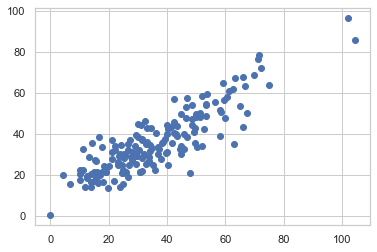

In [119]:
plt.scatter(y.values,predictions)

In [120]:
from sklearn.metrics import r2_score

In [121]:
r2_score(y.values, predictions)

0.7593049375270678

In [122]:
actual = pd.Series(y.values)
predicted = pd.Series(predictions.reshape(173))

In [123]:
result = pd.concat([actual,predicted],axis=1)

In [124]:
result.columns=['actual','predicted']

In [125]:
result

,actual,predicted
0,36.300353,40.251469
1,63.129522,35.081871
2,34.998177,33.141621
3,17.735168,33.233757
4,23.407582,28.960020
...,...,...
168,45.763668,32.598366
169,40.173380,24.869574
170,50.427991,33.642231
171,19.632272,13.439250


In [126]:
result.to_csv('NN_results.csv')

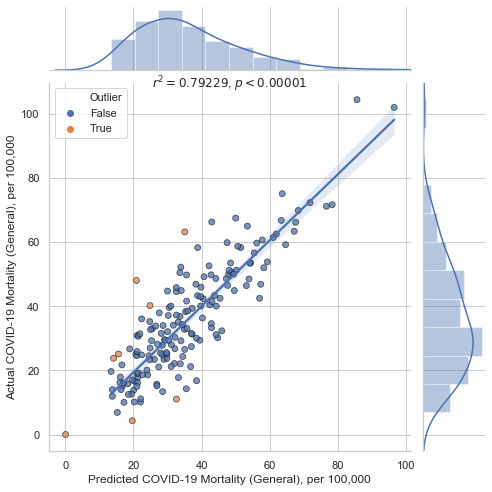

LinregressResult(slope=1.0280954346837714, intercept=-1.2002630454711607, rvalue=0.8901083935156139, pvalue=1.649397819360219e-57, stderr=0.041230855738654044)

In [127]:
corrfit(result, X="predicted", Y="actual",
        xlabel="Predicted COVID-19 Mortality (General), per 100,000",
        ylabel="Actual COVID-19 Mortality (General), per 100,000", log=(False,False), size="population", save = 'RegularizedNN1(5pca_Sigmoid0_reglu0.025_100K).jpg')

In [128]:
loss = pd.DataFrame(model.history.history)

In [169]:
loss.to_csv('NN_loss.csv')

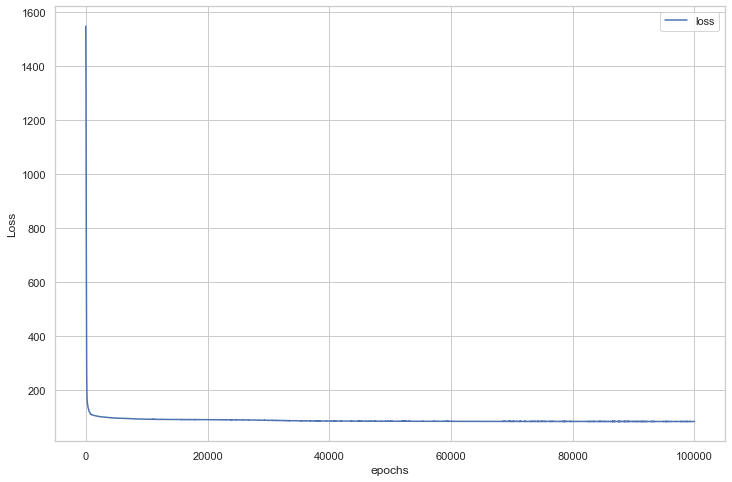

In [129]:
loss.plot(figsize=(12,8))
plt.ylabel('Loss')
plt.xlabel('epochs')
plt.savefig('RegularizedNN1(General)_5pca_reglu0.025_loss_100K.jpg')

In [147]:
def z_score(X):
    return (X - X.mean())/X.std()

In [148]:
dfz = pd.DataFrame()
mean = {}
std={}
for i in components:
    dfz[i]=z_score(df[i])
    mean[i] = df[i].mean()
    std[i] = df[i].std()

In [149]:
test = pd.DataFrame([mean])
xtest = test.to_numpy()

In [150]:
model = load_model('d_general_5pca_reglu0025_epochs100K.h5')

In [151]:
pred = model.predict(xtest).reshape(1)[0]
pred

35.774464

In [152]:
x_inc = xtest.copy()
x_inc

array([[-8.20249456e-15, -5.25334432e-15, -1.02615411e-14,
        -1.61399474e-16, -4.56603284e-15]])

In [153]:
def cal_range(pca):
    y={}
    centeroid = xtest.copy()
    for x in range(len(centeroid[0])):
        store=[]
        for i in np.arange(-1.0, 1.05, 0.05):
            centeroid = xtest.copy()
            centeroid[0][x] = centeroid[0][x]+std[pca[x]]*round(i,2)
            prediction = model.predict(centeroid).reshape(1)[0]
            store.append(prediction)
        y[pca[x]]= store
    return y

In [154]:
y = cal_range(components)

In [155]:
result = pd.DataFrame()

In [156]:
for i in range(5):
    result[components[i]] = y[components[i]]

In [157]:
final = (result-pred)/pred

In [158]:
ticks=[]
for i in np.arange(-1.0, 1.05, 0.05):
    ticks.append(round(i,2))

In [159]:
final['index'] = ticks

In [160]:
final = final.set_index('index')

In [161]:
final.to_csv('pca_change_d_general_5pca_reglu0025_epochs100K.csv')

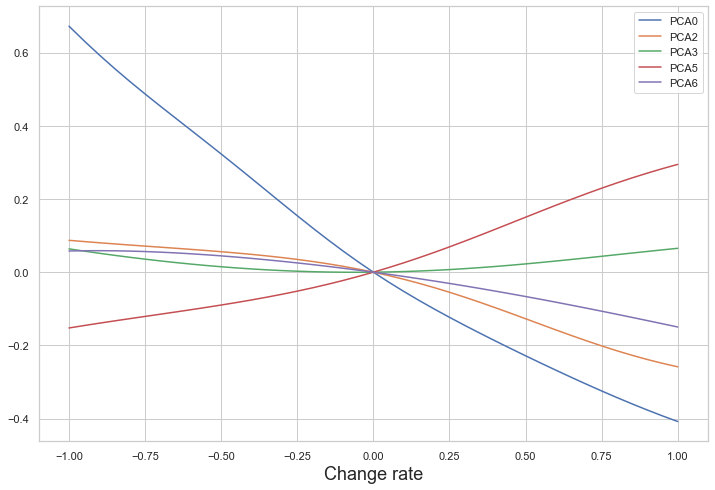

In [162]:
ax = final.plot(figsize=(12,8))
plt.xlabel('Change rate', fontsize=18)
plt.savefig('change_rate_d_general_5pca_reglu0025_epochs100K.png')